# Electoral Bonds Analysis

### Importing the libraries:

In [1]:
# Importing the libraries 
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
# Wordcloud
from wordcloud import WordCloud
import seaborn as sns 
sns.set_theme(style="whitegrid")
sns.dark_palette((20, 60, 50), input="husl")
# import interactive libraries
import ipywidgets
# library to create sankey charts.
from pySankey.sankey import sankey 
# Library to ignore warning 
import warnings                     # enable this once the code is finalized.
warnings.filterwarnings("ignore")
# Os library is imported to work with files 
import os 

##### Setting the row and column count.

In [2]:
# Set display.max_rows to increase the row limit
pd.set_option('display.max_rows', 100)  # Change 100 to the desired row limit

# Set display.max_columns to increase the column limit
pd.set_option('display.max_columns', 50)  # Change 50 to the desired column limit

### Importing the data: 

- Here we are importing the data about the donors and recivers. 

In [3]:
# Importing donors data as a dataframe: 
donors_df = pd.read_csv("RawData/donor_data.csv")

In [4]:
# Importing political parties recived amt data
receiver_df = pd.read_csv("RawData/receiver_data.csv")

### The Bank codes details have been extracted from this website: 

> All the bank banches don't have the authority to issue electoral bonds only few branches of SBI bank can issue them and this table contains the details of that banks and based on the branch code we can connect to the reciver and donor data. 

- [Link](https://pib.gov.in/Pressreleaseshare.aspx?PRID=1566604)

In [5]:
# Importing bank details.
bankdata_df = pd.read_excel("RawData/bank_data.xlsx")

### Peeking into bank data

In [6]:
bankdata_df.head(2)

,Sl. No.,State,Name Of The Branch & Address,Branch Code No.,Branch City
0,1,Delhi,"New Delhi Main Branch,11, Parliament Street, N...",691,New Delhi
1,2,"Haryana, Punjab and Chandigarh","Chandigarh Main Branch,SCO 43-48, Banking Squa...",628,Chandigarh


In [7]:
bankdata_df.columns

Index(['Sl. No.', 'State', 'Name Of The Branch & Address', 'Branch Code No.',
       'Branch City'],
      dtype='object')

In [8]:
bankdata_df.shape

(29, 5)

In [9]:
bankdata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Sl. No.                       29 non-null     int64 
 1   State                         29 non-null     object
 2   Name Of The Branch & Address  29 non-null     object
 3   Branch Code No.               29 non-null     int64 
 4   Branch City                   29 non-null     object
dtypes: int64(2), object(3)
memory usage: 1.3+ KB


In [10]:
bankdata_df['Branch Code No.'].count()

print(f"There are total 29 banks who can issues electoral bonds.")

There are total 29 banks who can issues electoral bonds.


> There are only 29 Banks who can issue electoral bonds

> Address is of not important or we don't have any plans to use it in the analysis. 
>I am removing the column so that my dataframe is slick and my joins will be concise.

In [11]:
# Drop Adress column bankdata
bankdata_df.drop('Name Of The Branch & Address',axis=1,inplace=True)

In [12]:
bankdata_df['State'] = bankdata_df['State'].str.strip()
bankdata_df['Branch City'] = bankdata_df['Branch City'].str.strip()

In [13]:
bankdata_df.head(2)

,Sl. No.,State,Branch Code No.,Branch City
0,1,Delhi,691,New Delhi
1,2,"Haryana, Punjab and Chandigarh",628,Chandigarh


In [14]:
bankdata_df.columns

Index(['Sl. No.', 'State', 'Branch Code No.', 'Branch City'], dtype='object')

In [15]:
bankdata_df.drop(['Sl. No.'],axis=1,inplace=True)

In [16]:
bankdata_df.head()

,State,Branch Code No.,Branch City
0,Delhi,691,New Delhi
1,"Haryana, Punjab and Chandigarh",628,Chandigarh
2,HimachalPradesh,718,Shimla
3,Jammu andKashmir,2295,Srinagar
4,Uttarakhand,630,Dehradun


### Looking into donors data setting data types

In [17]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,PayTeller
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230


### Some of the names in the purchaser columns are spelled wrongly and same company has bought bonds under different names after due diligince some of the names are changed showed like below.   

|Old Purchaser Name                                             |Replaced Purchaser Name                            |
|---------------------------------------------------------------|---------------------------------------------------|
|'AASHMAN ENERGY PRIVATE LIMITED'                               |'AASHMAN ENERGY PRIVATE LIMITED'                   |
|'AASHMAN ENERGY PVT LTD'                                       |'AASHMAN ENERGY PRIVATE LIMITED'                   |
|'ACHINTYA SOLAR POWER PRIVATE LIMITED'                         |'ACHINTYA SOLAR POWER PRIVATE LIMITED'             |
|'ACHINTYA SOLAR POWER PVT LTD'                                 |'ACHINTYA SOLAR POWER PRIVATE LIMITED'             |
|'APCO INFRATECH PRIVATE LIMITED'                               |'APCO INFRATECH PRIVATE LIMITED'                   |
|'APCO INFRATECH PRIVATE LTD'                                   |'APCO INFRATECH PRIVATE LIMITED'                   |
|'APCO INFRATECH PVT LTD FORMERLY AP'                           |'APCO INFRATECH PRIVATE LIMITED'                   |
|'ASKUS LOGISTICS PRIV'                                         |'ASKUS LOGISTICS PRIVATE LIMITED'                  |
|'ASKUS LOGISTICS PRIVATE LIMITED'                              |'ASKUS LOGISTICS PRIVATE LIMITED'                  |
|'ASKUS LOGISTICS PVT LTD'                                      |'ASKUS LOGISTICS PRIVATE LIMITED'                  |
|'AUROBINDO PHARMA LIMITED'                                     |'AUROBINDO PHARMA LIMITED'                         |
|'AUROBINDO PHARMA LTD'                                         |'AUROBINDO PHARMA LIMITED'                         |
|'AVEES TRADING & FINANCE PVT LTD'                              |'AVEES TRADING AND FINANCE PVT LTD'                |
|'AVEES TRADING AND FINANCE PVT LTD'                            |'AVEES TRADING AND FINANCE PVT LTD'                |
|'AVEES TRADING FINANCE PVT LTD'                                |'AVEES TRADING AND FINANCE PVT LTD'                |
|'BALU IRON & STEEL COMPANY'                                    |'BALU IRON AND STEEL COMPANY'                      |
|'BALU IRON AND STEEL COMPANY'                                  |'BALU IRON AND STEEL COMPANY'                      |
|'BESSEGGEN INFOTECH LLP'                                       |'BESSEGGEN INFOTECH LLP'                           |
|'BESSEGGENINFOTECHLLP'                                         |'BESSEGGEN INFOTECH LLP'                           |
|'BHARTI AIRTEL LIMITED'                                        |'BHARTI AIRTEL LIMITED'                            |
|'BHARTI AIRTEL LIMITEDAIRTEL CURRE NT AC-GCO'                  |'BHARTI AIRTEL LIMITED'                            |
|'CASTAMET WORKS'                                               |'CASTAMET WORKS PRIVATE LIMITED'                   |
|'CASTAMET WORKS PRIVATE LIMITED'                               |'CASTAMET WORKS PRIVATE LIMITED'                   |
|'CHOWGLE AND COMPANY PVT LTD'                                  |'CHOWGULE AND COMPANY PVT LTD'                     |
|'CHOWGULE AND COMPANY PVT LTD'                                 |'CHOWGULE AND COMPANY PVT LTD'                     |
|'CIPLA LIMITED'                                                |'CIPLA LIMITED'                                    |
|'CIPLA LTD'                                                    |'CIPLA LIMITED'                                    |
|'COMFORT TRIMS PRIVATE LIMITED'                                |'COMFORT TRIMS PRIVATE LIMITED'                    |
|'COMFORT TRIMS PRIVATE LIMITED DIVIS'                          |'COMFORT TRIMS PRIVATE LIMITED'                    |
|'CROCHET TRADE AND INVESTMENT PVT L'                           |'CROCHET TRADE AND INVESTMENT PVT '                |
|'CROCHET TRADE AND INVESTMENT PVT LT'                          |'CROCHET TRADE AND INVESTMENT PVT '                |
|'D S ENGINEERING WORKS LLP'                                    |'D S ENGINEERING WORKSHOP LLP'                     |
|'D S ENGINEERING WORKSHOP LLP'                                 |'D S ENGINEERING WORKSHOP LLP'                     |
|'DASAMI LAB PRIVATE LIMITED (FORMERLY HEL IUS LAB PVT LTD)'    |'DASAMI LAB PRIVATE LTD'                           |
|'DASAMI LAB PRIVATE LTD'                                       |'DASAMI LAB PRIVATE LTD'                           |
|'DCM SHRIRAM LIMITED'                                          |'DCM SHRIRAM LIMITED'                              |
|'DCM SHRIRAM LTD'                                              |'DCM SHRIRAM LIMITED'                              |
|'DEMPO IND PVT LTD NAVHIND PAPERSAND PUB'                      |'DEMPO INDUSTRIES PVT LTD'                         |
|'DEMPO INDUSTRIES PVT LTD'                                     |'DEMPO INDUSTRIES PVT LTD'                         |
|'DERIVE TRADING AND RESORTS PRIVATE LIMIT'                     |'DERIVE TRADING AND RESORTS PRIVATE LIMITED'       |
|'DERIVE TRADING AND RESORTS PRIVATE LIMITED'                   |'DERIVE TRADING AND RESORTS PRIVATE LIMITED'       |
|'DIVYESH POWER PRIVATE LIMITED'                                |'DIVYESH POWER PRIVATE LIMITED'                    |
|'DIVYESH POWER PVT LTD'                                        |'DIVYESH POWER PRIVATE LIMITED'                    |
|'DR REDDYS LABORATORIES LIMITED'                               |'DR REDDYS LABORATORIES LIMITED'                   |
|'DR.REDDY'S LABORATORIES LTD'                                  |'DR REDDYS LABORATORIES LIMITED'                   |
|'ELENA RENEWABLE ENERGY PRIVATE LIMITED'                       |'ELENA RENEWABLE ENERGY PRIVATE LIMITED'           |
|'ELENA RENEWABLE ENERGY PVT LTD'                               |'ELENA RENEWABLE ENERGY PRIVATE LIMITED'           |
|'FUTURE GAMING AND HOTEL SERVICES PR'                          |'FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED' |
|'FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED'             |'FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED' |
|'FUTURE GAMING AND HOTEL SERVICES PVT LTD'                     |'FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED' |
|'GENUS POWER'                                                  |'GENUS POWER INFRASTRUCTURES LIMITED'              |
|'GENUS POWER INFRASTRUCTURES LIMITED'                          |'GENUS POWER INFRASTRUCTURES LIMITED'              |
|'GENUS POWER INFRASTRUCTURES LTD'                              |'GENUS POWER INFRASTRUCTURES LIMITED'              |
|'GOODLUCK INDIA LIMITED'                                       |'GOODLUCK INDIA LIMITED'                           |
|'GOODLUCK INDIA LTD'                                           |'GOODLUCK INDIA LIMITED'                           |
|'HINDYS LAB PRIVATE LTD'                                       |'HINDYS LAB PRIVATE LTD'                           |
|'HINDYS LAB PVT. LTD. (PREVIOUSLY HIND LI FE SCIENCES PVT LTD)'|'HINDYS LAB PRIVATE LTD'                           |
|'HONOUR LAB LIMITED'                                           |'HONOUR LAB LIMITED'                               |
|'HONOUR LAB LTD'                                               |'HONOUR LAB LIMITED'                               |
|'INORBIT MALLS INDIA PRIVATE LIMIT'                            |'INORBIT MALLS INDIA PRIVATE LIMITED'              |
|'INORBIT MALLS INDIA PRIVATE LIMITED'                          |'INORBIT MALLS INDIA PRIVATE LIMITED'              |
|'INTERGLOBE AIR TRANSPORT LIMITED'                             |'INTERGLOBE AIR TRANSPORT LIMITED'                 |
|'INTERGLOBE AVIATION LIMITED'                                  |'INTERGLOBE AIR TRANSPORT LIMITED'                 |
|'J K CEMENT LIMITED'                                           |'J K CEMENT LIMITED'                               |
|'J K CEMENT LTD.'                                              |'J K CEMENT LIMITED'                               |
|'J.K.CEMENT LTD.'                                              |'J K CEMENT LIMITED'                               |
|'JAI SUSPENSION SYSTEMS L L P'                                 |'JAI SUSPENSION SYSTEMS LLP'                       |
|'JAI SUSPENSION SYSTEMS LLP'                                   |'JAI SUSPENSION SYSTEMS LLP'                       |
|'LAXMI INDUSTRIAL BOTTLING PLAN'                               |'LAXMI INDUSTRIAL BOTTLING PLANT'                  |
|'LAXMI INDUSTRIAL BOTTLING PLANT'                              |'LAXMI INDUSTRIAL BOTTLING PLANT'                  |
|'MADHYA PRADESH WASTE MANAGEMENT PR'                           |'MADHYA PRADESH WASTE MANAGEMENT'                  |
|'MADHYA PRADESH WASTE MANAGEMENT PRI'                          |'MADHYA PRADESH WASTE MANAGEMENT'                  |
|'MEGHA ENGINEERING & INFRASTRUCTURES LIMITED'                  |'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED'    |
|'MEGHA ENGINEERING AND INFRASTRUCTURES LI MITED'               |'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED'    |
|'MEGHA ENGINEERING AND INFRASTRUCTURES LTD'                    |'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED'    |
|'MICRO LABS LIMITED'                                           |'MICRO LABS LIMITED'                               |
|'MICRO LABS LTD'                                               |'MICRO LABS LIMITED'                               |
|'MKK METAL SECTIONS P LTD'                                     |'MKK METAL SECTIONS PVT LTD'                       |
|'MKK METAL SECTIONS PVT LTD'                                   |'MKK METAL SECTIONS PVT LTD'                       |
|'MODERN ROAD MAKERS PVT LTD'                                   |'MODERN ROAD MAKERS PVT LTD'                       |
|'MODERN ROAD MAKERS PVT. LTD.'                                 |'MODERN ROAD MAKERS PVT LTD'                       |
|'MOHIT MINERALS LIMITED'                                       |'MOHIT MINERALS LIMITED'                           |
|'MOHIT MINERALS LTD'                                           |'MOHIT MINERALS LIMITED'                           |
|'MY HOME INFRASTRUCTURES PRIVATE LI'                           |'MY HOME INFRASTRUCTURES PVT LTD '                 |
|'MY HOME INFRASTRUCTURES PVT LTD MY'                           |'MY HOME INFRASTRUCTURES PVT LTD '                 |
|'MYTRAH ENERGY INDIA PRIVATE LIMITED'                          |'MYTRAH ENERGY INDIA PRIVATE LIMITED'              |
|'MYTRAH ENERGY(INDIA) PRIVATE LIMITED'                         |'MYTRAH ENERGY INDIA PRIVATE LIMITED'              |
|'NATCO PHARMA LIMITED'                                         |'NATCO PHARMA LIMITED'                             |
|'NATCO PHARMA LTD'                                             |'NATCO PHARMA LIMITED'                             |
|'NAVAYUGA ENGINEERING CO LTD'                                  |'NAVAYUGA ENGINEERING COMPANY LIMITED'             |
|'NAVAYUGA ENGINEERING COMPANY LIMITED'                         |'NAVAYUGA ENGINEERING COMPANY LIMITED'             |
|'NSL SEZ HYDERABAD PRIVATE LIMITED'                            |'NSL SEZ HYDERABAD PRIVATE LIMITED'                |
|'NSL SEZ(HYDERABAD) PRIVATE LIMITED'                           |'NSL SEZ HYDERABAD PRIVATE LIMITED'                |
|'NUVOCO VISTAS CORP. LTD'                                      |'NUVOCO VISTAS CORP LTD'                           |
|'NUVOCO VISTAS CORPORATION LTD'                                |'NUVOCO VISTAS CORP LTD'                           |
|'ORISSA METALIKS PVT LIMITED'                                  |'ORISSA METALIKS PRIVATE LIMITED'                  |
|'ORRISA METALIKS PVT LTD'                                      |'ORISSA METALIKS PRIVATE LIMITED'                  |
|'PALM SHELTER ESTATE DEVELOPMENT LL'                           |'PALM SHELTER ESTATE DEVELOPMENT LLP'              |
|'PALM SHELTER ESTATE DEVELOPMENT LLP'                          |'PALM SHELTER ESTATE DEVELOPMENT LLP'              |
|'PENGUIN TRADING & AGENCIES LIMITED'                           |'PENGUIN TRADING AND AGENCIES LIMITED'             |
|'PENGUIN TRADING AND AGENCIES LTD'                             |'PENGUIN TRADING AND AGENCIES LIMITED'             |
|'PHILIPS CARBON BLACK LTD'                                     |'PHILLIPS CARBON BLACK LIMITED'                    |
|'PHILLIPS CARBON BLACK LIMITED'                                |'PHILLIPS CARBON BLACK LIMITED'                    |
|'PLUTO FINANCE PRIVATE LTD'                                    |'PLUTO FINANCE PRIVATE LIMITED'                    |
|'PLUTO FINANCE PRIVATE LTD.'                                   |'PLUTO FINANCE PRIVATE LIMITED'                    |
|'PRARAMBH SECURITIES PVT LTDOWN A/C'                           |'PRARAMBH SECURITIES PVT LTD'                      |
|'PRARAMBH SECURITIES PVT LTDPROPRIET'                          |'PRARAMBH SECURITIES PVT LTD'                      |
|'PROCURE ADVISORY SERVICES PRIVATE L'                          |'PROCURE ADVISORY SERVICES PRIVATE LTD'            |
|'PROCURE ADVISORY SERVICES PRIVATE LTD'                        |'PROCURE ADVISORY SERVICES PRIVATE LTD'            |
|'R.S.BROTHERS RETAIL INDIA PRIVATE LIMITE D'                   |'R.S.BROTHERS RETAIL INDIA PRIVATE LIMITED'        |
|'R.S.BROTHERS RETIAL INDIA PVT LTD'                            |'R.S.BROTHERS RETAIL INDIA PRIVATE LIMITED'        |
|'RAMESH AGARWAL C S BOTTLING PL'                               |'RAMESH AGARWAL C S BOTTLING PLANT'                |
|'RAMESH AGARWAL C S BOTTLING PLANT'                            |'RAMESH AGARWAL C S BOTTLING PLANT'                |
|'RANISATI MERCANTILES PVT LTD'                                 |'RANISATI MERCANTILES PVT LTD'                     |
|'RANISATI MERCANTILES PVT. LTD.'                               |'RANISATI MERCANTILES PVT LTD'                     |
|'RIPLEY & CO STEVDORING & HANDLING PVT LT D'                   |'RIPLEY AND CO STEVEDORING AND HANDLING PVT LTD'   |
|'RIPLEY AND CO. STEVEDORING & HANDLING PVT LTD'                |'RIPLEY AND CO STEVEDORING AND HANDLING PVT LTD'   |
|'ROSHNI DEALMARK PRIVATE LIMITED'                              |'ROSHNI DEALMARK PRIVATE LIMITED'                  |
|'ROSHNI DEALMARK PRIVATE LTD'                                  |'ROSHNI DEALMARK PRIVATE LIMITED'                  |
|'S K TRADERS'                                                  |'S K TRADING CO.'                                  |
|'S K TRADING CO.'                                              |'S K TRADING CO.'                                  |
|'SELMAR LAB PRIVATE LIMITED'                                   |'SELMAR LAB PRIVATE LIMITED'                       |
|'SELMAR LAB PRIVATE LTD'                                       |'SELMAR LAB PRIVATE LIMITED'                       |
|'SENGUPTA AND SENGUPTA PRIVATE LIMIT'                          |'SENGUPTA AND SENGUPTA PRIVATE LIMIT'              |
|'SENGUPTA AND SENGUPTA PVT LTD'                                |'SENGUPTA AND SENGUPTA PRIVATE LIMIT'              |
|'SHREE CEMENT LIMITED'                                         |'SHREE CEMENT LIMITED'                             |
|'SHREE CEMENT LTD'                                             |'SHREE CEMENT LIMITED'                             |
|'SKEIRON RENEWABLE ENERGY AMIDYALA P'                          |'SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED'|
|'SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED'            |'SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED'|
|'SOM DISTILERIES PRIVATE LTD'                                  |'SOM DISTILLERIES PVT LTD'                         |
|'SOM DISTILLERIES BREWERIES LIMITED'                           |'SOM DISTILLERIES PVT LTD'                         |
|'SOM DISTILLERIES PVT LTD'                                     |'SOM DISTILLERIES PVT LTD'                         |
|'SPECO INFRASTRUCTURE'                                         |'SPECO INFRASTRUCTURES'                            |
|'SPECO INFRASTRUCTURES'                                        |'SPECO INFRASTRUCTURES'                            |
|'SRI SIDDHARTH INFRATECH & SERVICES(I) PVT LTD'                |'SRI SIDDHARTH INFRATECH AND SERVICES PVT LTD'     |
|'SRI SIDDHARTH INFRATECH AND SERVICES I P'                     |'SRI SIDDHARTH INFRATECH AND SERVICES PVT LTD'     |
|'SUN PHARMA LABORATORIES LIMTED'                               |'SUN PHARMA LABORATORIES LIMTED'                   |
|'SUN PHARMA LABORATORIES LTD'                                  |'SUN PHARMA LABORATORIES LIMTED'                   |
|'THRIVENI EARTH MOVERS PVT LTD'                                |'THRIVENI EARTH MOVERS PVT LTD'                    |
|'THRIVENI EARTHMOVERS PVT LTD'                                 |'THRIVENI EARTH MOVERS PVT LTD'                    |
|'TORRENT PHARMACEUTICALS LIMITED'                              |'TORRENT PHARMACEUTICALS LIMITED'                  |
|'TORRENT PHARMACEUTICALS LTD'                                  |'TORRENT PHARMACEUTICALS LIMITED'                  |
|'TORRENT POWER LIMITED'                                        |'TORRENT POWER LIMITED'                            |
|'TORRENT POWER LTD'                                            |'TORRENT POWER LIMITED'                            |
|'TRANSWAYS EXIM PRIVATE LIMITED'                               |'TRANSWAYS EXIM PRIVATE LIMITED'                   |
|'TRANSWAYS EXIM PRIVATE LTD'                                   |'TRANSWAYS EXIM PRIVATE LIMITED'                   |
|'TRANSWAYS EXIM PVT LTD'                                       |'TRANSWAYS EXIM PRIVATE LIMITED'                   |
|'TRIDENT LIMITED'                                              |'TRIDENT LIMITED'                                  |
|'TRIDENT LIMITED {FORMERLY ABHISHEK INDUS TRIES LIMITED}'      |'TRIDENT LIMITED'                                  |
|'ULTRA TECH CEMENT LIMITED'                                    |'ULTRA TECH CEMENT LIMITED'                        |
|'ULTRATECHCEMENTSLTD'                                          |'ULTRA TECH CEMENT LIMITED'                        |
|'UTKAL ALUMINA INTERNATIONAL LIMITED'                          |'UTKAL ALUMINA INTERNATIONAL LIMITED'              |
|'UTKAL ALUMINA INTERNATIONAL LTD'                              |'UTKAL ALUMINA INTERNATIONAL LIMITED'              |
|'VARAS INTERNATIONAL PRIVATE LIMITED'                          |'VARAS INTERNATIONAL PRIVATE LIMITED'              |
|'VARAS INTERNATIONAL PVT LTD'                                  |'VARAS INTERNATIONAL PRIVATE LIMITED'              |
|'VARDHMAN TEXTILES LIMITED'                                    |'VARDHMAN TEXTILES LIMITED'                        |
|'VARDHMAN TEXTILES LTD'                                        |'VARDHMAN TEXTILES LIMITED'                        |
|'VEDANTA LIMITED'                                              |'VEDANTA LIMITED'                                  |
|'VEDANTA LTD'                                                  |'VEDANTA LIMITED'                                  |
|'WARORA CHANDRAPUR BALLARPUR TOLLRO'                           |'WARORA CHANDRAPUR BALLARPUR TOLL ROAD'            |
|'WARORA CHANDRAPUR BALLARPUR TOLLROA'                          |'WARORA CHANDRAPUR BALLARPUR TOLL ROAD'            |
|'WELSPUN CORP LIMITED'                                         |'WELSPUN CORP LIMITED'                             |
|'WELSPUN CORP LTD'                                             |'WELSPUN CORP LIMITED'                             |
|'ZUVAN ENERGY PRIVATE LIMITED'                                 |'ZUVAN ENERGY PRIVATE LIMITED'                     |
|'ZUVAN ENERGY PVT LTD'                                         |'ZUVAN ENERGY PRIVATE LIMITED'                     |
|'GREENKO RAYALA WIND POWER PVT LTD'                            |'GREENKO RAYALA WIND POWER PRIVATE LIMITED'        |
|'GREENKO RAYALA WIND POWER PRIVATE LIMITE D'                   |'GREENKO RAYALA WIND POWER PRIVATE LIMITED'        |

In [18]:
# replacing the purchaser names 
donors_df['Purchaser'].replace('AASHMAN ENERGY PRIVATE LIMITED','AASHMAN ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('AASHMAN ENERGY PVT LTD','AASHMAN ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ACHINTYA SOLAR POWER PRIVATE LIMITED','ACHINTYA SOLAR POWER PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ACHINTYA SOLAR POWER PVT LTD','ACHINTYA SOLAR POWER PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('APCO INFRATECH PRIVATE LIMITED','APCO INFRATECH PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('APCO INFRATECH PRIVATE LTD','APCO INFRATECH PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('APCO INFRATECH PVT LTD FORMERLY AP','APCO INFRATECH PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ASKUS LOGISTICS PRIV','ASKUS LOGISTICS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ASKUS LOGISTICS PRIVATE LIMITED','ASKUS LOGISTICS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ASKUS LOGISTICS PVT LTD','ASKUS LOGISTICS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('AUROBINDO PHARMA LIMITED','AUROBINDO PHARMA LIMITED',inplace=True)
donors_df['Purchaser'].replace('AUROBINDO PHARMA LTD','AUROBINDO PHARMA LIMITED',inplace=True)
donors_df['Purchaser'].replace('AVEES TRADING & FINANCE PVT LTD','AVEES TRADING AND FINANCE PVT LTD',inplace=True)
donors_df['Purchaser'].replace('AVEES TRADING AND FINANCE PVT LTD','AVEES TRADING AND FINANCE PVT LTD',inplace=True)
donors_df['Purchaser'].replace('AVEES TRADING FINANCE PVT LTD','AVEES TRADING AND FINANCE PVT LTD',inplace=True)
donors_df['Purchaser'].replace('BALU IRON & STEEL COMPANY','BALU IRON AND STEEL COMPANY',inplace=True)
donors_df['Purchaser'].replace('BALU IRON AND STEEL COMPANY','BALU IRON AND STEEL COMPANY',inplace=True)
donors_df['Purchaser'].replace('BESSEGGEN INFOTECH LLP','BESSEGGEN INFOTECH LLP',inplace=True)
donors_df['Purchaser'].replace('BESSEGGENINFOTECHLLP','BESSEGGEN INFOTECH LLP',inplace=True)
donors_df['Purchaser'].replace('BHARTI AIRTEL LIMITED','BHARTI AIRTEL LIMITED',inplace=True)
donors_df['Purchaser'].replace('BHARTI AIRTEL LIMITEDAIRTEL CURRE NT AC-GCO','BHARTI AIRTEL LIMITED',inplace=True)
donors_df['Purchaser'].replace('CASTAMET WORKS','CASTAMET WORKS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('CASTAMET WORKS PRIVATE LIMITED','CASTAMET WORKS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('CHOWGLE AND COMPANY PVT LTD','CHOWGULE AND COMPANY PVT LTD',inplace=True)
donors_df['Purchaser'].replace('CHOWGULE AND COMPANY PVT LTD','CHOWGULE AND COMPANY PVT LTD',inplace=True)
donors_df['Purchaser'].replace('CIPLA LIMITED','CIPLA LIMITED',inplace=True)
donors_df['Purchaser'].replace('CIPLA LTD','CIPLA LIMITED',inplace=True)
donors_df['Purchaser'].replace('COMFORT TRIMS PRIVATE LIMITED','COMFORT TRIMS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('COMFORT TRIMS PRIVATE LIMITED DIVIS','COMFORT TRIMS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('CROCHET TRADE AND INVESTMENT PVT L','CROCHET TRADE AND INVESTMENT PVT ',inplace=True)
donors_df['Purchaser'].replace('CROCHET TRADE AND INVESTMENT PVT LT','CROCHET TRADE AND INVESTMENT PVT ',inplace=True)
donors_df['Purchaser'].replace('D S ENGINEERING WORKS LLP','D S ENGINEERING WORKSHOP LLP',inplace=True)
donors_df['Purchaser'].replace('D S ENGINEERING WORKSHOP LLP','D S ENGINEERING WORKSHOP LLP',inplace=True)
donors_df['Purchaser'].replace('DASAMI LAB PRIVATE LIMITED (FORMERLY HEL IUS LAB PVT LTD)','DASAMI LAB PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('DASAMI LAB PRIVATE LTD','DASAMI LAB PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('DCM SHRIRAM LIMITED','DCM SHRIRAM LIMITED',inplace=True)
donors_df['Purchaser'].replace('DCM SHRIRAM LTD','DCM SHRIRAM LIMITED',inplace=True)
donors_df['Purchaser'].replace('DEMPO IND PVT LTD NAVHIND PAPERSAND PUB','DEMPO INDUSTRIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('DEMPO INDUSTRIES PVT LTD','DEMPO INDUSTRIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('DERIVE TRADING AND RESORTS PRIVATE LIMIT','DERIVE TRADING AND RESORTS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('DERIVE TRADING AND RESORTS PRIVATE LIMITED','DERIVE TRADING AND RESORTS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('DIVYESH POWER PRIVATE LIMITED','DIVYESH POWER PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('DIVYESH POWER PVT LTD','DIVYESH POWER PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('DR REDDYS LABORATORIES LIMITED','DR REDDYS LABORATORIES LIMITED',inplace=True)
donors_df['Purchaser'].replace("DR.REDDY'S LABORATORIES LTD",'DR REDDYS LABORATORIES LIMITED',inplace=True)
donors_df['Purchaser'].replace('ELENA RENEWABLE ENERGY PRIVATE LIMITED','ELENA RENEWABLE ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ELENA RENEWABLE ENERGY PVT LTD','ELENA RENEWABLE ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('FUTURE GAMING AND HOTEL SERVICES PR','FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED','FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('FUTURE GAMING AND HOTEL SERVICES PVT LTD','FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('GENUS POWER','GENUS POWER INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('GENUS POWER INFRASTRUCTURES LIMITED','GENUS POWER INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('GENUS POWER INFRASTRUCTURES LTD','GENUS POWER INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('GOODLUCK INDIA LIMITED','GOODLUCK INDIA LIMITED',inplace=True)
donors_df['Purchaser'].replace('GOODLUCK INDIA LTD','GOODLUCK INDIA LIMITED',inplace=True)
donors_df['Purchaser'].replace('HINDYS LAB PRIVATE LTD','HINDYS LAB PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('HINDYS LAB PVT. LTD. (PREVIOUSLY HIND LI FE SCIENCES PVT LTD)','HINDYS LAB PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('HONOUR LAB LIMITED','HONOUR LAB LIMITED',inplace=True)
donors_df['Purchaser'].replace('HONOUR LAB LTD','HONOUR LAB LIMITED',inplace=True)
donors_df['Purchaser'].replace('INORBIT MALLS INDIA PRIVATE LIMIT','INORBIT MALLS INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('INORBIT MALLS INDIA PRIVATE LIMITED','INORBIT MALLS INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('INTERGLOBE AIR TRANSPORT LIMITED','INTERGLOBE AIR TRANSPORT LIMITED',inplace=True)
donors_df['Purchaser'].replace('INTERGLOBE AVIATION LIMITED','INTERGLOBE AIR TRANSPORT LIMITED',inplace=True)
donors_df['Purchaser'].replace('J K CEMENT LIMITED','J K CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('J K CEMENT LTD.','J K CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('J.K.CEMENT LTD.','J K CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('JAI SUSPENSION SYSTEMS L L P','JAI SUSPENSION SYSTEMS LLP',inplace=True)
donors_df['Purchaser'].replace('JAI SUSPENSION SYSTEMS LLP','JAI SUSPENSION SYSTEMS LLP',inplace=True)
donors_df['Purchaser'].replace('LAXMI INDUSTRIAL BOTTLING PLAN','LAXMI INDUSTRIAL BOTTLING PLANT',inplace=True)
donors_df['Purchaser'].replace('LAXMI INDUSTRIAL BOTTLING PLANT','LAXMI INDUSTRIAL BOTTLING PLANT',inplace=True)
donors_df['Purchaser'].replace('MADHYA PRADESH WASTE MANAGEMENT PR','MADHYA PRADESH WASTE MANAGEMENT',inplace=True)
donors_df['Purchaser'].replace('MADHYA PRADESH WASTE MANAGEMENT PRI','MADHYA PRADESH WASTE MANAGEMENT',inplace=True)
donors_df['Purchaser'].replace('MEGHA ENGINEERING & INFRASTRUCTURES LIMITED','MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('MEGHA ENGINEERING AND INFRASTRUCTURES LI MITED','MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('MEGHA ENGINEERING AND INFRASTRUCTURES LTD','MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',inplace=True)
donors_df['Purchaser'].replace('MICRO LABS LIMITED','MICRO LABS LIMITED',inplace=True)
donors_df['Purchaser'].replace('MICRO LABS LTD','MICRO LABS LIMITED',inplace=True)
donors_df['Purchaser'].replace('MKK METAL SECTIONS P LTD','MKK METAL SECTIONS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('MKK METAL SECTIONS PVT LTD','MKK METAL SECTIONS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('MODERN ROAD MAKERS PVT LTD','MODERN ROAD MAKERS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('MODERN ROAD MAKERS PVT. LTD.','MODERN ROAD MAKERS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('MOHIT MINERALS LIMITED','MOHIT MINERALS LIMITED',inplace=True)
donors_df['Purchaser'].replace('MOHIT MINERALS LTD','MOHIT MINERALS LIMITED',inplace=True)
donors_df['Purchaser'].replace('MY HOME INFRASTRUCTURES PRIVATE LI','MY HOME INFRASTRUCTURES PVT LTD ',inplace=True)
donors_df['Purchaser'].replace('MY HOME INFRASTRUCTURES PVT LTD MY','MY HOME INFRASTRUCTURES PVT LTD ',inplace=True)
donors_df['Purchaser'].replace('MYTRAH ENERGY INDIA PRIVATE LIMITED','MYTRAH ENERGY INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('MYTRAH ENERGY(INDIA) PRIVATE LIMITED','MYTRAH ENERGY INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('NATCO PHARMA LIMITED','NATCO PHARMA LIMITED',inplace=True)
donors_df['Purchaser'].replace('NATCO PHARMA LTD','NATCO PHARMA LIMITED',inplace=True)
donors_df['Purchaser'].replace('NAVAYUGA ENGINEERING CO LTD','NAVAYUGA ENGINEERING COMPANY LIMITED',inplace=True)
donors_df['Purchaser'].replace('NAVAYUGA ENGINEERING COMPANY LIMITED','NAVAYUGA ENGINEERING COMPANY LIMITED',inplace=True)
donors_df['Purchaser'].replace('NSL SEZ HYDERABAD PRIVATE LIMITED','NSL SEZ HYDERABAD PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('NSL SEZ(HYDERABAD) PRIVATE LIMITED','NSL SEZ HYDERABAD PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('NUVOCO VISTAS CORP. LTD','NUVOCO VISTAS CORP LTD',inplace=True)
donors_df['Purchaser'].replace('NUVOCO VISTAS CORPORATION LTD','NUVOCO VISTAS CORP LTD',inplace=True)
donors_df['Purchaser'].replace('ORISSA METALIKS PVT LIMITED','ORISSA METALIKS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ORRISA METALIKS PVT LTD','ORISSA METALIKS PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('PALM SHELTER ESTATE DEVELOPMENT LL','PALM SHELTER ESTATE DEVELOPMENT LLP',inplace=True)
donors_df['Purchaser'].replace('PALM SHELTER ESTATE DEVELOPMENT LLP','PALM SHELTER ESTATE DEVELOPMENT LLP',inplace=True)
donors_df['Purchaser'].replace('PENGUIN TRADING & AGENCIES LIMITED','PENGUIN TRADING AND AGENCIES LIMITED',inplace=True)
donors_df['Purchaser'].replace('PENGUIN TRADING AND AGENCIES LTD','PENGUIN TRADING AND AGENCIES LIMITED',inplace=True)
donors_df['Purchaser'].replace('PHILIPS CARBON BLACK LTD','PHILLIPS CARBON BLACK LIMITED',inplace=True)
donors_df['Purchaser'].replace('PHILLIPS CARBON BLACK LIMITED','PHILLIPS CARBON BLACK LIMITED',inplace=True)
donors_df['Purchaser'].replace('PLUTO FINANCE PRIVATE LTD','PLUTO FINANCE PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('PLUTO FINANCE PRIVATE LTD.','PLUTO FINANCE PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('PRARAMBH SECURITIES PVT LTDOWN A/C','PRARAMBH SECURITIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('PRARAMBH SECURITIES PVT LTDPROPRIET','PRARAMBH SECURITIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('PROCURE ADVISORY SERVICES PRIVATE L','PROCURE ADVISORY SERVICES PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('PROCURE ADVISORY SERVICES PRIVATE LTD','PROCURE ADVISORY SERVICES PRIVATE LTD',inplace=True)
donors_df['Purchaser'].replace('R.S.BROTHERS RETAIL INDIA PRIVATE LIMITE D','R.S.BROTHERS RETAIL INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('R.S.BROTHERS RETIAL INDIA PVT LTD','R.S.BROTHERS RETAIL INDIA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('RAMESH AGARWAL C S BOTTLING PL','RAMESH AGARWAL C S BOTTLING PLANT',inplace=True)
donors_df['Purchaser'].replace('RAMESH AGARWAL C S BOTTLING PLANT','RAMESH AGARWAL C S BOTTLING PLANT',inplace=True)
donors_df['Purchaser'].replace('RANISATI MERCANTILES PVT LTD','RANISATI MERCANTILES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('RANISATI MERCANTILES PVT. LTD.','RANISATI MERCANTILES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('RIPLEY & CO STEVDORING & HANDLING PVT LT D','RIPLEY AND CO STEVEDORING AND HANDLING PVT LTD',inplace=True)
donors_df['Purchaser'].replace('RIPLEY AND CO. STEVEDORING & HANDLING PVT LTD','RIPLEY AND CO STEVEDORING AND HANDLING PVT LTD',inplace=True)
donors_df['Purchaser'].replace('ROSHNI DEALMARK PRIVATE LIMITED','ROSHNI DEALMARK PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ROSHNI DEALMARK PRIVATE LTD','ROSHNI DEALMARK PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('S K TRADERS','S K TRADING CO.',inplace=True)
donors_df['Purchaser'].replace('S K TRADING CO.','S K TRADING CO.',inplace=True)
donors_df['Purchaser'].replace('SELMAR LAB PRIVATE LIMITED','SELMAR LAB PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('SELMAR LAB PRIVATE LTD','SELMAR LAB PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('SENGUPTA AND SENGUPTA PRIVATE LIMIT','SENGUPTA AND SENGUPTA PRIVATE LIMIT',inplace=True)
donors_df['Purchaser'].replace('SENGUPTA AND SENGUPTA PVT LTD','SENGUPTA AND SENGUPTA PRIVATE LIMIT',inplace=True)
donors_df['Purchaser'].replace('SHREE CEMENT LIMITED','SHREE CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('SHREE CEMENT LTD','SHREE CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('SKEIRON RENEWABLE ENERGY AMIDYALA P','SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED','SKEIRON RENEWABLE ENERGY AMIDYALA PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('SOM DISTILERIES PRIVATE LTD','SOM DISTILLERIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('SOM DISTILLERIES BREWERIES LIMITED','SOM DISTILLERIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('SOM DISTILLERIES PVT LTD','SOM DISTILLERIES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('SPECO INFRASTRUCTURE','SPECO INFRASTRUCTURES',inplace=True)
donors_df['Purchaser'].replace('SPECO INFRASTRUCTURES','SPECO INFRASTRUCTURES',inplace=True)
donors_df['Purchaser'].replace('SRI SIDDHARTH INFRATECH & SERVICES(I) PVT LTD','SRI SIDDHARTH INFRATECH AND SERVICES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('SRI SIDDHARTH INFRATECH AND SERVICES I P','SRI SIDDHARTH INFRATECH AND SERVICES PVT LTD',inplace=True)
donors_df['Purchaser'].replace('SUN PHARMA LABORATORIES LIMTED','SUN PHARMA LABORATORIES LIMTED',inplace=True)
donors_df['Purchaser'].replace('SUN PHARMA LABORATORIES LTD','SUN PHARMA LABORATORIES LIMTED',inplace=True)
donors_df['Purchaser'].replace('THRIVENI EARTH MOVERS PVT LTD','THRIVENI EARTH MOVERS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('THRIVENI EARTHMOVERS PVT LTD','THRIVENI EARTH MOVERS PVT LTD',inplace=True)
donors_df['Purchaser'].replace('TORRENT PHARMACEUTICALS LIMITED','TORRENT PHARMACEUTICALS LIMITED',inplace=True)
donors_df['Purchaser'].replace('TORRENT PHARMACEUTICALS LTD','TORRENT PHARMACEUTICALS LIMITED',inplace=True)
donors_df['Purchaser'].replace('TORRENT POWER LIMITED','TORRENT POWER LIMITED',inplace=True)
donors_df['Purchaser'].replace('TORRENT POWER LTD','TORRENT POWER LIMITED',inplace=True)
donors_df['Purchaser'].replace('TRANSWAYS EXIM PRIVATE LIMITED','TRANSWAYS EXIM PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('TRANSWAYS EXIM PRIVATE LTD','TRANSWAYS EXIM PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('TRANSWAYS EXIM PVT LTD','TRANSWAYS EXIM PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('TRIDENT LIMITED','TRIDENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('TRIDENT LIMITED {FORMERLY ABHISHEK INDUS TRIES LIMITED}','TRIDENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('ULTRA TECH CEMENT LIMITED','ULTRA TECH CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('ULTRATECHCEMENTSLTD','ULTRA TECH CEMENT LIMITED',inplace=True)
donors_df['Purchaser'].replace('UTKAL ALUMINA INTERNATIONAL LIMITED','UTKAL ALUMINA INTERNATIONAL LIMITED',inplace=True)
donors_df['Purchaser'].replace('UTKAL ALUMINA INTERNATIONAL LTD','UTKAL ALUMINA INTERNATIONAL LIMITED',inplace=True)
donors_df['Purchaser'].replace('VARAS INTERNATIONAL PRIVATE LIMITED','VARAS INTERNATIONAL PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('VARAS INTERNATIONAL PVT LTD','VARAS INTERNATIONAL PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('VARDHMAN TEXTILES LIMITED','VARDHMAN TEXTILES LIMITED',inplace=True)
donors_df['Purchaser'].replace('VARDHMAN TEXTILES LTD','VARDHMAN TEXTILES LIMITED',inplace=True)
donors_df['Purchaser'].replace('VEDANTA LIMITED','VEDANTA LIMITED',inplace=True)
donors_df['Purchaser'].replace('VEDANTA LTD','VEDANTA LIMITED',inplace=True)
donors_df['Purchaser'].replace('WARORA CHANDRAPUR BALLARPUR TOLLRO','WARORA CHANDRAPUR BALLARPUR TOLL ROAD',inplace=True)
donors_df['Purchaser'].replace('WARORA CHANDRAPUR BALLARPUR TOLLROA','WARORA CHANDRAPUR BALLARPUR TOLL ROAD',inplace=True)
donors_df['Purchaser'].replace('WELSPUN CORP LIMITED','WELSPUN CORP LIMITED',inplace=True)
donors_df['Purchaser'].replace('WELSPUN CORP LTD','WELSPUN CORP LIMITED',inplace=True)
donors_df['Purchaser'].replace('ZUVAN ENERGY PRIVATE LIMITED','ZUVAN ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('ZUVAN ENERGY PVT LTD','ZUVAN ENERGY PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('GREENKO RAYALA WIND POWER PRIVATE LIMITE D','GREENKO RAYALA WIND POWER PRIVATE LIMITED',inplace=True)
donors_df['Purchaser'].replace('GREENKO RAYALA WIND POWER PVT LTD','GREENKO RAYALA WIND POWER PRIVATE LIMITED',inplace=True)


In [19]:
donors_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'Denominations', 'IssueBranchCode',
       'PayTeller'],
      dtype='object')

In [20]:
donors_df.shape

(18871, 11)

> We have 18,871 Records in donors table

In [21]:
donors_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18871 entries, 0 to 18870
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   SNo              18871 non-null  int64 
 1   Urn              18871 non-null  object
 2   JournalDate      18871 non-null  object
 3   PurchaseDate     18871 non-null  object
 4   ExpiryDate       18871 non-null  object
 5   Purchaser        18871 non-null  object
 6   Prefix           18871 non-null  object
 7   BondNumber       18871 non-null  int64 
 8   Denominations    18871 non-null  int64 
 9   IssueBranchCode  18871 non-null  int64 
 10  PayTeller        18871 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 1.6+ MB


In [22]:
donors_df['ExpiryDate'] = pd.to_datetime(donors_df['ExpiryDate'])
donors_df['JournalDate'] = pd.to_datetime(donors_df['JournalDate'])
donors_df['PurchaseDate'] = pd.to_datetime(donors_df['PurchaseDate'])

In [23]:
donors_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18871 entries, 0 to 18870
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   SNo              18871 non-null  int64         
 1   Urn              18871 non-null  object        
 2   JournalDate      18871 non-null  datetime64[ns]
 3   PurchaseDate     18871 non-null  datetime64[ns]
 4   ExpiryDate       18871 non-null  datetime64[ns]
 5   Purchaser        18871 non-null  object        
 6   Prefix           18871 non-null  object        
 7   BondNumber       18871 non-null  int64         
 8   Denominations    18871 non-null  int64         
 9   IssueBranchCode  18871 non-null  int64         
 10  PayTeller        18871 non-null  int64         
dtypes: datetime64[ns](3), int64(5), object(3)
memory usage: 1.6+ MB


In [24]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,PayTeller
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230


In [25]:
# Striping purchaser column --> cleaning the columns
donors_df['Purchaser'] = donors_df['Purchaser'].str.strip()

In [26]:
# Rename the columns to decrease the confusion on the columns names
donors_df.rename(columns={'PayTeller':'IssueTeller'})

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,IssueTeller
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230
2,3,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11441,1000000,1,5899230
3,4,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,OL,1113,100000,1,5899230
4,5,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,OL,1118,100000,1,5899230
...,...,...,...,...,...,...,...,...,...,...,...
18866,18867,00001202401110000003729,2024-01-11,2024-01-11,2024-01-25,WESTWELL GASES PRIVATE LIMITED,OC,15695,10000000,1,5898161
18867,18868,00001202401110000003729,2024-01-11,2024-01-11,2024-01-25,WESTWELL GASES PRIVATE LIMITED,OC,15693,10000000,1,5898161
18868,18869,00001202401110000003729,2024-01-11,2024-01-11,2024-01-25,WESTWELL GASES PRIVATE LIMITED,OC,15697,10000000,1,5898161
18869,18870,00001202401110000003729,2024-01-11,2024-01-11,2024-01-25,WESTWELL GASES PRIVATE LIMITED,OC,17803,10000000,1,5898161


In [27]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,PayTeller
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230


In [28]:
donors_df = pd.merge(donors_df,
                     bankdata_df, 
                     left_on='IssueBranchCode',
                     right_on='Branch Code No.',
                     how='inner')

In [29]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,PayTeller,State,Branch Code No.,Branch City
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata


In [30]:
donors_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'Denominations', 'IssueBranchCode', 'PayTeller',
       'State', 'Branch Code No.', 'Branch City'],
      dtype='object')

### Creating a composite key: 

- We are a creating a composite key which is a combination of Prefix and BondNumber which acts as a primary and will be the common column in donor and reciver table.

> The `Prefix` column and `BondNumber` column combination acts as unique for a bond. These columns are common in both donors and recivers table. So we are creating this column in both the tables and we can join it or make connection for who paid for which party.

In [31]:
# Creating a commong Key to connect Donors and recivers data
donors_df['Unique_key'] = donors_df["Prefix"].astype(str) + donors_df["BondNumber"].astype(str)
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,PayTeller,State,Branch Code No.,Branch City,Unique_key
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11448
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11447


In [32]:
donors_df.rename(columns={'PayTeller':'IssueTeller'},inplace=True)

In [33]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,IssueTeller,State,Branch Code No.,Branch City,Unique_key
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11448
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11447


In [34]:
donors_df.shape

(18871, 15)

In [35]:
Total_amt_spent = donors_df['Denominations'].sum()

print(f"The total amount spent by donor to fund political parities is {Total_amt_spent}")

The total amount spent by donor to fund political parities is 121555132000


### Peeking into recivers data

In [36]:
receiver_df.head(2)

,Sno,DateEncashment,PartyName,AccountNum,Prefix,BondNumber,Denominations,PayBranchCode,PayTeller
0,1,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,775,10000000,800,2770121
1,2,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,3975,10000000,800,2770121


In [37]:
receiver_df.columns

Index(['Sno', 'DateEncashment', 'PartyName', 'AccountNum', 'Prefix',
       'BondNumber', 'Denominations', 'PayBranchCode', 'PayTeller'],
      dtype='object')

In [38]:
receiver_df.shape

(20421, 9)

> We have total 20,421 records in 

In [39]:
receiver_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20421 entries, 0 to 20420
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Sno             20421 non-null  int64 
 1   DateEncashment  20421 non-null  object
 2   PartyName       20421 non-null  object
 3   AccountNum      20421 non-null  object
 4   Prefix          20421 non-null  object
 5   BondNumber      20421 non-null  int64 
 6   Denominations   20421 non-null  int64 
 7   PayBranchCode   20421 non-null  int64 
 8   PayTeller       20421 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 1.4+ MB


In [40]:
# Changing the datatype to date time. 
receiver_df['DateEncashment'] = pd.to_datetime(receiver_df['DateEncashment'])

In [41]:
# creating a new column for year of enchasment 
receiver_df['encashedyear'] = receiver_df['DateEncashment'].dt.year

In [42]:
# Joining with bank data
receiver_df = pd.merge(receiver_df,bankdata_df,left_on='PayBranchCode',right_on='Branch Code No.',how='inner')

In [43]:
receiver_df.shape

(20421, 13)

In [44]:
# Creating the unique key 
receiver_df['Unique_key'] = receiver_df['Prefix'].astype(str) + receiver_df['BondNumber'].astype(str)
receiver_df.head(2)

,Sno,DateEncashment,PartyName,AccountNum,Prefix,BondNumber,Denominations,PayBranchCode,PayTeller,encashedyear,State,Branch Code No.,Branch City,Unique_key
0,1,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,775,10000000,800,2770121,2019,Tamil Nadu and Puducherry,800,Chennai,OC775
1,2,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,3975,10000000,800,2770121,2019,Tamil Nadu and Puducherry,800,Chennai,OC3975


In [45]:
receiver_df['PartyName'] = receiver_df['PartyName'].str.strip()

In [46]:
Total_received_amt = receiver_df['Denominations'].sum()
print(f"The total amount recived by political parities is {Total_received_amt}")

The total amount recived by political parities is 127690893000


In [47]:
print(f"Total donated amount {Total_amt_spent}")
print(f"Total recived amount {Total_received_amt}")

print("""if we subtract the recived amount and the purchased amt the value is positive 
which means there are lot of excess funds recived from donors whose names are not 
disclosed or missing. \n""")

print(f"The total unacountable money recived by political parties is {Total_received_amt - Total_amt_spent}")

Total donated amount 121555132000
Total recived amount 127690893000
if we subtract the recived amount and the purchased amt the value is positive 
which means there are lot of excess funds recived from donors whose names are not 
disclosed or missing. 

The total unacountable money recived by political parties is 6135761000


# Merging Data

In [48]:
print(f"The number of records in donar Table is {donors_df['Unique_key'].count()}")
print(f"The number of records in reciver Table is {receiver_df['Unique_key'].count()}")

The number of records in donar Table is 18871
The number of records in reciver Table is 20421


> The row count is way larger than the donors and recivers data so that means there are records in reciver table without any corresponding donars and may be even donor without any corresponding political Party.

# Merging data to get insights:

In [49]:
# Merging the data with outer join.
alldata_df = pd.merge(donors_df, receiver_df, on='Unique_key', how='outer')
alldata_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix_x,BondNumber_x,Denominations_x,IssueBranchCode,IssueTeller,State_x,Branch Code No._x,Branch City_x,Unique_key,Sno,DateEncashment,PartyName,AccountNum,Prefix_y,BondNumber_y,Denominations_y,PayBranchCode,PayTeller,encashedyear,State_y,Branch Code No._y,Branch City_y
0,8985.0,00847202204080000002387,2022-04-08,2022-04-08,2022-04-22,KOYA AND COMPANY CONSTRUCTION LTD,OC,10000.0,10000000.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC10000,10376.0,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,OC,10000.0,10000000.0,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad
1,5806.0,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10001.0,10000000.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10001,7043.0,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,OC,10001.0,10000000.0,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad


In [50]:
alldata_df.isnull().sum()

SNo                  1680
Urn                  1680
JournalDate          1680
PurchaseDate         1680
ExpiryDate           1680
Purchaser            1680
Prefix_x             1680
BondNumber_x         1680
Denominations_x      1680
IssueBranchCode      1680
IssueTeller          1680
State_x              1680
Branch Code No._x    1680
Branch City_x        1680
Unique_key              0
Sno                   130
DateEncashment        130
PartyName             130
AccountNum            130
Prefix_y              130
BondNumber_y          130
Denominations_y       130
PayBranchCode         130
PayTeller             130
encashedyear          130
State_y               130
Branch Code No._y     130
Branch City_y         130
dtype: int64

In [51]:
alldata_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix_x', 'BondNumber_x', 'Denominations_x', 'IssueBranchCode',
       'IssueTeller', 'State_x', 'Branch Code No._x', 'Branch City_x',
       'Unique_key', 'Sno', 'DateEncashment', 'PartyName', 'AccountNum',
       'Prefix_y', 'BondNumber_y', 'Denominations_y', 'PayBranchCode',
       'PayTeller', 'encashedyear', 'State_y', 'Branch Code No._y',
       'Branch City_y'],
      dtype='object')

In [52]:
alldata_df['Denomination'] = alldata_df['Denominations_x'].fillna(alldata_df['Denominations_y'])

In [53]:
alldata_df.isnull().sum()

SNo                  1680
Urn                  1680
JournalDate          1680
PurchaseDate         1680
ExpiryDate           1680
Purchaser            1680
Prefix_x             1680
BondNumber_x         1680
Denominations_x      1680
IssueBranchCode      1680
IssueTeller          1680
State_x              1680
Branch Code No._x    1680
Branch City_x        1680
Unique_key              0
Sno                   130
DateEncashment        130
PartyName             130
AccountNum            130
Prefix_y              130
BondNumber_y          130
Denominations_y       130
PayBranchCode         130
PayTeller             130
encashedyear          130
State_y               130
Branch Code No._y     130
Branch City_y         130
Denomination            0
dtype: int64

> Out of these columns some of them are redundant. 

In [54]:
# Fill missing values in 'Prefix_x' with corresponding values from 'Prefix_y'
alldata_df['Prefix_x'].fillna(alldata_df['Prefix_y'], inplace=True)

# Fill missing values in 'BondNumber_x' with corresponding values from 'BondNumber_y'
alldata_df['BondNumber_x'].fillna(alldata_df['BondNumber_y'], inplace=True)

In [55]:
alldata_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix_x', 'BondNumber_x', 'Denominations_x', 'IssueBranchCode',
       'IssueTeller', 'State_x', 'Branch Code No._x', 'Branch City_x',
       'Unique_key', 'Sno', 'DateEncashment', 'PartyName', 'AccountNum',
       'Prefix_y', 'BondNumber_y', 'Denominations_y', 'PayBranchCode',
       'PayTeller', 'encashedyear', 'State_y', 'Branch Code No._y',
       'Branch City_y', 'Denomination'],
      dtype='object')

In [56]:
alldata_df.drop(['SNo','Sno','Prefix_y', 'BondNumber_y', 'Denominations_y','Denominations_x'],axis=1,inplace=True)

In [57]:
alldata_df.columns

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix_x', 'BondNumber_x', 'IssueBranchCode', 'IssueTeller', 'State_x',
       'Branch Code No._x', 'Branch City_x', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'State_y', 'Branch Code No._y', 'Branch City_y', 'Denomination'],
      dtype='object')

In [58]:
alldata_df.rename(columns={'Prefix_x':'Prefix', 
                           'BondNumber_x':'BondNumber', 
                           #'Denominations_x':'Denomination',
                           'State_x':'IssueState', 
                           'Branch Code No._x':'IssueBranchCodeNo', 
                           'Branch City_x':'IssueBranchCity',
                           'State_y':'EncashedState', 
                           'Branch Code No._y':'EncashedBranchCode',
                           'Branch City_y':'EncashedCity'}, 
                  inplace=True)

In [59]:
alldata_df.columns

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'IssueBranchCode', 'IssueTeller', 'IssueState',
       'IssueBranchCodeNo', 'IssueBranchCity', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'EncashedState', 'EncashedBranchCode', 'EncashedCity', 'Denomination'],
      dtype='object')

In [60]:
alldata_df.head(2)

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
0,00847202204080000002387,2022-04-08,2022-04-08,2022-04-22,KOYA AND COMPANY CONSTRUCTION LTD,OC,10000.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC10000,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0
1,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10001.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10001,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0


In [61]:
alldata_df.isnull().sum()

Urn                   1680
JournalDate           1680
PurchaseDate          1680
ExpiryDate            1680
Purchaser             1680
Prefix                   0
BondNumber               0
IssueBranchCode       1680
IssueTeller           1680
IssueState            1680
IssueBranchCodeNo     1680
IssueBranchCity       1680
Unique_key               0
DateEncashment         130
PartyName              130
AccountNum             130
PayBranchCode          130
PayTeller              130
encashedyear           130
EncashedState          130
EncashedBranchCode     130
EncashedCity           130
Denomination             0
dtype: int64

In [62]:
# Listing elements which don't have purchaser (Donor) and PartyName. 
allnulls_df = pd.DataFrame(alldata_df.isnull().sum())
allnulls_df.loc[['Purchaser','PartyName']].rename(columns={0:'Missing Rows Count'})

,Missing Rows Count
Purchaser,1680
PartyName,130


#### Conclusion 

**Looking into the above null count**
- $130$ of the Bonds are not redemeed by any party. 
- $1680$ of the redemeed bonds by the political parties don't have donors name.

In [63]:
alldata_df.shape

(20551, 23)

In [64]:
perfect_data = alldata_df.dropna(subset=['Purchaser','PartyName'])

In [65]:
perfect_data.head()

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
0,00847202204080000002387,2022-04-08,2022-04-08,2022-04-22,KOYA AND COMPANY CONSTRUCTION LTD,OC,10000.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC10000,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0
1,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10001.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10001,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0
2,00300202110070000001984,2021-10-07,2021-10-07,2021-10-21,CAPSTAN TRADING LLP,OC,10002.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10002,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0
3,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10003.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10003,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0
4,00300202110070000001984,2021-10-07,2021-10-07,2021-10-21,CAPSTAN TRADING LLP,OC,10004.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10004,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0


In [66]:
perfect_data.shape

(18741, 23)

In [67]:
# Count nulls in each column
perfect_data.isnull().sum()

Urn                   0
JournalDate           0
PurchaseDate          0
ExpiryDate            0
Purchaser             0
Prefix                0
BondNumber            0
IssueBranchCode       0
IssueTeller           0
IssueState            0
IssueBranchCodeNo     0
IssueBranchCity       0
Unique_key            0
DateEncashment        0
PartyName             0
AccountNum            0
PayBranchCode         0
PayTeller             0
encashedyear          0
EncashedState         0
EncashedBranchCode    0
EncashedCity          0
Denomination          0
dtype: int64

#### Note: 

- We have 2 dataframes one has all columns data with null values rows $\rightarrow$ alldata_df
- The other data frame has all columns data with no null colums $\rightarrow$ perfect_data

# Final Cleaned Data 

- Here you can see the final cleaned Tables and column names. for each table. 

In [68]:
donors_df.head(2)

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,IssueTeller,State,Branch Code No.,Branch City,Unique_key
0,1,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11448,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11448
1,2,00001201904120000001166,2019-04-12,2019-04-12,2019-04-26,A B C INDIA LIMITED,TL,11447,1000000,1,5899230,West Bengal and Andaman& Nicobar,1,Kolkata,TL11447


In [69]:
donors_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'Denominations', 'IssueBranchCode',
       'IssueTeller', 'State', 'Branch Code No.', 'Branch City', 'Unique_key'],
      dtype='object')

In [70]:
donors_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18871 entries, 0 to 18870
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   SNo              18871 non-null  int64         
 1   Urn              18871 non-null  object        
 2   JournalDate      18871 non-null  datetime64[ns]
 3   PurchaseDate     18871 non-null  datetime64[ns]
 4   ExpiryDate       18871 non-null  datetime64[ns]
 5   Purchaser        18871 non-null  object        
 6   Prefix           18871 non-null  object        
 7   BondNumber       18871 non-null  int64         
 8   Denominations    18871 non-null  int64         
 9   IssueBranchCode  18871 non-null  int64         
 10  IssueTeller      18871 non-null  int64         
 11  State            18871 non-null  object        
 12  Branch Code No.  18871 non-null  int64         
 13  Branch City      18871 non-null  object        
 14  Unique_key       18871 non-null  objec

In [71]:
# Creating a purchase year column in donors dataframe 
donors_df['PurchaserYear'] = donors_df['PurchaseDate'].dt.year

In [72]:
receiver_df.head(2)

,Sno,DateEncashment,PartyName,AccountNum,Prefix,BondNumber,Denominations,PayBranchCode,PayTeller,encashedyear,State,Branch Code No.,Branch City,Unique_key
0,1,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,775,10000000,800,2770121,2019,Tamil Nadu and Puducherry,800,Chennai,OC775
1,2,2019-04-12,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,*******5199,OC,3975,10000000,800,2770121,2019,Tamil Nadu and Puducherry,800,Chennai,OC3975


In [73]:
receiver_df.columns

Index(['Sno', 'DateEncashment', 'PartyName', 'AccountNum', 'Prefix',
       'BondNumber', 'Denominations', 'PayBranchCode', 'PayTeller',
       'encashedyear', 'State', 'Branch Code No.', 'Branch City',
       'Unique_key'],
      dtype='object')

In [74]:
receiver_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20421 entries, 0 to 20420
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Sno              20421 non-null  int64         
 1   DateEncashment   20421 non-null  datetime64[ns]
 2   PartyName        20421 non-null  object        
 3   AccountNum       20421 non-null  object        
 4   Prefix           20421 non-null  object        
 5   BondNumber       20421 non-null  int64         
 6   Denominations    20421 non-null  int64         
 7   PayBranchCode    20421 non-null  int64         
 8   PayTeller        20421 non-null  int64         
 9   encashedyear     20421 non-null  int32         
 10  State            20421 non-null  object        
 11  Branch Code No.  20421 non-null  int64         
 12  Branch City      20421 non-null  object        
 13  Unique_key       20421 non-null  object        
dtypes: datetime64[ns](1), int32(1), int64(

In [75]:
bankdata_df.head(2)

,State,Branch Code No.,Branch City
0,Delhi,691,New Delhi
1,"Haryana, Punjab and Chandigarh",628,Chandigarh


In [76]:
bankdata_df.columns

Index(['State', 'Branch Code No.', 'Branch City'], dtype='object')

In [77]:
bankdata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   State            29 non-null     object
 1   Branch Code No.  29 non-null     int64 
 2   Branch City      29 non-null     object
dtypes: int64(1), object(2)
memory usage: 828.0+ bytes


In [78]:
perfect_data.head(2)

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
0,00847202204080000002387,2022-04-08,2022-04-08,2022-04-22,KOYA AND COMPANY CONSTRUCTION LTD,OC,10000.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC10000,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0
1,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10001.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10001,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0


In [79]:
perfect_data.columns

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'IssueBranchCode', 'IssueTeller', 'IssueState',
       'IssueBranchCodeNo', 'IssueBranchCity', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'EncashedState', 'EncashedBranchCode', 'EncashedCity', 'Denomination'],
      dtype='object')

In [80]:
perfect_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18741 entries, 0 to 20550
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Urn                 18741 non-null  object        
 1   JournalDate         18741 non-null  datetime64[ns]
 2   PurchaseDate        18741 non-null  datetime64[ns]
 3   ExpiryDate          18741 non-null  datetime64[ns]
 4   Purchaser           18741 non-null  object        
 5   Prefix              18741 non-null  object        
 6   BondNumber          18741 non-null  float64       
 7   IssueBranchCode     18741 non-null  float64       
 8   IssueTeller         18741 non-null  float64       
 9   IssueState          18741 non-null  object        
 10  IssueBranchCodeNo   18741 non-null  float64       
 11  IssueBranchCity     18741 non-null  object        
 12  Unique_key          18741 non-null  object        
 13  DateEncashment      18741 non-null  datetime64[ns]


In [81]:
alldata_df.head(2)

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
0,00847202204080000002387,2022-04-08,2022-04-08,2022-04-22,KOYA AND COMPANY CONSTRUCTION LTD,OC,10000.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC10000,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0
1,00300202110070000001967,2021-10-07,2021-10-07,2021-10-21,K RAHEJA CORP PVT LTD,OC,10001.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10001,2021-10-08,BHARAT RASHTRA SAMITHI,*******7477,847.0,6417329.0,2021.0,Telangana,847.0,Hyderabad,10000000.0


In [82]:
alldata_df.columns

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'IssueBranchCode', 'IssueTeller', 'IssueState',
       'IssueBranchCodeNo', 'IssueBranchCity', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'EncashedState', 'EncashedBranchCode', 'EncashedCity', 'Denomination'],
      dtype='object')

In [83]:
alldata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20551 entries, 0 to 20550
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Urn                 18871 non-null  object        
 1   JournalDate         18871 non-null  datetime64[ns]
 2   PurchaseDate        18871 non-null  datetime64[ns]
 3   ExpiryDate          18871 non-null  datetime64[ns]
 4   Purchaser           18871 non-null  object        
 5   Prefix              20551 non-null  object        
 6   BondNumber          20551 non-null  float64       
 7   IssueBranchCode     18871 non-null  float64       
 8   IssueTeller         18871 non-null  float64       
 9   IssueState          18871 non-null  object        
 10  IssueBranchCodeNo   18871 non-null  float64       
 11  IssueBranchCity     18871 non-null  object        
 12  Unique_key          20551 non-null  object        
 13  DateEncashment      20421 non-null  datetime64

##### Amount of money got donated but not claimed by political parties 

In [84]:
PM_fund = alldata_df.loc[alldata_df['PartyName'].isnull(), 'Denomination'].sum()

print(f"This is the amount that has bean transfered to PM fund {PM_fund}")

This is the amount that has bean transfered to PM fund 96349000.0


##### Number of bonds donated but not claimed by political parties 

In [85]:
PM_fund_bonds = alldata_df.loc[alldata_df['PartyName'].isnull(), 'Denomination'].count()

print(f"This is the number of bonds that has bean transfered to PM fund {PM_fund_bonds}")

This is the number of bonds that has bean transfered to PM fund 130


##### What is the average value of the bond that has no political party associated

In [86]:
PM_fund/PM_fund_bonds

741146.1538461539

##### Amount of money claimed by political parties without donors. 

In [87]:
black_amount = alldata_df.loc[alldata_df['Purchaser'].isnull(), 'Denomination'].sum()

print(f"This is the amount that has no donor names which can be considered as black money an that amount is {black_amount}")

This is the amount that has no donor names which can be considered as black money an that amount is 6232110000.0


##### Number of bonds claimed by political parties without donors.

In [88]:
black_bonds = alldata_df.loc[alldata_df['Purchaser'].isnull(), 'Denomination'].count()

print(f"This is the number of bonds that has no donor names which can be considered as black bonds an that  count is {black_bonds}")

This is the number of bonds that has no donor names which can be considered as black bonds an that  count is 1680


##### What is the average value of the bond which has no donor associated with

In [89]:
black_amount/black_bonds

3709589.285714286

##### How many bonds don't have Purchaser and PartyNames

In [90]:
# Listing elements which don't have purchaser (Donor) and PartyName. 
allnulls_df = pd.DataFrame(alldata_df.isnull().sum())
allnulls_df.loc[['Purchaser','PartyName']].rename(columns={0:'Missing Rows Count'})

,Missing Rows Count
Purchaser,1680
PartyName,130


#### Conclusion 

**Looking into the above null count**
- $130$ of the Bonds are not redemeed by any party. 
- $1680$ of the redemeed bonds by the political parties don't have donors name.

#### Analysis of Nulls (Purchaser and PartyName)

#### Here is a diagram trying to show different dataframes we have created. 

![dataframe diagram](img/dataframe.png)

> Note: In the above diagram boxes that are filled has data and empty means NULLS

In [91]:
unredeemed_bonds_df = alldata_df[alldata_df['PartyName'].isnull()]
unredeemed_bonds_df.head(2)

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
459,00800202210060000002513,2022-10-06,2022-10-06,2022-10-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10441.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10441,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000000.0
623,00800202210060000002513,2022-10-06,2022-10-06,2022-10-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10605.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10605,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000000.0


In [92]:
unredeemed_bonds_analysis_df = unredeemed_bonds_df.groupby('Purchaser').agg(
    **{
        'Denomination_min': ('Denomination', 'min'),
        'Denomination_max': ('Denomination', 'max'),
        'Denomination_sum': ('Denomination', 'sum'),
        #'Denomination_count': ('Denomination', 'count'),
        'Denomination_avg': ('Denomination', 'mean'),
        'Bond_count': ('Purchaser', 'count')
    }
).reset_index()

unredeemed_bonds_analysis_df

,Purchaser,Denomination_min,Denomination_max,Denomination_sum,Denomination_avg,Bond_count
0,ADWITA FINVEST PRIVATE LIMITED,1000.0,1000.0,1000.0,1.000000e+03,1
1,ANAND AGRAWAL,1000.0,10000.0,25000.0,3.571429e+03,7
2,ANKUR SINGHAL S O SH ANIL SIN,1000.0,1000.0,1000.0,1.000000e+03,1
3,BRINDABAN NASKAR,100000.0,100000.0,500000.0,1.000000e+05,5
4,C MACKERTICH PVT LTD,1000000.0,1000000.0,4000000.0,1.000000e+06,4
5,CHENNAMANAGATHIHALLI SOLAR POWER PROJECT,100000.0,100000.0,600000.0,1.000000e+05,6
6,DAMINI NATH,1000.0,1000.0,1000.0,1.000000e+03,1
7,DIPAN P SHAH,100000.0,100000.0,300000.0,1.000000e+05,3
8,ECL FINANCE LTD,1000000.0,1000000.0,20000000.0,1.000000e+06,20
9,EDELWEISS RURAL CORPORATE SERVICE,1000000.0,1000000.0,10000000.0,1.000000e+06,10


In [93]:
unaccounted_bonds_df = alldata_df[alldata_df['Purchaser'].isnull()]
unaccounted_bonds_df.head(2)

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
139,NaN,NaT,NaT,NaT,NaN,OC,1014.0,NaN,NaN,NaN,NaN,NaN,OC1014,2019-04-16,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,10000000.0
150,NaN,NaT,NaT,NaT,NaN,OC,1015.0,NaN,NaN,NaN,NaN,NaN,OC1015,2019-04-16,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3476510.0,2019.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0


In [94]:
unaccounted_bonds_df.shape

(1680, 23)

In [95]:
unaccounted_bonds_df.columns

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'IssueBranchCode', 'IssueTeller', 'IssueState',
       'IssueBranchCodeNo', 'IssueBranchCity', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'EncashedState', 'EncashedBranchCode', 'EncashedCity', 'Denomination'],
      dtype='object')

In [96]:
unaccounted_bonds_df.isnull().sum()

Urn                   1680
JournalDate           1680
PurchaseDate          1680
ExpiryDate            1680
Purchaser             1680
Prefix                   0
BondNumber               0
IssueBranchCode       1680
IssueTeller           1680
IssueState            1680
IssueBranchCodeNo     1680
IssueBranchCity       1680
Unique_key               0
DateEncashment           0
PartyName                0
AccountNum               0
PayBranchCode            0
PayTeller                0
encashedyear             0
EncashedState            0
EncashedBranchCode       0
EncashedCity             0
Denomination             0
dtype: int64

In [97]:
unaccounted_bonds_analysis_df = unaccounted_bonds_df.groupby('PartyName').agg(
    **{
        'Denomination_min': ('Denomination', 'min'),
        'Denomination_max': ('Denomination', 'max'),
        'Denomination_sum': ('Denomination', 'sum'),
        'Denomination_avg': ('Denomination', 'mean'),
        'Bond_count': ('PartyName', 'count')
    }
).reset_index()
unaccounted_bonds_analysis_df

,PartyName,Denomination_min,Denomination_max,Denomination_sum,Denomination_avg,Bond_count
0,AAM AADMI PARTY,1000000.0,1000000.0,2.000000e+06,1.000000e+06,2
1,ADYAKSHA SAMAJVADI PARTY,100000.0,1000000.0,8.400000e+06,2.800000e+05,30
2,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,100000.0,10000000.0,6.050000e+07,1.592105e+06,38
3,ALL INDIA TRINAMOOL CONGRESS,100000.0,10000000.0,1.701000e+08,4.725000e+06,36
4,BHARAT RASHTRA SAMITHI,100000.0,10000000.0,2.355000e+08,7.136364e+06,33
5,BHARATIYA JANATA PARTY,100000.0,10000000.0,4.663100e+09,4.072576e+06,1145
6,BIHAR PRADESH JANTA DAL(UNITED),10000000.0,10000000.0,2.000000e+07,1.000000e+07,2
7,DRAVIDA MUNNETRA KAZHAGAM (DMK),10000000.0,10000000.0,7.000000e+07,1.000000e+07,7
8,JANATA DAL ( SECULAR ),1000000.0,1000000.0,2.500000e+07,1.000000e+06,25
9,JHARKHAND MUKTI MORCHA,1000000.0,1000000.0,1.000000e+07,1.000000e+06,10


In [98]:
donors_df.describe()

,SNo,JournalDate,PurchaseDate,ExpiryDate,BondNumber,Denominations,IssueBranchCode,IssueTeller,Branch Code No.,PurchaserYear
count,18871.000000,18871,18871,18871,18871.000000,1.887100e+04,18871.000000,1.887100e+04,18871.000000,18871.000000
mean,9436.000000,2022-03-15 00:27:55.714058496,2022-03-15 00:28:27.763234304,2022-03-29 00:28:27.763234304,12181.003338,6.441372e+06,480.065550,5.895737e+06,480.065550,2021.743734
min,1.000000,2019-04-12 00:00:00,2019-04-12 00:00:00,2019-04-26 00:00:00,8.000000,1.000000e+03,1.000000,1.013030e+06,1.000000,2019.000000
25%,4718.500000,2021-04-09 00:00:00,2021-04-09 00:00:00,2021-04-23 00:00:00,8317.500000,1.000000e+06,1.000000,5.054982e+06,1.000000,2021.000000
50%,9436.000000,2022-07-06 00:00:00,2022-07-06 00:00:00,2022-07-20 00:00:00,12350.000000,1.000000e+07,509.000000,6.405134e+06,509.000000,2022.000000
75%,14153.500000,2023-07-10 00:00:00,2023-07-10 00:00:00,2023-07-24 00:00:00,14764.000000,1.000000e+07,813.000000,7.273126e+06,813.000000,2023.000000
max,18871.000000,2024-01-11 00:00:00,2024-01-11 00:00:00,2024-01-25 00:00:00,71548.000000,1.000000e+07,1355.000000,8.492239e+06,1355.000000,2024.000000
std,5447.732801,NaN,NaN,NaN,6573.754865,4.538947e+06,395.446834,1.825395e+06,395.446834,1.485145


In [99]:
# Start by grouping by 'Purchaser' and aggregating with named aggregation
donors_agg_df = donors_df.groupby('Purchaser').agg(
    Denominations_sum=('Denominations', 'sum'),
    Denominations_count=('Denominations', 'count'),
    Denominations_min=('Denominations', 'min'),
    Denominations_max=('Denominations', 'max'),
    Denominations_mean=('Denominations', 'mean')
).reset_index()

# Now sort the values by 'Denominations_sum' in descending order
donors_agg_df = donors_agg_df.sort_values(by='Denominations_sum', ascending=False).reset_index(drop=True)

# Display the resulting DataFrame
donors_agg_df

,Purchaser,Denominations_sum,Denominations_count,Denominations_min,Denominations_max,Denominations_mean
0,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,13680000000,1368,10000000,10000000,1.000000e+07
1,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,9660000000,966,10000000,10000000,1.000000e+07
2,QWIKSUPPLYCHAINPRIVATELIMITED,4100000000,410,10000000,10000000,1.000000e+07
3,VEDANTA LIMITED,4006500000,429,100000,10000000,9.339161e+06
4,HALDIA ENERGY LIMITED,3770000000,395,1000000,10000000,9.544304e+06
...,...,...,...,...,...,...
1223,KUNAL GUPTA,1000,1,1000,1000,1.000000e+03
1224,MR. SAMEER BHATIA,1000,1,1000,1000,1.000000e+03
1225,PUNIT DEVENDRABHAI BHANDERI,1000,1,1000,1000,1.000000e+03
1226,ADWITA FINVEST PRIVATE LIMITED,1000,1,1000,1000,1.000000e+03


In [100]:
donors_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'Denominations', 'IssueBranchCode',
       'IssueTeller', 'State', 'Branch Code No.', 'Branch City', 'Unique_key',
       'PurchaserYear'],
      dtype='object')

In [101]:
# Start by grouping by 'Purchaser' and aggregating with named aggregation
donors_agg_year_df = donors_df.groupby(['Purchaser','PurchaserYear']).agg(
    Denominations_sum=('Denominations', 'sum'),
    Denominations_count=('Denominations', 'count'),
    Denominations_min=('Denominations', 'min'),
    Denominations_max=('Denominations', 'max'),
    Denominations_mean=('Denominations', 'mean')
).reset_index()

# Now sort the values by 'Denominations_sum' in descending order
donors_agg_year_df = donors_agg_year_df.sort_values(by='Denominations_sum', ascending=False).reset_index(drop=True)

# Display the resulting DataFrame
donors_agg_year_df  

,Purchaser,PurchaserYear,Denominations_sum,Denominations_count,Denominations_min,Denominations_max,Denominations_mean
0,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,2022,5000000000,500,10000000,10000000,10000000.0
1,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,2023,4150000000,415,10000000,10000000,10000000.0
2,QWIKSUPPLYCHAINPRIVATELIMITED,2022,3600000000,360,10000000,10000000,10000000.0
3,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,2021,3340000000,334,10000000,10000000,10000000.0
4,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,2023,3210000000,321,10000000,10000000,10000000.0
...,...,...,...,...,...,...,...
1550,DAMINI NATH,2023,1000,1,1000,1000,1000.0
1551,MR. SAMEER BHATIA,2023,1000,1,1000,1000,1000.0
1552,ANKUR SINGHAL S O SH ANIL SIN,2023,1000,1,1000,1000,1000.0
1553,PUNIT DEVENDRABHAI BHANDERI,2023,1000,1,1000,1000,1000.0


In [102]:
receiver_df.describe()

,Sno,DateEncashment,BondNumber,Denominations,PayBranchCode,PayTeller,encashedyear,Branch Code No.
count,20421.000000,20421,20421.000000,2.042100e+04,20421.000000,2.042100e+04,20421.000000,20421.000000
mean,10211.000000,2021-12-23 18:57:25.041868800,11783.435140,6.252921e+06,559.467852,5.293055e+06,2021.520102,559.467852
min,1.000000,2019-04-12 00:00:00,10.000000,1.000000e+03,1.000000,1.498450e+05,2019.000000,1.000000
25%,5106.000000,2020-11-02 00:00:00,7797.000000,1.000000e+06,691.000000,3.490777e+06,2020.000000,691.000000
50%,10211.000000,2022-04-11 00:00:00,11913.000000,1.000000e+07,691.000000,5.614473e+06,2022.000000,691.000000
75%,15316.000000,2023-07-13 00:00:00,14585.000000,1.000000e+07,691.000000,7.516991e+06,2023.000000,691.000000
max,20421.000000,2024-01-24 00:00:00,71548.000000,1.000000e+07,2295.000000,8.212066e+06,2024.000000,2295.000000
std,5895.179259,NaN,6525.685559,4.576321e+06,297.836567,1.953104e+06,1.606107,297.836567


In [103]:
# Group by 'PartyName' and use named aggregation for 'Denominations'
receiver_agg_df = receiver_df.groupby('PartyName').agg(
    Denominations_sum=('Denominations', 'sum'),
    Denominations_count=('Denominations', 'count'),
    Denominations_min=('Denominations', 'min'),
    Denominations_max=('Denominations', 'max'),
    Denominations_mean=('Denominations', 'mean')
).reset_index()

# Sort the DataFrame by 'Denominations_sum' in descending order and reset the index without adding an 'index' column
receiver_agg_df = receiver_agg_df.sort_values(by='Denominations_sum', ascending=False).reset_index(drop=True)

# Display the resulting DataFrame
receiver_agg_df

,PartyName,Denominations_sum,Denominations_count,Denominations_min,Denominations_max,Denominations_mean
0,BHARATIYA JANATA PARTY,60605111000,8633,1000,10000000,7.020168e+06
1,ALL INDIA TRINAMOOL CONGRESS,16095314000,3305,1000,10000000,4.869989e+06
2,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",14218655000,3146,1000,10000000,4.519598e+06
3,BHARAT RASHTRA SAMITHI,12147099000,1806,1000,10000000,6.725968e+06
4,BIJU JANATA DAL,7755000000,861,1000000,10000000,9.006969e+06
5,DRAVIDA MUNNETRA KAZHAGAM (DMK),6390000000,648,1000000,10000000,9.861111e+06
6,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,3370000000,472,100000,10000000,7.139831e+06
7,TELUGU DESAM PARTY,2188800000,279,100000,10000000,7.845161e+06
8,SHIVSENA,1593814000,355,1000,10000000,4.489617e+06
9,RASHTRIYA JANTA DAL,735000000,150,100000,10000000,4.900000e+06


In [104]:
receiver_df.columns

Index(['Sno', 'DateEncashment', 'PartyName', 'AccountNum', 'Prefix',
       'BondNumber', 'Denominations', 'PayBranchCode', 'PayTeller',
       'encashedyear', 'State', 'Branch Code No.', 'Branch City',
       'Unique_key'],
      dtype='object')

In [105]:
# Group by 'PartyName' and use named aggregation for 'Denominations'
receiver_agg_year_df = receiver_df.groupby(['PartyName','encashedyear']).agg(
    Denominations_sum=('Denominations', 'sum'),
    Denominations_count=('Denominations', 'count'),
    Denominations_min=('Denominations', 'min'),
    Denominations_max=('Denominations', 'max'),
    Denominations_mean=('Denominations', 'mean')
).reset_index()

# Sort the DataFrame by 'Denominations_sum' in descending order and reset the index without adding an 'index' column
receiver_agg_year_df = receiver_agg_year_df.sort_values(by='Denominations_sum', ascending=False).reset_index(drop=True)

# Display the resulting DataFrame
receiver_agg_year_df

,PartyName,encashedyear,Denominations_sum,Denominations_count,Denominations_min,Denominations_max,Denominations_mean
0,BHARATIYA JANATA PARTY,2019,19717501000,3514,1000,10000000,5.611127e+06
1,BHARATIYA JANATA PARTY,2022,17635499000,2177,1000,10000000,8.100826e+06
2,BHARATIYA JANATA PARTY,2023,16763261000,2111,1000,10000000,7.940910e+06
3,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2023,7933700000,1181,10000,10000000,6.717782e+06
4,ALL INDIA TRINAMOOL CONGRESS,2023,5624738000,1133,1000,10000000,4.964464e+06
5,BHARAT RASHTRA SAMITHI,2022,5289870000,660,10000,10000000,8.014955e+06
6,BHARAT RASHTRA SAMITHI,2023,4955700000,921,100000,10000000,5.380782e+06
7,ALL INDIA TRINAMOOL CONGRESS,2022,4688000000,638,100000,10000000,7.347962e+06
8,BHARATIYA JANATA PARTY,2021,3729950000,512,10000,10000000,7.285059e+06
9,ALL INDIA TRINAMOOL CONGRESS,2021,3309430000,913,10000,10000000,3.624786e+06


In [106]:
bankdata_df.describe()

,Branch Code No.
count,29.000000
mean,786.862069
std,1151.535209
min,1.000000
25%,167.000000
50%,628.000000
75%,847.000000
max,6091.000000


In [107]:
alldata_df.describe()

,JournalDate,PurchaseDate,ExpiryDate,BondNumber,IssueBranchCode,IssueTeller,IssueBranchCodeNo,DateEncashment,PayBranchCode,PayTeller,encashedyear,EncashedBranchCode,Denomination
count,18871,18871,18871,20551.000000,18871.000000,1.887100e+04,18871.000000,20421,20421.000000,2.042100e+04,20421.000000,20421.000000,2.055100e+04
mean,2022-03-15 00:27:55.714058496,2022-03-15 00:28:27.763234816,2022-03-29 00:28:27.763234560,11804.060046,480.065550,5.895737e+06,480.065550,2021-12-23 18:57:25.041868800,559.467852,5.293055e+06,2021.520102,559.467852,6.218055e+06
min,2019-04-12 00:00:00,2019-04-12 00:00:00,2019-04-26 00:00:00,8.000000,1.000000,1.013030e+06,1.000000,2019-04-12 00:00:00,1.000000,1.498450e+05,2019.000000,1.000000,1.000000e+03
25%,2021-04-09 00:00:00,2021-04-09 00:00:00,2021-04-23 00:00:00,7801.500000,1.000000,5.054982e+06,1.000000,2020-11-02 00:00:00,691.000000,3.490777e+06,2020.000000,691.000000,1.000000e+06
50%,2022-07-06 00:00:00,2022-07-06 00:00:00,2022-07-20 00:00:00,11916.000000,509.000000,6.405134e+06,509.000000,2022-04-11 00:00:00,691.000000,5.614473e+06,2022.000000,691.000000,1.000000e+07
75%,2023-07-10 00:00:00,2023-07-10 00:00:00,2023-07-24 00:00:00,14584.500000,813.000000,7.273126e+06,813.000000,2023-07-13 00:00:00,691.000000,7.516991e+06,2023.000000,691.000000,1.000000e+07
max,2024-01-11 00:00:00,2024-01-11 00:00:00,2024-01-25 00:00:00,71548.000000,1355.000000,8.492239e+06,1355.000000,2024-01-24 00:00:00,2295.000000,8.212066e+06,2024.000000,2295.000000,1.000000e+07
std,NaN,NaN,NaN,6594.161087,395.446834,1.825395e+06,395.446834,NaN,297.836567,1.953104e+06,1.606107,297.836567,4.584256e+06


In [108]:
perfect_data.describe()

,JournalDate,PurchaseDate,ExpiryDate,BondNumber,IssueBranchCode,IssueTeller,IssueBranchCodeNo,DateEncashment,PayBranchCode,PayTeller,encashedyear,EncashedBranchCode,Denomination
count,18741,18741,18741,18741.000000,18741.000000,1.874100e+04,18741.000000,18741,18741.000000,1.874100e+04,18741.000000,18741.000000,1.874100e+04
mean,2022-03-16 07:26:02.285897216,2022-03-16 07:26:34.557387264,2022-03-30 07:26:34.557387264,12161.144283,480.130356,5.903193e+06,480.130356,2022-03-21 21:42:09.278053376,550.911424,5.439590e+06,2021.746011,550.911424,6.480913e+06
min,2019-04-12 00:00:00,2019-04-12 00:00:00,2019-04-26 00:00:00,10.000000,1.000000,1.013030e+06,1.000000,2019-04-16 00:00:00,1.000000,1.498450e+05,2019.000000,1.000000,1.000000e+03
25%,2021-07-02 00:00:00,2021-07-02 00:00:00,2021-07-16 00:00:00,8313.000000,1.000000,5.054982e+06,1.000000,2021-07-09 00:00:00,300.000000,3.490777e+06,2021.000000,300.000000,1.000000e+06
50%,2022-07-06 00:00:00,2022-07-06 00:00:00,2022-07-20 00:00:00,12347.000000,509.000000,6.405134e+06,509.000000,2022-07-11 00:00:00,691.000000,5.882354e+06,2022.000000,691.000000,1.000000e+07
75%,2023-07-10 00:00:00,2023-07-10 00:00:00,2023-07-24 00:00:00,14764.000000,813.000000,7.273126e+06,813.000000,2023-07-13 00:00:00,691.000000,7.516991e+06,2023.000000,691.000000,1.000000e+07
max,2024-01-11 00:00:00,2024-01-11 00:00:00,2024-01-25 00:00:00,71548.000000,1355.000000,8.492239e+06,1355.000000,2024-01-24 00:00:00,2295.000000,8.212066e+06,2024.000000,2295.000000,1.000000e+07
std,NaN,NaN,NaN,6499.960698,394.905865,1.820633e+06,394.905865,NaN,305.779107,1.951774e+06,1.480017,305.779107,4.527959e+06


In [109]:
# Group by 'PartyName' and use named aggregation for 'Denominations'
prefect_data_agg_df = perfect_data.groupby('PartyName').agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count'),
    Denominations_min=('Denomination', 'min'),
    Denominations_max=('Denomination', 'max'),
    Denominations_mean=('Denomination', 'mean')
).reset_index()

# Sort the DataFrame by 'Denominations_sum' in descending order and reset the index without adding an 'index' column
prefect_data_agg_df = prefect_data_agg_df.sort_values(by='Denominations_sum', ascending=False).reset_index(drop=True)

# Display the resulting DataFrame
prefect_data_agg_df

,PartyName,Denominations_sum,Denominations_count,Denominations_min,Denominations_max,Denominations_mean
0,BHARATIYA JANATA PARTY,5.594201e+10,7488,1000.0,10000000.0,7.470888e+06
1,ALL INDIA TRINAMOOL CONGRESS,1.592521e+10,3269,1000.0,10000000.0,4.871586e+06
2,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",1.351094e+10,2908,1000.0,10000000.0,4.646130e+06
3,BHARAT RASHTRA SAMITHI,1.191160e+10,1773,1000.0,10000000.0,6.718330e+06
4,BIJU JANATA DAL,7.755000e+09,861,1000000.0,10000000.0,9.006969e+06
5,DRAVIDA MUNNETRA KAZHAGAM (DMK),6.320000e+09,641,1000000.0,10000000.0,9.859594e+06
6,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,3.287500e+09,448,100000.0,10000000.0,7.338170e+06
7,TELUGU DESAM PARTY,2.115800e+09,260,100000.0,10000000.0,8.137692e+06
8,SHIVSENA,1.524514e+09,319,1000.0,10000000.0,4.779041e+06
9,RASHTRIYA JANTA DAL,7.250000e+08,140,100000.0,10000000.0,5.178571e+06


# All Data Anlaysis

In [110]:
All_denomination_count = alldata_df['Denomination'].value_counts()
All_denomination_count = All_denomination_count.reset_index()
All_denomination_count.rename(columns={'count':'All_count'},inplace=True)
All_denomination_count

,Denomination,All_count
0,10000000.0,12210
1,1000000.0,5429
2,100000.0,2559
3,10000.0,221
4,1000.0,132


In [111]:
donor_denomination_count = donors_df['Denominations'].value_counts()
donor_denomination_count = donor_denomination_count.reset_index()
donor_denomination_count.rename(columns={'count':'donor_count'},inplace=True)
donor_denomination_count

,Denominations,donor_count
0,10000000,11671
1,1000000,4620
2,100000,2228
3,10000,220
4,1000,132


In [112]:
receivers_denomination_count = receiver_df['Denominations'].value_counts()
receivers_denomination_count = receivers_denomination_count.reset_index()
receivers_denomination_count.rename(columns={'count':'receiver_count'},inplace=True)
receivers_denomination_count 

,Denominations,receiver_count
0,10000000,12207
1,1000000,5366
2,100000,2526
3,10000,219
4,1000,103


In [113]:
append_denominations_count = pd.concat([All_denomination_count,donor_denomination_count,receivers_denomination_count],axis=1)
append_denominations_count.drop(['Denominations'], axis = 1, inplace=True)
append_denominations_count["receiver_donor"] = append_denominations_count['receiver_count'] - append_denominations_count['donor_count'] 
append_denominations_count['All_donor'] = append_denominations_count['All_count'] - append_denominations_count['donor_count']
append_denominations_count['All_receiver'] = append_denominations_count['All_count'] - append_denominations_count['receiver_count'] 
append_denominations_count

,Denomination,All_count,donor_count,receiver_count,receiver_donor,All_donor,All_receiver
0,10000000.0,12210,11671,12207,536,539,3
1,1000000.0,5429,4620,5366,746,809,63
2,100000.0,2559,2228,2526,298,331,33
3,10000.0,221,220,219,-1,1,2
4,1000.0,132,132,103,-29,0,29


In [114]:
append_denominations_count = append_denominations_count[['Denomination','All_count','donor_count','receiver_count']]
append_denominations_count = append_denominations_count.set_index('Denomination')
append_denominations_count

,All_count,donor_count,receiver_count
Denomination,,,
10000000.0,12210,11671,12207
1000000.0,5429,4620,5366
100000.0,2559,2228,2526
10000.0,221,220,219
1000.0,132,132,103


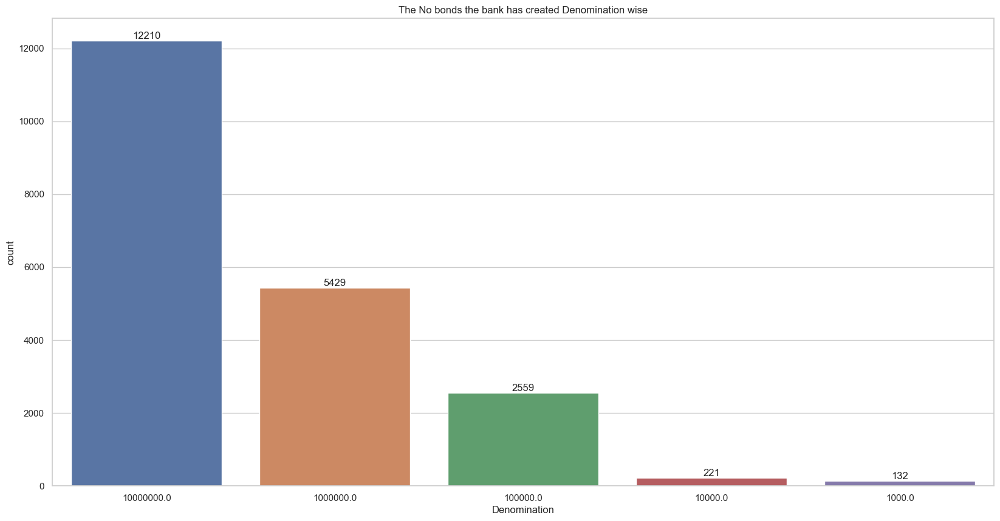

In [115]:
# Set the figure size
plt.figure(figsize=(20, 10))
# Calculate value counts of 'Denomination' and sort by descending order of counts
denomination_counts = alldata_df['Denomination'].value_counts().sort_values(ascending=False)
# Create the count plot with specified order and add count labels
ax = sns.countplot(data=alldata_df, x='Denomination', order=denomination_counts.index)
ax.bar_label(ax.containers[0])  # Add count labels to the bars
# title 
plt.title("The No bonds the bank has created Denomination wise")
# Show the plot
plt.show()

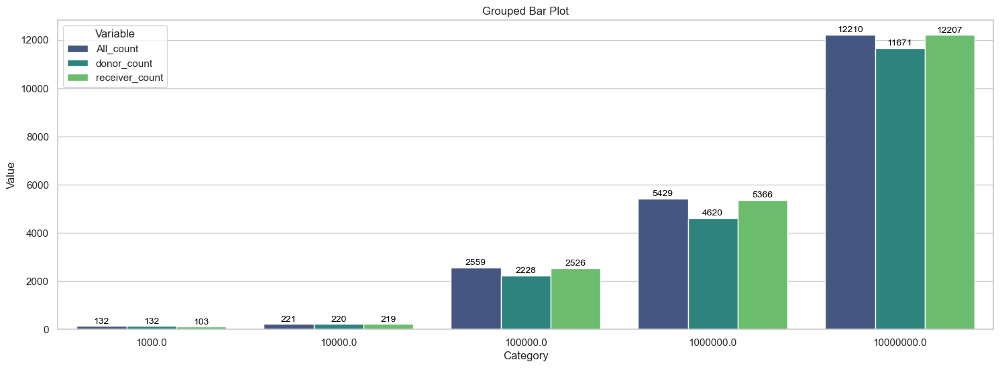

In [116]:
# Plotting
plt.figure(figsize=(18, 6))  # Set the figure size

# Melt the DataFrame to convert it to the long format
append_denominations_count_melted = append_denominations_count.reset_index().melt(id_vars='Denomination', 
                                                                                  var_name='Variable', 
                                                                                  value_name='Value')

# Create the grouped bar plot using Seaborn
ax = sns.barplot(x='Denomination', y='Value', hue='Variable', data=append_denominations_count_melted, palette='viridis')

# Adding numerical labels above each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Adding title and labels
plt.title('Grouped Bar Plot')
plt.xlabel('Category')
plt.ylabel('Value')

# Show plot
plt.show()

In [117]:
append_denominations_count = append_denominations_count.reset_index()
append_denominations_count

,Denomination,All_count,donor_count,receiver_count
0,10000000.0,12210,11671,12207
1,1000000.0,5429,4620,5366
2,100000.0,2559,2228,2526
3,10000.0,221,220,219
4,1000.0,132,132,103


In [118]:
append_denominations_count.columns

Index(['Denomination', 'All_count', 'donor_count', 'receiver_count'], dtype='object')

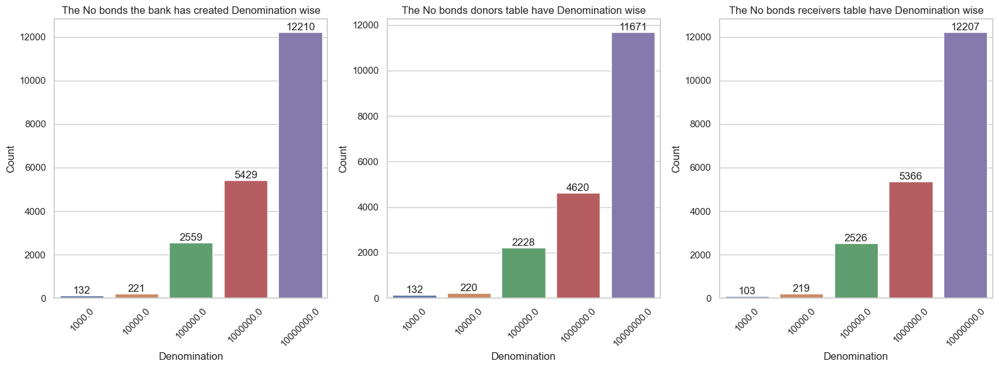

In [119]:
# Set the figure size (larger figure)
plt.figure(figsize=(16, 6))

# Plot the first count plot (leftmost)
plt.subplot(1, 3, 1)
sns.barplot(data=append_denominations_count, x='Denomination', y='All_count')
plt.title('First Plot')
plt.xlabel('Denomination')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.title("The No bonds the bank has created Denomination wise")
plt.gca().bar_label(plt.gca().containers[0])  # Add count labels to the bars

# Plot the second count plot (middle)
plt.subplot(1, 3, 2)
sns.barplot(data=append_denominations_count, x='Denomination', y='donor_count')
plt.title('Second Plot')
plt.xlabel('Denomination')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.title("The No bonds donors table have Denomination wise")
plt.gca().bar_label(plt.gca().containers[0])  # Add count labels to the bars

# Plot the third count plot (rightmost)
plt.subplot(1, 3, 3)
sns.barplot(data=append_denominations_count, x='Denomination', y='receiver_count')
plt.title('Third Plot')
plt.xlabel('Denomination')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.title("The No bonds receivers table have Denomination wise")
plt.gca().bar_label(plt.gca().containers[0])  # Add count labels to the bars

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

## Bond Prefix Count Distribution 

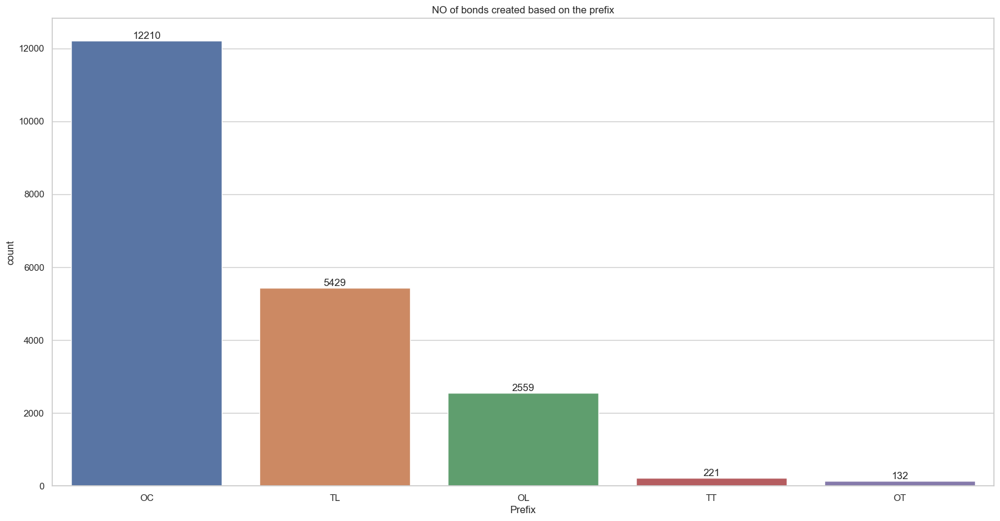

In [120]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot for 'Prefix'
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
# Calculate value counts of 'Prefix' and sort by descending order of counts
prefix_counts = alldata_df['Prefix'].value_counts().sort_values(ascending=False)
# Create the count plot using Seaborn with specified order
ax = sns.countplot(data=alldata_df, x='Prefix', order=prefix_counts.index)
# Add count labels to the bars
ax.bar_label(ax.containers[0])  # Assuming you want to label the first container
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=0)
plt.title("NO of bonds created based on the prefix")
# Show the plot
plt.show()

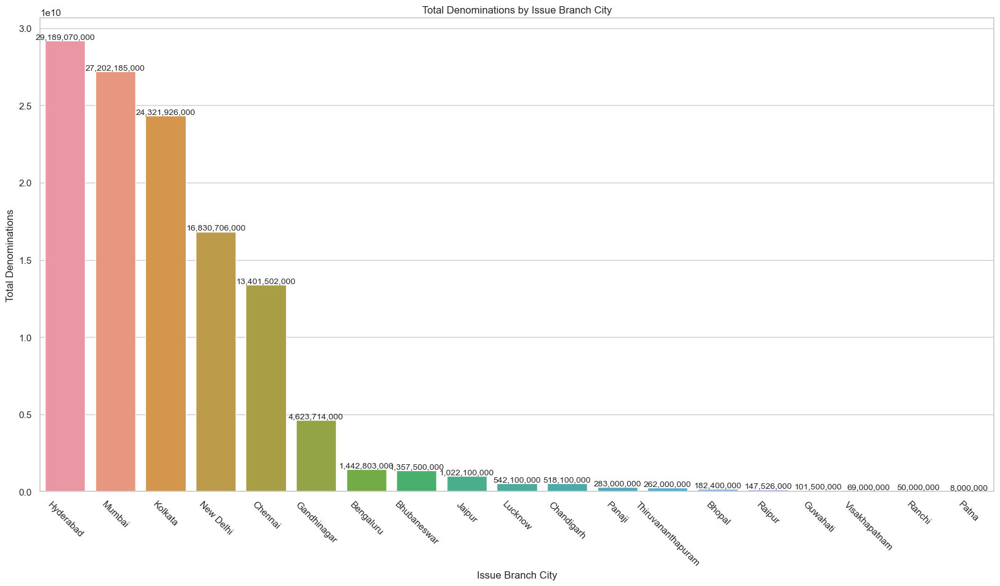

In [121]:
# Aggregate sum of 'Denomination' by 'IssueBranchCity'
city_sum_denominations = alldata_df.groupby('IssueBranchCity')['Denomination'].sum()

# Sort the aggregated sums in descending order
city_sum_denominations = city_sum_denominations.sort_values(ascending=False)

# Create a count plot based on the aggregated sums
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.barplot(x=city_sum_denominations.index, y=city_sum_denominations.values, order=city_sum_denominations.index)

# Add count labels (sums of denominations) to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():,.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=-45)
plt.xlabel('Issue Branch City')
plt.ylabel('Total Denominations')
plt.title('Total Denominations by Issue Branch City')
plt.show()

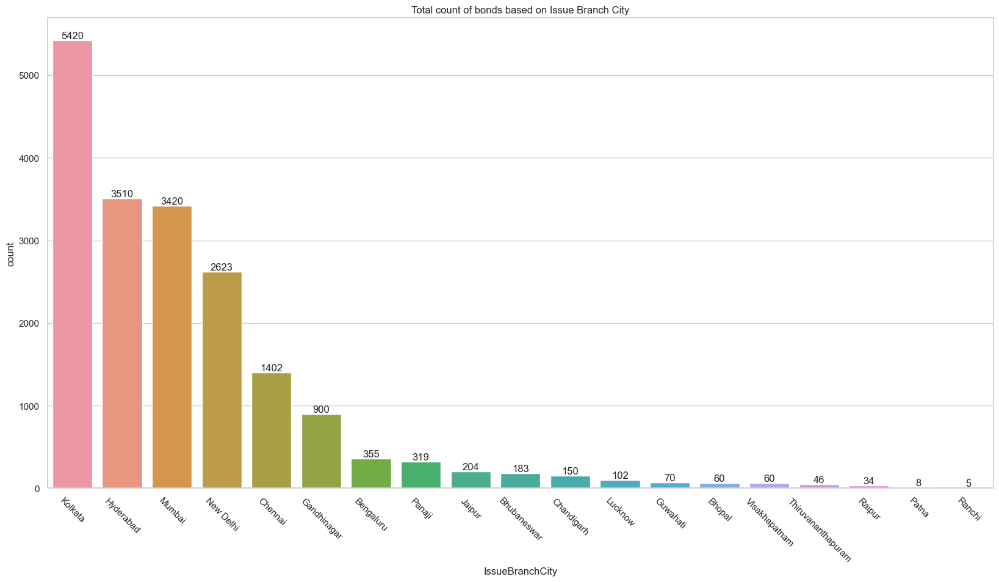

In [122]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
# Calculate value counts of 'IssueBranchCity' and sort by descending order of counts
city_counts = alldata_df['IssueBranchCity'].value_counts().sort_values(ascending=False)
# Create the count plot using Seaborn with specified order
ax = sns.countplot(data=alldata_df, x='IssueBranchCity', order=city_counts.index)
# Add count labels to the bars
ax.bar_label(ax.containers[0])  # Assuming you want to label the first container
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=-45)
plt.title('Total count of bonds based on Issue Branch City')
# Show the plot
plt.show()

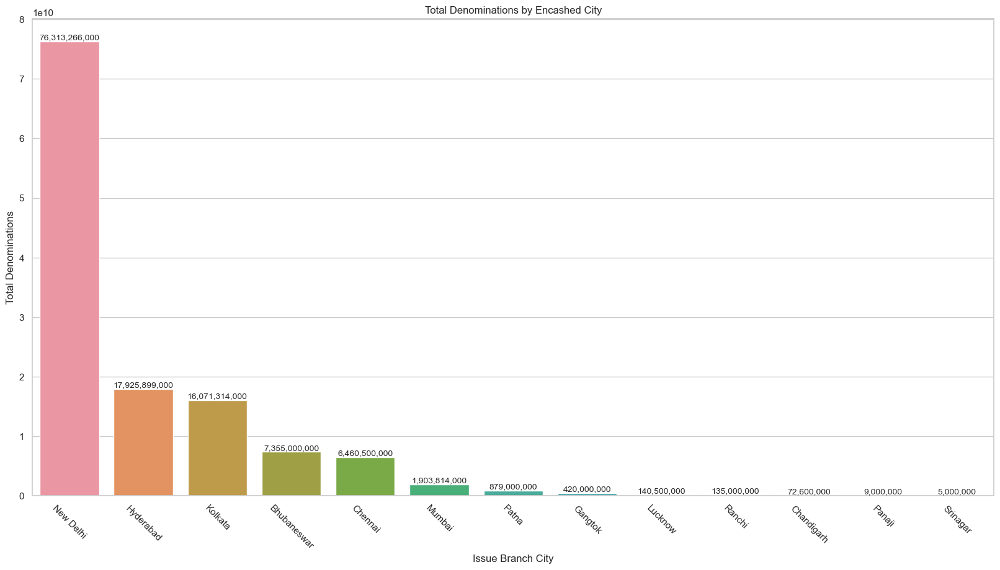

In [123]:
# Aggregate sum of 'Denomination' by 'IssueBranchCity'
city_sum_denominations = alldata_df.groupby('EncashedCity')['Denomination'].sum()

# Sort the aggregated sums in descending order
city_sum_denominations = city_sum_denominations.sort_values(ascending=False)

# Create a count plot based on the aggregated sums
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.barplot(x=city_sum_denominations.index, y=city_sum_denominations.values, order=city_sum_denominations.index)

# Add count labels (sums of denominations) to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():,.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10)

# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=-45)
plt.xlabel('Issue Branch City')
plt.ylabel('Total Denominations')
plt.title('Total Denominations by Encashed City')
plt.show()

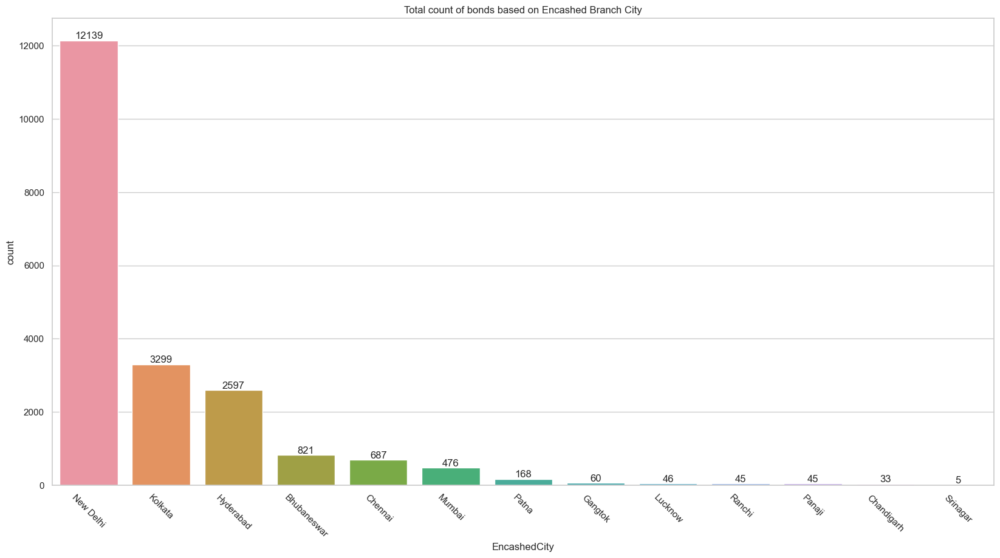

In [124]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
# Calculate value counts of 'IssueBranchCity' and sort by descending order of counts
city_counts = alldata_df['EncashedCity'].value_counts().sort_values(ascending=False)
# Create the count plot using Seaborn with specified order
ax = sns.countplot(data=alldata_df, x='EncashedCity', order=city_counts.index)
# Add count labels to the bars
ax.bar_label(ax.containers[0])  # Assuming you want to label the first container
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=-45)
plt.title('Total count of bonds based on Encashed Branch City')
# Show the plot
plt.show()

## Wordcloud 

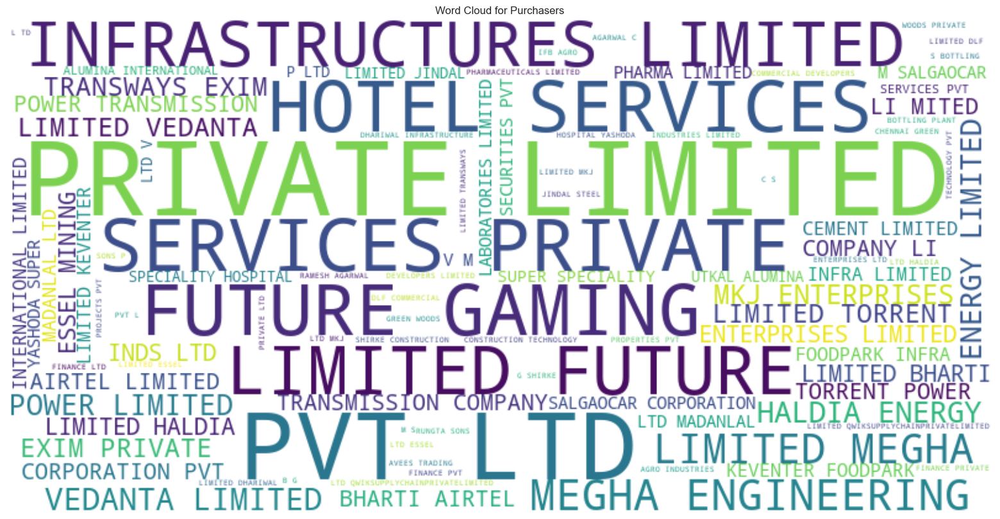

In [125]:
# Extract text data from the 'Purchaser' column and join into a single string
text_data = ' '.join(alldata_df['Purchaser'].dropna())  # Join non-null values
# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(text_data)

# Display the word cloud using matplotlib
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axis
plt.title('Word Cloud for Purchasers')
plt.show()

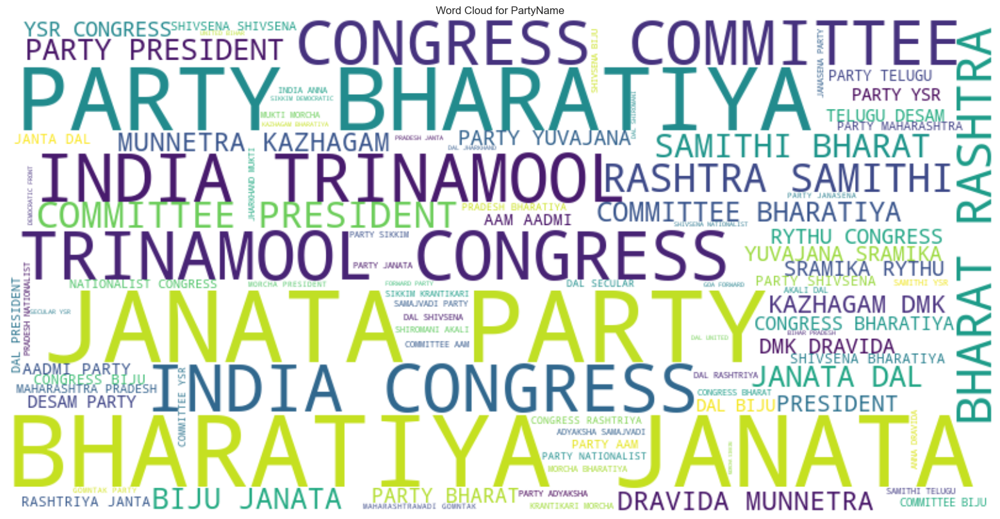

In [126]:
# Extract text data from the 'Purchaser' column and join into a single string
text_data = ' '.join(alldata_df['PartyName'].dropna())  # Join non-null values
# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(text_data)

# Display the word cloud using matplotlib
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axis
plt.title('Word Cloud for PartyName')
plt.show()


## Date Analysis

In [127]:
donor_dates = donors_df[['Unique_key','JournalDate','PurchaseDate','ExpiryDate']]
donor_dates.head()

,Unique_key,JournalDate,PurchaseDate,ExpiryDate
0,TL11448,2019-04-12,2019-04-12,2019-04-26
1,TL11447,2019-04-12,2019-04-12,2019-04-26
2,TL11441,2019-04-12,2019-04-12,2019-04-26
3,OL1113,2019-04-12,2019-04-12,2019-04-26
4,OL1118,2019-04-12,2019-04-12,2019-04-26


In [128]:
donor_dates['Journal_Purchase'] =  donor_dates['PurchaseDate'] - donor_dates['JournalDate']
donor_dates['Purchase-Expiry'] = donor_dates['ExpiryDate'] - donor_dates['PurchaseDate']
donor_dates['Journal-Expiry'] = donor_dates['ExpiryDate'] - donor_dates['JournalDate'] 

In [129]:
donor_dates.columns

Index(['Unique_key', 'JournalDate', 'PurchaseDate', 'ExpiryDate',
       'Journal_Purchase', 'Purchase-Expiry', 'Journal-Expiry'],
      dtype='object')

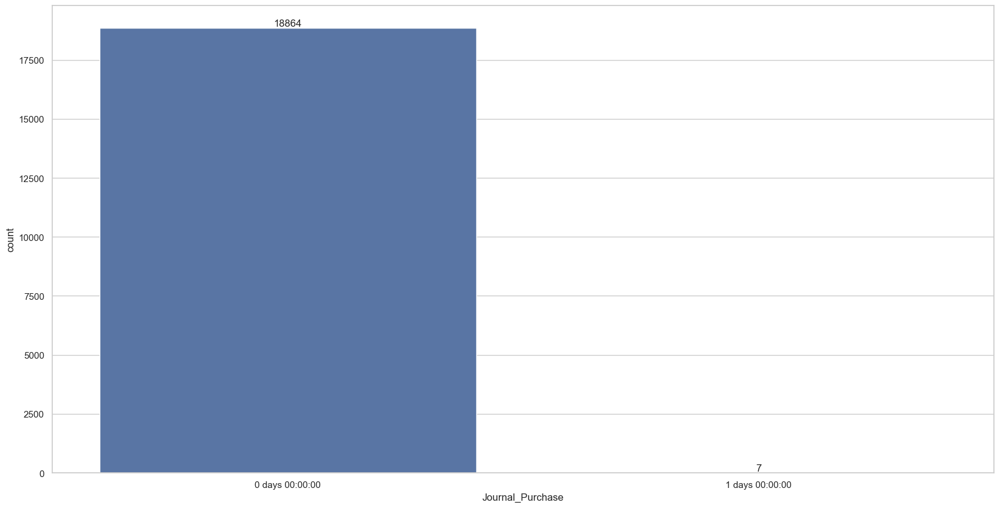

In [130]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.countplot(donor_dates,x='Journal_Purchase')
ax.bar_label(ax.containers[0])  
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=0)
# Show the plot
plt.show()

**Looking into the above graph we can see most of the bonds are isssued within a day and at max in one day. No bond took more than one day to issue.** 

In [131]:
Issue_delay = donors_df[donors_df['JournalDate']!= donors_df['PurchaseDate']]
Issue_delay

,SNo,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,Denominations,IssueBranchCode,IssueTeller,State,Branch Code No.,Branch City,Unique_key,PurchaserYear
9122,9123,00847202204080000002409,2022-04-08,2022-04-09,2022-04-23,GREENKO BUDHIL HYDRO POWER PVT LTD,OC,12060,10000000,847,3898296,Telangana,847,Hyderabad,OC12060,2022
9125,9126,00847202204080000002424,2022-04-08,2022-04-09,2022-04-23,GREENKO RAYALA WIND POWER PRIVATE LIMITED,OC,12059,10000000,847,3898296,Telangana,847,Hyderabad,OC12059,2022
9128,9129,00847202204080000002417,2022-04-08,2022-04-09,2022-04-23,SANOLA WIND PROJECT PVT LTD,OC,12052,10000000,847,3898296,Telangana,847,Hyderabad,OC12052,2022
9130,9131,00847202204080000002416,2022-04-08,2022-04-09,2022-04-23,SEI DIAMOND PVT LTD,OC,12056,10000000,847,3898296,Telangana,847,Hyderabad,OC12056,2022
9132,9133,00847202204080000002421,2022-04-08,2022-04-09,2022-04-23,SEI VENUS PVT LTD,OC,12051,10000000,847,3898296,Telangana,847,Hyderabad,OC12051,2022
9134,9135,00847202204080000002419,2022-04-08,2022-04-09,2022-04-23,SUNBORNE ENERGY ANDHRA PVT LTD,OC,12055,10000000,847,3898296,Telangana,847,Hyderabad,OC12055,2022
9136,9137,00847202204080000002413,2022-04-08,2022-04-09,2022-04-23,TANOT WIND POWER VENTURES PVT LTD,OC,12067,10000000,847,3898296,Telangana,847,Hyderabad,OC12067,2022


In [132]:
donors_df.columns

Index(['SNo', 'Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'Denominations', 'IssueBranchCode',
       'IssueTeller', 'State', 'Branch Code No.', 'Branch City', 'Unique_key',
       'PurchaserYear'],
      dtype='object')

In [133]:
Issue_delay = Issue_delay[['JournalDate','PurchaseDate','Purchaser','Branch City']]
Issue_delay

,JournalDate,PurchaseDate,Purchaser,Branch City
9122,2022-04-08,2022-04-09,GREENKO BUDHIL HYDRO POWER PVT LTD,Hyderabad
9125,2022-04-08,2022-04-09,GREENKO RAYALA WIND POWER PRIVATE LIMITED,Hyderabad
9128,2022-04-08,2022-04-09,SANOLA WIND PROJECT PVT LTD,Hyderabad
9130,2022-04-08,2022-04-09,SEI DIAMOND PVT LTD,Hyderabad
9132,2022-04-08,2022-04-09,SEI VENUS PVT LTD,Hyderabad
9134,2022-04-08,2022-04-09,SUNBORNE ENERGY ANDHRA PVT LTD,Hyderabad
9136,2022-04-08,2022-04-09,TANOT WIND POWER VENTURES PVT LTD,Hyderabad


> Only 7 Bonds got delayed while issuing them and that happend on 2022-04-08 and only in Hyderbad which means we can say there was a technical problems in that branch. 

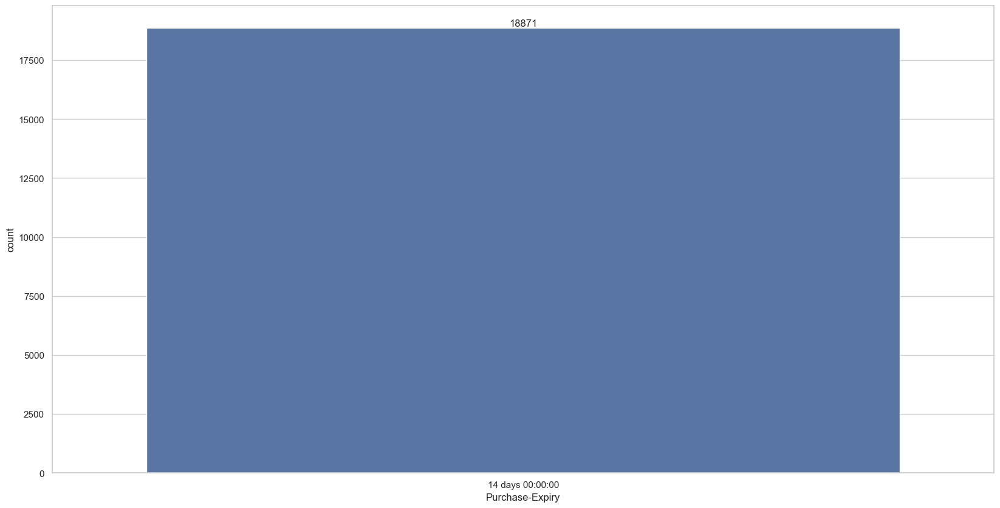

In [134]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.countplot(donor_dates,x='Purchase-Expiry')
ax.bar_label(ax.containers[0])  
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=0)
# Show the plot
plt.show()

> Looking into the graph we can say all the bonds have only 14 days to encash from their puchase date

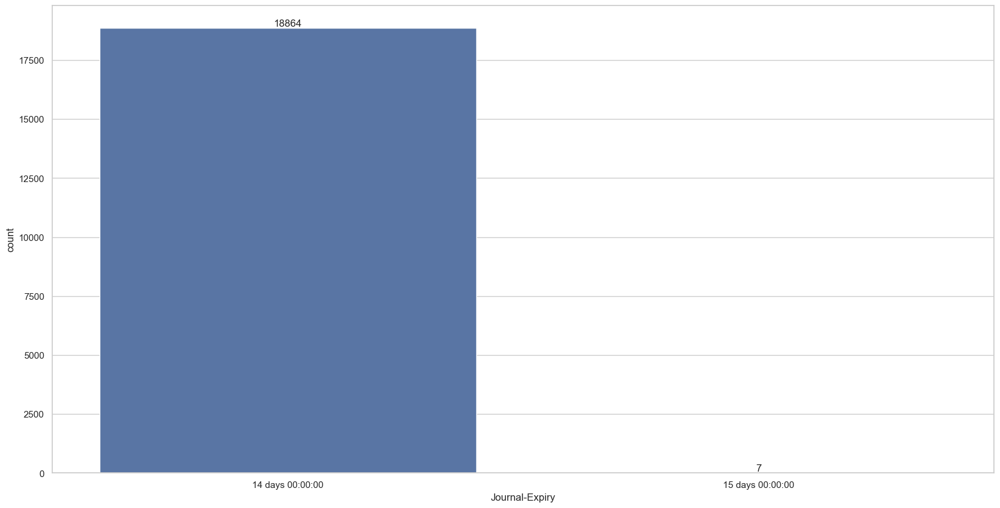

In [135]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.countplot(donor_dates,x='Journal-Expiry')
ax.bar_label(ax.containers[0])  
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=0)
# Show the plot
plt.show()

In [136]:
perfect_data.columns 

Index(['Urn', 'JournalDate', 'PurchaseDate', 'ExpiryDate', 'Purchaser',
       'Prefix', 'BondNumber', 'IssueBranchCode', 'IssueTeller', 'IssueState',
       'IssueBranchCodeNo', 'IssueBranchCity', 'Unique_key', 'DateEncashment',
       'PartyName', 'AccountNum', 'PayBranchCode', 'PayTeller', 'encashedyear',
       'EncashedState', 'EncashedBranchCode', 'EncashedCity', 'Denomination'],
      dtype='object')

In [137]:
encashed_dates = perfect_data[['Unique_key','JournalDate', 'PurchaseDate', 'ExpiryDate','DateEncashment']]
encashed_dates.head(2) 

,Unique_key,JournalDate,PurchaseDate,ExpiryDate,DateEncashment
0,OC10000,2022-04-08,2022-04-08,2022-04-22,2022-04-12
1,OC10001,2021-10-07,2021-10-07,2021-10-21,2021-10-08


In [138]:
encashed_dates['buy-encash'] = encashed_dates['DateEncashment'] - encashed_dates['PurchaseDate']

In [139]:
encashed_dates.head(2)

,Unique_key,JournalDate,PurchaseDate,ExpiryDate,DateEncashment,buy-encash
0,OC10000,2022-04-08,2022-04-08,2022-04-22,2022-04-12,4 days
1,OC10001,2021-10-07,2021-10-07,2021-10-21,2021-10-08,1 days


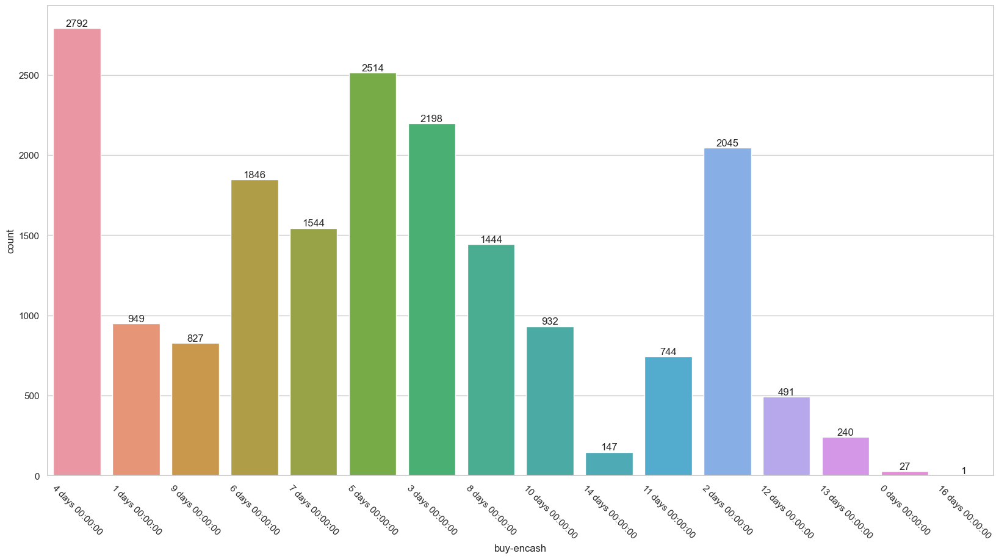

In [140]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a count plot
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
ax = sns.countplot(encashed_dates,x='buy-encash')
ax.bar_label(ax.containers[0])  
# Rotate x-axis labels by -45 degrees for better readability
plt.xticks(rotation=-45)
# Show the plot
plt.show()

In [141]:
black_data = perfect_data[perfect_data['DateEncashment']>perfect_data['ExpiryDate']]
black_data

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination
10846,00800202107070000001869,2021-07-07,2021-07-07,2021-07-21,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,8637.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC8637,2021-07-23,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3480909.0,2021.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0


> This is the only bond which got encashed even after it got expired and this was encashed by **All INDIA Trinalmool congress** which could be the data is wrong (Provided by the govt) or Some Quid proco has been there between the party and the bank. 

## Party and company analysis 

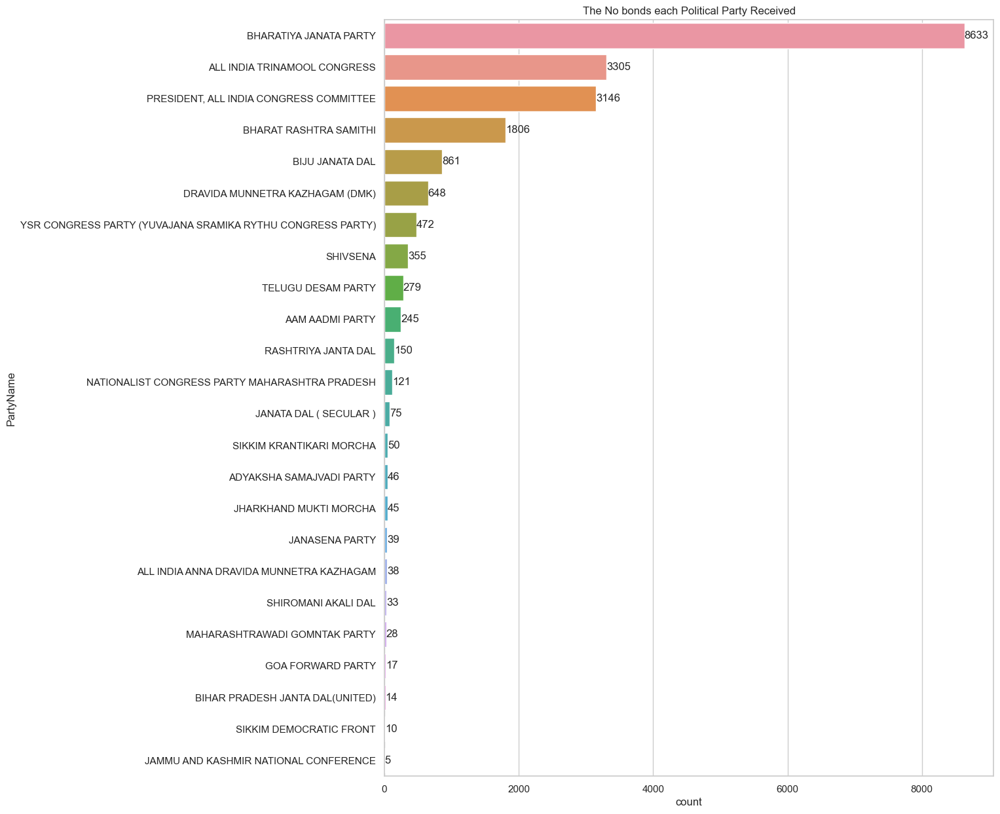

In [142]:
# Assuming you have a DataFrame named 'alldata_df' and want to plot a horizontal count plot
plt.figure(figsize=(12, 15))  # Set the figure size (width, height) in inches

# Create the horizontal count plot with y-labels on the bars
ax = sns.countplot(data=alldata_df, y='PartyName', order=alldata_df['PartyName'].value_counts().index)
ax.bar_label(ax.containers[0], fmt='%.0f')  # Display count labels on the bars
# title
plt.title('The No bonds each Political Party Received')
# Show the plot
plt.show()

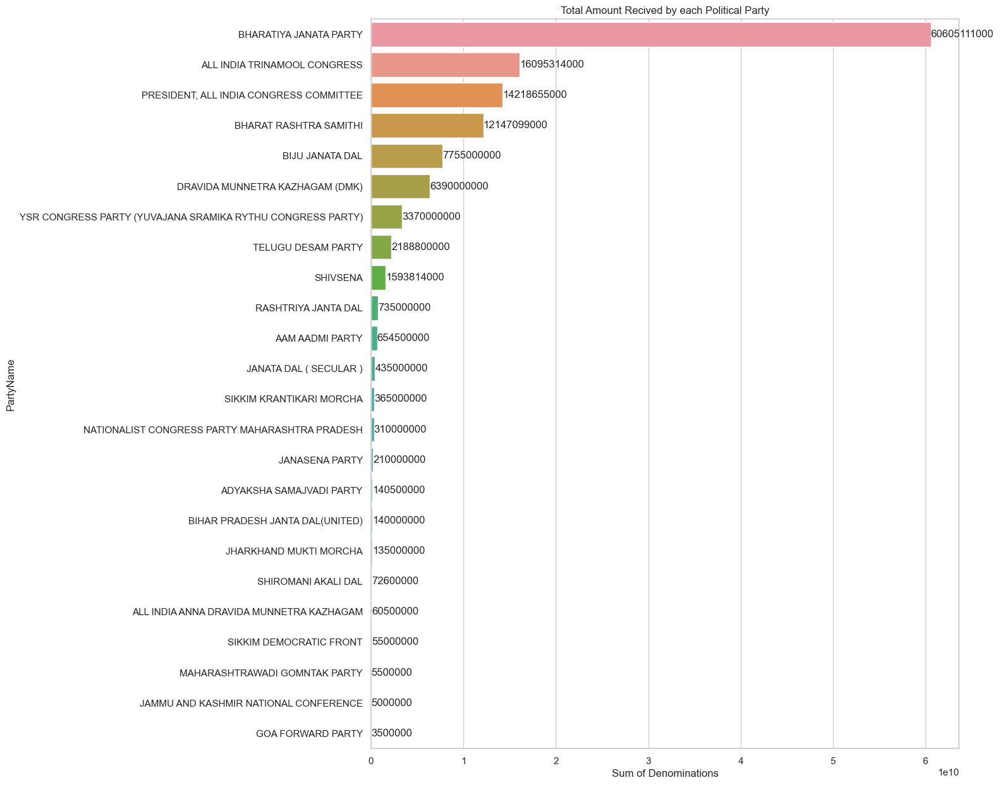

In [143]:
# Calculate the sum of 'Denominations' for each 'PartyName'
sum_denominations = receiver_df.groupby('PartyName')['Denominations'].sum().sort_values(ascending=False).reset_index()

# Plotting using Seaborn barplot
plt.figure(figsize=(12, 15))  # Set the figure size (width, height) in inches

# Create the horizontal bar plot with 'PartyName' on y-axis and summed 'Denominations' on x-axis
ax = sns.barplot(data=sum_denominations, y='PartyName', x='Denominations')

# Add count labels on the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # Display count labels on the bars

# Set plot title and labels
plt.title('Total Amount Recived by each Political Party')
plt.xlabel('Sum of Denominations')
plt.ylabel('PartyName')

# Show the plot
plt.show()

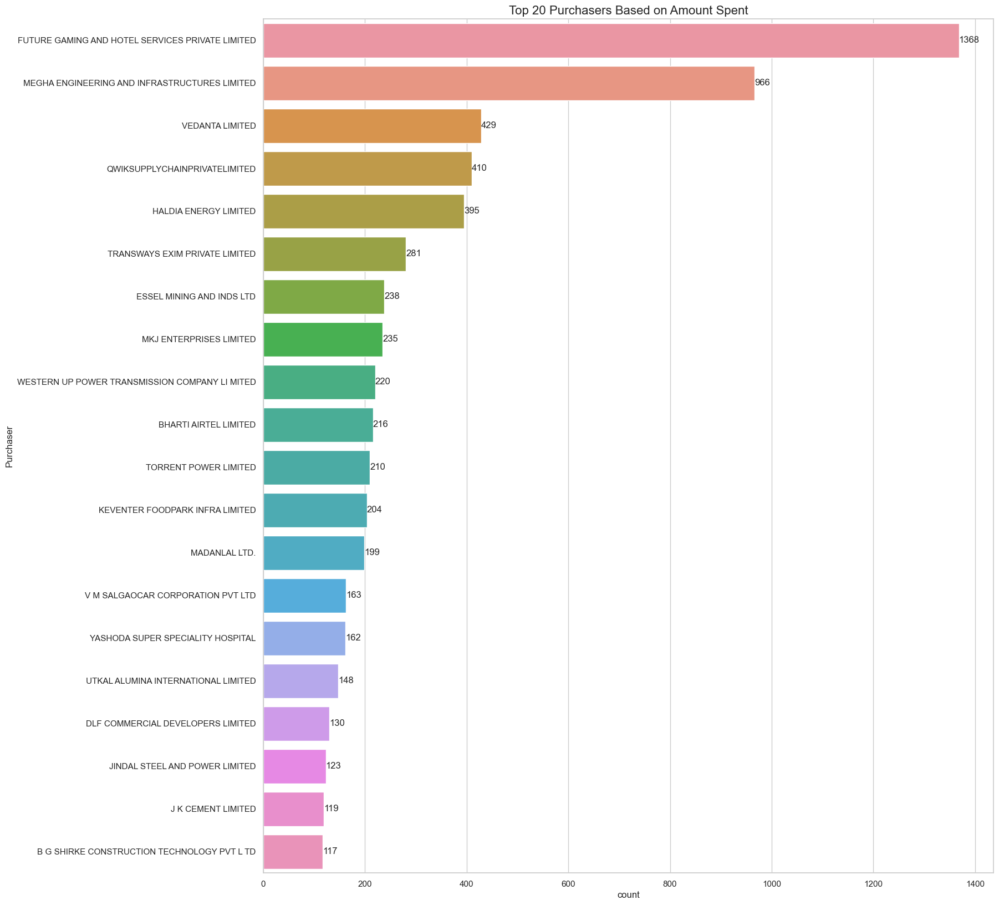

In [144]:
# Calculate the top 20 purchasers based on frequency
top_purchasers = alldata_df['Purchaser'].value_counts().nlargest(20).index

# Filter the DataFrame to include only the top 20 purchasers
filtered_df = alldata_df[alldata_df['Purchaser'].isin(top_purchasers)]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 20))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.countplot(data=filtered_df, y='Purchaser', order=top_purchasers)  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0])  # Display count labels on the bars

# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
# title 
plt.title('Top 20 Purchasers Based on Amount Spent', fontsize=16)
# Show the plot
plt.show()


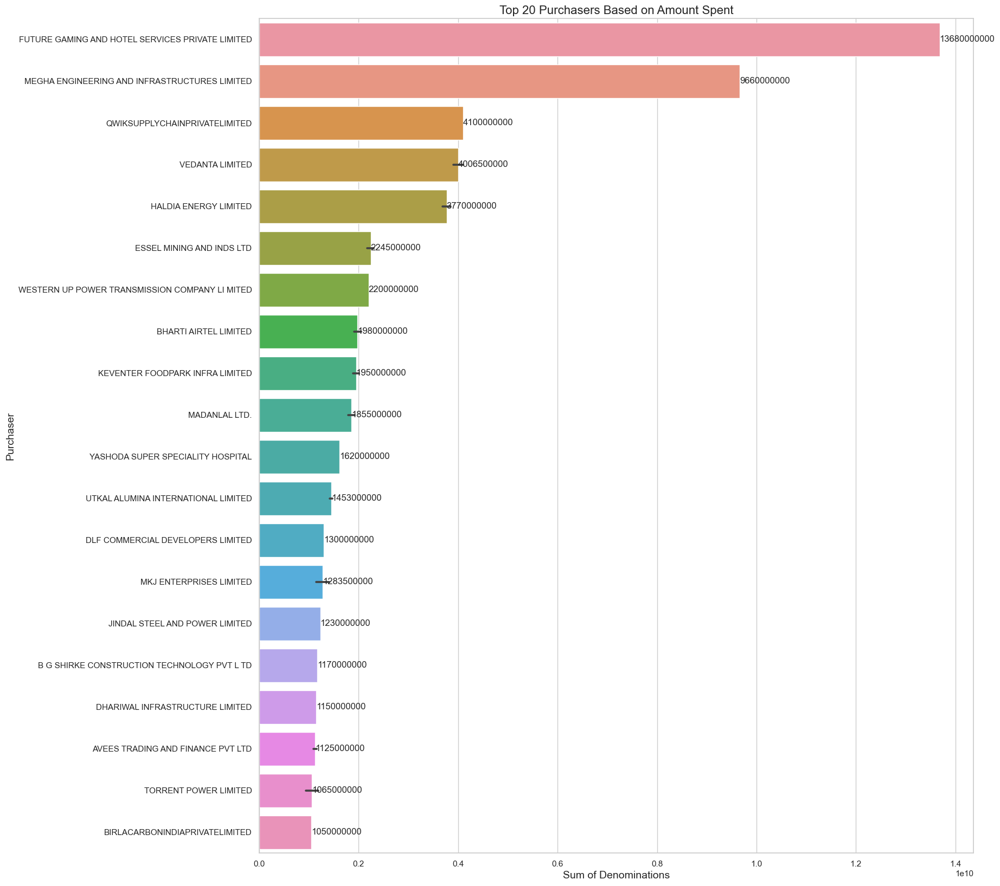

In [145]:
# Calculate the top 20 purchasers based on sum of denominations
top_purchasers = alldata_df.groupby('Purchaser')['Denomination'].sum().nlargest(20).index

# Filter the DataFrame to include only the top 20 purchasers
filtered_df = alldata_df[alldata_df['Purchaser'].isin(top_purchasers)]

# Create the horizontal bar plot for the top 20 purchasers based on sum of denominations
plt.figure(figsize=(17, 20))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, y='Purchaser', x='Denomination', order=top_purchasers, estimator=sum)  

# Display the sum of denominations on the bars
for p in ax.patches:
    ax.annotate(f'{p.get_width():.0f}', (p.get_width(), p.get_y() + p.get_height() / 2), ha='left', va='center')

# Set plot title and labels
plt.title('Top 20 Purchasers Based on Amount Spent', fontsize=16)
plt.xlabel('Sum of Denominations', fontsize=14)
plt.ylabel('Purchaser', fontsize=14)
plt.show()

In [146]:
top_donors_amtwise = list(top_purchasers)
top_donors_amtwise

['FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED',
 'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',
 'QWIKSUPPLYCHAINPRIVATELIMITED',
 'VEDANTA LIMITED',
 'HALDIA ENERGY LIMITED',
 'ESSEL MINING AND INDS LTD',
 'WESTERN UP POWER TRANSMISSION COMPANY LI MITED',
 'BHARTI AIRTEL LIMITED',
 'KEVENTER FOODPARK INFRA LIMITED',
 'MADANLAL LTD.',
 'YASHODA SUPER SPECIALITY HOSPITAL',
 'UTKAL ALUMINA INTERNATIONAL LIMITED',
 'DLF COMMERCIAL DEVELOPERS LIMITED',
 'MKJ ENTERPRISES LIMITED',
 'JINDAL STEEL AND POWER LIMITED',
 'B G SHIRKE CONSTRUCTION TECHNOLOGY PVT L TD',
 'DHARIWAL INFRASTRUCTURE LIMITED',
 'AVEES TRADING AND FINANCE PVT LTD',
 'TORRENT POWER LIMITED',
 'BIRLACARBONINDIAPRIVATELIMITED']

# Analyzing Top 10 companies 

In [147]:
filtered_df = perfect_data[perfect_data['Purchaser'].isin(top_purchasers)]
# Extract year from 'PurchaseDate'
filtered_df['Year'] = filtered_df['PurchaseDate'].dt.year
filtered_df.groupby(['Purchaser','Year','PartyName'])['Denomination'].sum().reset_index()

,Purchaser,Year,PartyName,Denomination
0,AVEES TRADING AND FINANCE PVT LTD,2019,ALL INDIA TRINAMOOL CONGRESS,240000000.0
1,AVEES TRADING AND FINANCE PVT LTD,2021,ALL INDIA TRINAMOOL CONGRESS,150000000.0
2,AVEES TRADING AND FINANCE PVT LTD,2022,AAM AADMI PARTY,100000000.0
3,AVEES TRADING AND FINANCE PVT LTD,2022,BIJU JANATA DAL,30000000.0
4,AVEES TRADING AND FINANCE PVT LTD,2023,ALL INDIA TRINAMOOL CONGRESS,65000000.0
...,...,...,...,...
138,YASHODA SUPER SPECIALITY HOSPITAL,2022,BHARAT RASHTRA SAMITHI,800000000.0
139,YASHODA SUPER SPECIALITY HOSPITAL,2022,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",70000000.0
140,YASHODA SUPER SPECIALITY HOSPITAL,2022,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,10000000.0
141,YASHODA SUPER SPECIALITY HOSPITAL,2023,BHARAT RASHTRA SAMITHI,90000000.0


# 'FUTURE GAMING AND HOTEL SERVICES PR'

In [148]:
company_name =  'FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
419,00800202201060000002133,2022-01-06,2022-01-06,2022-01-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10401.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10401,2022-01-14,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
420,00800202201060000002162,2022-01-06,2022-01-06,2022-01-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10402.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10402,2022-01-11,DRAVIDA MUNNETRA KAZHAGAM (DMK),*******8935,800.0,5614473.0,2022.0,Tamil Nadu and Puducherry,800.0,Chennai,10000000.0,2022
421,00800202201060000002162,2022-01-06,2022-01-06,2022-01-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10403.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10403,2022-01-11,DRAVIDA MUNNETRA KAZHAGAM (DMK),*******8935,800.0,5614473.0,2022.0,Tamil Nadu and Puducherry,800.0,Chennai,10000000.0,2022
422,00800202201060000002162,2022-01-06,2022-01-06,2022-01-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10404.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10404,2022-01-11,DRAVIDA MUNNETRA KAZHAGAM (DMK),*******8935,800.0,5614473.0,2022.0,Tamil Nadu and Puducherry,800.0,Chennai,10000000.0,2022
423,00800202201060000002162,2022-01-06,2022-01-06,2022-01-20,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,10405.0,800.0,7273126.0,Tamil Nadu and Puducherry,800.0,Chennai,OC10405,2022-01-11,DRAVIDA MUNNETRA KAZHAGAM (DMK),*******8935,800.0,5614473.0,2022.0,Tamil Nadu and Puducherry,800.0,Chennai,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11332,00300202010270000001657,2020-10-27,2020-10-27,2020-11-10,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,9122.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC9122,2020-11-07,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,*******6354,847.0,3382516.0,2020.0,Telangana,847.0,Hyderabad,10000000.0,2020
11334,00300202010270000001657,2020-10-27,2020-10-27,2020-11-10,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,9124.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC9124,2020-11-07,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,*******6354,847.0,3382516.0,2020.0,Telangana,847.0,Hyderabad,10000000.0,2020
11336,00300202010270000001657,2020-10-27,2020-10-27,2020-11-10,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,9126.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC9126,2020-11-07,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,*******6354,847.0,3382516.0,2020.0,Telangana,847.0,Hyderabad,10000000.0,2020
11338,00300202010270000001657,2020-10-27,2020-10-27,2020-11-10,FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED,OC,9128.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC9128,2020-11-07,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,*******6354,847.0,3382516.0,2020.0,Telangana,847.0,Hyderabad,10000000.0,2020


In [149]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2020,1.500000e+09,150
1,2021,3.340000e+09,334
2,2022,4.970000e+09,497
3,2023,3.210000e+09,321
4,2024,6.300000e+08,63


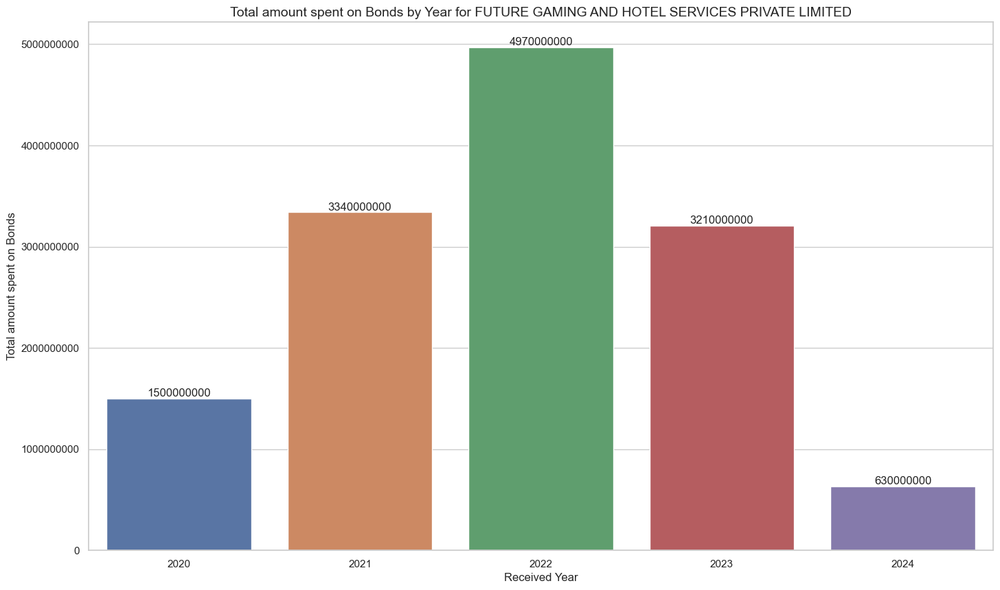

In [150]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

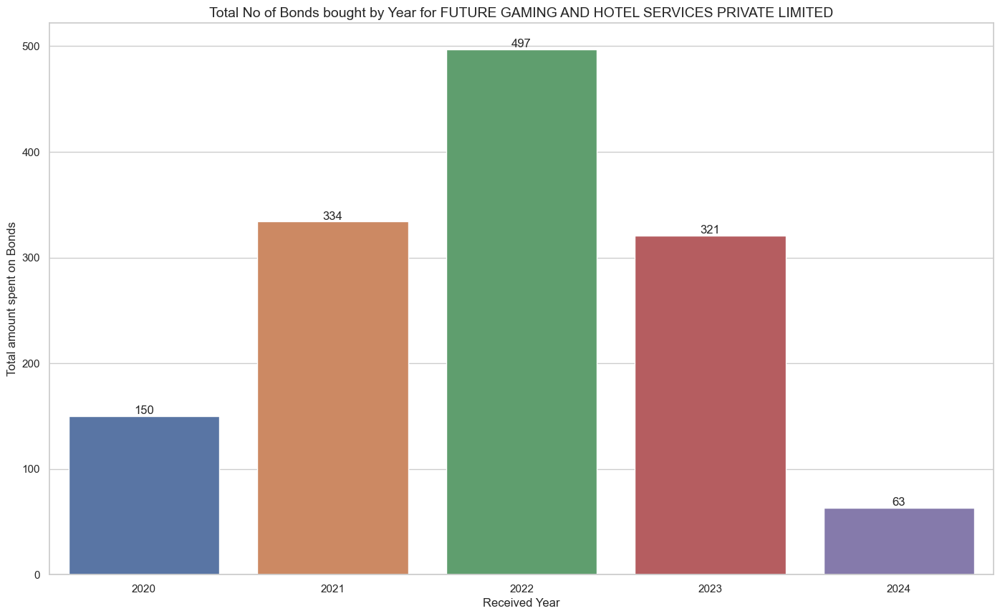

In [151]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [152]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2020,ALL INDIA TRINAMOOL CONGRESS,1.000000e+07,1
1,2020,DRAVIDA MUNNETRA KAZHAGAM (DMK),6.000000e+08,60
2,2020,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,8.900000e+08,89
3,2021,ALL INDIA TRINAMOOL CONGRESS,7.600000e+08,76
4,2021,BHARATIYA JANATA PARTY,5.000000e+08,50
5,2021,DRAVIDA MUNNETRA KAZHAGAM (DMK),1.480000e+09,148
6,2021,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,6.000000e+08,60
7,2022,ALL INDIA TRINAMOOL CONGRESS,1.850000e+09,185
8,2022,BHARATIYA JANATA PARTY,5.000000e+08,50
9,2022,DRAVIDA MUNNETRA KAZHAGAM (DMK),2.550000e+09,255


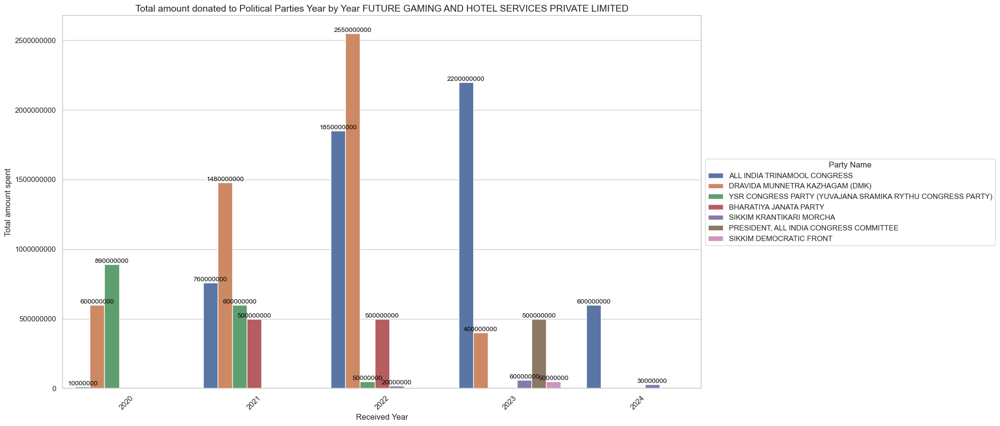

In [153]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [154]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

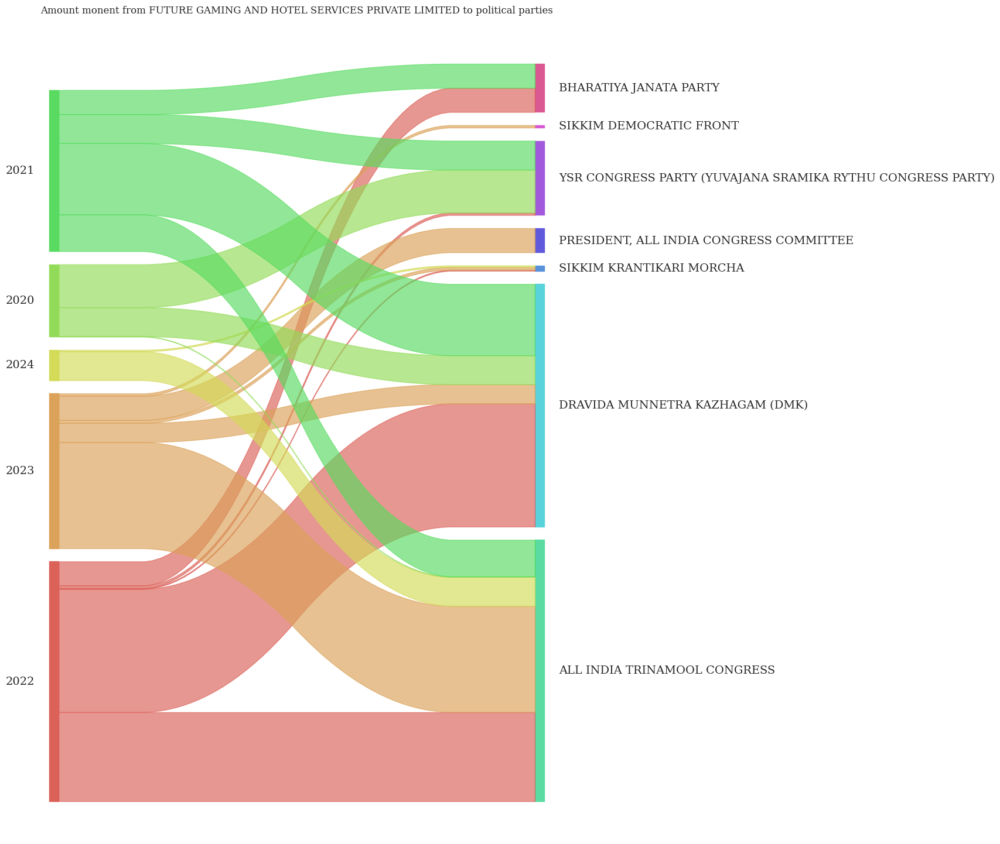

In [155]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [156]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',ITY HOSPITAL'

In [157]:
company_name =  'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
2102,00847202207050000002461,2022-07-05,2022-07-05,2022-07-19,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,12085.0,847.0,3394387.0,Telangana,847.0,Hyderabad,OC12085,2022-07-06,BHARAT RASHTRA SAMITHI,*******7477,847.0,3889823.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
2106,00847202207050000002461,2022-07-05,2022-07-05,2022-07-19,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,12089.0,847.0,3394387.0,Telangana,847.0,Hyderabad,OC12089,2022-07-06,BHARAT RASHTRA SAMITHI,*******7477,847.0,3889823.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
2110,00847202207050000002461,2022-07-05,2022-07-05,2022-07-19,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,12093.0,847.0,3394387.0,Telangana,847.0,Hyderabad,OC12093,2022-07-06,BHARAT RASHTRA SAMITHI,*******7477,847.0,3889823.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
2114,00847202207050000002461,2022-07-05,2022-07-05,2022-07-19,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,12097.0,847.0,3394387.0,Telangana,847.0,Hyderabad,OC12097,2022-07-06,BHARAT RASHTRA SAMITHI,*******7477,847.0,3889823.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
2116,00847202207050000002461,2022-07-05,2022-07-05,2022-07-19,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,12099.0,847.0,3394387.0,Telangana,847.0,Hyderabad,OC12099,2022-07-06,BHARAT RASHTRA SAMITHI,*******7477,847.0,3889823.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12134,00847202204070000002367,2022-04-07,2022-04-07,2022-04-21,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,9924.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9924,2022-04-11,BHARAT RASHTRA SAMITHI,*******7477,847.0,6370918.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
12136,00847202204070000002367,2022-04-07,2022-04-07,2022-04-21,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,9926.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9926,2022-04-11,BHARAT RASHTRA SAMITHI,*******7477,847.0,6370918.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
12138,00847202204070000002367,2022-04-07,2022-04-07,2022-04-21,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,9928.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9928,2022-04-11,BHARAT RASHTRA SAMITHI,*******7477,847.0,6370918.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
12140,00847202204070000002367,2022-04-07,2022-04-07,2022-04-21,MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED,OC,9930.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9930,2022-04-11,BHARAT RASHTRA SAMITHI,*******7477,847.0,6370918.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022


In [158]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,1.300000e+09,130
1,2020,2.000000e+08,20
2,2021,1.780000e+09,178
3,2022,2.230000e+09,223
4,2023,4.150000e+09,415


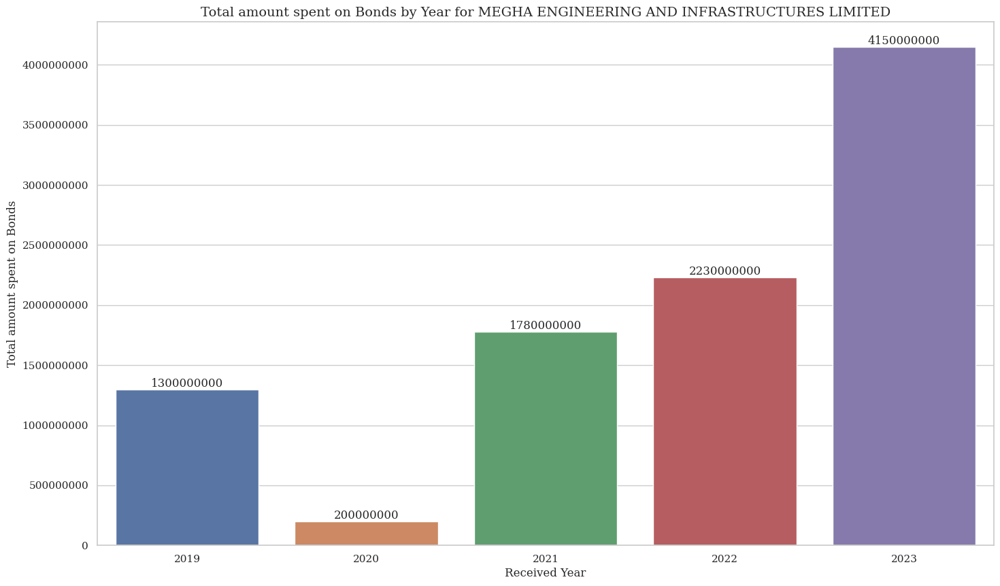

In [159]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

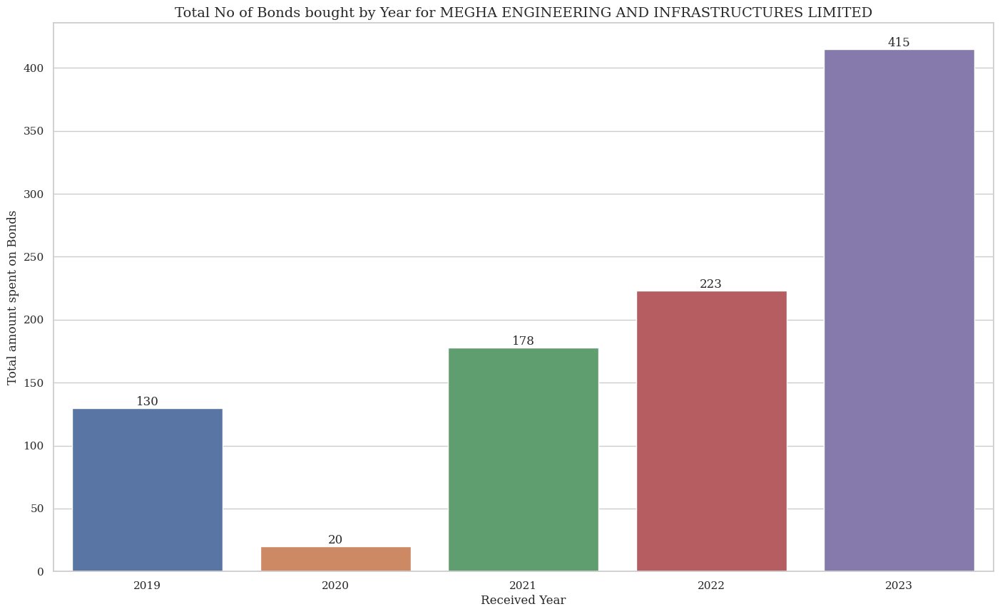

In [160]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [161]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,1.250000e+09,125
1,2019,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",5.000000e+07,5
2,2020,DRAVIDA MUNNETRA KAZHAGAM (DMK),2.000000e+08,20
3,2021,BHARAT RASHTRA SAMITHI,1.000000e+09,100
4,2021,BHARATIYA JANATA PARTY,3.300000e+08,33
5,2021,DRAVIDA MUNNETRA KAZHAGAM (DMK),4.000000e+08,40
6,2021,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",5.000000e+07,5
7,2022,BHARAT RASHTRA SAMITHI,4.500000e+08,45
8,2022,BHARATIYA JANATA PARTY,1.290000e+09,129
9,2022,BIHAR PRADESH JANTA DAL(UNITED),1.000000e+08,10


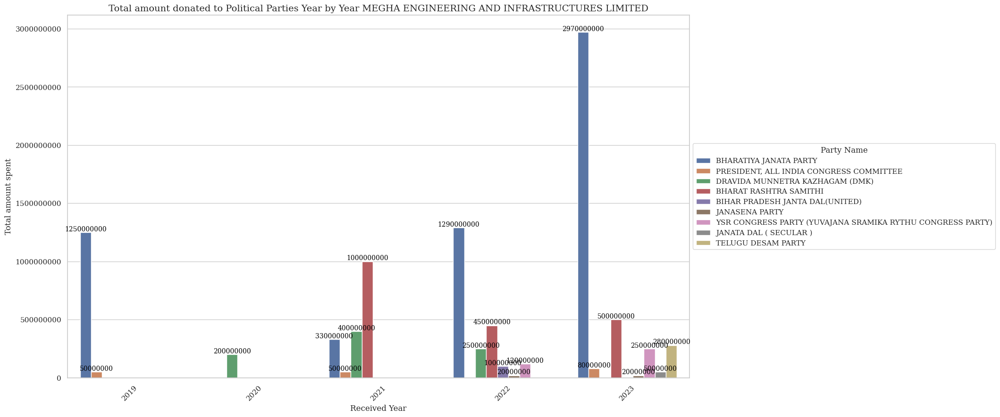

In [162]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [163]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

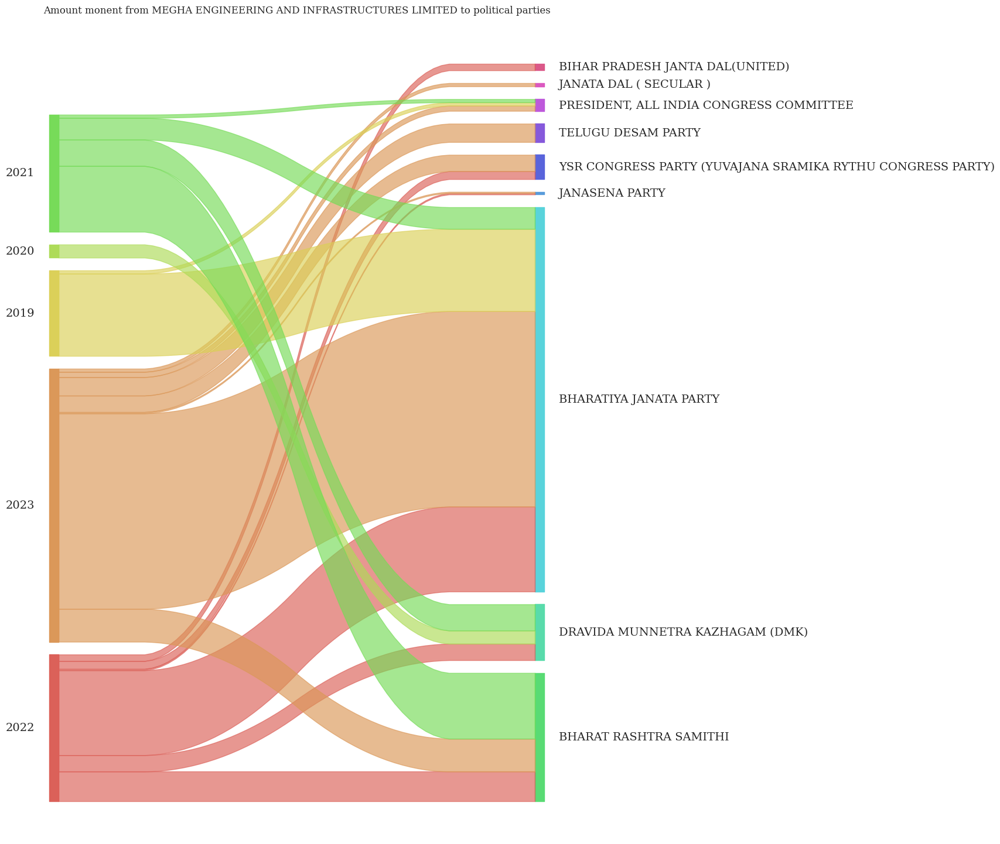

In [164]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [165]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'VEDANTA LIMITED',

In [166]:
company_name =  'VEDANTA LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
1113,00300202201100000002307,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,OC,11082.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC11082,2022-01-14,BHARATIYA JANATA PARTY,*******8244,691.0,5642191.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1115,00300202201100000002307,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,OC,11084.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC11084,2022-01-14,BHARATIYA JANATA PARTY,*******8244,691.0,5642191.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1117,00300202201100000002307,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,OC,11086.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC11086,2022-01-14,BHARATIYA JANATA PARTY,*******8244,691.0,5642191.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1119,00300202201100000002307,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,OC,11088.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC11088,2022-01-14,BHARATIYA JANATA PARTY,*******8244,691.0,5642191.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1121,00300202201100000002307,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,OC,11090.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC11090,2022-01-14,BHARATIYA JANATA PARTY,*******8244,691.0,5642191.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17107,00691202201100000002306,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,TL,13688.0,691.0,3428540.0,Delhi,691.0,New Delhi,TL13688,2022-01-21,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,1000000.0,2022
17110,00691202201100000002306,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,TL,13690.0,691.0,3428540.0,Delhi,691.0,New Delhi,TL13690,2022-01-21,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,1000000.0,2022
17112,00691202201100000002306,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,TL,13692.0,691.0,3428540.0,Delhi,691.0,New Delhi,TL13692,2022-01-21,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,1000000.0,2022
17114,00691202201100000002306,2022-01-10,2022-01-10,2022-01-24,VEDANTA LIMITED,TL,13694.0,691.0,3428540.0,Delhi,691.0,New Delhi,TL13694,2022-01-21,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,1000000.0,2022


In [167]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,5.265000e+08,63
1,2021,2.500000e+08,25
2,2022,2.527000e+09,268
3,2023,7.000000e+08,70


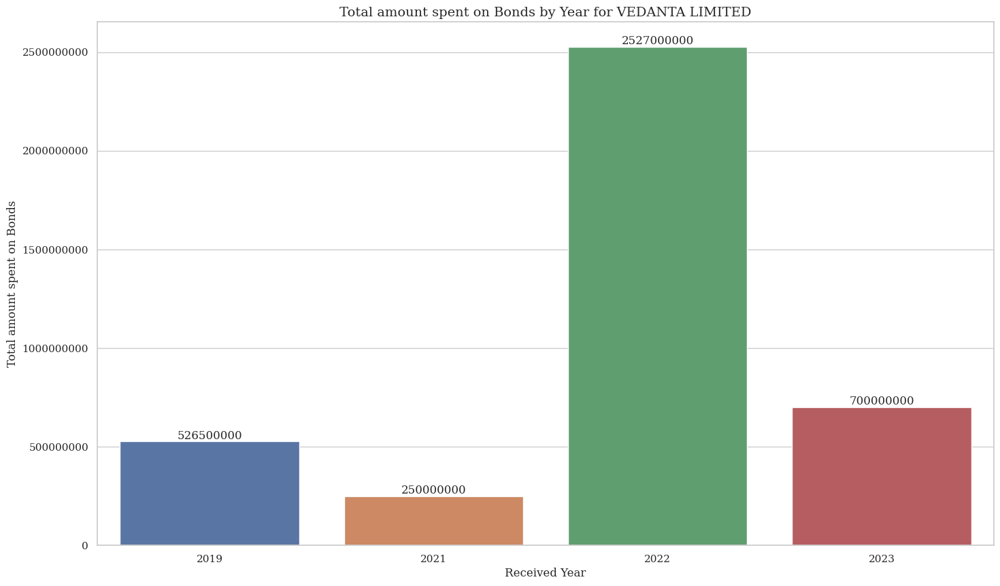

In [168]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

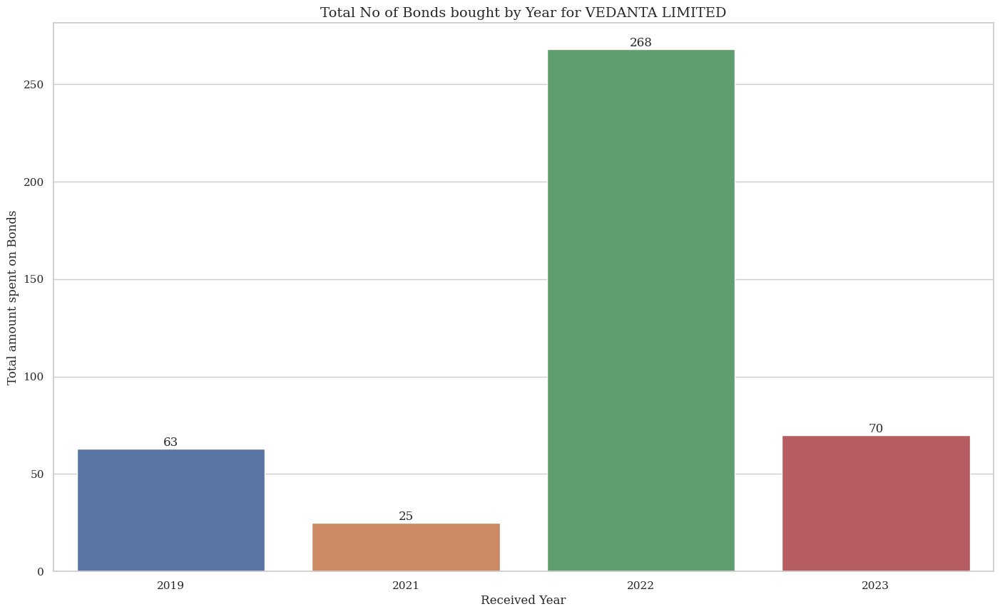

In [169]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [170]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,5.265000e+08,63
1,2021,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2.500000e+08,25
2,2022,ALL INDIA TRINAMOOL CONGRESS,2.000000e+06,2
3,2022,BHARATIYA JANATA PARTY,1.765000e+09,190
4,2022,BIJU JANATA DAL,2.500000e+08,25
5,2022,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",5.100000e+08,51
6,2023,BHARATIYA JANATA PARTY,1.000000e+07,1
7,2023,BIJU JANATA DAL,1.500000e+08,15
8,2023,JHARKHAND MUKTI MORCHA,5.000000e+07,5
9,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",4.900000e+08,49


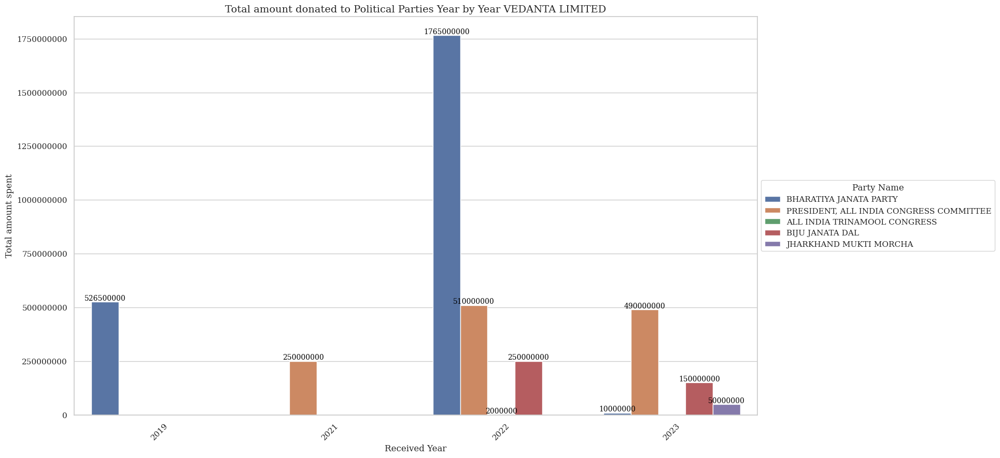

In [171]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [172]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

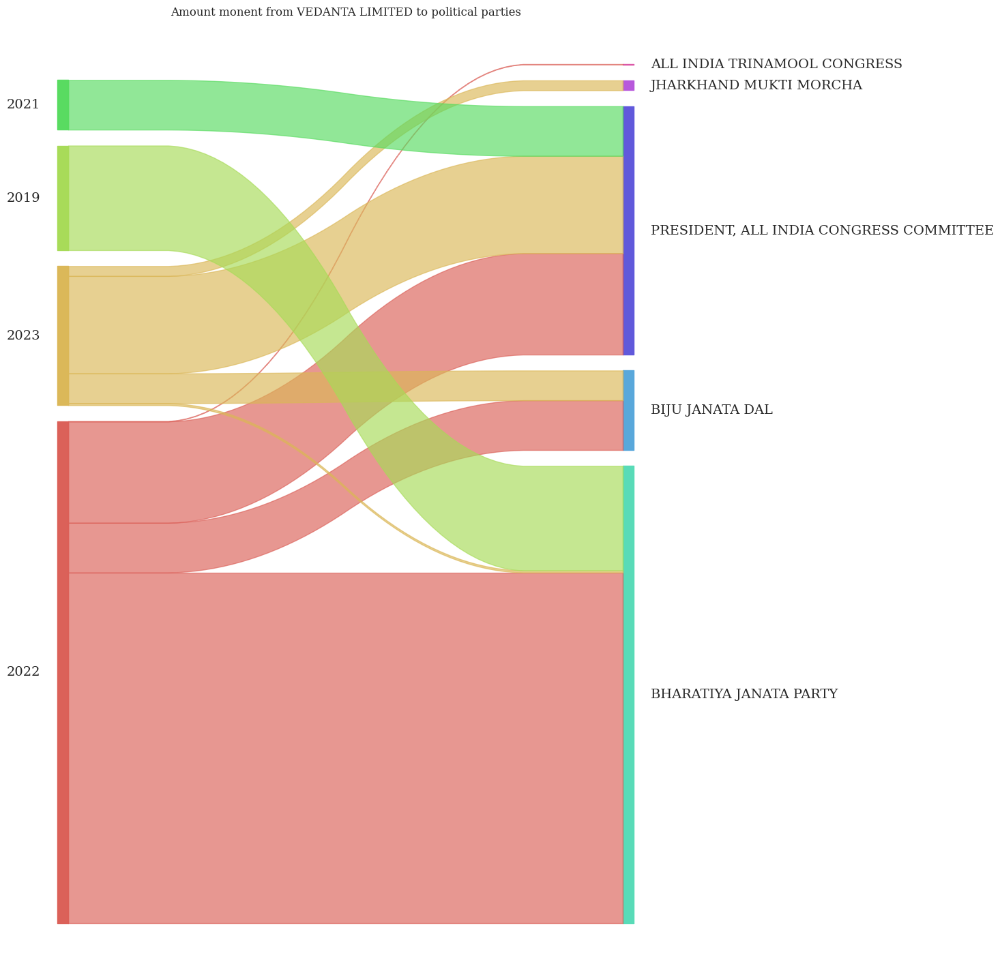

In [173]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [174]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'QWIKSUPPLYCHAINPRIVATELIMITED',

In [175]:
company_name =  'QWIKSUPPLYCHAINPRIVATELIMITED' 
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
70,00300202201050000002120,2022-01-05,2022-01-05,2022-01-19,QWIKSUPPLYCHAINPRIVATELIMITED,OC,10071.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10071,2022-01-06,SHIVSENA,*******4444,300.0,3656179.0,2022.0,Maharashtra,300.0,Mumbai,10000000.0,2022
72,00300202201050000002120,2022-01-05,2022-01-05,2022-01-19,QWIKSUPPLYCHAINPRIVATELIMITED,OC,10073.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10073,2022-01-06,SHIVSENA,*******4444,300.0,3656179.0,2022.0,Maharashtra,300.0,Mumbai,10000000.0,2022
74,00300202201050000002120,2022-01-05,2022-01-05,2022-01-19,QWIKSUPPLYCHAINPRIVATELIMITED,OC,10075.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10075,2022-01-06,SHIVSENA,*******4444,300.0,3656179.0,2022.0,Maharashtra,300.0,Mumbai,10000000.0,2022
76,00300202201050000002120,2022-01-05,2022-01-05,2022-01-19,QWIKSUPPLYCHAINPRIVATELIMITED,OC,10077.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10077,2022-01-06,SHIVSENA,*******4444,300.0,3656179.0,2022.0,Maharashtra,300.0,Mumbai,10000000.0,2022
78,00300202201050000002120,2022-01-05,2022-01-05,2022-01-19,QWIKSUPPLYCHAINPRIVATELIMITED,OC,10079.0,300.0,7905165.0,Maharashtra,300.0,Mumbai,OC10079,2022-01-06,SHIVSENA,*******4444,300.0,3656179.0,2022.0,Maharashtra,300.0,Mumbai,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6946,00300202311170000003592,2023-11-17,2023-11-17,2023-12-01,QWIKSUPPLYCHAINPRIVATELIMITED,OC,17302.0,300.0,1022034.0,Maharashtra,300.0,Mumbai,OC17302,2023-11-20,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
6948,00300202311170000003592,2023-11-17,2023-11-17,2023-12-01,QWIKSUPPLYCHAINPRIVATELIMITED,OC,17304.0,300.0,1022034.0,Maharashtra,300.0,Mumbai,OC17304,2023-11-20,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
6950,00300202311170000003592,2023-11-17,2023-11-17,2023-12-01,QWIKSUPPLYCHAINPRIVATELIMITED,OC,17306.0,300.0,1022034.0,Maharashtra,300.0,Mumbai,OC17306,2023-11-20,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
6952,00300202311170000003592,2023-11-17,2023-11-17,2023-12-01,QWIKSUPPLYCHAINPRIVATELIMITED,OC,17308.0,300.0,1022034.0,Maharashtra,300.0,Mumbai,OC17308,2023-11-20,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023


In [176]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2022,3.600000e+09,360
1,2023,5.000000e+08,50


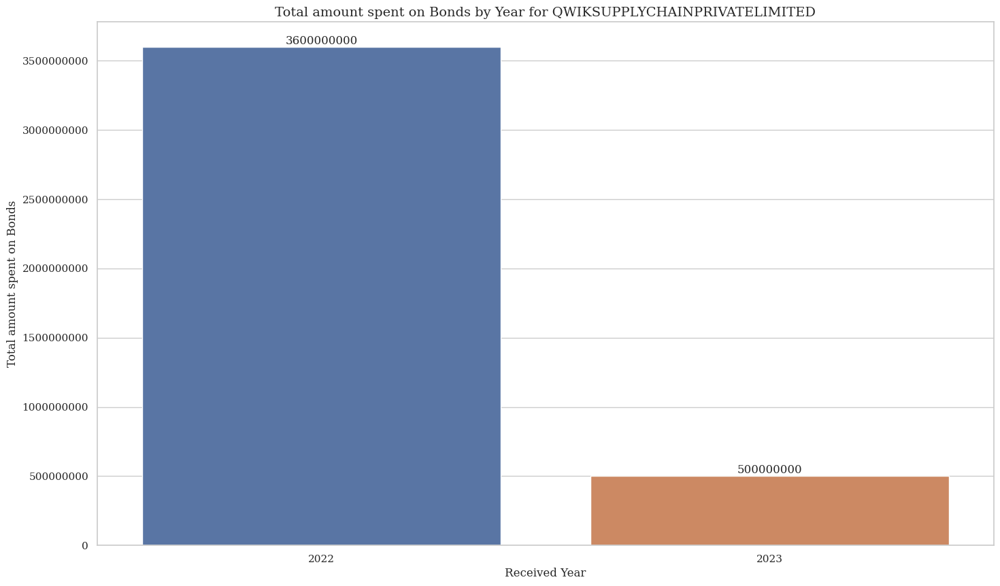

In [177]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

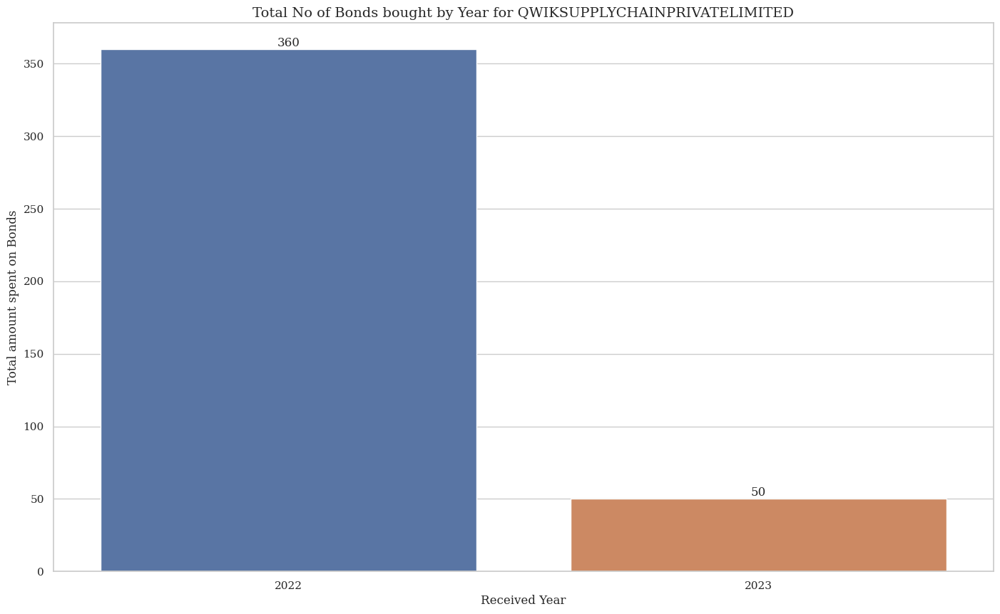

In [178]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [179]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2022,BHARATIYA JANATA PARTY,3.250000e+09,325
1,2022,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,1.000000e+08,10
2,2022,SHIVSENA,2.500000e+08,25
3,2023,BHARATIYA JANATA PARTY,5.000000e+08,50


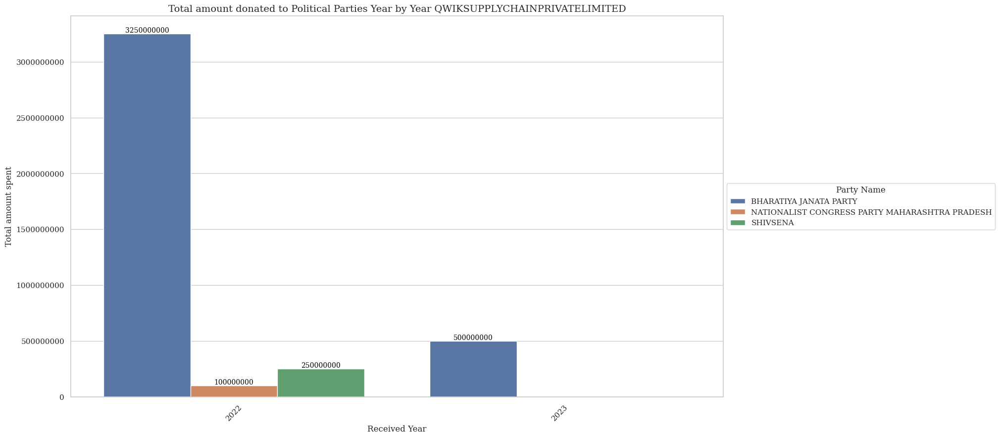

In [180]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [181]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

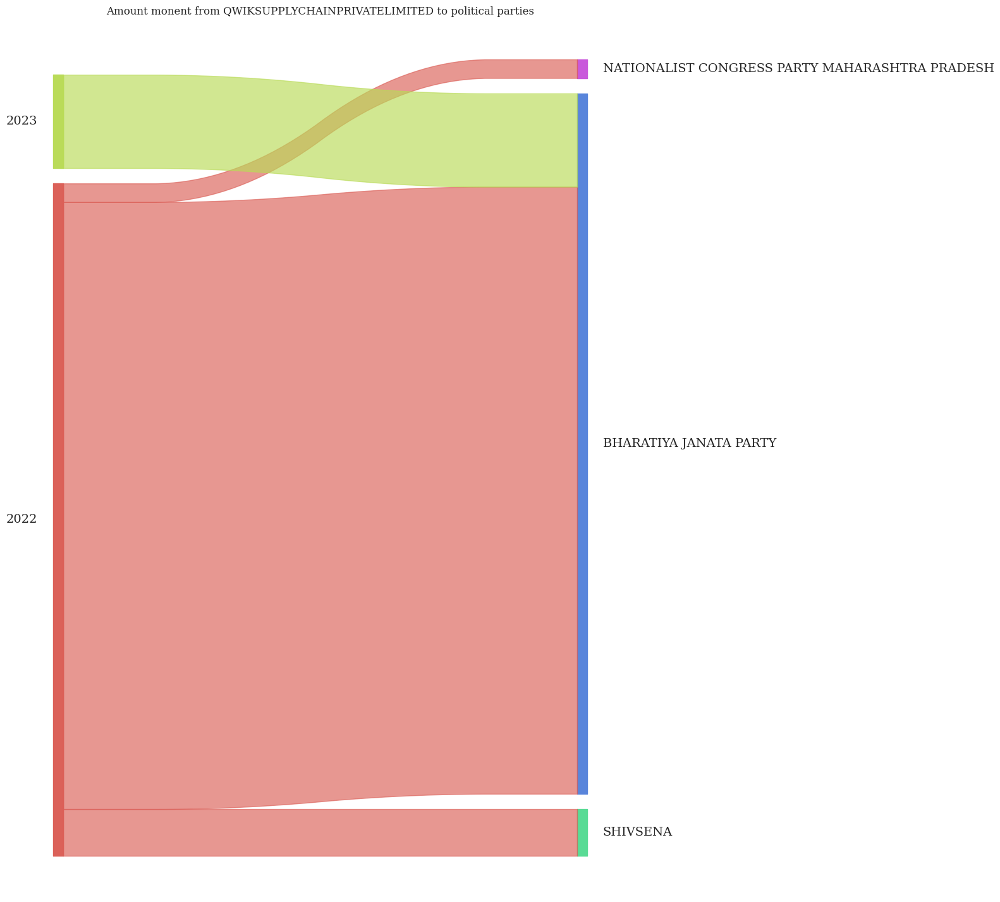

In [182]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [183]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'HALDIA ENERGY LIMITED',

In [184]:
company_name =  'HALDIA ENERGY LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
110,00001202201050000002113,2022-01-05,2022-01-05,2022-01-19,HALDIA ENERGY LIMITED,OC,10111.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10111,2022-01-13,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
112,00001202201050000002113,2022-01-05,2022-01-05,2022-01-19,HALDIA ENERGY LIMITED,OC,10113.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10113,2022-01-13,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
114,00001202201050000002113,2022-01-05,2022-01-05,2022-01-19,HALDIA ENERGY LIMITED,OC,10115.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10115,2022-01-13,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
116,00001202201050000002113,2022-01-05,2022-01-05,2022-01-19,HALDIA ENERGY LIMITED,OC,10117.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10117,2022-01-13,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
118,00001202201050000002113,2022-01-05,2022-01-05,2022-01-19,HALDIA ENERGY LIMITED,OC,10119.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10119,2022-01-13,ALL INDIA TRINAMOOL CONGRESS,*******0688,1.0,3490777.0,2022.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15575,00001201905070000001348,2019-05-07,2019-05-07,2019-05-21,HALDIA ENERGY LIMITED,TL,11518.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11518,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15576,00001201905070000001348,2019-05-07,2019-05-07,2019-05-21,HALDIA ENERGY LIMITED,TL,11519.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11519,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15577,00001201905070000001348,2019-05-07,2019-05-07,2019-05-21,HALDIA ENERGY LIMITED,TL,11520.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11520,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15578,00001201905070000001348,2019-05-07,2019-05-07,2019-05-21,HALDIA ENERGY LIMITED,TL,11521.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11521,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019


In [185]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,1.600000e+08,34
1,2020,2.100000e+08,21
2,2021,1.050000e+09,105
3,2022,8.500000e+08,85
4,2023,1.150000e+09,115
5,2024,3.500000e+08,35


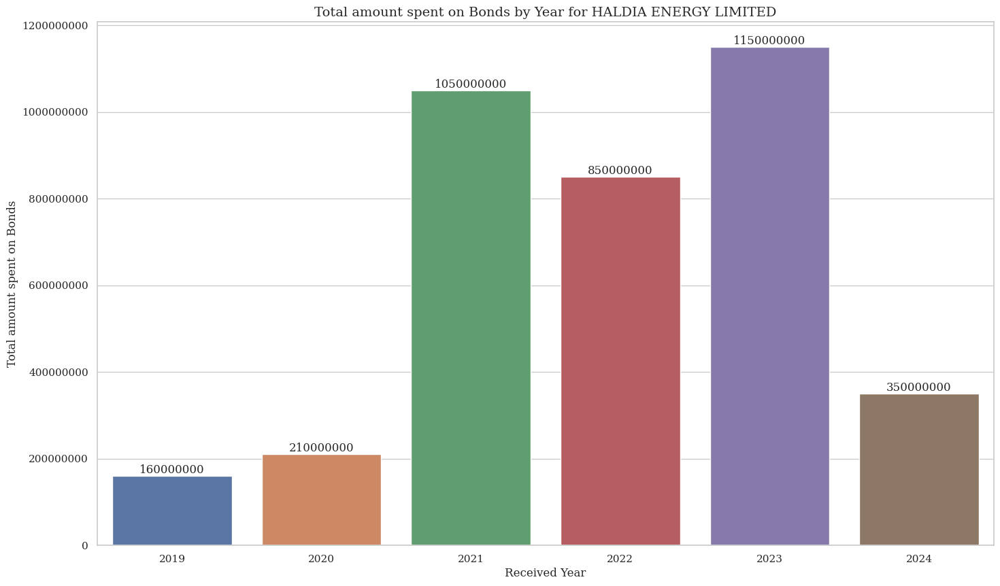

In [186]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

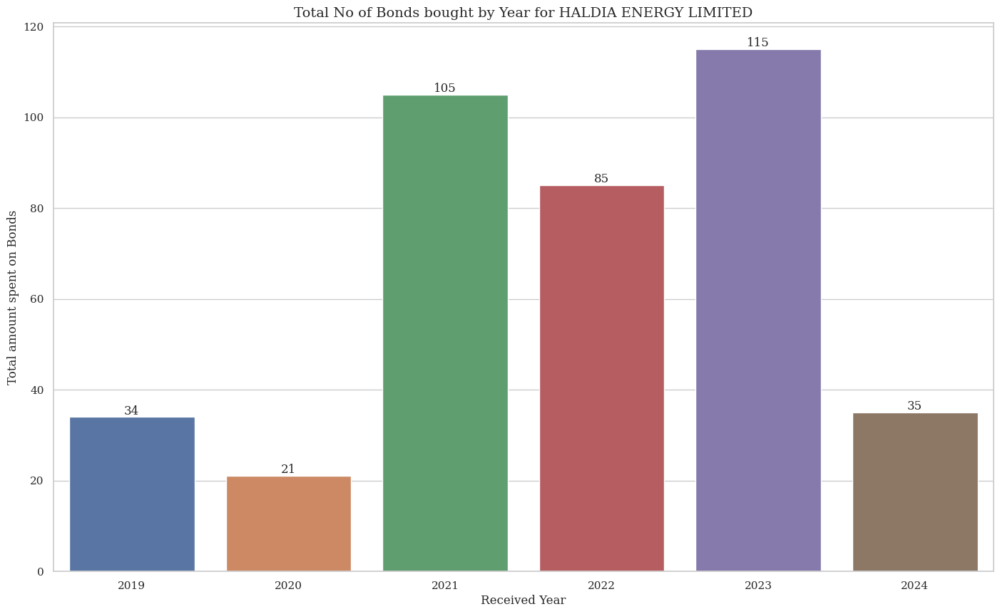

In [187]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [188]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,160000000.0,34
1,2020,ALL INDIA TRINAMOOL CONGRESS,210000000.0,21
2,2021,ALL INDIA TRINAMOOL CONGRESS,550000000.0,55
3,2021,BHARATIYA JANATA PARTY,350000000.0,35
4,2021,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",150000000.0,15
5,2022,ALL INDIA TRINAMOOL CONGRESS,750000000.0,75
6,2022,BHARATIYA JANATA PARTY,100000000.0,10
7,2023,ALL INDIA TRINAMOOL CONGRESS,950000000.0,95
8,2023,BHARATIYA JANATA PARTY,200000000.0,20
9,2024,ALL INDIA TRINAMOOL CONGRESS,350000000.0,35


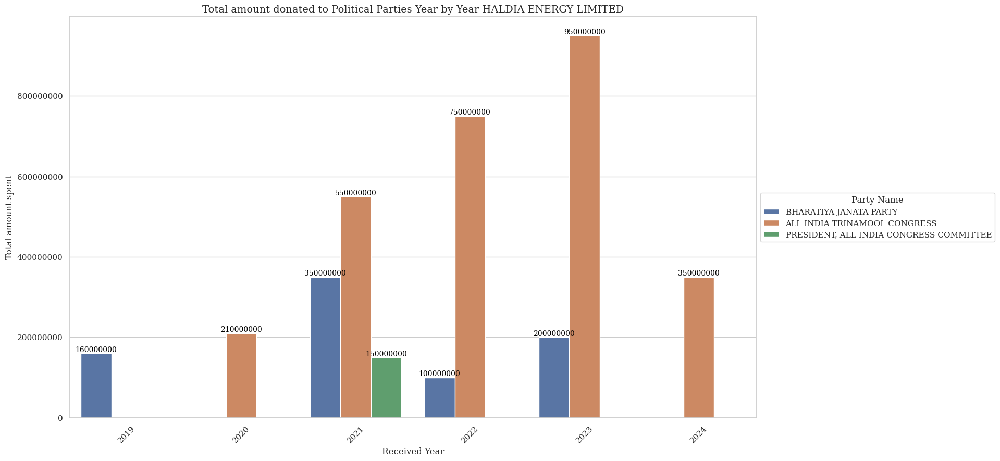

In [189]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [190]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

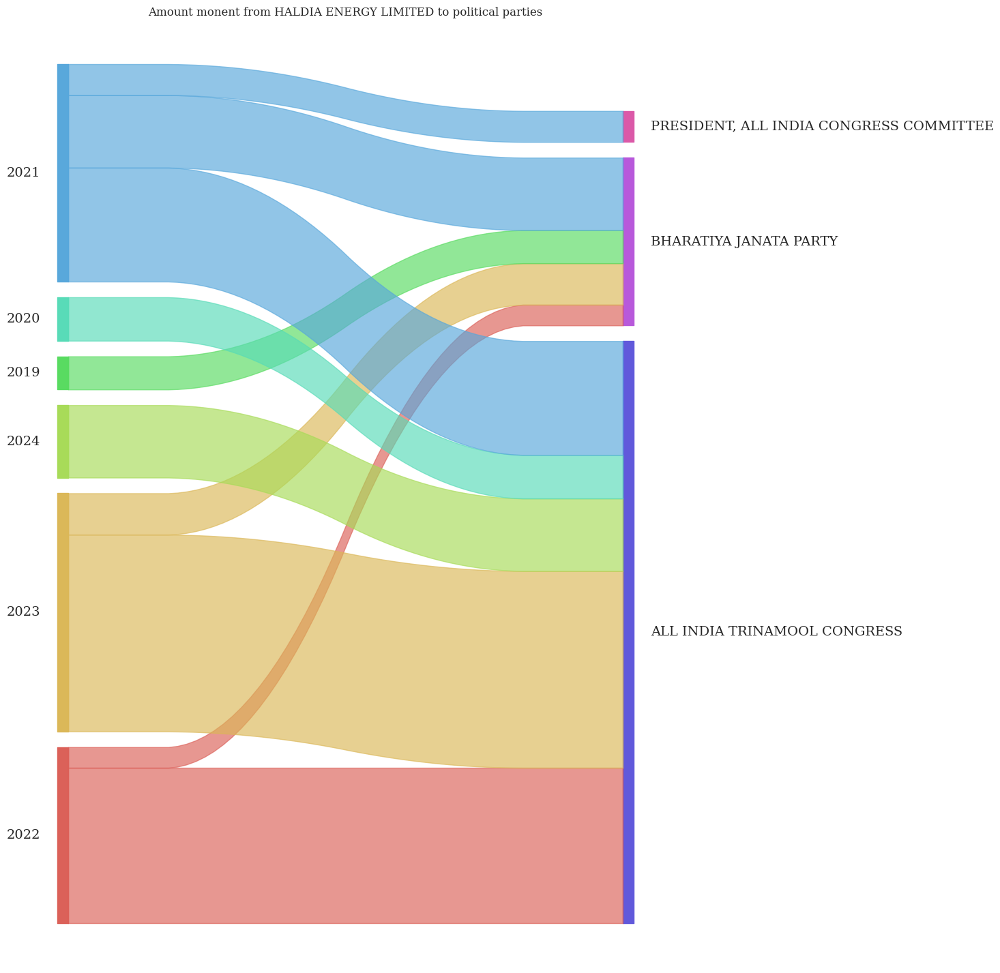

In [191]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [192]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'DLF COMMERCIAL DEVELOPERS LIMITED',

In [193]:
company_name =  'DLF COMMERCIAL DEVELOPERS LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
1719,00691202204070000002347,2022-04-07,2022-04-07,2022-04-21,DLF COMMERCIAL DEVELOPERS LIMITED,OC,11701.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC11701,2022-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1721,00691202204070000002347,2022-04-07,2022-04-07,2022-04-21,DLF COMMERCIAL DEVELOPERS LIMITED,OC,11703.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC11703,2022-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1723,00691202204070000002347,2022-04-07,2022-04-07,2022-04-21,DLF COMMERCIAL DEVELOPERS LIMITED,OC,11705.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC11705,2022-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1725,00691202204070000002347,2022-04-07,2022-04-07,2022-04-21,DLF COMMERCIAL DEVELOPERS LIMITED,OC,11707.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC11707,2022-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1727,00691202204070000002347,2022-04-07,2022-04-07,2022-04-21,DLF COMMERCIAL DEVELOPERS LIMITED,OC,11709.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC11709,2022-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11584,00691202201100000002243,2022-01-10,2022-01-10,2022-01-24,DLF COMMERCIAL DEVELOPERS LIMITED,OC,9374.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC9374,2022-01-17,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
11585,00691202201100000002244,2022-01-10,2022-01-10,2022-01-24,DLF COMMERCIAL DEVELOPERS LIMITED,OC,9375.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC9375,2022-01-17,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
11587,00691202201100000002244,2022-01-10,2022-01-10,2022-01-24,DLF COMMERCIAL DEVELOPERS LIMITED,OC,9377.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC9377,2022-01-17,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
11589,00691202201100000002244,2022-01-10,2022-01-10,2022-01-24,DLF COMMERCIAL DEVELOPERS LIMITED,OC,9379.0,691.0,3428540.0,Delhi,691.0,New Delhi,OC9379,2022-01-17,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022


In [194]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,150000000.0,15
1,2020,150000000.0,15
2,2021,100000000.0,10
3,2022,900000000.0,90


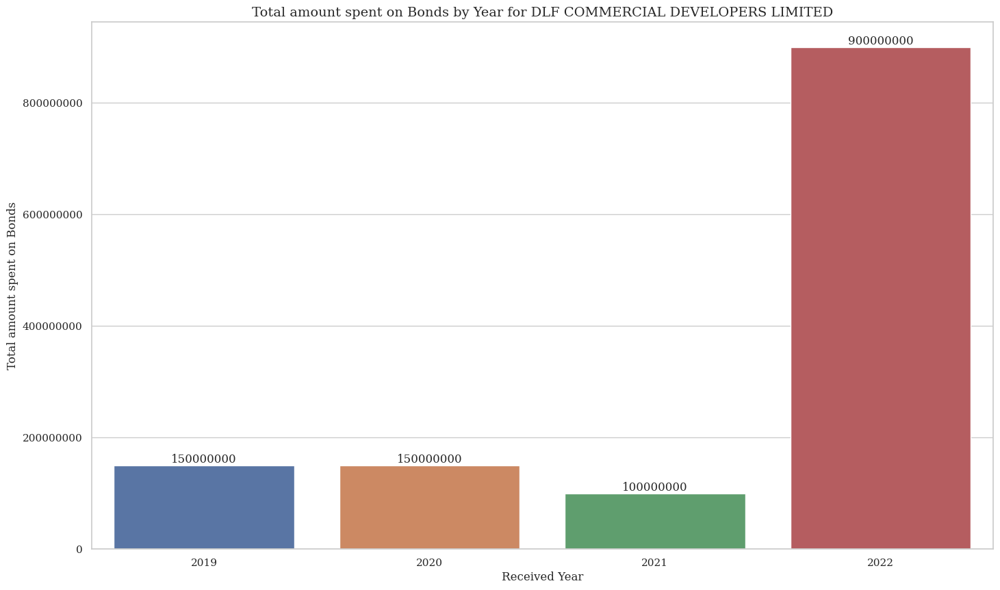

In [195]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

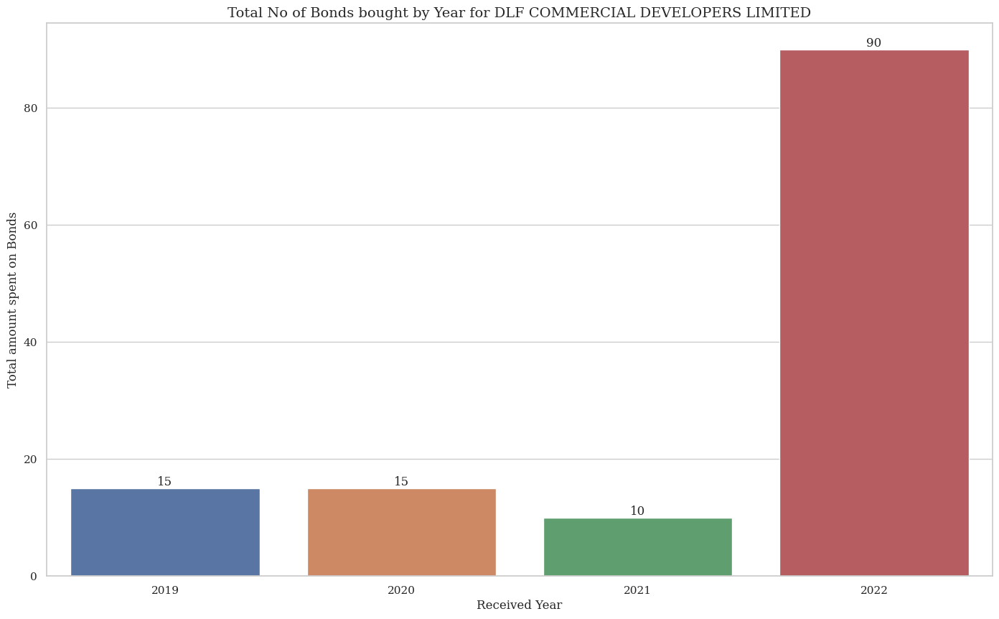

In [196]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [197]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,150000000.0,15
1,2020,BHARATIYA JANATA PARTY,150000000.0,15
2,2021,BHARATIYA JANATA PARTY,100000000.0,10
3,2022,BHARATIYA JANATA PARTY,900000000.0,90


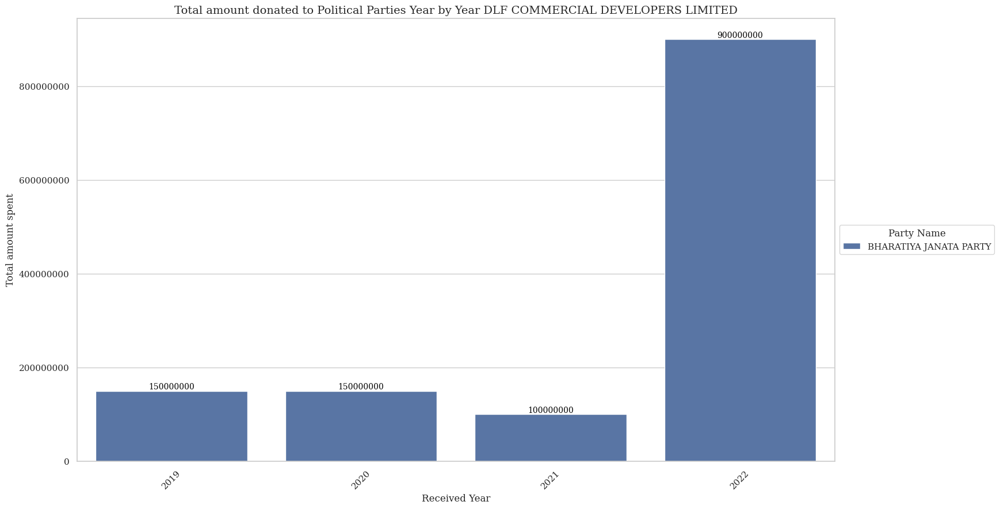

In [198]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [199]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

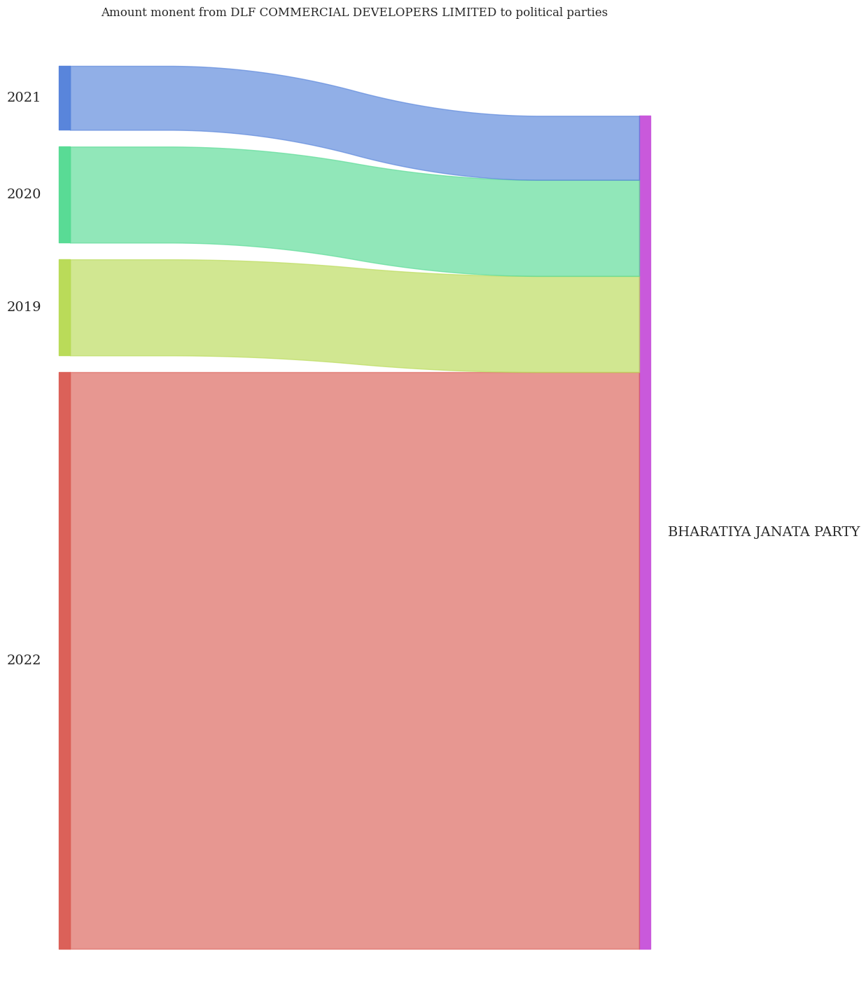

In [200]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [201]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'ESSEL MINING AND INDS LTD',

In [202]:
company_name =  'ESSEL MINING AND INDS LTD'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
280,00001202207010000002439,2022-07-01,2022-07-01,2022-07-15,ESSEL MINING AND INDS LTD,OC,10268.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10268,2022-07-04,BIJU JANATA DAL,*******4340,41.0,4609514.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
283,00001202207010000002439,2022-07-01,2022-07-01,2022-07-15,ESSEL MINING AND INDS LTD,OC,10270.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10270,2022-07-04,BIJU JANATA DAL,*******4340,41.0,4609514.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
285,00001202207010000002439,2022-07-01,2022-07-01,2022-07-15,ESSEL MINING AND INDS LTD,OC,10272.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10272,2022-07-04,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
287,00001202207010000002439,2022-07-01,2022-07-01,2022-07-15,ESSEL MINING AND INDS LTD,OC,10274.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10274,2022-07-04,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
289,00001202207010000002439,2022-07-01,2022-07-01,2022-07-15,ESSEL MINING AND INDS LTD,OC,10276.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10276,2022-07-04,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17220,00001202104050000001713,2021-04-05,2021-04-05,2021-04-19,ESSEL MINING AND INDS LTD,TL,13790.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL13790,2021-04-07,BIJU JANATA DAL,*******4340,41.0,2804026.0,2021.0,Odisha,41.0,Bhubaneswar,1000000.0,2021
17222,00001202104050000001713,2021-04-05,2021-04-05,2021-04-19,ESSEL MINING AND INDS LTD,TL,13792.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL13792,2021-04-07,BIJU JANATA DAL,*******4340,41.0,2804026.0,2021.0,Odisha,41.0,Bhubaneswar,1000000.0,2021
17224,00001202104050000001713,2021-04-05,2021-04-05,2021-04-19,ESSEL MINING AND INDS LTD,TL,13794.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL13794,2021-04-07,BIJU JANATA DAL,*******4340,41.0,2804026.0,2021.0,Odisha,41.0,Bhubaneswar,1000000.0,2021
17226,00001202104050000001713,2021-04-05,2021-04-05,2021-04-19,ESSEL MINING AND INDS LTD,TL,13796.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL13796,2021-04-07,BIJU JANATA DAL,*******4340,41.0,2804026.0,2021.0,Odisha,41.0,Bhubaneswar,1000000.0,2021


In [203]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,5.000000e+08,59
1,2020,2.000000e+08,20
2,2021,1.045000e+09,109
3,2022,5.000000e+08,50


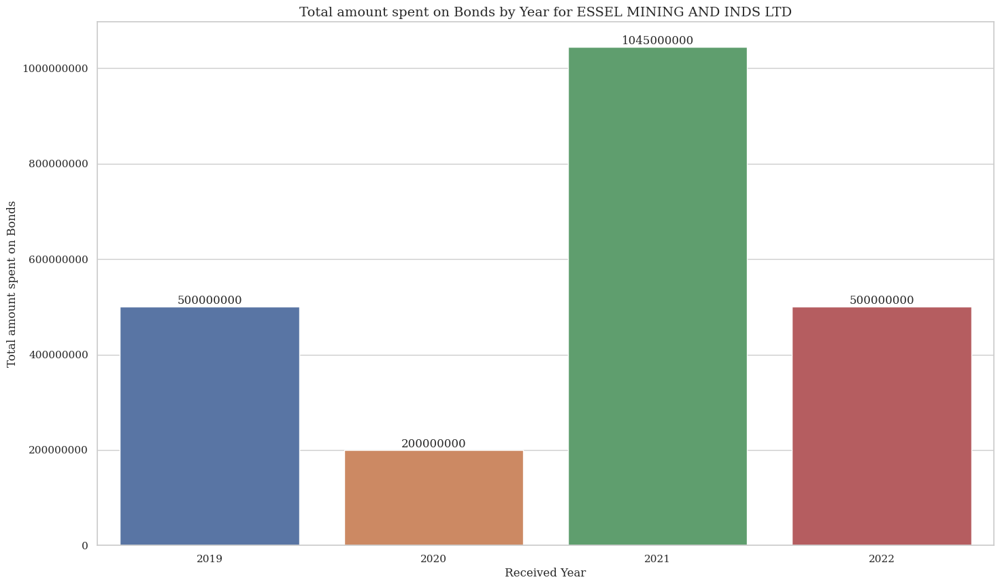

In [204]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

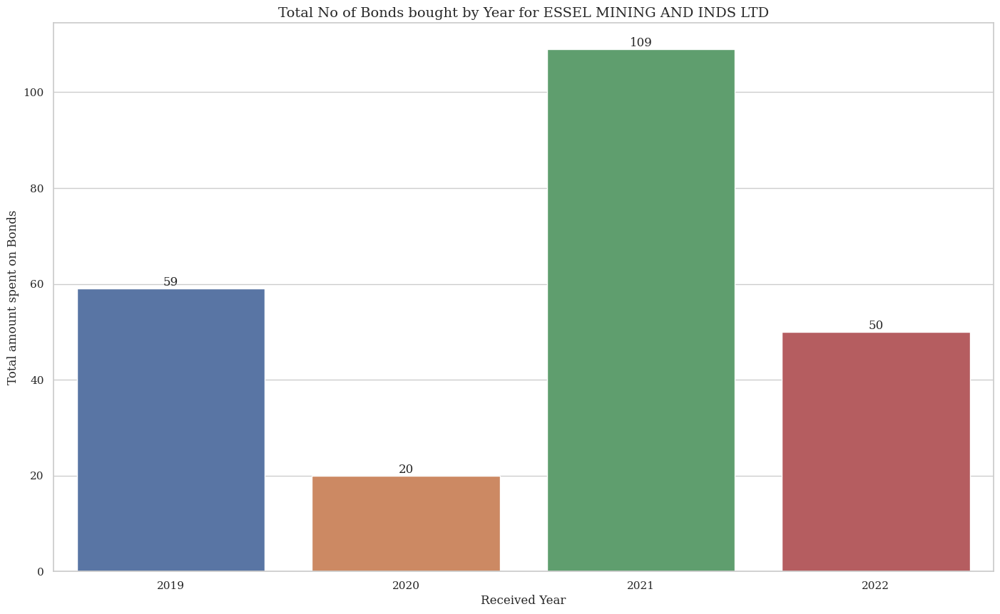

In [205]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [206]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,5.000000e+08,59
1,2020,BIJU JANATA DAL,2.000000e+08,20
2,2021,BIJU JANATA DAL,1.045000e+09,109
3,2022,BIJU JANATA DAL,5.000000e+08,50


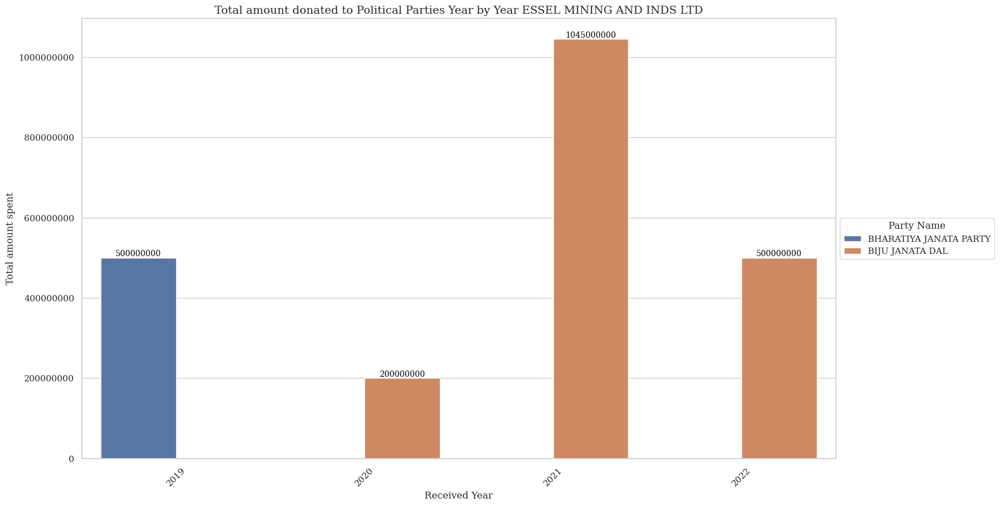

In [207]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [208]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

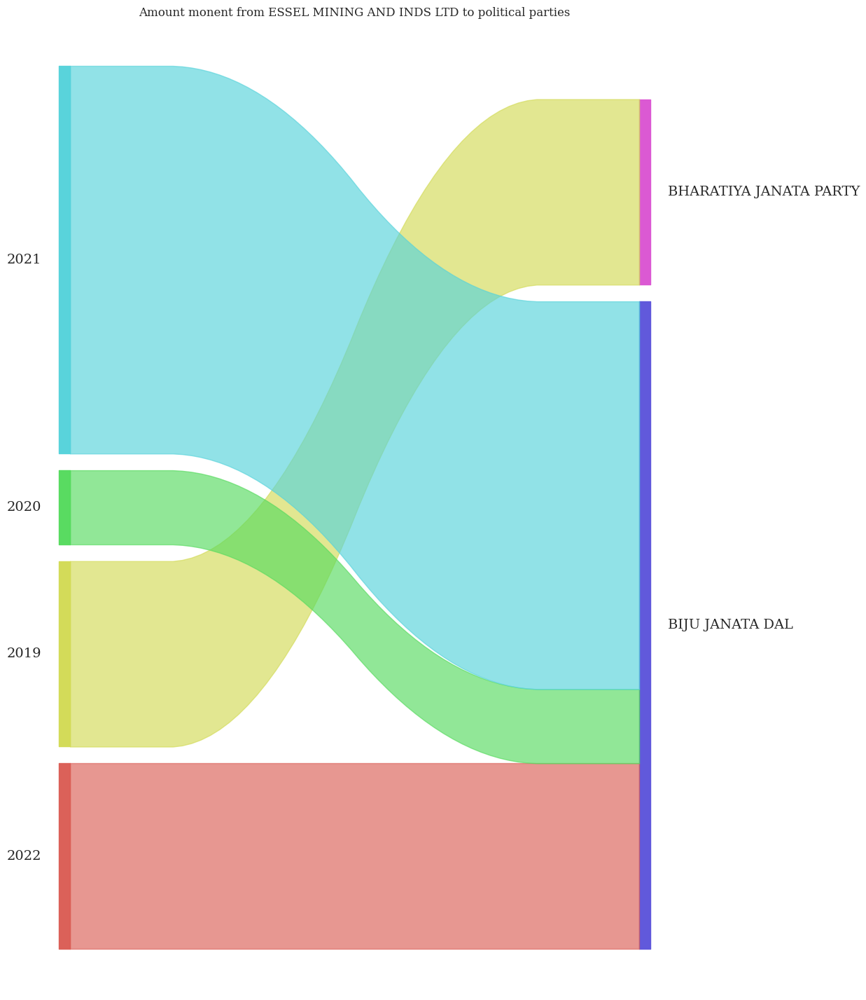

In [209]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [210]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'MKJ ENTERPRISES LIMITED',

In [211]:
company_name =  'MKJ ENTERPRISES LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
247,00001202204080000002384,2022-04-08,2022-04-08,2022-04-22,MKJ ENTERPRISES LIMITED,OC,10238.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10238,2022-04-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
250,00001202204080000002384,2022-04-08,2022-04-08,2022-04-22,MKJ ENTERPRISES LIMITED,OC,10240.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10240,2022-04-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
252,00001202204080000002384,2022-04-08,2022-04-08,2022-04-22,MKJ ENTERPRISES LIMITED,OC,10242.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10242,2022-04-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,3428540.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
254,00001202207010000002438,2022-07-01,2022-07-01,2022-07-15,MKJ ENTERPRISES LIMITED,OC,10244.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10244,2022-07-06,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
256,00001202207010000002438,2022-07-01,2022-07-01,2022-07-15,MKJ ENTERPRISES LIMITED,OC,10246.0,1.0,6405134.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC10246,2022-07-06,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19016,00001202310120000003430,2023-10-12,2023-10-12,2023-10-26,MKJ ENTERPRISES LIMITED,TL,15739.0,1.0,6563457.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL15739,2023-10-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,1000000.0,2023
19018,00001202310120000003430,2023-10-12,2023-10-12,2023-10-26,MKJ ENTERPRISES LIMITED,TL,15741.0,1.0,6563457.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL15741,2023-10-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,1000000.0,2023
19020,00001202310120000003430,2023-10-12,2023-10-12,2023-10-26,MKJ ENTERPRISES LIMITED,TL,15743.0,1.0,6563457.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL15743,2023-10-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,1000000.0,2023
19022,00001202310120000003430,2023-10-12,2023-10-12,2023-10-26,MKJ ENTERPRISES LIMITED,TL,15745.0,1.0,6563457.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL15745,2023-10-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,1000000.0,2023


In [212]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2022,1.725000e+08,24
1,2023,1.111000e+09,211


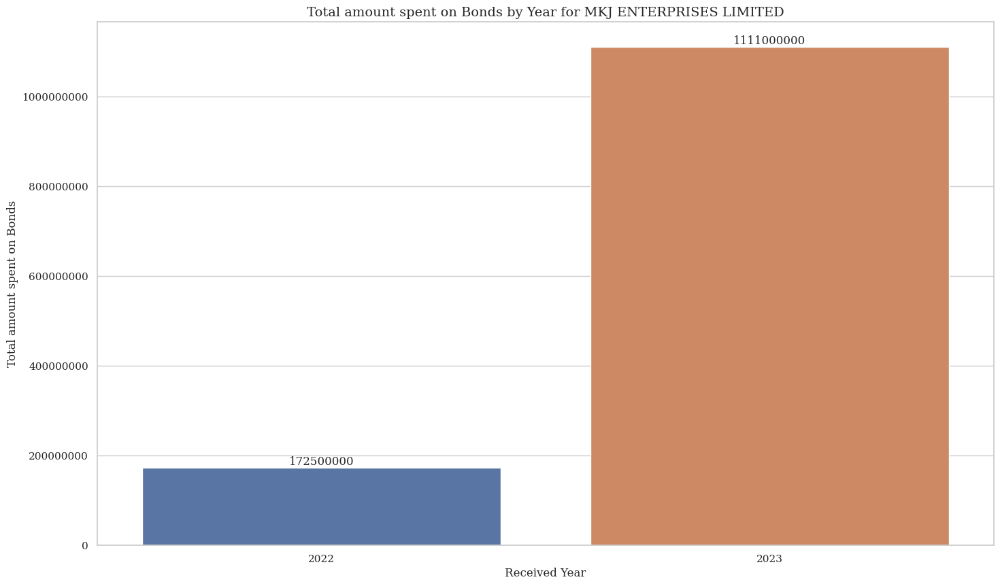

In [213]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

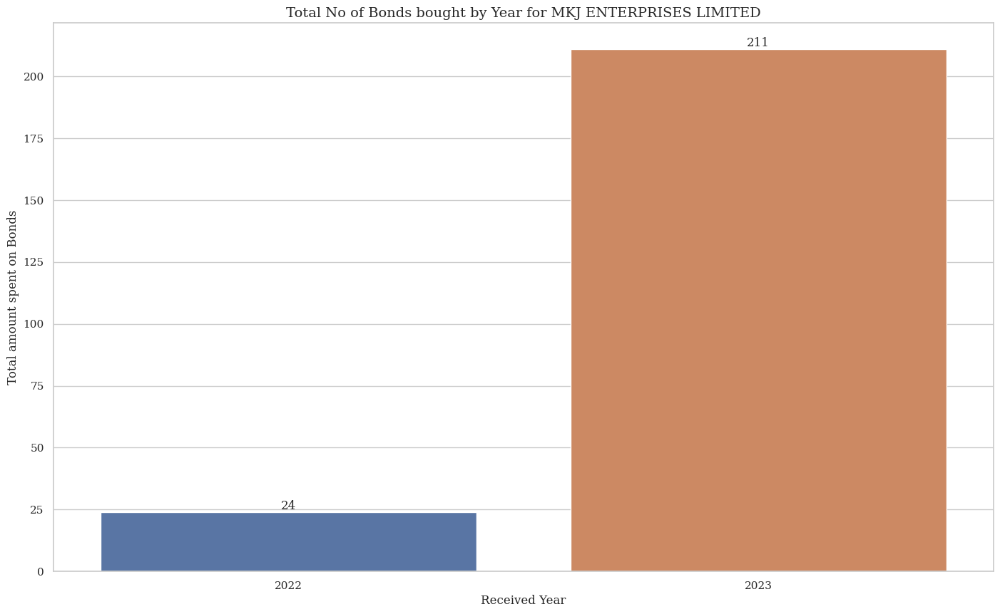

In [214]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [215]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2022,ALL INDIA TRINAMOOL CONGRESS,20000000.0,2
1,2022,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",152500000.0,22
2,2023,AAM AADMI PARTY,70000000.0,7
3,2023,ALL INDIA TRINAMOOL CONGRESS,165000000.0,66
4,2023,BHARAT RASHTRA SAMITHI,100000000.0,10
5,2023,BHARATIYA JANATA PARTY,125000000.0,26
6,2023,BIJU JANATA DAL,100000000.0,10
7,2023,JHARKHAND MUKTI MORCHA,10000000.0,1
8,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",541000000.0,91


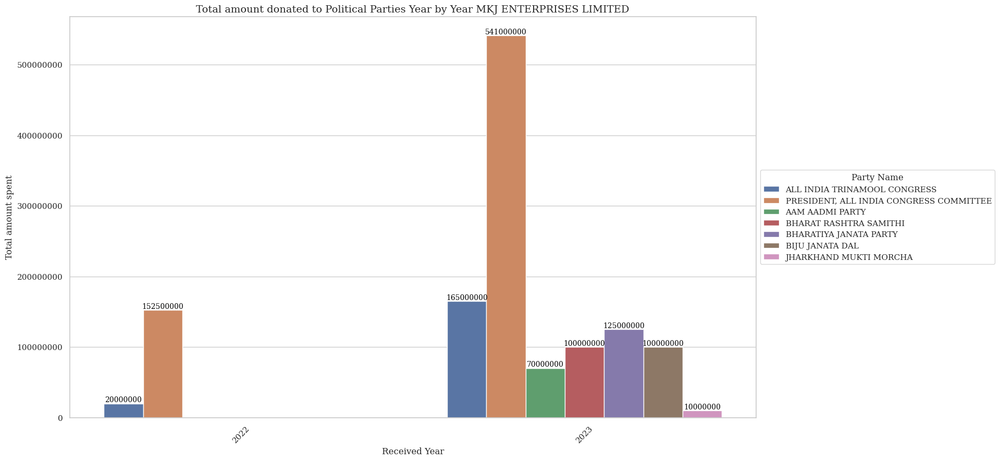

In [216]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [217]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

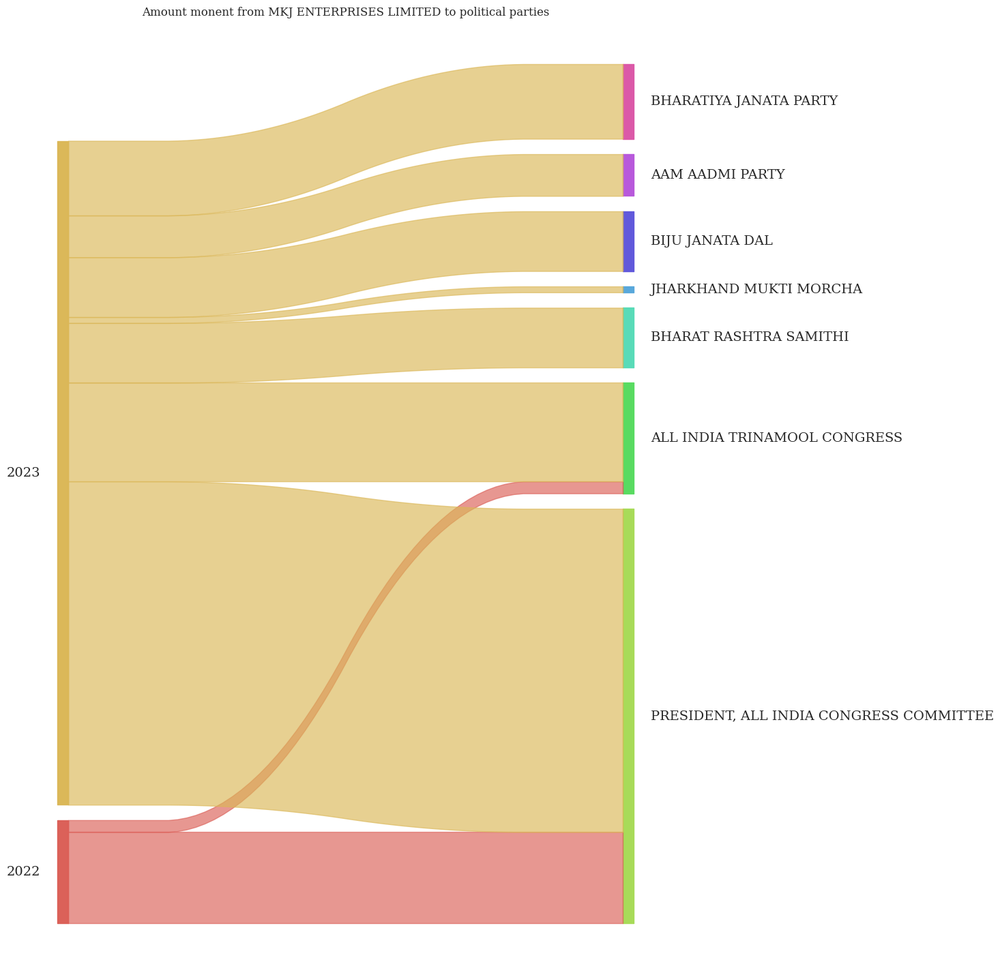

In [218]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [219]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'WESTERN UP POWER TRANSMISSION COMPANY LI MITED',

In [220]:
company_name =  'WESTERN UP POWER TRANSMISSION COMPANY LI MITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
5599,00847202310060000003308,2023-10-06,2023-10-06,2023-10-20,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,15826.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC15826,2023-10-10,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
5600,00847202310070000003312,2023-10-07,2023-10-07,2023-10-21,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,15827.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC15827,2023-10-10,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
5601,00847202310060000003308,2023-10-06,2023-10-06,2023-10-20,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,15828.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC15828,2023-10-10,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
5602,00847202310070000003312,2023-10-07,2023-10-07,2023-10-21,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,15829.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC15829,2023-10-10,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
5603,00847202310060000003308,2023-10-06,2023-10-06,2023-10-20,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,15830.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC15830,2023-10-10,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,7516991.0,2023.0,Delhi,691.0,New Delhi,10000000.0,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6838,00847202401110000003738,2024-01-11,2024-01-11,2024-01-25,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,17083.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC17083,2024-01-16,TELUGU DESAM PARTY,*******3067,847.0,6391354.0,2024.0,Telangana,847.0,Hyderabad,10000000.0,2024
6840,00847202401110000003738,2024-01-11,2024-01-11,2024-01-25,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,17085.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC17085,2024-01-16,TELUGU DESAM PARTY,*******3067,847.0,6391354.0,2024.0,Telangana,847.0,Hyderabad,10000000.0,2024
6842,00847202401110000003738,2024-01-11,2024-01-11,2024-01-25,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,17087.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC17087,2024-01-16,TELUGU DESAM PARTY,*******3067,847.0,6391354.0,2024.0,Telangana,847.0,Hyderabad,10000000.0,2024
6843,00847202401110000003738,2024-01-11,2024-01-11,2024-01-25,WESTERN UP POWER TRANSMISSION COMPANY LI MITED,OC,17089.0,847.0,6458726.0,Telangana,847.0,Hyderabad,OC17089,2024-01-16,TELUGU DESAM PARTY,*******3067,847.0,6391354.0,2024.0,Telangana,847.0,Hyderabad,10000000.0,2024


In [221]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2023,1.900000e+09,190
1,2024,3.000000e+08,30


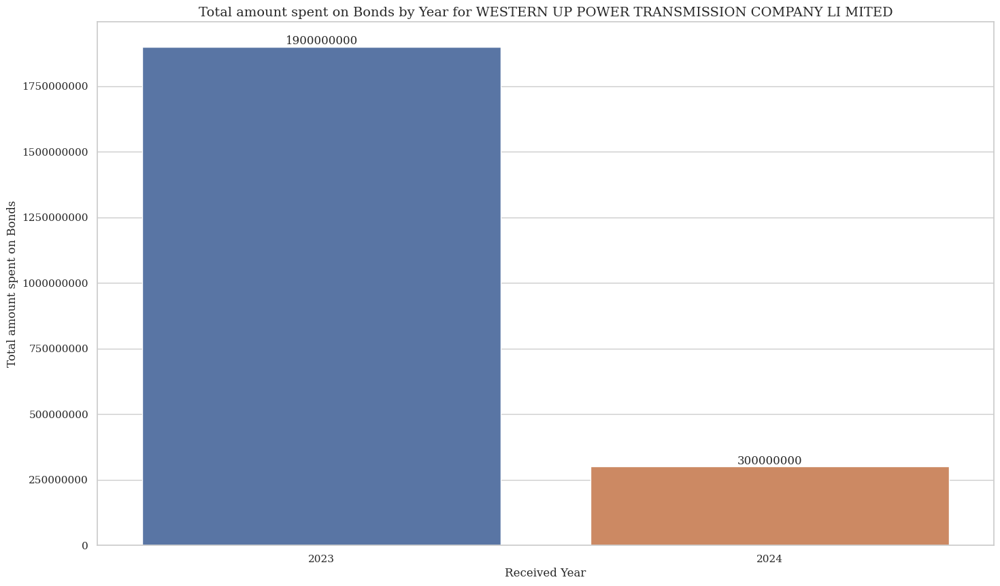

In [222]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

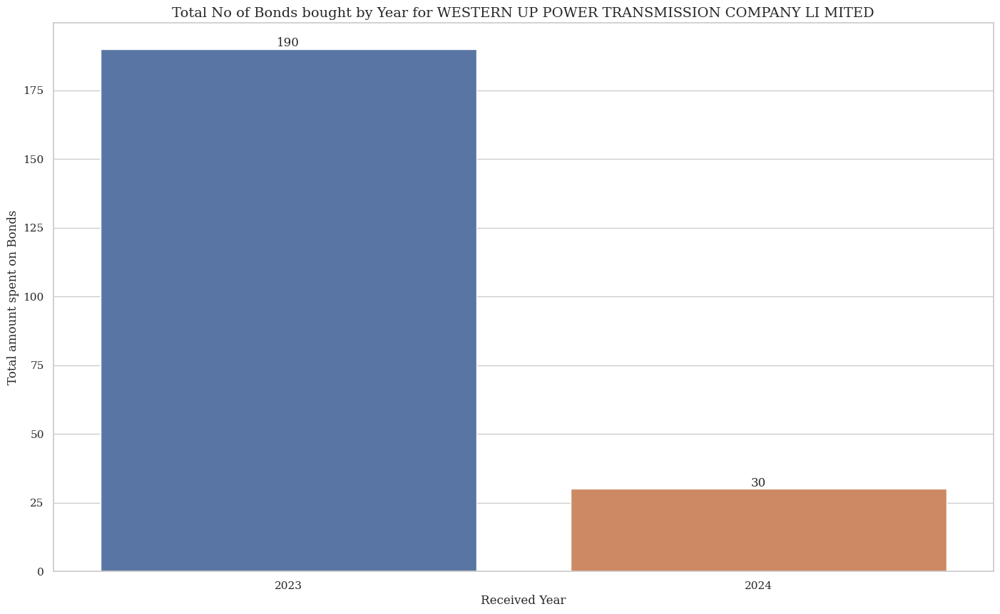

In [223]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [224]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2023,BHARATIYA JANATA PARTY,8.000000e+08,80
1,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",1.100000e+09,110
2,2024,JANASENA PARTY,1.000000e+08,10
3,2024,TELUGU DESAM PARTY,2.000000e+08,20


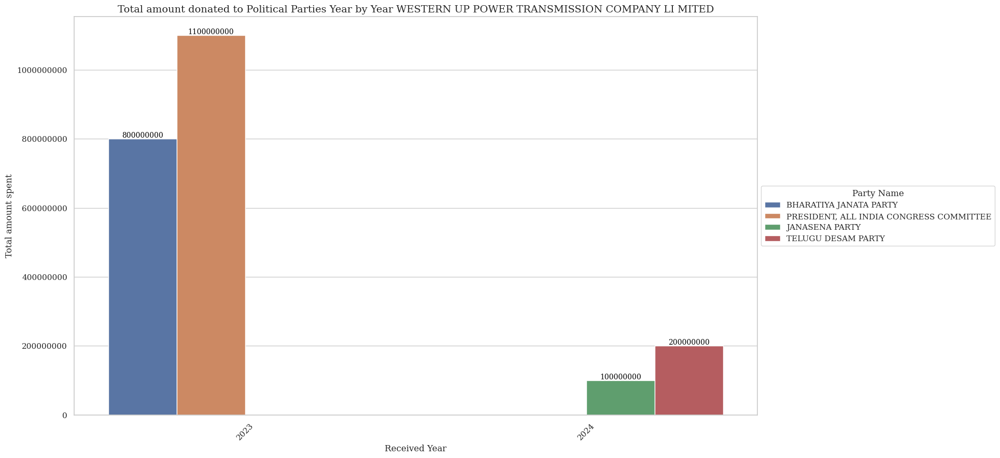

In [225]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [226]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

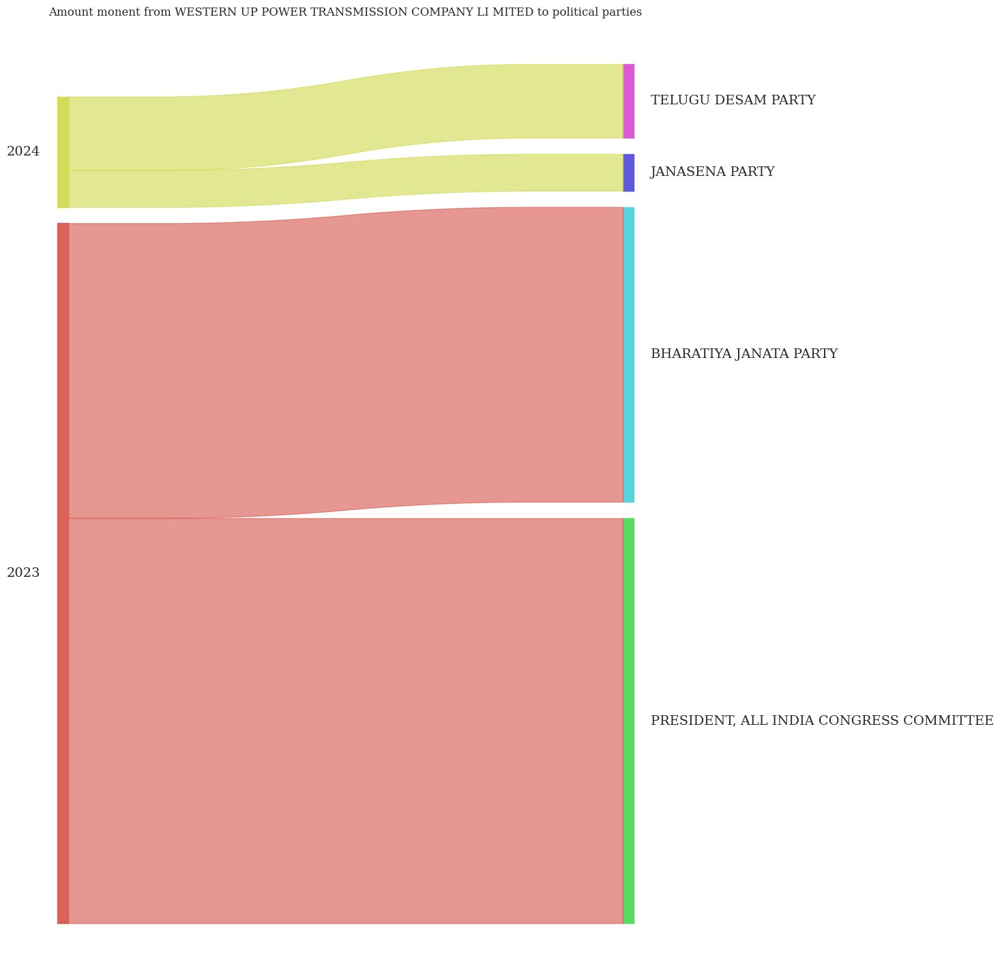

In [227]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [228]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'BHARTI AIRTEL LIMITED',

In [229]:
company_name =  'BHARTI AIRTEL LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
1922,00691202210100000002578,2022-10-10,2022-10-10,2022-10-24,BHARTI AIRTEL LIMITED,OC,11905.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11905,2022-10-15,BHARATIYA JANATA PARTY,*******8244,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1924,00691202210100000002578,2022-10-10,2022-10-10,2022-10-24,BHARTI AIRTEL LIMITED,OC,11907.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11907,2022-10-15,BHARATIYA JANATA PARTY,*******8244,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1926,00691202210100000002578,2022-10-10,2022-10-10,2022-10-24,BHARTI AIRTEL LIMITED,OC,11909.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11909,2022-10-15,BHARATIYA JANATA PARTY,*******8244,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1928,00691202210100000002578,2022-10-10,2022-10-10,2022-10-24,BHARTI AIRTEL LIMITED,OC,11911.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11911,2022-10-15,BHARATIYA JANATA PARTY,*******8244,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
1930,00691202210100000002578,2022-10-10,2022-10-10,2022-10-24,BHARTI AIRTEL LIMITED,OC,11913.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11913,2022-10-15,BHARATIYA JANATA PARTY,*******8244,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16054,00691201904180000001294,2019-04-18,2019-04-18,2019-05-02,BHARTI AIRTEL LIMITED,TL,12685.0,691.0,3300196.0,Delhi,691.0,New Delhi,TL12685,2019-04-20,BHARATIYA JANATA PARTY,*******8244,691.0,2511282.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
16055,00691201904180000001294,2019-04-18,2019-04-18,2019-05-02,BHARTI AIRTEL LIMITED,TL,12686.0,691.0,3300196.0,Delhi,691.0,New Delhi,TL12686,2019-04-20,BHARATIYA JANATA PARTY,*******8244,691.0,2511282.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
16056,00691201904180000001294,2019-04-18,2019-04-18,2019-05-02,BHARTI AIRTEL LIMITED,TL,12687.0,691.0,3300196.0,Delhi,691.0,New Delhi,TL12687,2019-04-20,BHARATIYA JANATA PARTY,*******8244,691.0,2511282.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
16057,00691201904180000001294,2019-04-18,2019-04-18,2019-05-02,BHARTI AIRTEL LIMITED,TL,12688.0,691.0,3300196.0,Delhi,691.0,New Delhi,TL12688,2019-04-20,BHARATIYA JANATA PARTY,*******8244,691.0,2511282.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019


In [230]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,150000000.0,33
1,2021,50000000.0,5
2,2022,350000000.0,35
3,2023,930000000.0,93
4,2024,500000000.0,50


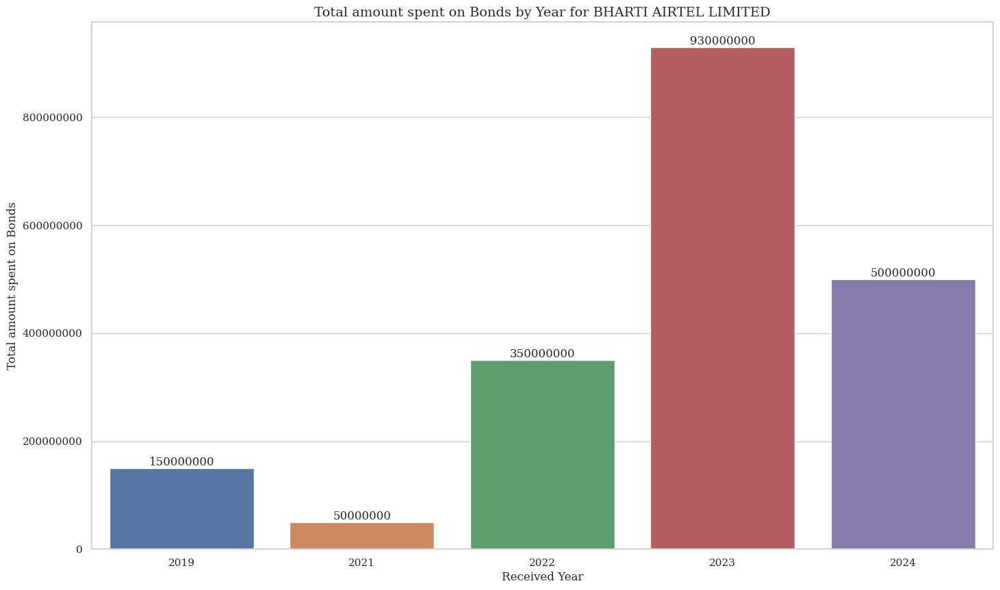

In [231]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

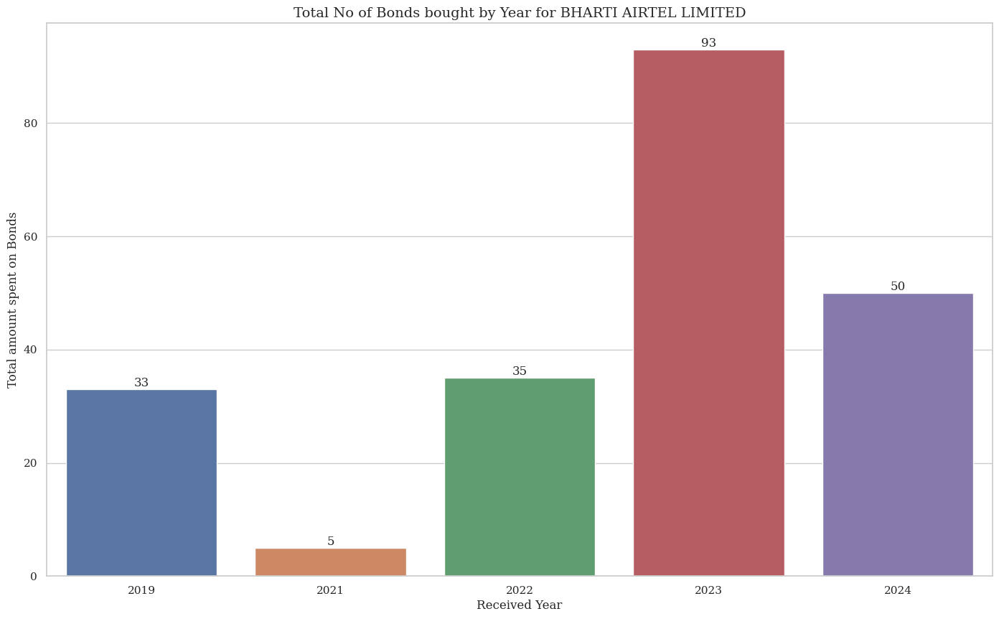

In [232]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [233]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,144000000.0,27
1,2019,JAMMU AND KASHMIR NATIONAL CONFERENCE,5000000.0,5
2,2019,RASHTRIYA JANTA DAL,1000000.0,1
3,2021,BHARATIYA JANATA PARTY,50000000.0,5
4,2022,BHARATIYA JANATA PARTY,350000000.0,35
5,2023,BHARATIYA JANATA PARTY,930000000.0,93
6,2024,BHARATIYA JANATA PARTY,500000000.0,50


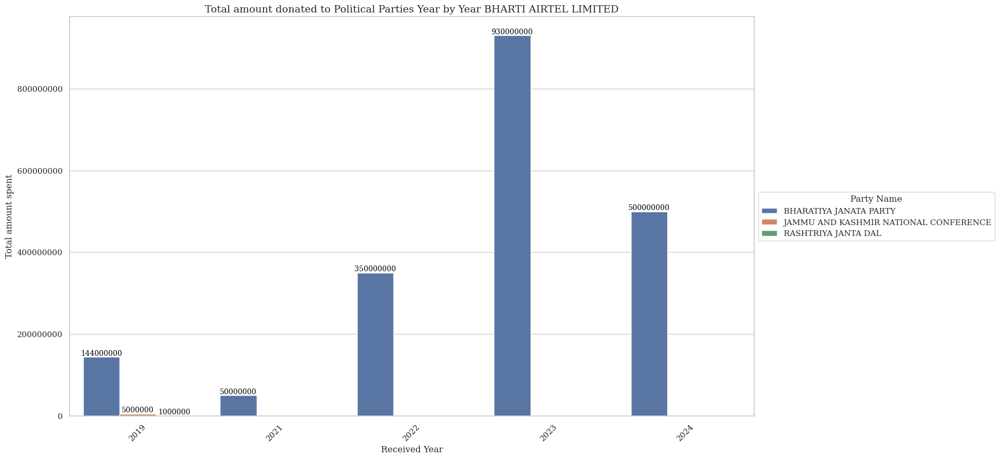

In [234]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [235]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

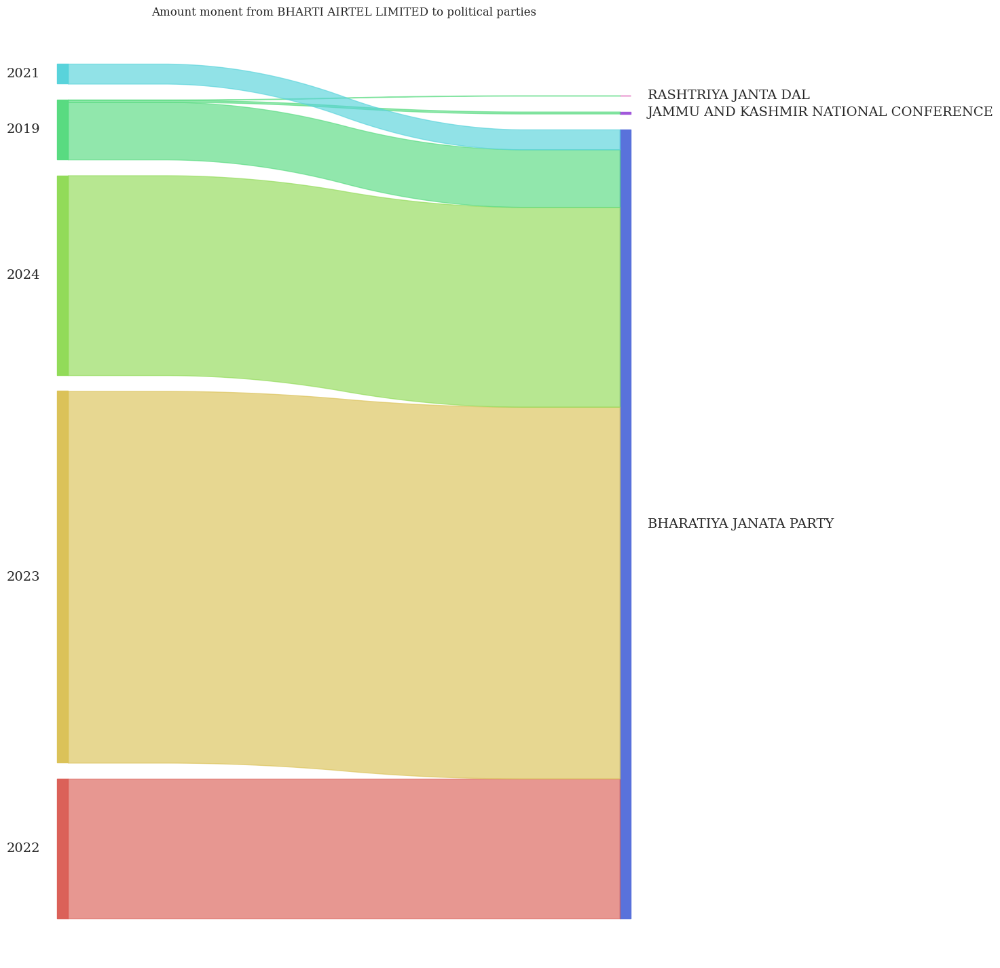

In [236]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [237]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'TORRENT POWER LIMITED',

In [238]:
company_name =  'TORRENT POWER LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
3176,01355202304110000002969,2023-04-11,2023-04-11,2023-04-25,TORRENT POWER LIMITED,OC,13157.0,1355.0,1023671.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,OC13157,2023-04-13,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,*******6138,300.0,4537955.0,2023.0,Maharashtra,300.0,Mumbai,10000000.0,2023
3250,01355202401090000003700,2024-01-09,2024-01-09,2024-01-23,TORRENT POWER LIMITED,OC,13231.0,1355.0,1023671.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,OC13231,2024-01-12,BHARATIYA JANATA PARTY,*******8244,691.0,8212066.0,2024.0,Delhi,691.0,New Delhi,10000000.0,2024
3255,01355202401090000003700,2024-01-09,2024-01-09,2024-01-23,TORRENT POWER LIMITED,OC,13236.0,1355.0,1023671.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,OC13236,2024-01-12,BHARATIYA JANATA PARTY,*******8244,691.0,8212066.0,2024.0,Delhi,691.0,New Delhi,10000000.0,2024
3257,01355202401090000003700,2024-01-09,2024-01-09,2024-01-23,TORRENT POWER LIMITED,OC,13238.0,1355.0,1023671.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,OC13238,2024-01-12,BHARATIYA JANATA PARTY,*******8244,691.0,8212066.0,2024.0,Delhi,691.0,New Delhi,10000000.0,2024
3271,01355202401090000003700,2024-01-09,2024-01-09,2024-01-23,TORRENT POWER LIMITED,OC,13252.0,1355.0,1023671.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,OC13252,2024-01-12,BHARATIYA JANATA PARTY,*******8244,691.0,8212066.0,2024.0,Delhi,691.0,New Delhi,10000000.0,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20178,01355202104070000001736,2021-04-07,2021-04-07,2021-04-21,TORRENT POWER LIMITED,TL,945.0,1355.0,5140277.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,TL945,2021-04-12,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2021.0,Delhi,691.0,New Delhi,1000000.0,2021
20235,01355202104070000001736,2021-04-07,2021-04-07,2021-04-21,TORRENT POWER LIMITED,TL,951.0,1355.0,5140277.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,TL951,2021-04-12,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2021.0,Delhi,691.0,New Delhi,1000000.0,2021
20255,01355202104070000001736,2021-04-07,2021-04-07,2021-04-21,TORRENT POWER LIMITED,TL,957.0,1355.0,5140277.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,TL957,2021-04-12,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2021.0,Delhi,691.0,New Delhi,1000000.0,2021
20290,01355202104070000001736,2021-04-07,2021-04-07,2021-04-21,TORRENT POWER LIMITED,TL,961.0,1355.0,5140277.0,"Gujarat, Dadar & Nagar Haveliand Daman & Diu",1355.0,Gandhinagar,TL961,2021-04-12,BHARATIYA JANATA PARTY,*******8244,691.0,7516991.0,2021.0,Delhi,691.0,New Delhi,1000000.0,2021


In [239]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,175000000.0,22
1,2021,75000000.0,12
2,2022,430000000.0,133
3,2023,135000000.0,18
4,2024,250000000.0,25


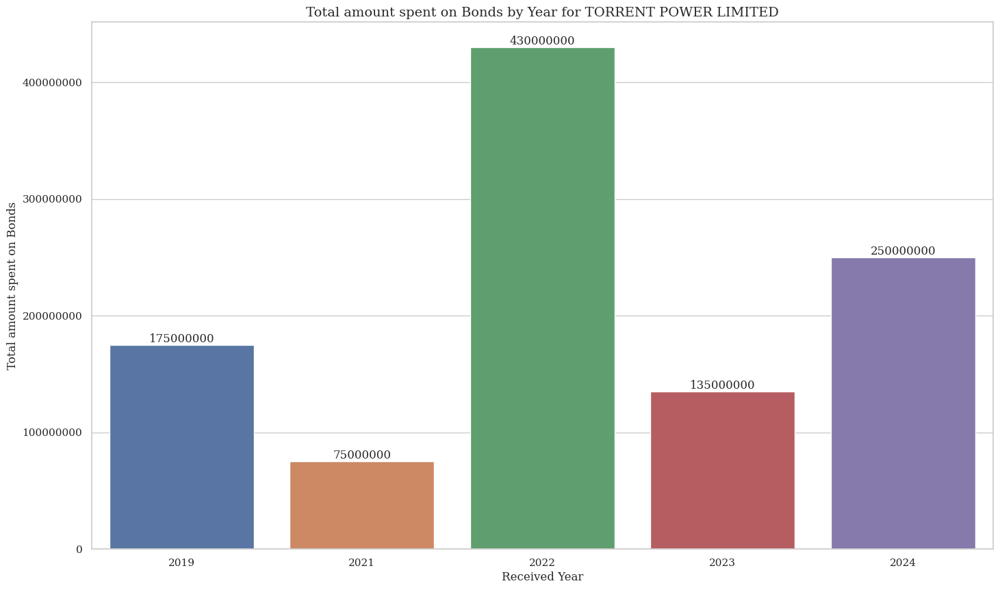

In [240]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

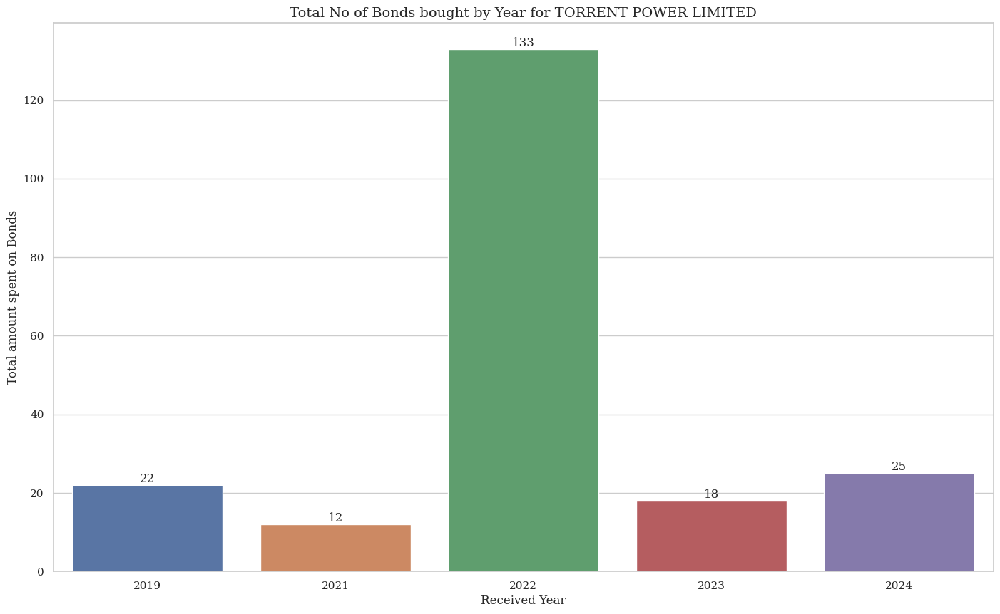

In [241]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [242]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,125000000.0,17
1,2019,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,20000000.0,2
2,2019,SHIVSENA,30000000.0,3
3,2021,BHARATIYA JANATA PARTY,75000000.0,12
4,2022,AAM AADMI PARTY,70000000.0,7
5,2022,BHARATIYA JANATA PARTY,310000000.0,121
6,2022,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",50000000.0,5
7,2023,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,15000000.0,6
8,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",120000000.0,12
9,2024,BHARATIYA JANATA PARTY,250000000.0,25


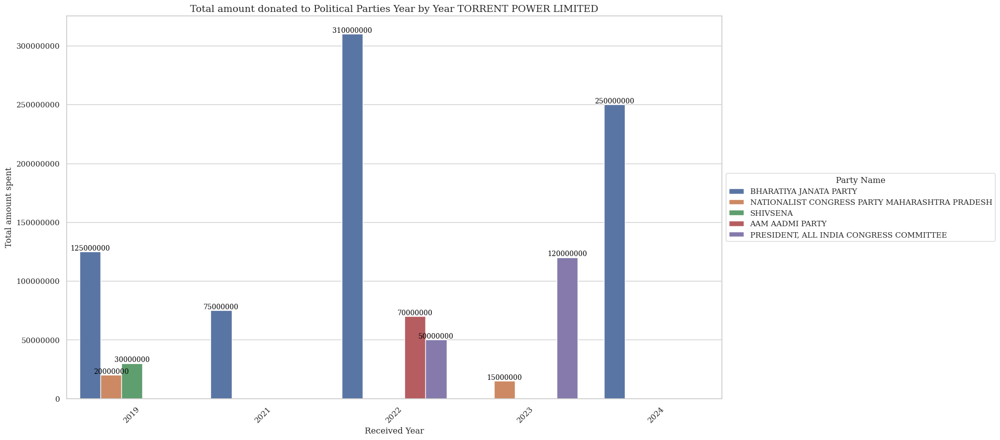

In [243]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [244]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

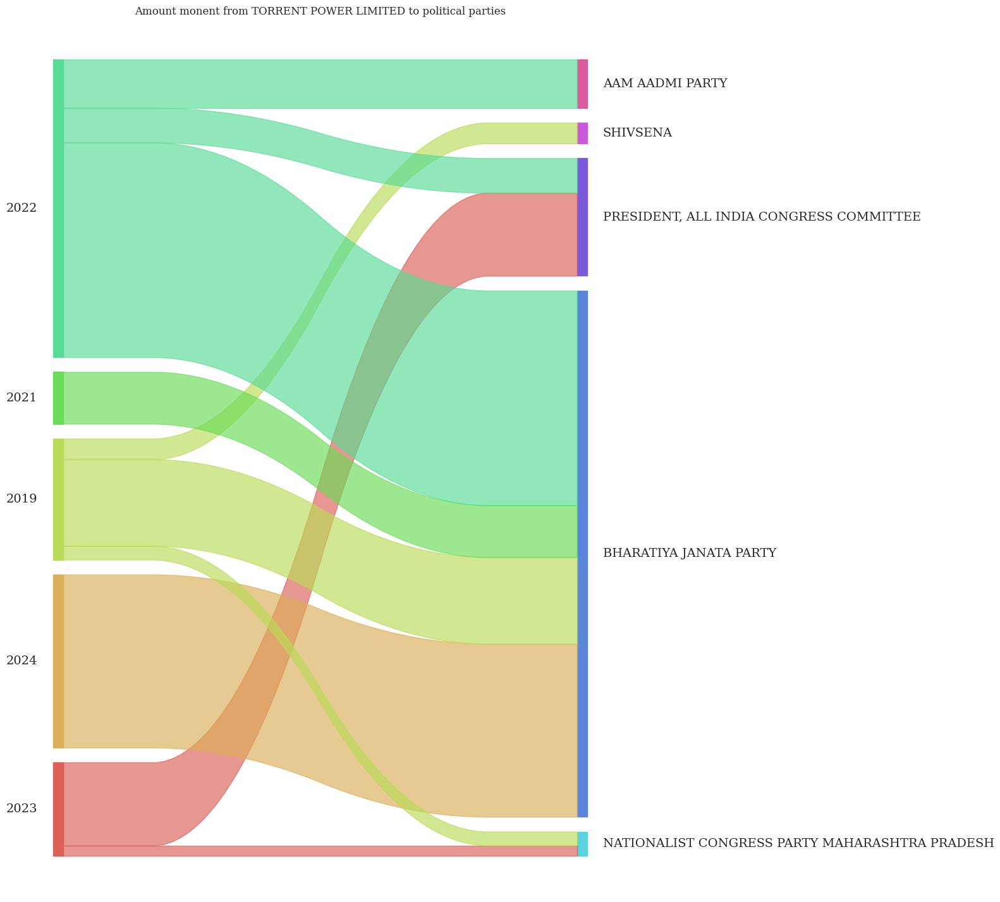

In [245]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [246]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'KEVENTER FOODPARK INFRA LIMITED',

In [247]:
company_name =  'KEVENTER FOODPARK INFRA LIMITED'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
7554,00001201904160000001230,2019-04-16,2019-04-16,2019-04-30,KEVENTER FOODPARK INFRA LIMITED,OC,4615.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC4615,2019-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,2039265.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
7556,00001201904160000001230,2019-04-16,2019-04-16,2019-04-30,KEVENTER FOODPARK INFRA LIMITED,OC,4633.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC4633,2019-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,2039265.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
7557,00001201904160000001230,2019-04-16,2019-04-16,2019-04-30,KEVENTER FOODPARK INFRA LIMITED,OC,4634.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC4634,2019-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,2039265.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
7558,00001201904160000001230,2019-04-16,2019-04-16,2019-04-30,KEVENTER FOODPARK INFRA LIMITED,OC,4635.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC4635,2019-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,2039265.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
7559,00001201904160000001230,2019-04-16,2019-04-16,2019-04-30,KEVENTER FOODPARK INFRA LIMITED,OC,4636.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC4636,2019-04-18,BHARATIYA JANATA PARTY,*******8244,691.0,2039265.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15594,00001201905070000001353,2019-05-07,2019-05-07,2019-05-21,KEVENTER FOODPARK INFRA LIMITED,TL,11537.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11537,2019-05-10,SHIROMANI AKALI DAL,*******6675,628.0,5809207.0,2019.0,"Haryana, Punjab and Chandigarh",628.0,Chandigarh,1000000.0,2019
15595,00001201905070000001353,2019-05-07,2019-05-07,2019-05-21,KEVENTER FOODPARK INFRA LIMITED,TL,11538.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11538,2019-05-10,SHIROMANI AKALI DAL,*******6675,628.0,5809207.0,2019.0,"Haryana, Punjab and Chandigarh",628.0,Chandigarh,1000000.0,2019
15597,00001201905070000001353,2019-05-07,2019-05-07,2019-05-21,KEVENTER FOODPARK INFRA LIMITED,TL,11540.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11540,2019-05-10,SHIROMANI AKALI DAL,*******6675,628.0,5809207.0,2019.0,"Haryana, Punjab and Chandigarh",628.0,Chandigarh,1000000.0,2019
15598,00001201905070000001353,2019-05-07,2019-05-07,2019-05-21,KEVENTER FOODPARK INFRA LIMITED,TL,11541.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11541,2019-05-10,SHIROMANI AKALI DAL,*******6675,628.0,5809207.0,2019.0,"Haryana, Punjab and Chandigarh",628.0,Chandigarh,1000000.0,2019


In [248]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,1.950000e+09,204


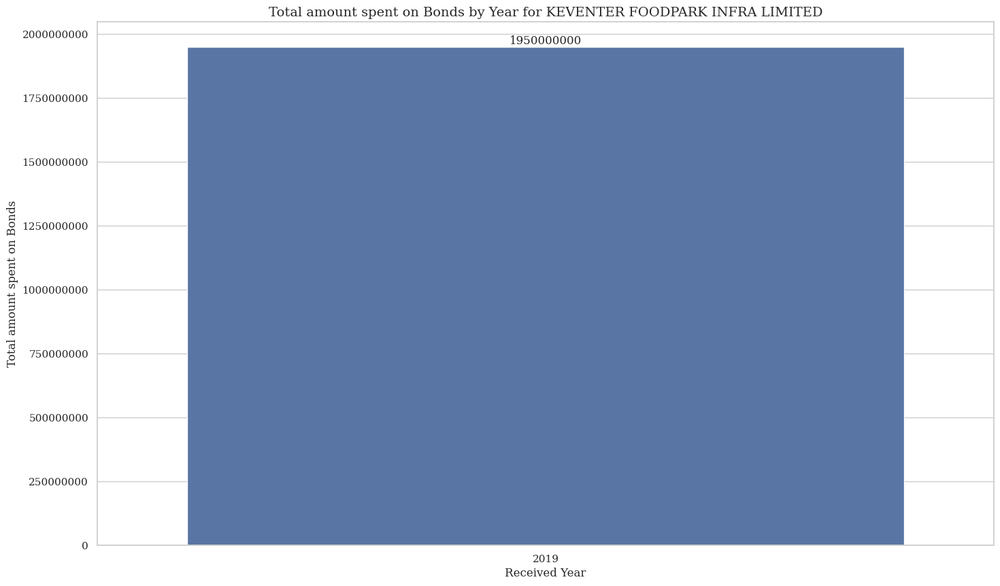

In [249]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

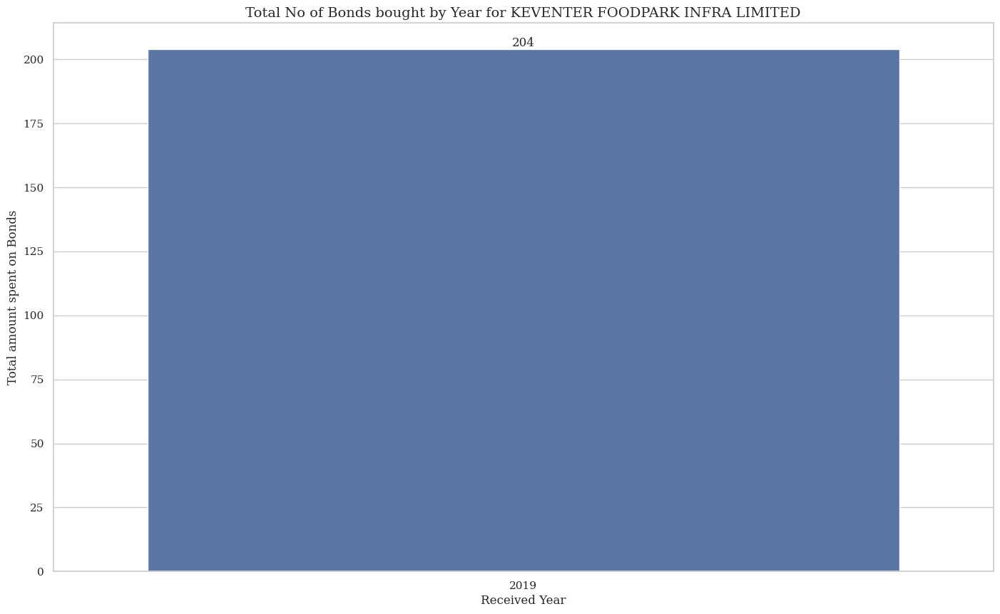

In [250]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [251]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,ADYAKSHA SAMAJVADI PARTY,1.000000e+08,10
1,2019,ALL INDIA TRINAMOOL CONGRESS,2.000000e+08,20
2,2019,BHARATIYA JANATA PARTY,1.445000e+09,149
3,2019,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2.000000e+08,20
4,2019,SHIROMANI AKALI DAL,5.000000e+06,5


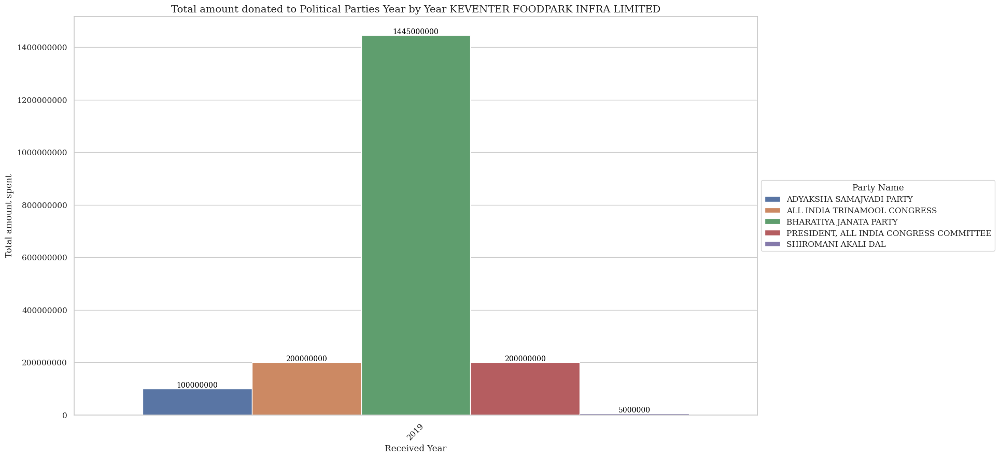

In [252]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [253]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

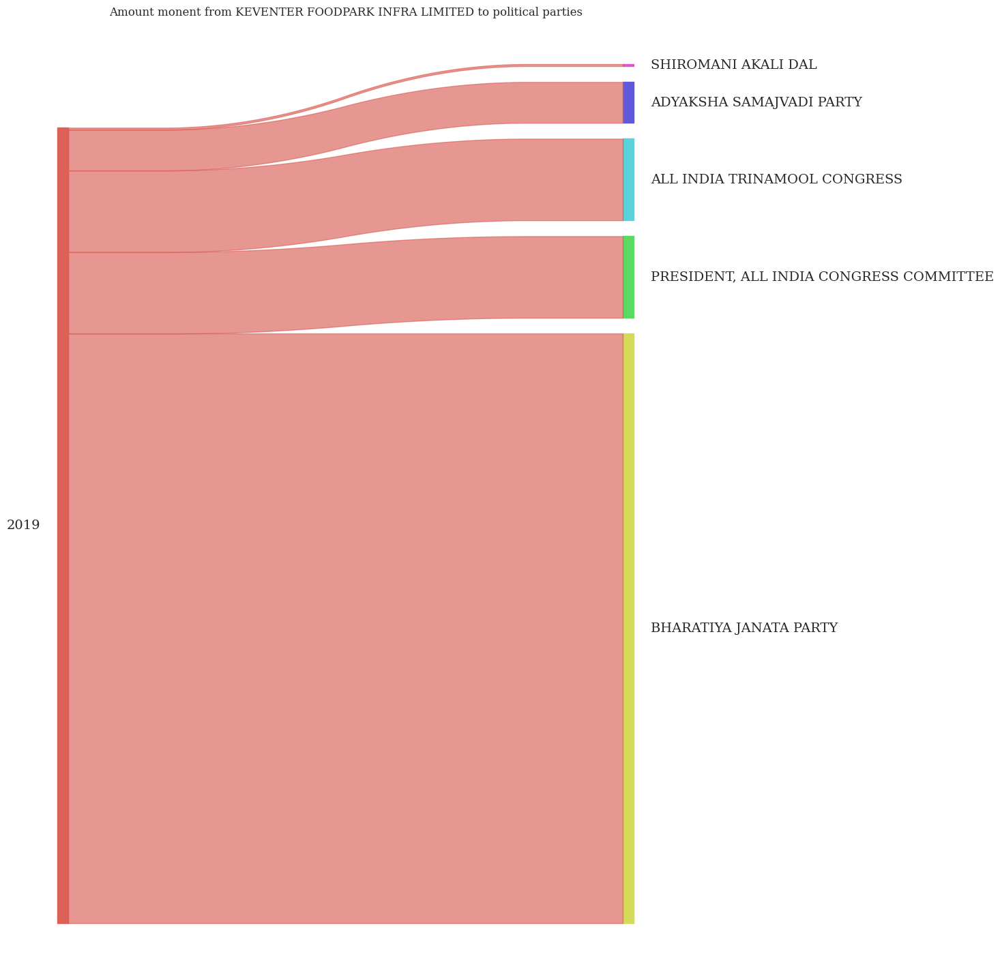

In [254]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [255]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'MADANLAL LTD.',

In [256]:
company_name =  'MADANLAL LTD.'
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
9536,00001201905080000001393,2019-05-08,2019-05-08,2019-05-22,MADANLAL LTD.,OC,7386.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC7386,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,3627829.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
9548,00001201905080000001393,2019-05-08,2019-05-08,2019-05-22,MADANLAL LTD.,OC,7397.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC7397,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,3627829.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
9549,00001201905080000001393,2019-05-08,2019-05-08,2019-05-22,MADANLAL LTD.,OC,7398.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC7398,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,3627829.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
9550,00001201905080000001393,2019-05-08,2019-05-08,2019-05-22,MADANLAL LTD.,OC,7399.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC7399,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,3627829.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
9552,00001201905080000001393,2019-05-08,2019-05-08,2019-05-22,MADANLAL LTD.,OC,7400.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,OC7400,2019-05-10,BHARATIYA JANATA PARTY,*******8244,691.0,3627829.0,2019.0,Delhi,691.0,New Delhi,10000000.0,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15429,00001201905100000001425,2019-05-10,2019-05-10,2019-05-24,MADANLAL LTD.,TL,11367.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11367,2019-05-20,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15430,00001201905100000001425,2019-05-10,2019-05-10,2019-05-24,MADANLAL LTD.,TL,11368.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11368,2019-05-20,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15431,00001201905100000001425,2019-05-10,2019-05-10,2019-05-24,MADANLAL LTD.,TL,11369.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11369,2019-05-20,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019
15432,00001201905100000001425,2019-05-10,2019-05-10,2019-05-24,MADANLAL LTD.,TL,11370.0,1.0,5899230.0,West Bengal and Andaman& Nicobar,1.0,Kolkata,TL11370,2019-05-20,BHARATIYA JANATA PARTY,*******8244,691.0,4567455.0,2019.0,Delhi,691.0,New Delhi,1000000.0,2019


In [257]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2019,1.855000e+09,199


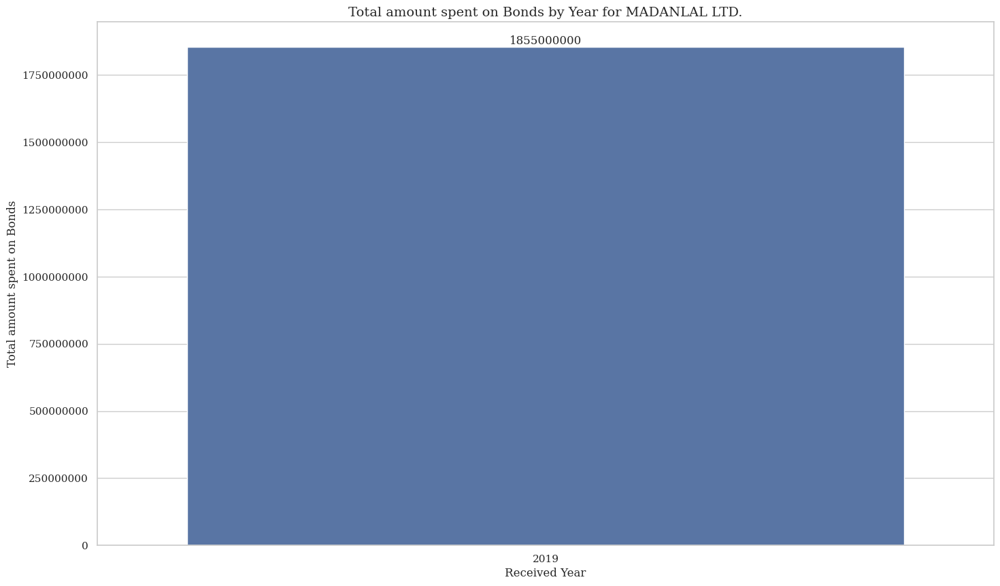

In [258]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

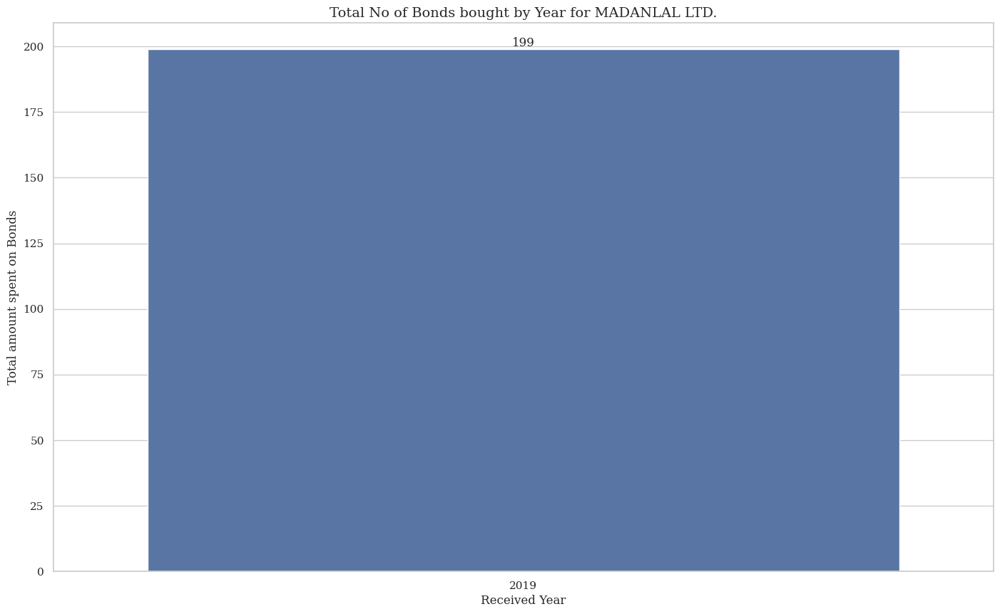

In [259]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [260]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2019,BHARATIYA JANATA PARTY,1.755000e+09,189
1,2019,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",1.000000e+08,10


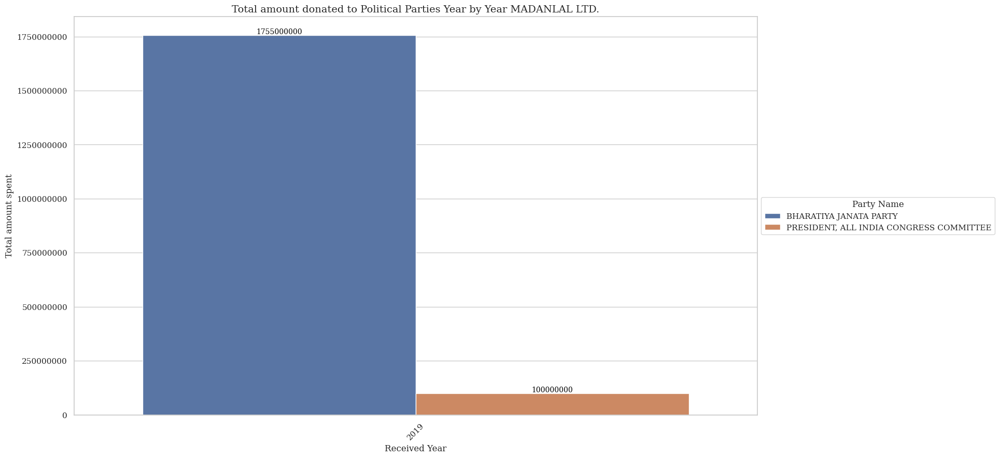

In [261]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [262]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 
#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

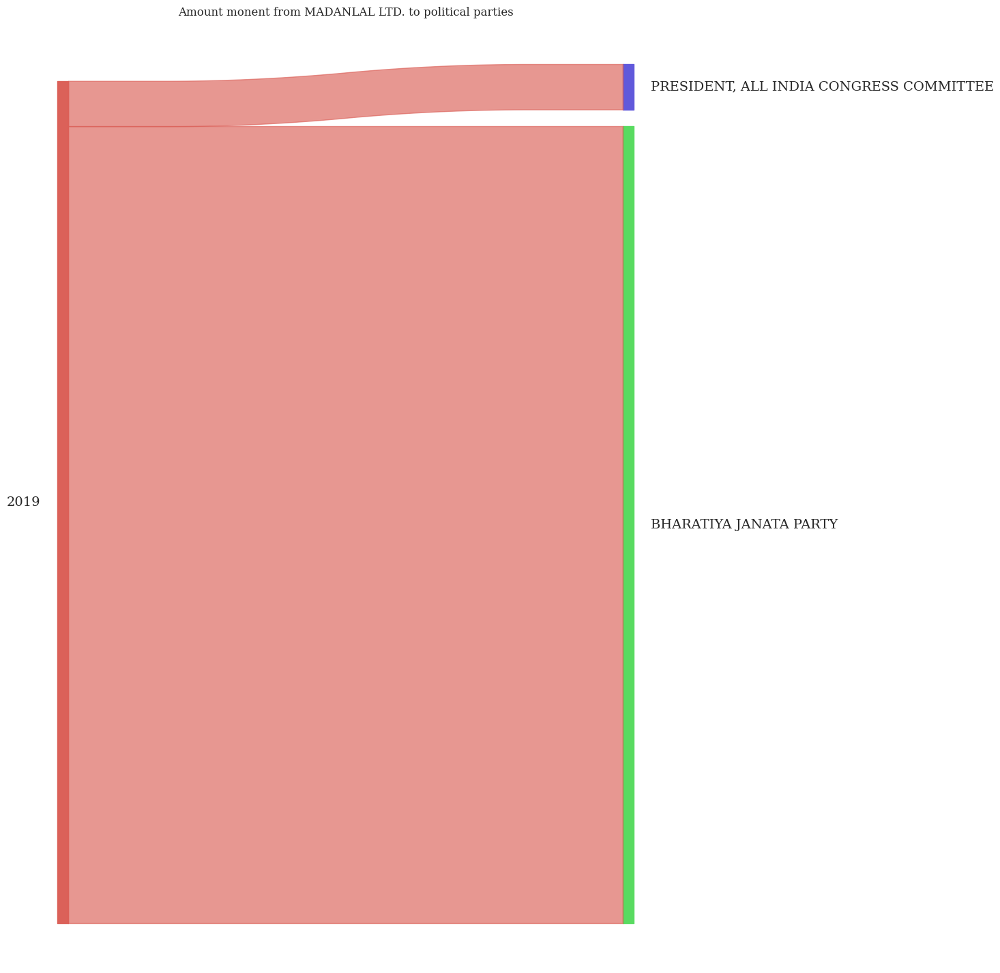

In [263]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [264]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'V M SALGAOCAR CORPORATION PVT LTD',

In [265]:
top_donors_amtwise

['FUTURE GAMING AND HOTEL SERVICES PRIVATE LIMITED',
 'MEGHA ENGINEERING AND INFRASTRUCTURES LIMITED',
 'QWIKSUPPLYCHAINPRIVATELIMITED',
 'VEDANTA LIMITED',
 'HALDIA ENERGY LIMITED',
 'ESSEL MINING AND INDS LTD',
 'WESTERN UP POWER TRANSMISSION COMPANY LI MITED',
 'BHARTI AIRTEL LIMITED',
 'KEVENTER FOODPARK INFRA LIMITED',
 'MADANLAL LTD.',
 'YASHODA SUPER SPECIALITY HOSPITAL',
 'UTKAL ALUMINA INTERNATIONAL LIMITED',
 'DLF COMMERCIAL DEVELOPERS LIMITED',
 'MKJ ENTERPRISES LIMITED',
 'JINDAL STEEL AND POWER LIMITED',
 'B G SHIRKE CONSTRUCTION TECHNOLOGY PVT L TD',
 'DHARIWAL INFRASTRUCTURE LIMITED',
 'AVEES TRADING AND FINANCE PVT LTD',
 'TORRENT POWER LIMITED',
 'BIRLACARBONINDIAPRIVATELIMITED']

In [266]:
company_name =  'JINDAL STEEL AND POWER LIMITED' 
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
1899,00691202210070000002562,2022-10-07,2022-10-07,2022-10-21,JINDAL STEEL AND POWER LIMITED,OC,11882.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11882,2022-10-11,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
1901,00691202210070000002562,2022-10-07,2022-10-07,2022-10-21,JINDAL STEEL AND POWER LIMITED,OC,11884.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11884,2022-10-11,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
1903,00691202210070000002562,2022-10-07,2022-10-07,2022-10-21,JINDAL STEEL AND POWER LIMITED,OC,11886.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11886,2022-10-11,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
1905,00691202210070000002562,2022-10-07,2022-10-07,2022-10-21,JINDAL STEEL AND POWER LIMITED,OC,11888.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11888,2022-10-11,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
1907,00691202210070000002562,2022-10-07,2022-10-07,2022-10-21,JINDAL STEEL AND POWER LIMITED,OC,11890.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC11890,2022-10-11,BIJU JANATA DAL,*******4340,41.0,7409060.0,2022.0,Odisha,41.0,Bhubaneswar,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4180,00691202311150000003552,2023-11-15,2023-11-15,2023-11-29,JINDAL STEEL AND POWER LIMITED,OC,14170.0,691.0,8212066.0,Delhi,691.0,New Delhi,OC14170,2023-11-24,BIJU JANATA DAL,*******4340,41.0,5665493.0,2023.0,Odisha,41.0,Bhubaneswar,10000000.0,2023
4182,00691202311150000003552,2023-11-15,2023-11-15,2023-11-29,JINDAL STEEL AND POWER LIMITED,OC,14172.0,691.0,8212066.0,Delhi,691.0,New Delhi,OC14172,2023-11-24,BIJU JANATA DAL,*******4340,41.0,5665493.0,2023.0,Odisha,41.0,Bhubaneswar,10000000.0,2023
4184,00691202311150000003552,2023-11-15,2023-11-15,2023-11-29,JINDAL STEEL AND POWER LIMITED,OC,14174.0,691.0,8212066.0,Delhi,691.0,New Delhi,OC14174,2023-11-24,BIJU JANATA DAL,*******4340,41.0,5665493.0,2023.0,Odisha,41.0,Bhubaneswar,10000000.0,2023
4186,00691202311150000003552,2023-11-15,2023-11-15,2023-11-29,JINDAL STEEL AND POWER LIMITED,OC,14176.0,691.0,8212066.0,Delhi,691.0,New Delhi,OC14176,2023-11-24,BIJU JANATA DAL,*******4340,41.0,5665493.0,2023.0,Odisha,41.0,Bhubaneswar,10000000.0,2023


In [267]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2022,250000000.0,25
1,2023,980000000.0,98


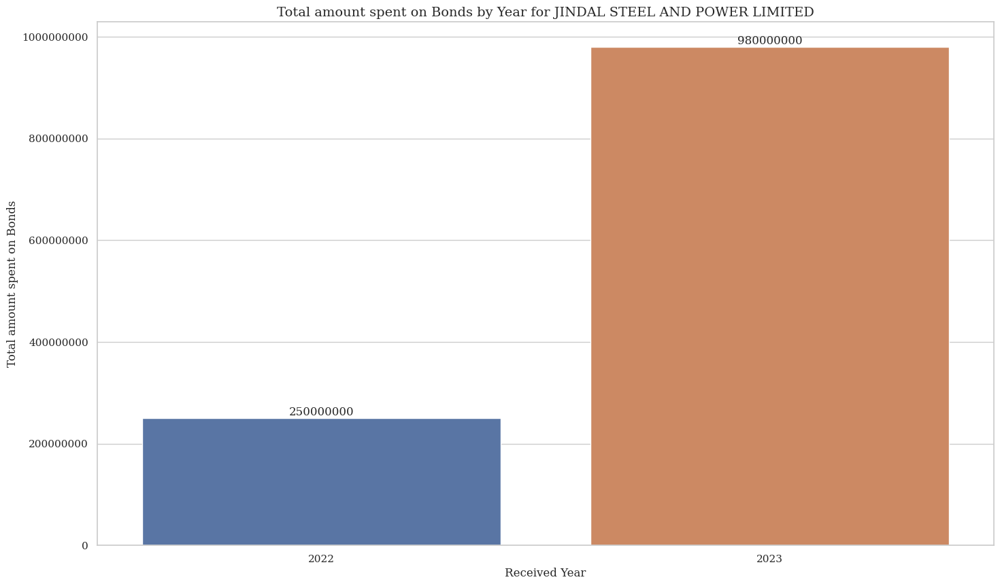

In [268]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

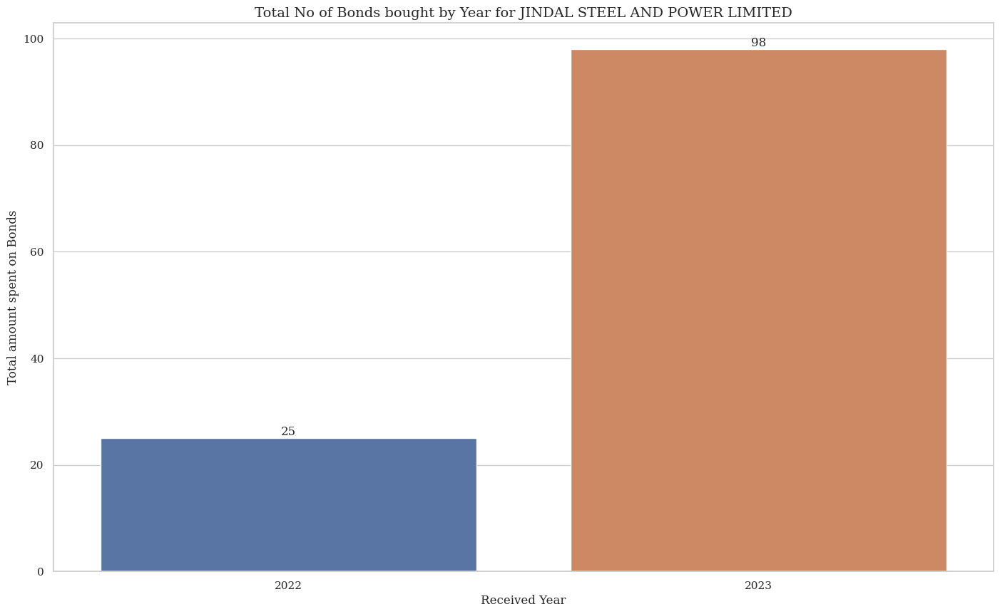

In [269]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [270]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2022,BIJU JANATA DAL,250000000.0,25
1,2023,BHARATIYA JANATA PARTY,30000000.0,3
2,2023,BIJU JANATA DAL,750000000.0,75
3,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",200000000.0,20


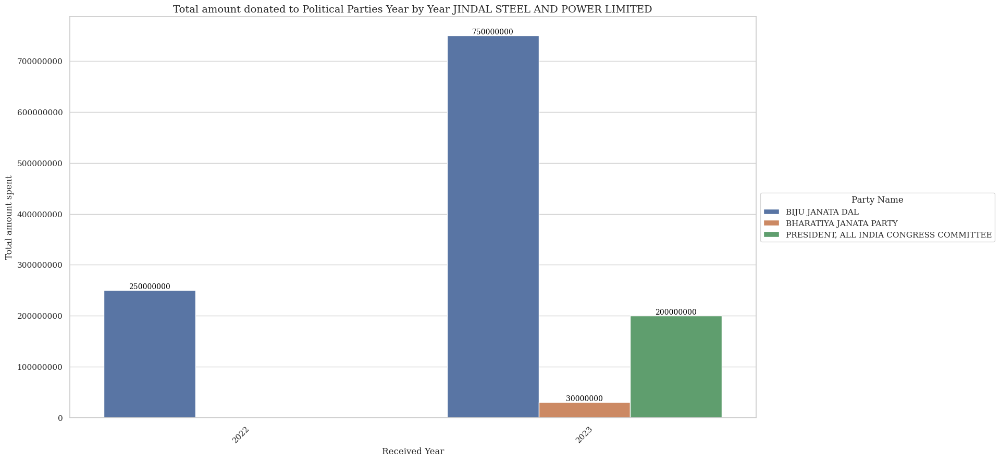

In [271]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [272]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

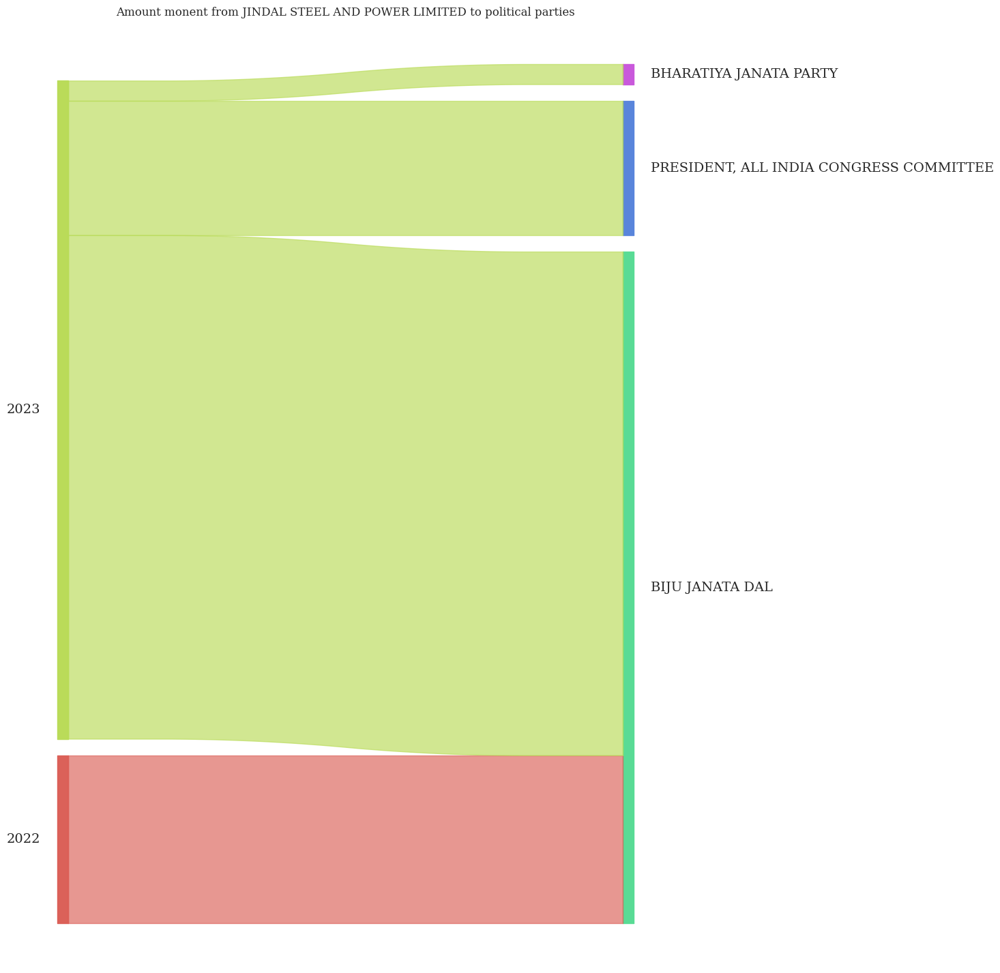

In [273]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [274]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# 'YASHODA SUPER SPECIALITY HOSPITAL' 

In [275]:
company_name =  'YASHODA SUPER SPECIALITY HOSPITAL' 
company_name_df = filtered_df[filtered_df['Purchaser'] == company_name] 
company_name_df

,Urn,JournalDate,PurchaseDate,ExpiryDate,Purchaser,Prefix,BondNumber,IssueBranchCode,IssueTeller,IssueState,IssueBranchCodeNo,IssueBranchCity,Unique_key,DateEncashment,PartyName,AccountNum,PayBranchCode,PayTeller,encashedyear,EncashedState,EncashedBranchCode,EncashedCity,Denomination,Year
2383,00847202211150000002691,2022-11-15,2022-11-15,2022-11-29,YASHODA SUPER SPECIALITY HOSPITAL,OC,12366.0,847.0,7445512.0,Telangana,847.0,Hyderabad,OC12366,2022-11-16,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
2385,00847202211150000002692,2022-11-15,2022-11-15,2022-11-29,YASHODA SUPER SPECIALITY HOSPITAL,OC,12368.0,847.0,7445512.0,Telangana,847.0,Hyderabad,OC12368,2022-11-16,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
2387,00847202211150000002693,2022-11-15,2022-11-15,2022-11-29,YASHODA SUPER SPECIALITY HOSPITAL,OC,12370.0,847.0,7445512.0,Telangana,847.0,Hyderabad,OC12370,2022-11-16,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
2389,00847202211150000002694,2022-11-15,2022-11-15,2022-11-29,YASHODA SUPER SPECIALITY HOSPITAL,OC,12372.0,847.0,7445512.0,Telangana,847.0,Hyderabad,OC12372,2022-11-16,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,5972302.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
2657,00691202212070000002735,2022-12-07,2022-12-07,2022-12-21,YASHODA SUPER SPECIALITY HOSPITAL,OC,12638.0,691.0,5972302.0,Delhi,691.0,New Delhi,OC12638,2022-12-13,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",*******4012,691.0,8212066.0,2022.0,Delhi,691.0,New Delhi,10000000.0,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11996,00847202204060000002336,2022-04-06,2022-04-06,2022-04-20,YASHODA SUPER SPECIALITY HOSPITAL,OC,9786.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9786,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
11997,00847202204060000002334,2022-04-06,2022-04-06,2022-04-20,YASHODA SUPER SPECIALITY HOSPITAL,OC,9787.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9787,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
11998,00847202204060000002336,2022-04-06,2022-04-06,2022-04-20,YASHODA SUPER SPECIALITY HOSPITAL,OC,9788.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9788,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022
12000,00847202204060000002336,2022-04-06,2022-04-06,2022-04-20,YASHODA SUPER SPECIALITY HOSPITAL,OC,9790.0,847.0,3898296.0,Telangana,847.0,Hyderabad,OC9790,2022-04-12,BHARAT RASHTRA SAMITHI,*******7477,847.0,3898296.0,2022.0,Telangana,847.0,Hyderabad,10000000.0,2022


In [276]:
company_amt_agg_df = company_name_df.groupby('Year')['Denomination'].agg(
    Denominations_sum=('sum'),
    Denominations_count=('count')
).reset_index()
company_amt_agg_df

,Year,Denominations_sum,Denominations_count
0,2021,170000000.0,17
1,2022,890000000.0,89
2,2023,560000000.0,56


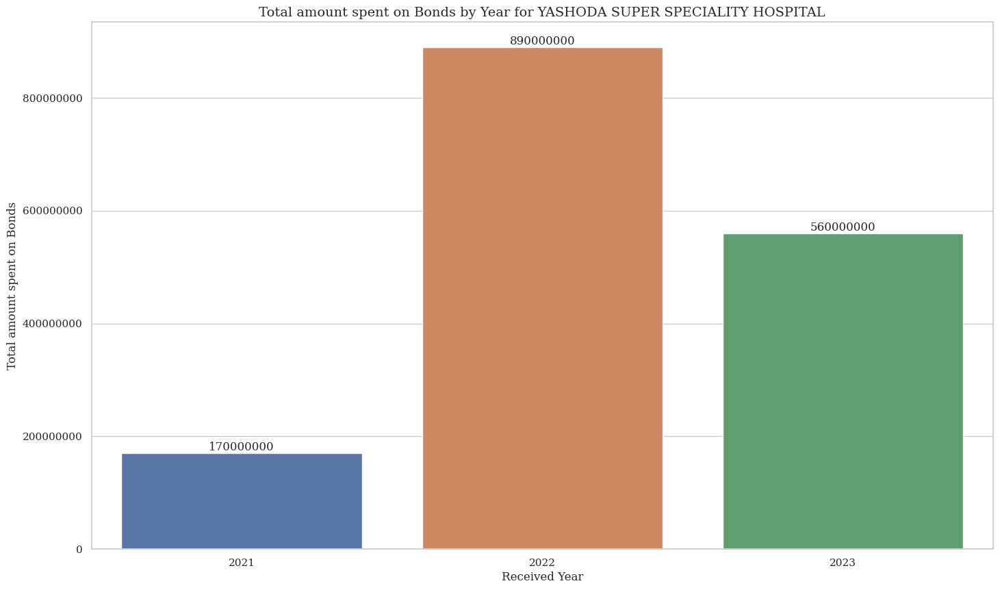

In [277]:
# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_sum')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total amount spent on Bonds by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

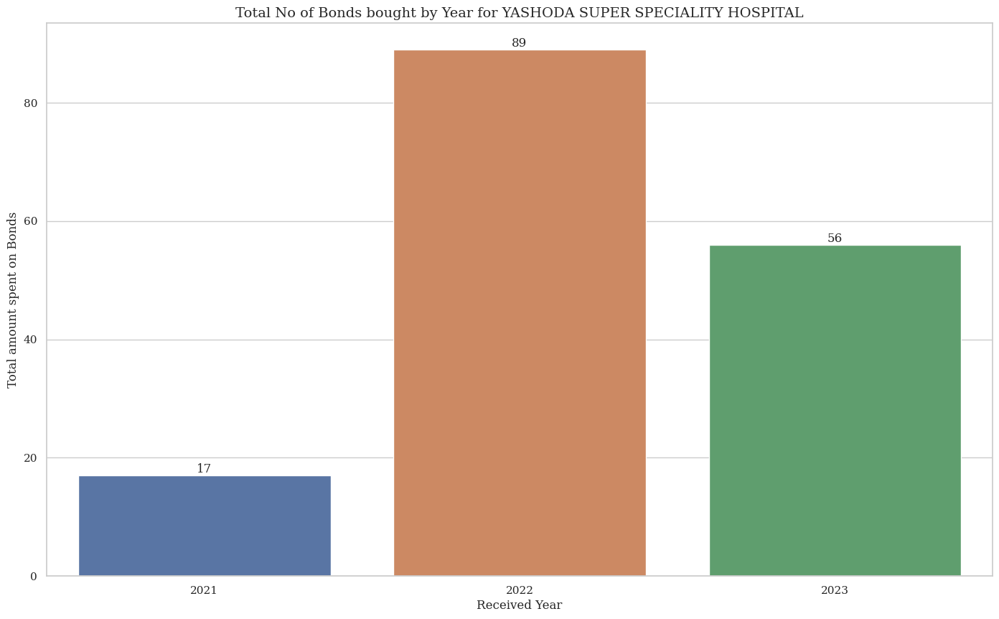

In [278]:
# Create the count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=company_amt_agg_df, x='Year', y='Denominations_count')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent on Bonds', fontsize=12)
plt.title(f'Total No of Bonds bought by Year for {company_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [279]:
# Group by 'Year' and 'PartyName', and aggregate 'Denomination' using custom names for the aggregated columns
company_amt_agg_partyname_df = company_name_df.groupby(['Year', 'PartyName']).agg(
    Denominations_sum=('Denomination', 'sum'),
    Denominations_count=('Denomination', 'count')
).reset_index()

company_amt_agg_partyname_df

,Year,PartyName,Denominations_sum,Denominations_count
0,2021,BHARAT RASHTRA SAMITHI,50000000.0,5
1,2021,BHARATIYA JANATA PARTY,20000000.0,2
2,2021,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",100000000.0,10
3,2022,AAM AADMI PARTY,10000000.0,1
4,2022,BHARAT RASHTRA SAMITHI,800000000.0,80
5,2022,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",70000000.0,7
6,2022,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,10000000.0,1
7,2023,BHARAT RASHTRA SAMITHI,90000000.0,9
8,2023,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",470000000.0,47


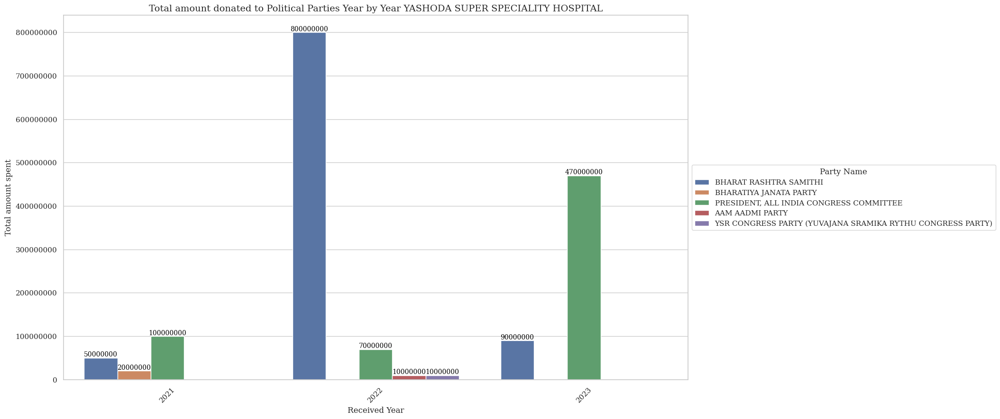

In [280]:
# Create the grouped bar plot
plt.figure(figsize=(17, 10))
ax = sns.barplot(data=company_amt_agg_partyname_df, x='Year', y='Denominations_sum', hue='PartyName')

# Iterate over each container (group of bars)
for container in ax.containers:
    # Iterate over each bar in the container and add labels
    for bar in container:
        # Get the height of the bar
        height = bar.get_height()
        # Add the value label to the bar
        ax.annotate(f'{height:.0f}', 
                    (bar.get_x() + bar.get_width() / 2, height), 
                    ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total amount spent', fontsize=12)
plt.title(f'Total amount donated to Political Parties Year by Year {company_name}', fontsize=14)

# Rotate y-axis labels by -45 degrees for better readability
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')

# Move legend to the right and outside the plot area
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Party Name')

# Show the plot
plt.show()

In [281]:
# Due to some reason some of the sankeys are not working dirtectly but this problem is resolved when we are exporting the data frame to a csv file and recreating
# again as a new dataframe --> as of now I don't the reason but as a bandaid solution I am applying thisabs 

#exporting to a csv file 
company_name_df.to_csv("temp_files/check.csv")
# Reimporting as a dataframe 
company_name_df = pd.read_csv('temp_files/check.csv')

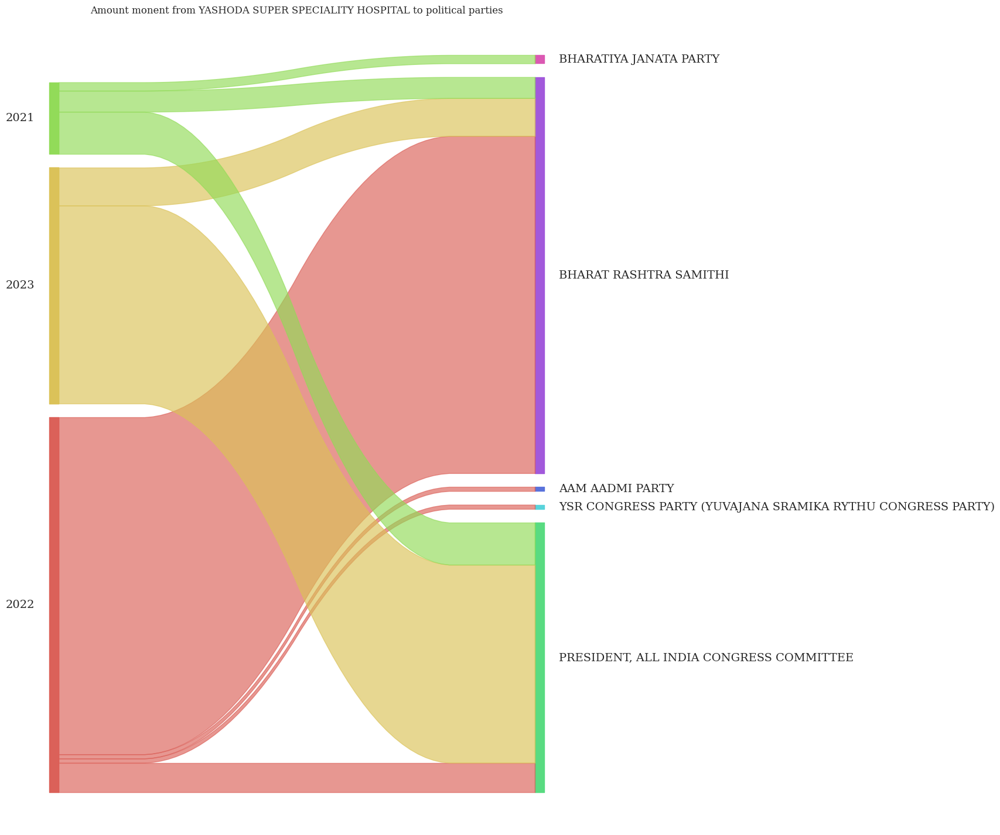

In [282]:
# Sankey chart from matplotlib
sankey(
    left        = company_name_df['Year'],
    right       = company_name_df['PartyName'],
    leftWeight  = company_name_df['Denomination'],
    rightWeight = company_name_df['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title(f'Amount monent from {company_name} to political parties') 
plt.show()

In [283]:
# Removing the file I created which is of no use
os.remove("temp_files/check.csv")

# Political Parties Denomonation Analyisis

In [284]:
receiver_df.columns

Index(['Sno', 'DateEncashment', 'PartyName', 'AccountNum', 'Prefix',
       'BondNumber', 'Denominations', 'PayBranchCode', 'PayTeller',
       'encashedyear', 'State', 'Branch Code No.', 'Branch City',
       'Unique_key'],
      dtype='object')

In [285]:
political_funds = receiver_df[['DateEncashment','PartyName','Denominations']]
# Create a new column 'ReceivedYear' based on the year component of 'DateEncashment'
political_funds['ReceivedYear'] = political_funds['DateEncashment'].dt.year
political_funds = political_funds.groupby(['PartyName','ReceivedYear']).agg(
    min_Denominations=('Denominations', 'min'),
    max_Denominations=('Denominations', 'max'),
    sum_Denominations=('Denominations', 'sum'),
    count_Denominations=('Denominations', 'count')).reset_index()
political_funds = political_funds.sort_values('PartyName')
political_funds

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
0,AAM AADMI PARTY,2019,1000000,10000000,22000000,4
1,AAM AADMI PARTY,2020,1000000,10000000,33000000,6
2,AAM AADMI PARTY,2021,100000,10000000,18500000,23
3,AAM AADMI PARTY,2022,100000,10000000,479500000,187
4,AAM AADMI PARTY,2023,100000,10000000,101500000,25
5,ADYAKSHA SAMAJVADI PARTY,2019,100000,10000000,108400000,40
6,ADYAKSHA SAMAJVADI PARTY,2022,100000,10000000,32100000,6
7,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,2019,100000,10000000,60500000,38
13,ALL INDIA TRINAMOOL CONGRESS,2024,100000,10000000,1304500000,310
12,ALL INDIA TRINAMOOL CONGRESS,2023,1000,10000000,5624738000,1133


In [286]:
political_party_list = list(political_funds['PartyName'].unique())
political_party_list

['AAM AADMI PARTY',
 'ADYAKSHA SAMAJVADI PARTY',
 'ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM',
 'ALL INDIA TRINAMOOL CONGRESS',
 'BHARAT RASHTRA SAMITHI',
 'BHARATIYA JANATA PARTY',
 'BIHAR PRADESH JANTA DAL(UNITED)',
 'BIJU JANATA DAL',
 'DRAVIDA MUNNETRA KAZHAGAM (DMK)',
 'GOA FORWARD PARTY',
 'JAMMU AND KASHMIR NATIONAL CONFERENCE',
 'JANASENA PARTY',
 'JANATA DAL ( SECULAR )',
 'JHARKHAND MUKTI MORCHA',
 'MAHARASHTRAWADI GOMNTAK PARTY',
 'NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH',
 'PRESIDENT, ALL INDIA CONGRESS COMMITTEE',
 'RASHTRIYA JANTA DAL',
 'SHIROMANI AKALI DAL',
 'SHIVSENA',
 'SIKKIM DEMOCRATIC FRONT',
 'SIKKIM KRANTIKARI MORCHA',
 'TELUGU DESAM PARTY',
 'YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CONGRESS PARTY)']

## AAM AADMI PARTY

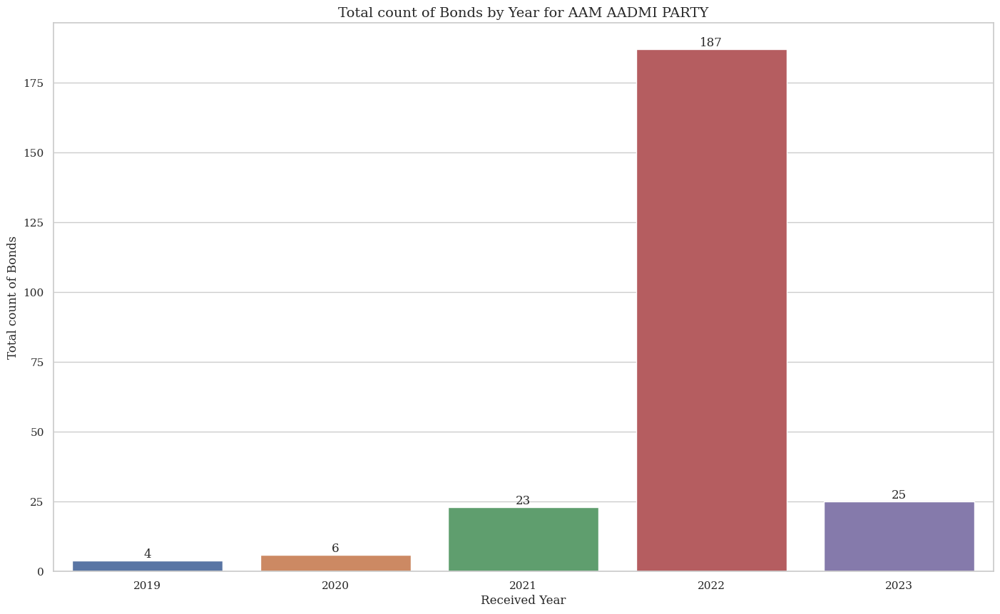

In [287]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name = 'AAM AADMI PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

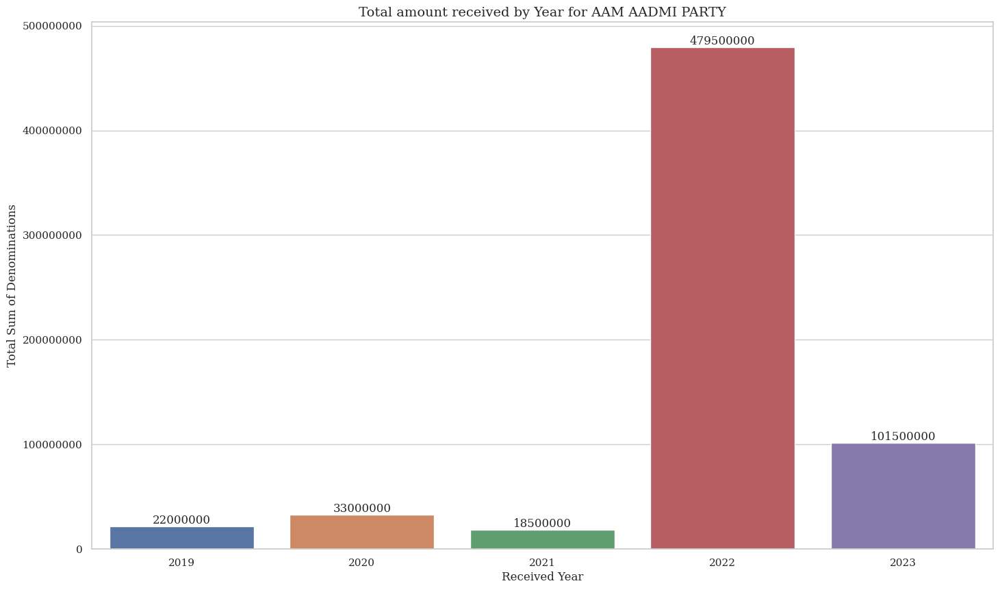

In [288]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name = 'AAM AADMI PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [289]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
0,AAM AADMI PARTY,2019,1000000,10000000,22000000,4
1,AAM AADMI PARTY,2020,1000000,10000000,33000000,6
2,AAM AADMI PARTY,2021,100000,10000000,18500000,23
3,AAM AADMI PARTY,2022,100000,10000000,479500000,187
4,AAM AADMI PARTY,2023,100000,10000000,101500000,25


## ADYAKSHA SAMAJVADI PARTY

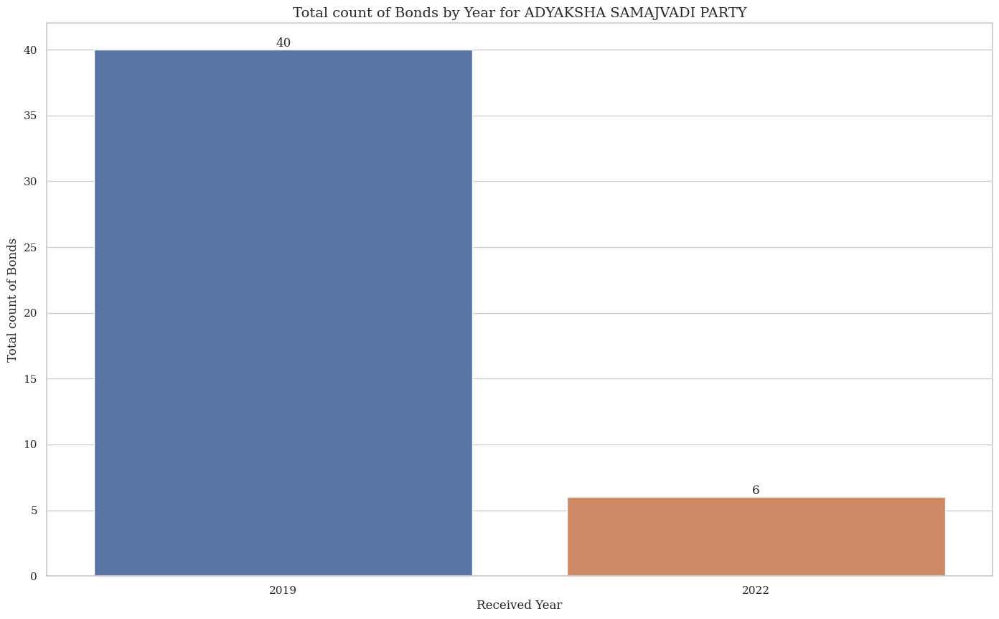

In [290]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ADYAKSHA SAMAJVADI PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

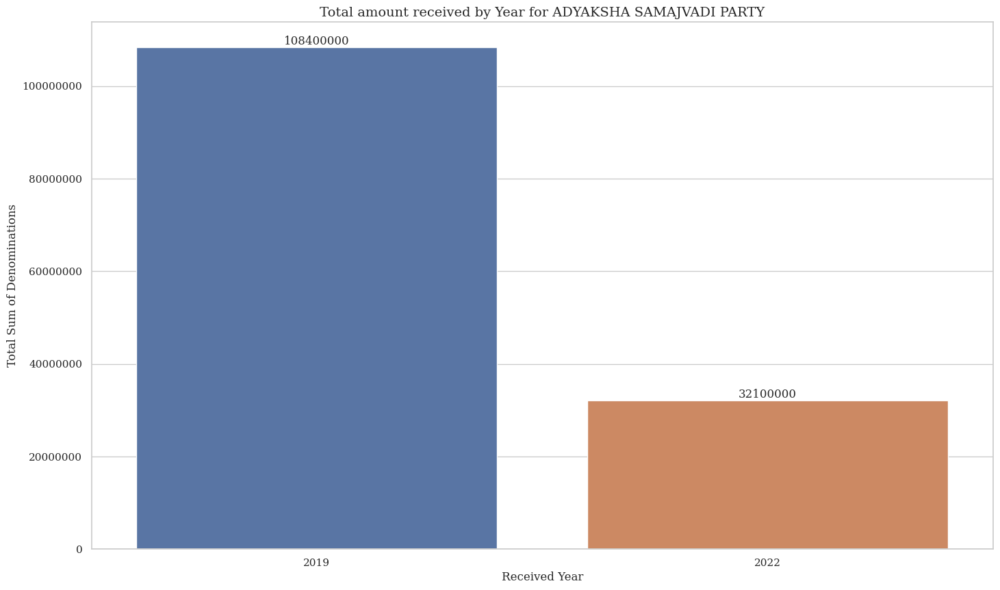

In [291]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ADYAKSHA SAMAJVADI PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [292]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
5,ADYAKSHA SAMAJVADI PARTY,2019,100000,10000000,108400000,40
6,ADYAKSHA SAMAJVADI PARTY,2022,100000,10000000,32100000,6


## 'ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM'

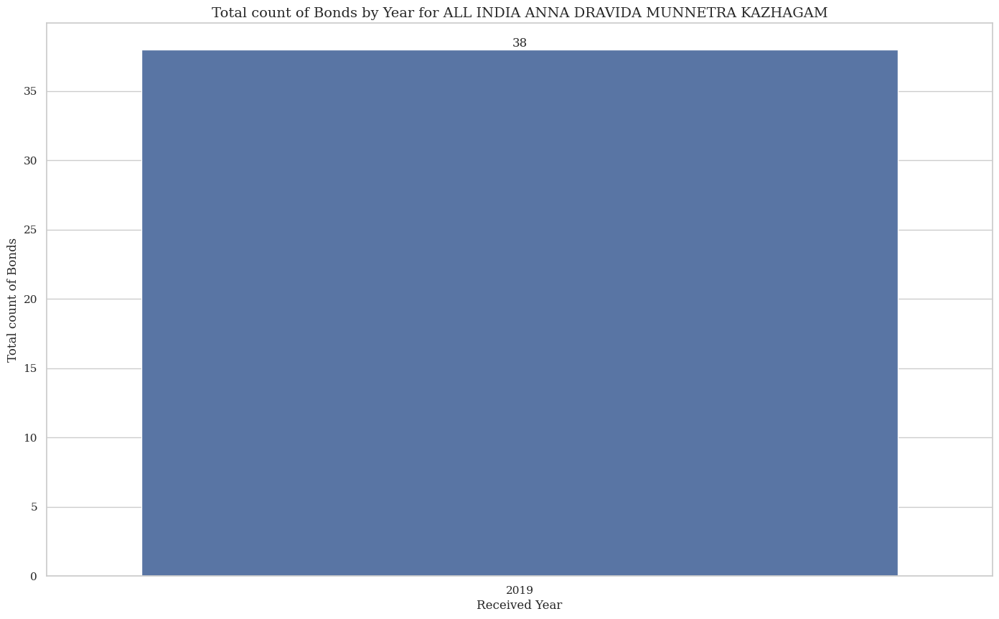

In [293]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

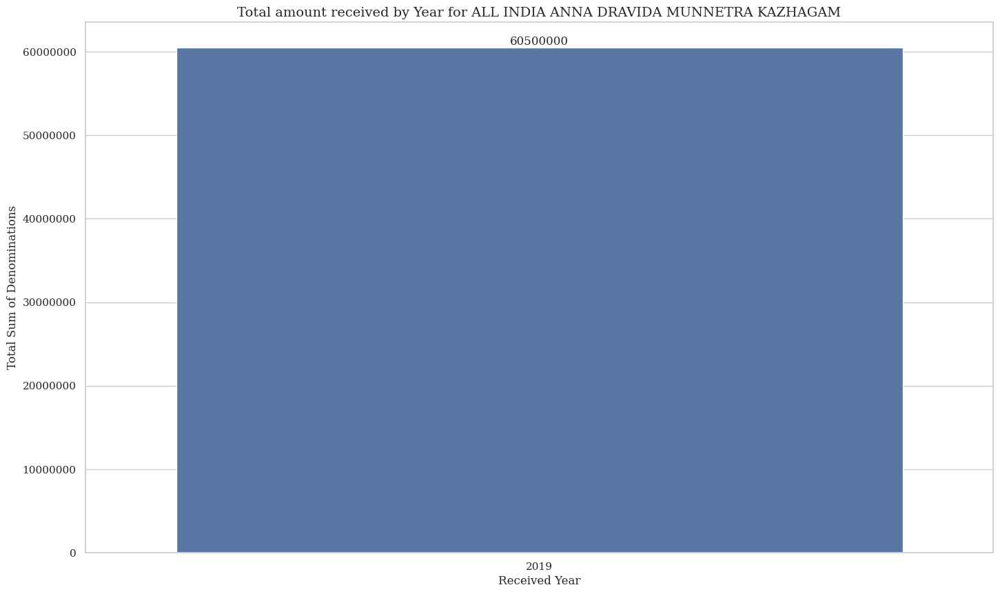

In [294]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [295]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
7,ALL INDIA ANNA DRAVIDA MUNNETRA KAZHAGAM,2019,100000,10000000,60500000,38


## 'ALL INDIA TRINAMOOL CONGRESS'

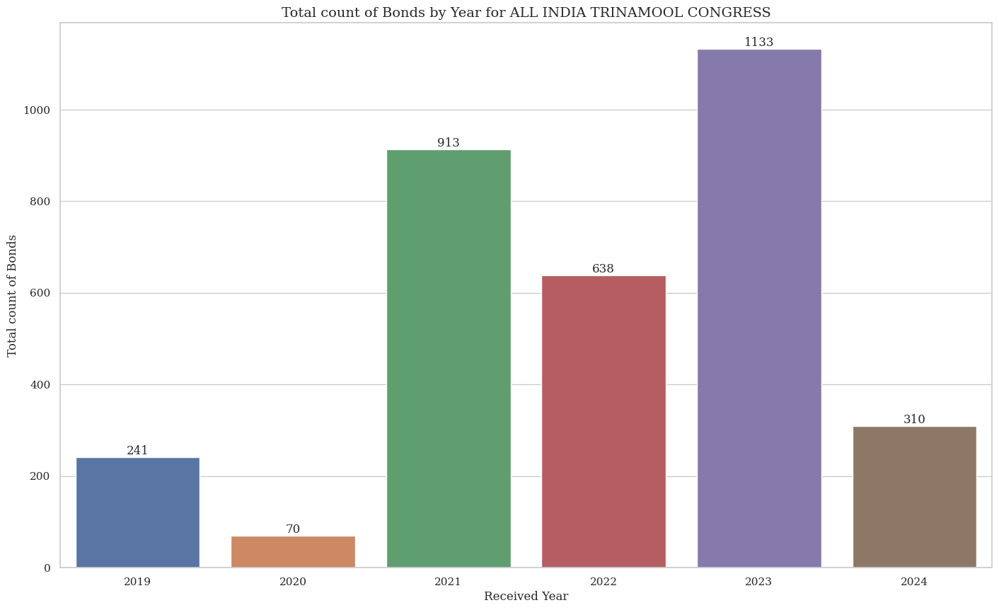

In [296]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ALL INDIA TRINAMOOL CONGRESS'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

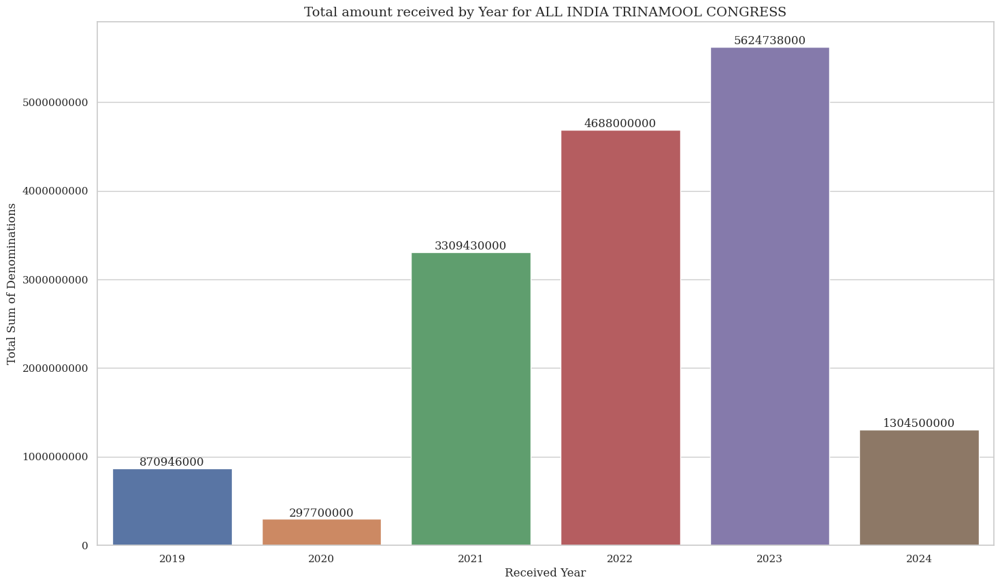

In [297]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'ALL INDIA TRINAMOOL CONGRESS'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [298]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
13,ALL INDIA TRINAMOOL CONGRESS,2024,100000,10000000,1304500000,310
12,ALL INDIA TRINAMOOL CONGRESS,2023,1000,10000000,5624738000,1133
11,ALL INDIA TRINAMOOL CONGRESS,2022,100000,10000000,4688000000,638
10,ALL INDIA TRINAMOOL CONGRESS,2021,10000,10000000,3309430000,913
9,ALL INDIA TRINAMOOL CONGRESS,2020,100000,10000000,297700000,70
8,ALL INDIA TRINAMOOL CONGRESS,2019,1000,10000000,870946000,241


## 'BHARAT RASHTRA SAMITHI'

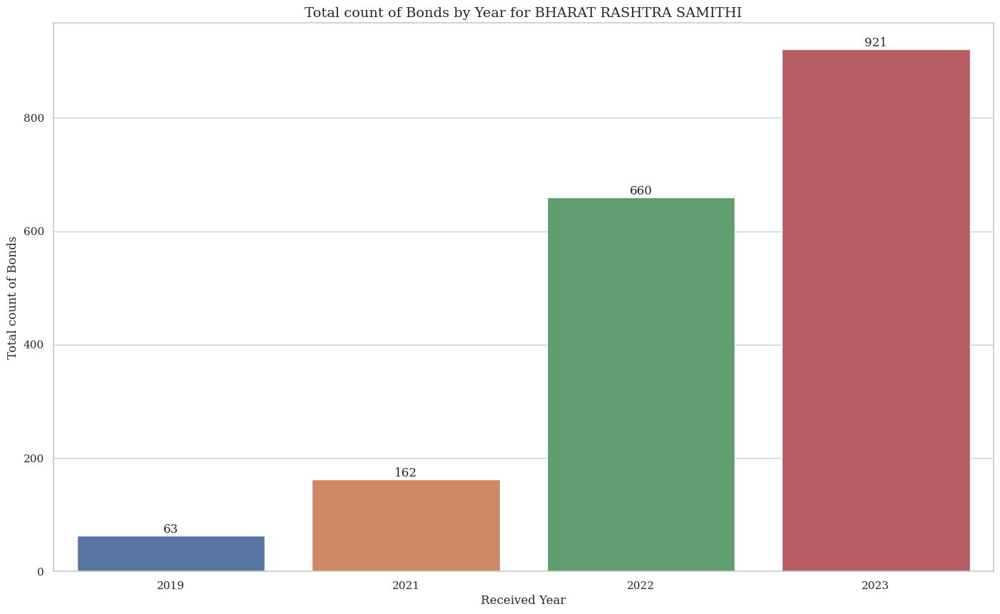

In [299]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BHARAT RASHTRA SAMITHI'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

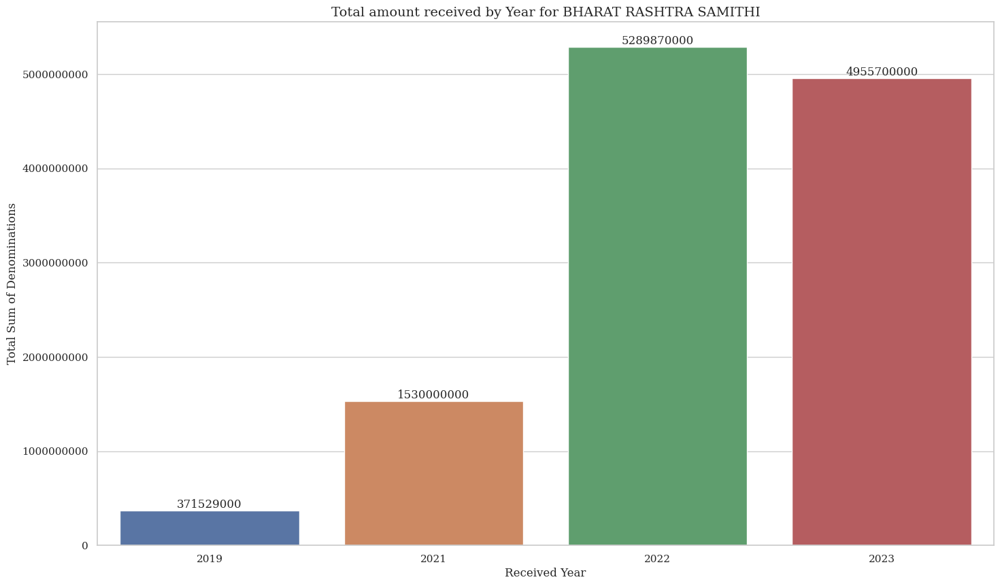

In [300]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BHARAT RASHTRA SAMITHI'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [301]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
14,BHARAT RASHTRA SAMITHI,2019,1000,10000000,371529000,63
15,BHARAT RASHTRA SAMITHI,2021,1000000,10000000,1530000000,162
16,BHARAT RASHTRA SAMITHI,2022,10000,10000000,5289870000,660
17,BHARAT RASHTRA SAMITHI,2023,100000,10000000,4955700000,921


## 'BHARATIYA JANATA PARTY'

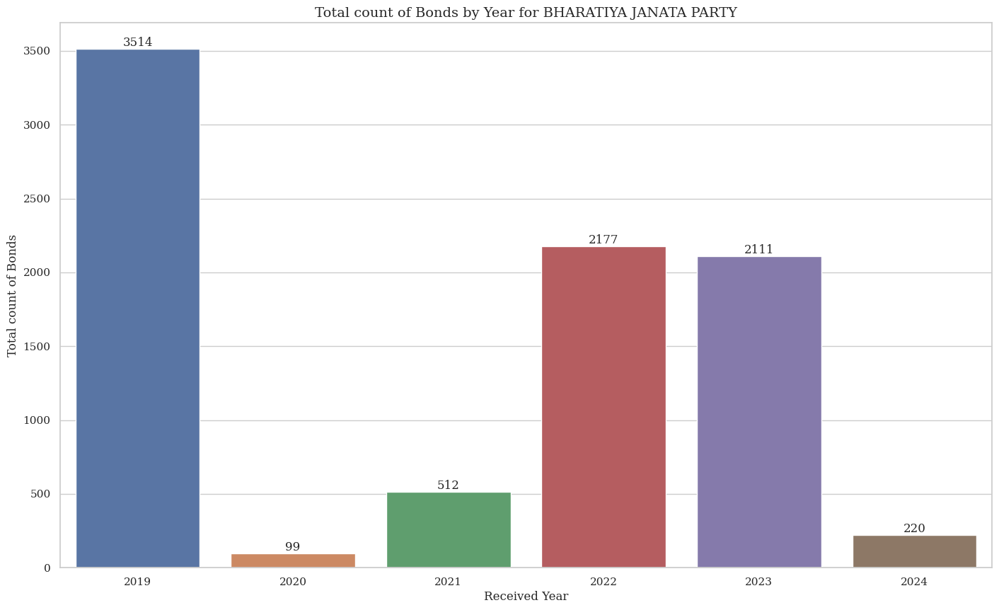

In [302]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BHARATIYA JANATA PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

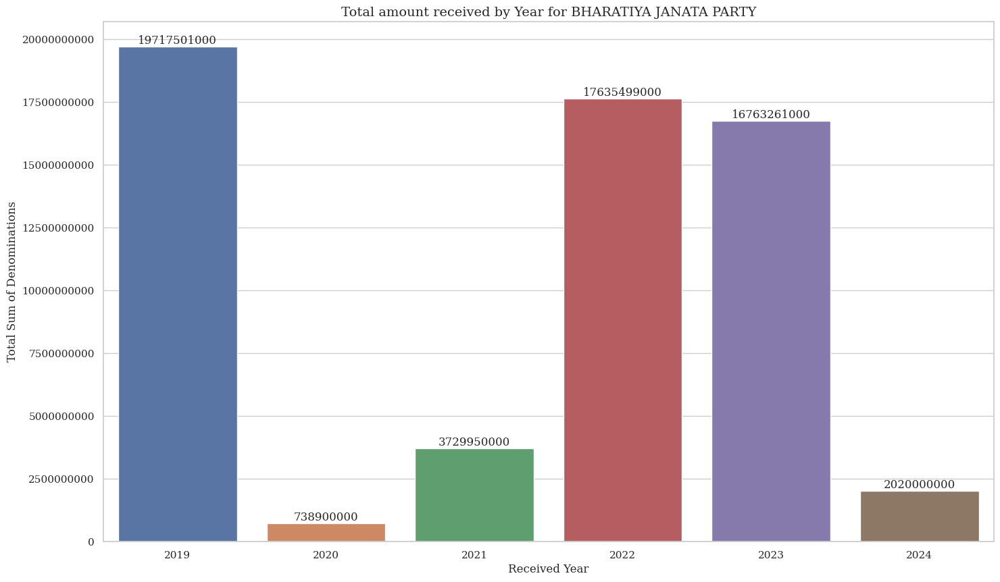

In [303]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BHARATIYA JANATA PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [304]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
23,BHARATIYA JANATA PARTY,2024,1000000,10000000,2020000000,220
22,BHARATIYA JANATA PARTY,2023,1000,10000000,16763261000,2111
21,BHARATIYA JANATA PARTY,2022,1000,10000000,17635499000,2177
20,BHARATIYA JANATA PARTY,2021,10000,10000000,3729950000,512
19,BHARATIYA JANATA PARTY,2020,100000,10000000,738900000,99
18,BHARATIYA JANATA PARTY,2019,1000,10000000,19717501000,3514


## 'BIHAR PRADESH JANTA DAL(UNITED)'

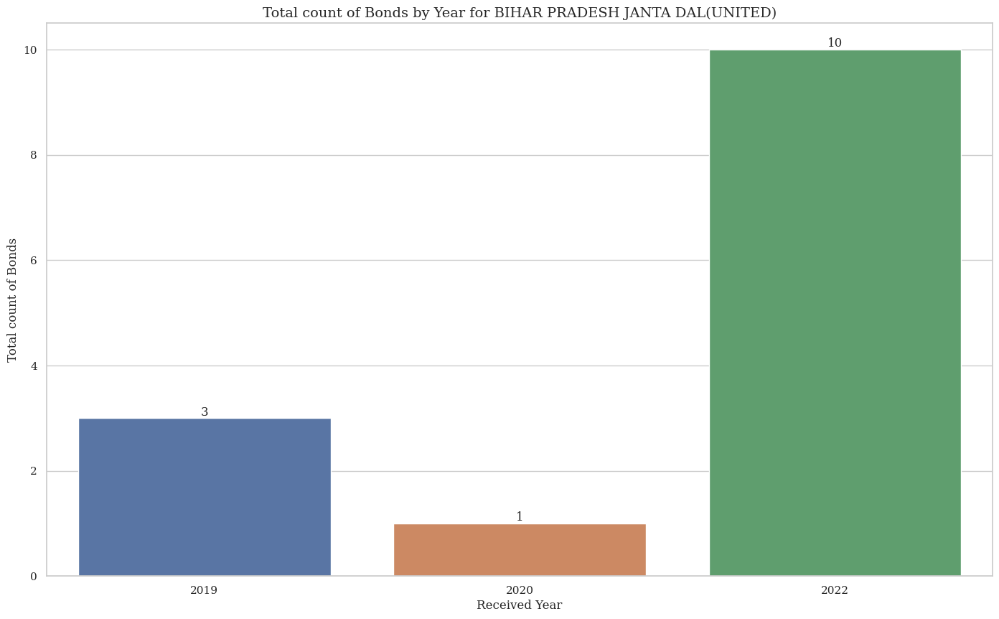

In [305]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BIHAR PRADESH JANTA DAL(UNITED)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

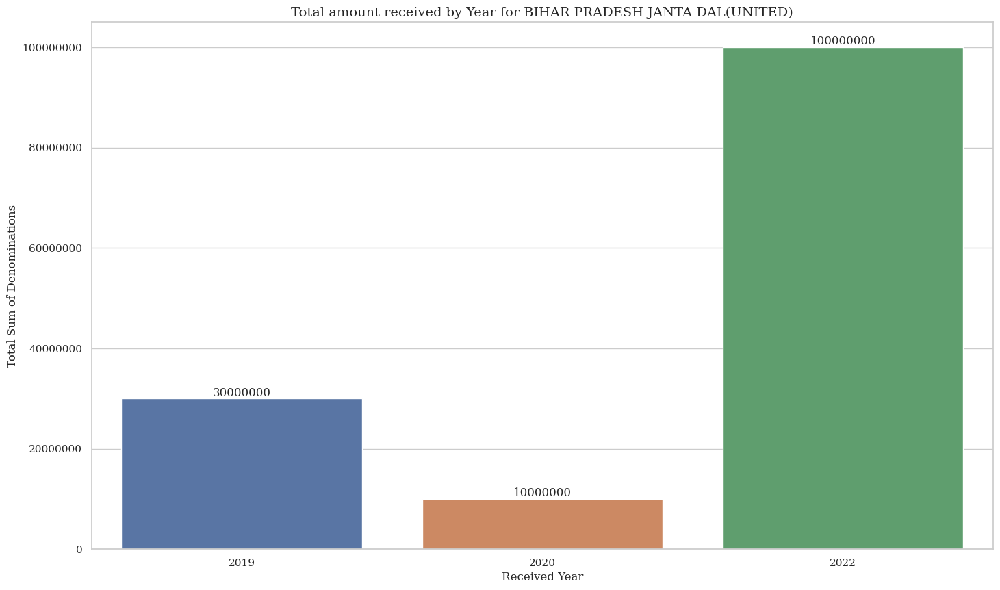

In [306]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BIHAR PRADESH JANTA DAL(UNITED)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [307]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
24,BIHAR PRADESH JANTA DAL(UNITED),2019,10000000,10000000,30000000,3
25,BIHAR PRADESH JANTA DAL(UNITED),2020,10000000,10000000,10000000,1
26,BIHAR PRADESH JANTA DAL(UNITED),2022,10000000,10000000,100000000,10


## 'BIJU JANATA DAL'

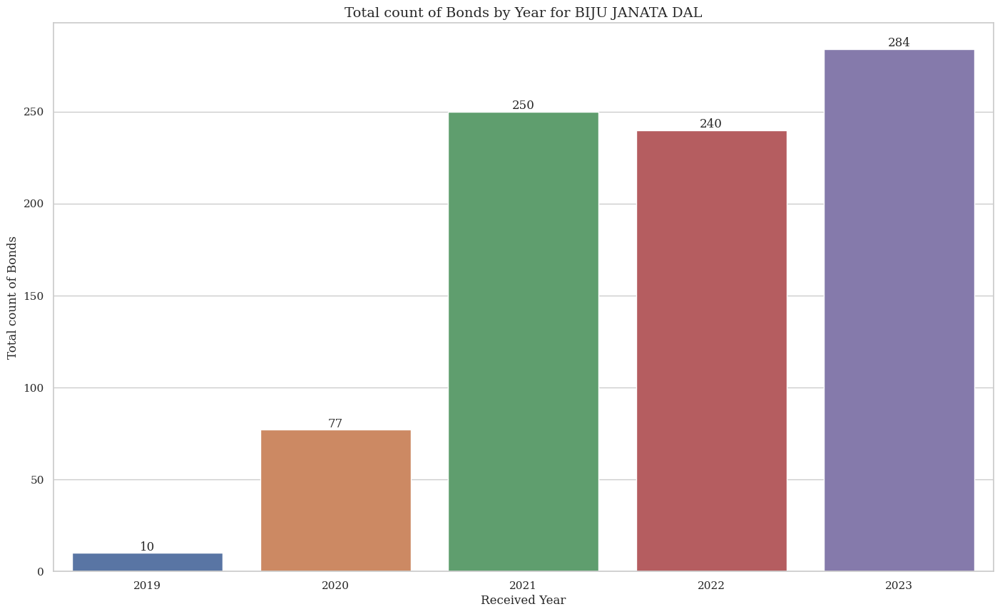

In [308]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BIJU JANATA DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

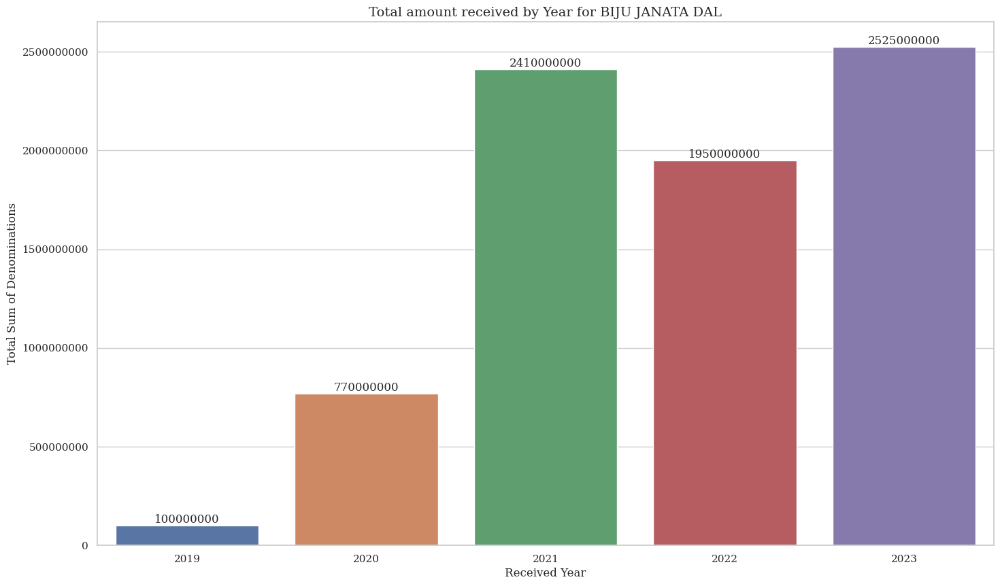

In [309]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'BIJU JANATA DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [310]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
30,BIJU JANATA DAL,2022,1000000,10000000,1950000000,240
29,BIJU JANATA DAL,2021,1000000,10000000,2410000000,250
31,BIJU JANATA DAL,2023,1000000,10000000,2525000000,284
27,BIJU JANATA DAL,2019,10000000,10000000,100000000,10
28,BIJU JANATA DAL,2020,10000000,10000000,770000000,77


## 'DRAVIDA MUNNETRA KAZHAGAM (DMK)'

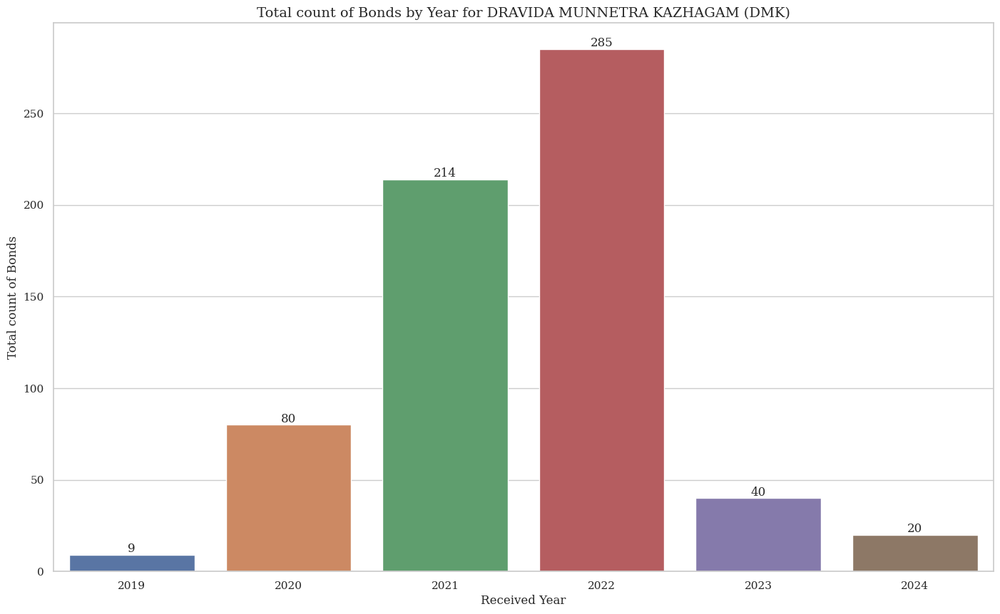

In [311]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'DRAVIDA MUNNETRA KAZHAGAM (DMK)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

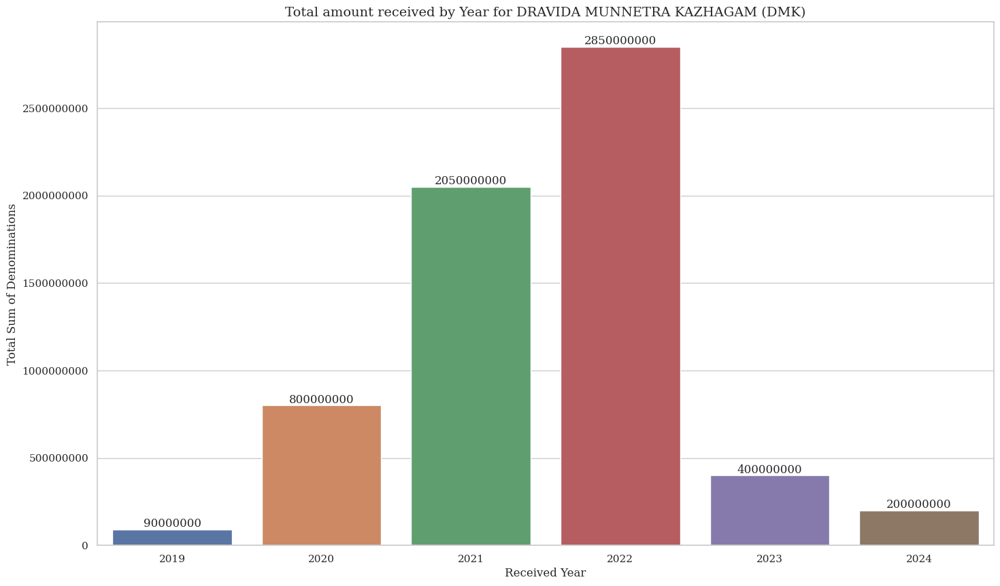

In [312]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'DRAVIDA MUNNETRA KAZHAGAM (DMK)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [313]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
32,DRAVIDA MUNNETRA KAZHAGAM (DMK),2019,10000000,10000000,90000000,9
33,DRAVIDA MUNNETRA KAZHAGAM (DMK),2020,10000000,10000000,800000000,80
34,DRAVIDA MUNNETRA KAZHAGAM (DMK),2021,1000000,10000000,2050000000,214
35,DRAVIDA MUNNETRA KAZHAGAM (DMK),2022,10000000,10000000,2850000000,285
36,DRAVIDA MUNNETRA KAZHAGAM (DMK),2023,10000000,10000000,400000000,40
37,DRAVIDA MUNNETRA KAZHAGAM (DMK),2024,10000000,10000000,200000000,20


## 'GOA FORWARD PARTY'

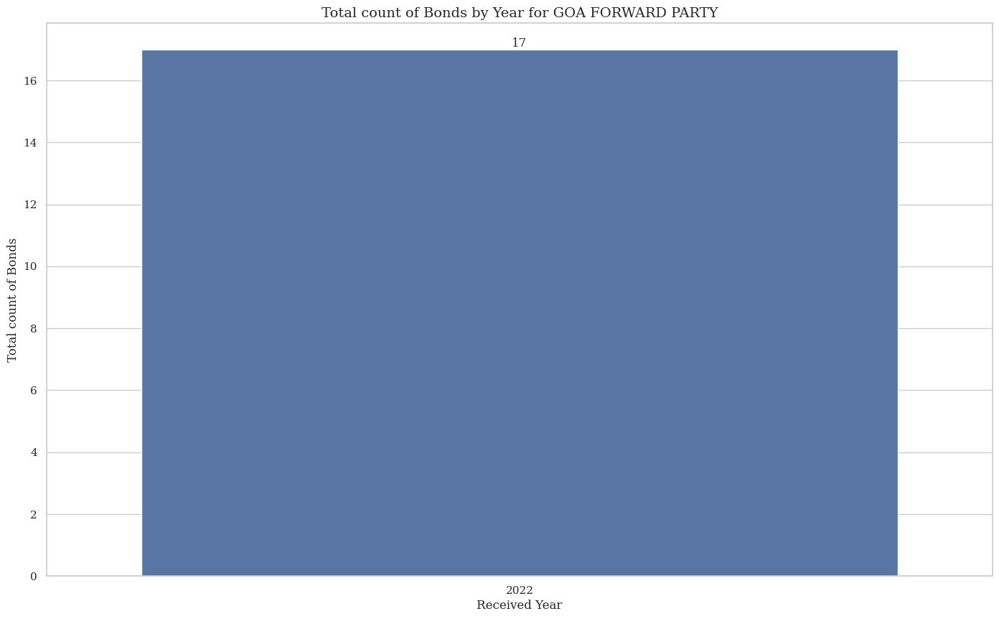

In [314]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'GOA FORWARD PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

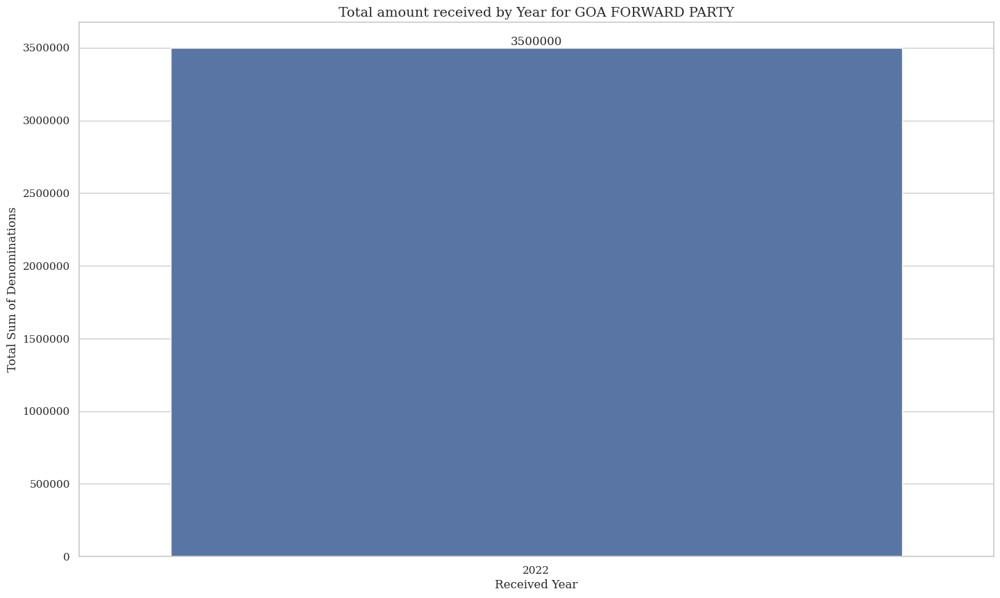

In [315]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'GOA FORWARD PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [316]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
38,GOA FORWARD PARTY,2022,100000,1000000,3500000,17


## 'JAMMU AND KASHMIR NATIONAL CONFERENCE'

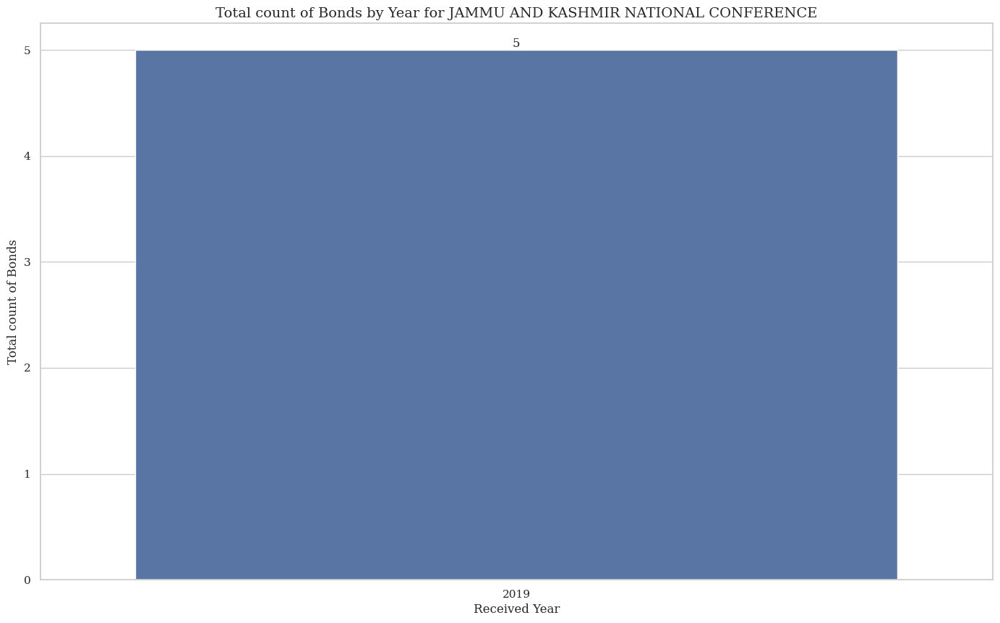

In [317]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JAMMU AND KASHMIR NATIONAL CONFERENCE'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

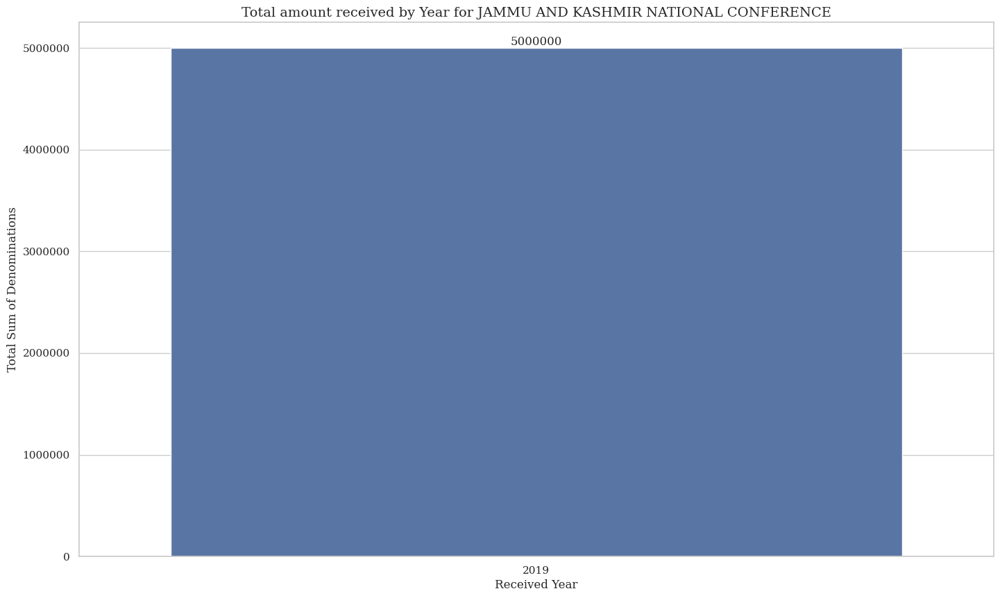

In [318]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JAMMU AND KASHMIR NATIONAL CONFERENCE'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [319]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
39,JAMMU AND KASHMIR NATIONAL CONFERENCE,2019,1000000,1000000,5000000,5


## 'JANASENA PARTY'

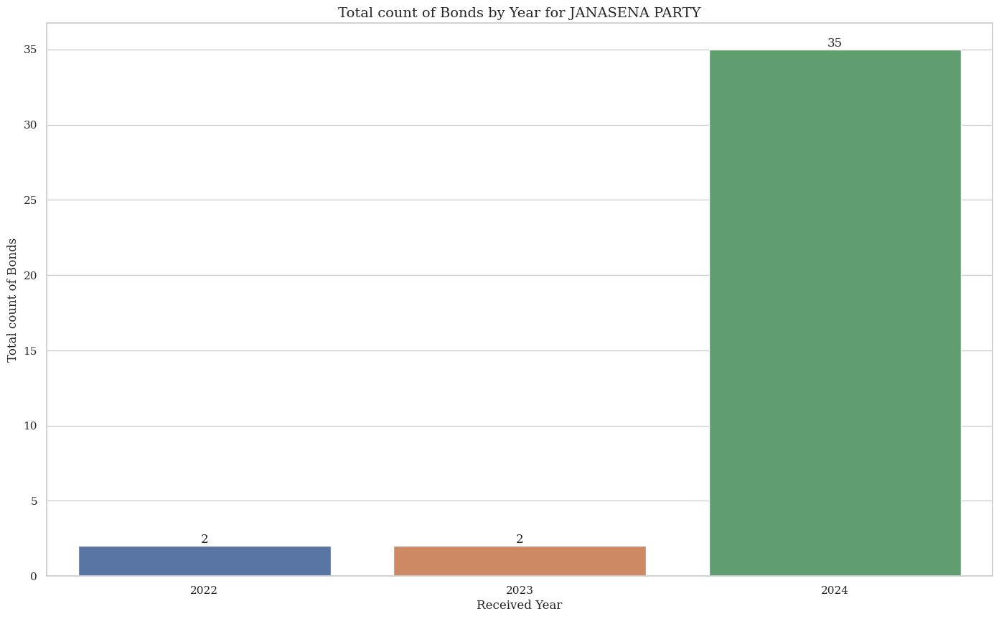

In [320]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JANASENA PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

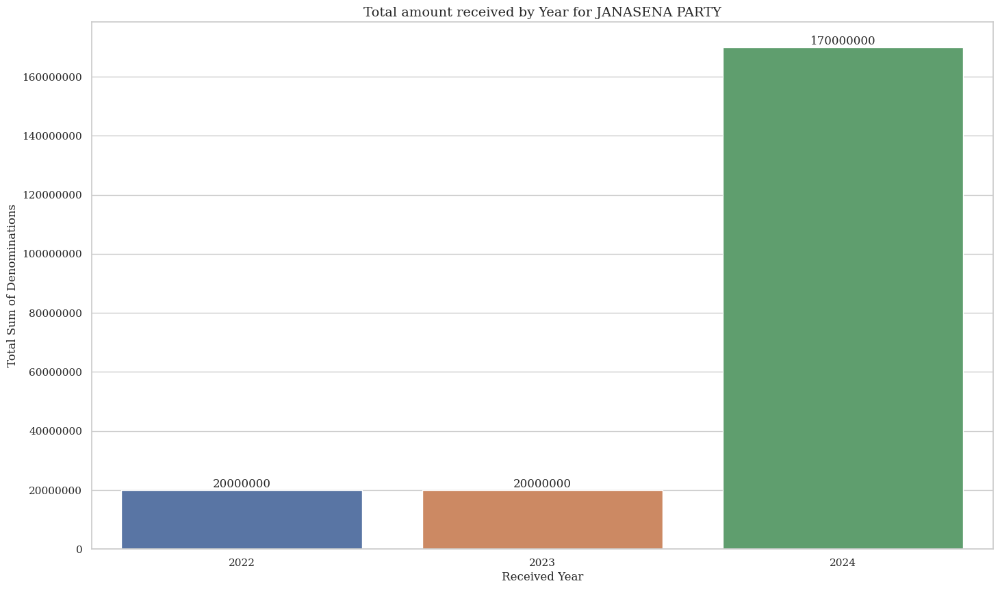

In [321]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JANASENA PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [322]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
42,JANASENA PARTY,2024,1000000,10000000,170000000,35
41,JANASENA PARTY,2023,10000000,10000000,20000000,2
40,JANASENA PARTY,2022,10000000,10000000,20000000,2


## 'JANATA DAL ( SECULAR )'

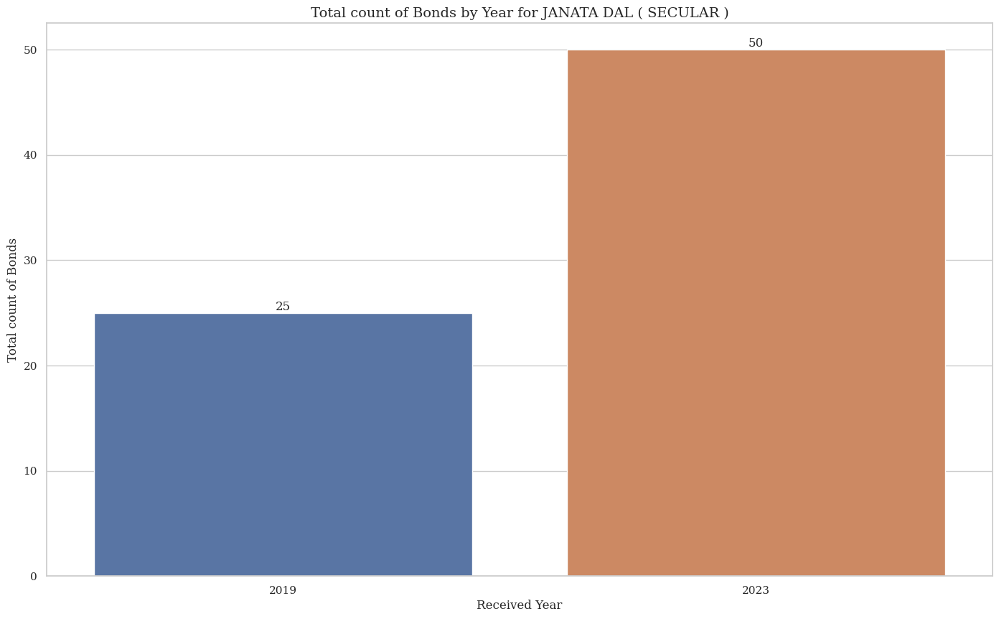

In [323]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JANATA DAL ( SECULAR )'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

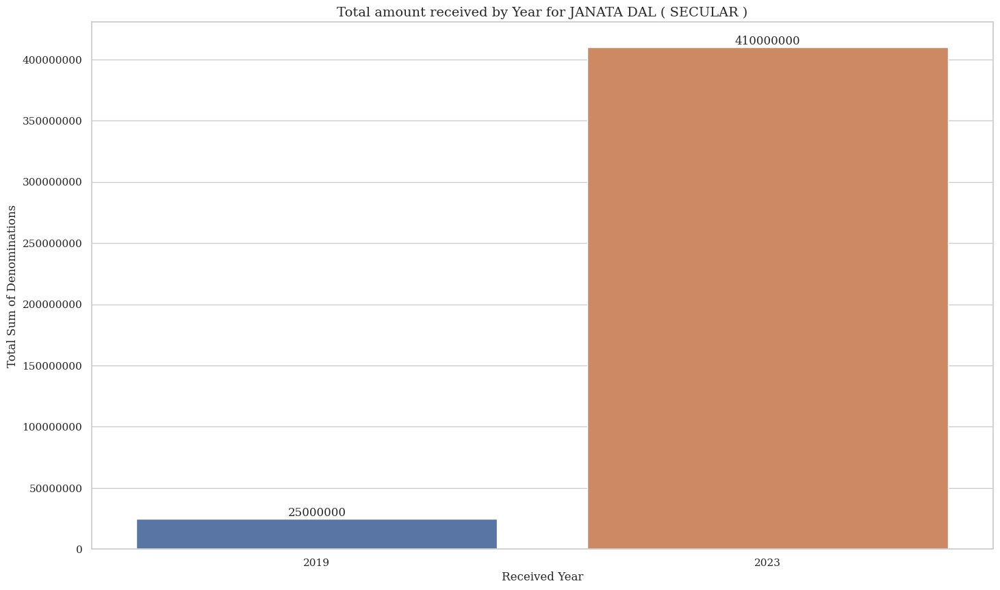

In [324]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JANATA DAL ( SECULAR )'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [325]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
43,JANATA DAL ( SECULAR ),2019,1000000,1000000,25000000,25
44,JANATA DAL ( SECULAR ),2023,1000000,10000000,410000000,50


## 'JHARKHAND MUKTI MORCHA'

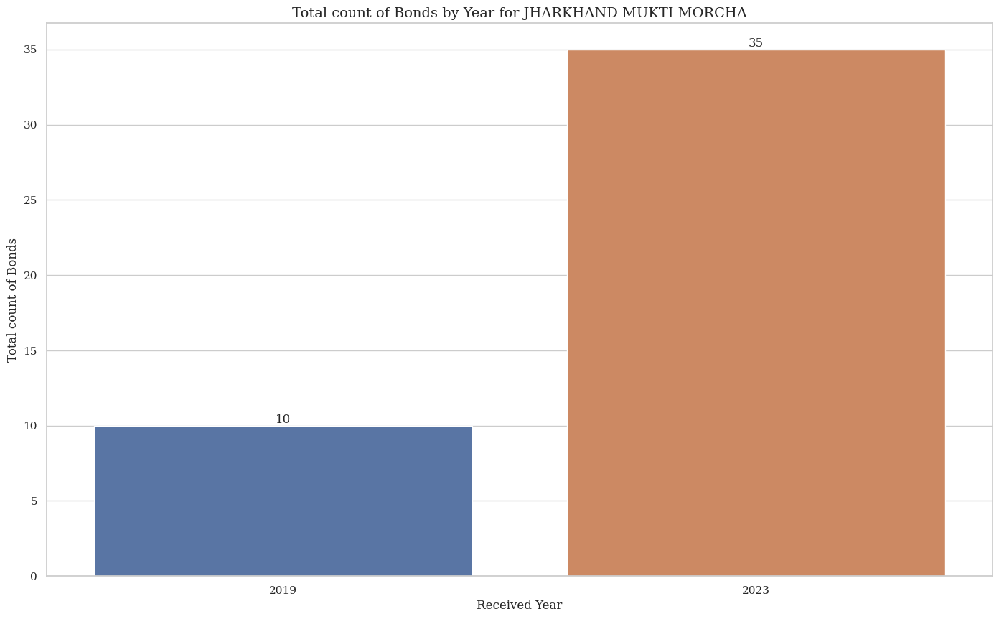

In [326]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JHARKHAND MUKTI MORCHA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

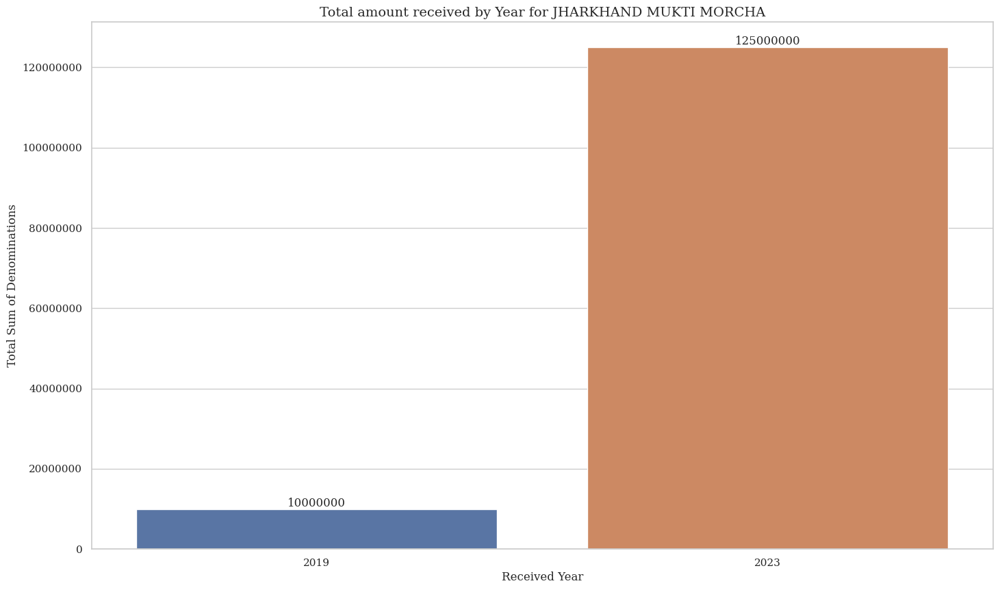

In [327]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'JHARKHAND MUKTI MORCHA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [328]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
45,JHARKHAND MUKTI MORCHA,2019,1000000,1000000,10000000,10
46,JHARKHAND MUKTI MORCHA,2023,100000,10000000,125000000,35


## 'MAHARASHTRAWADI GOMNTAK PARTY'

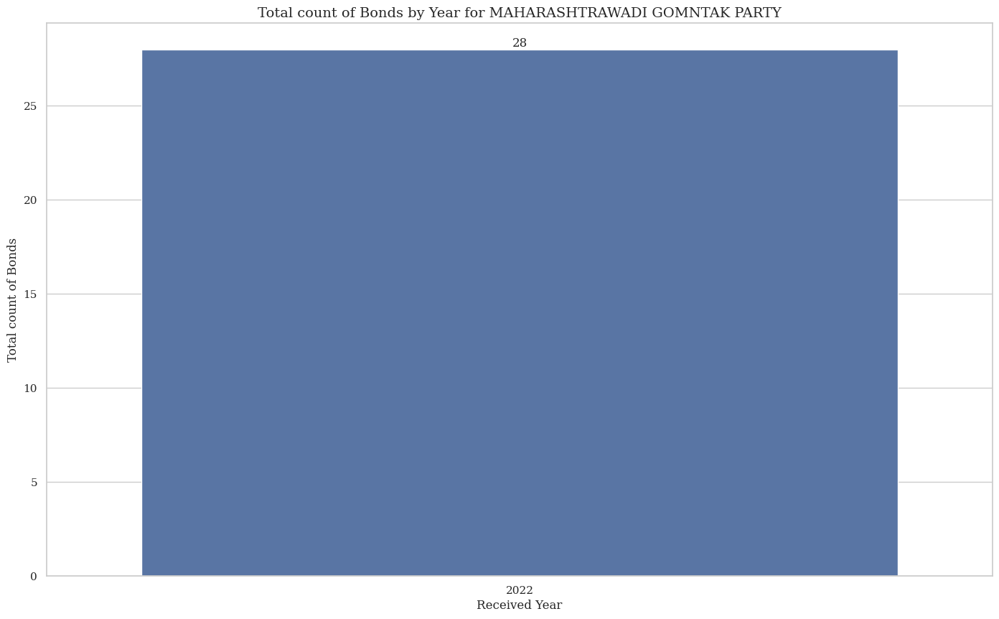

In [329]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'MAHARASHTRAWADI GOMNTAK PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

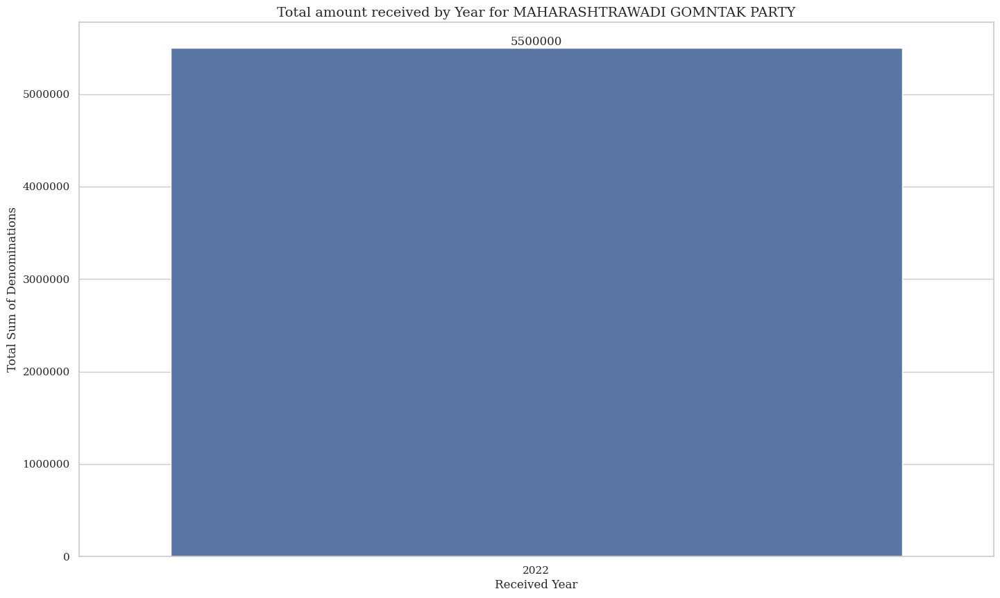

In [330]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'MAHARASHTRAWADI GOMNTAK PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [331]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
47,MAHARASHTRAWADI GOMNTAK PARTY,2022,100000,1000000,5500000,28


## 'NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH'

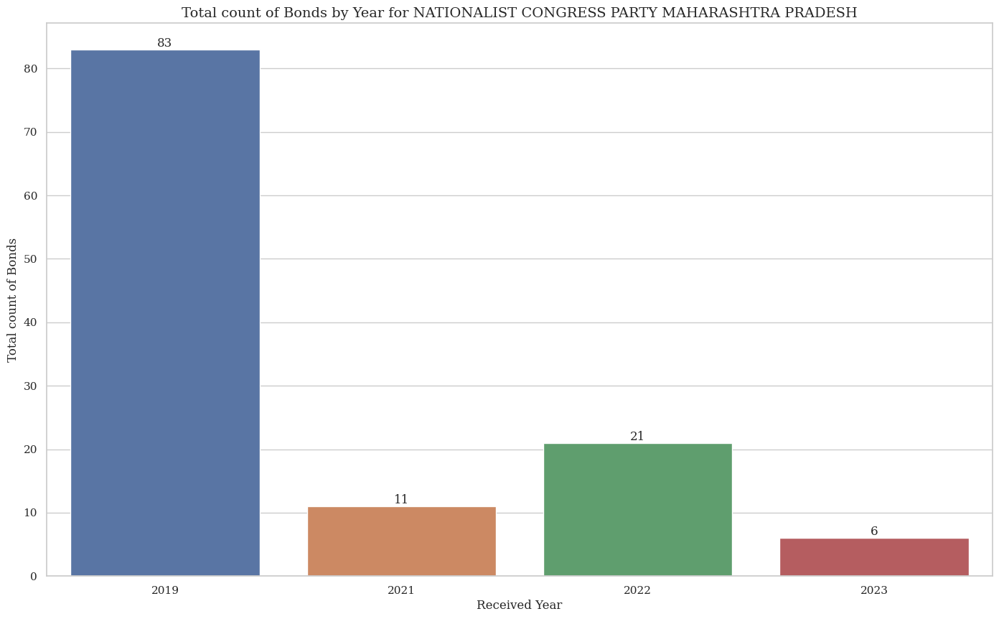

In [332]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

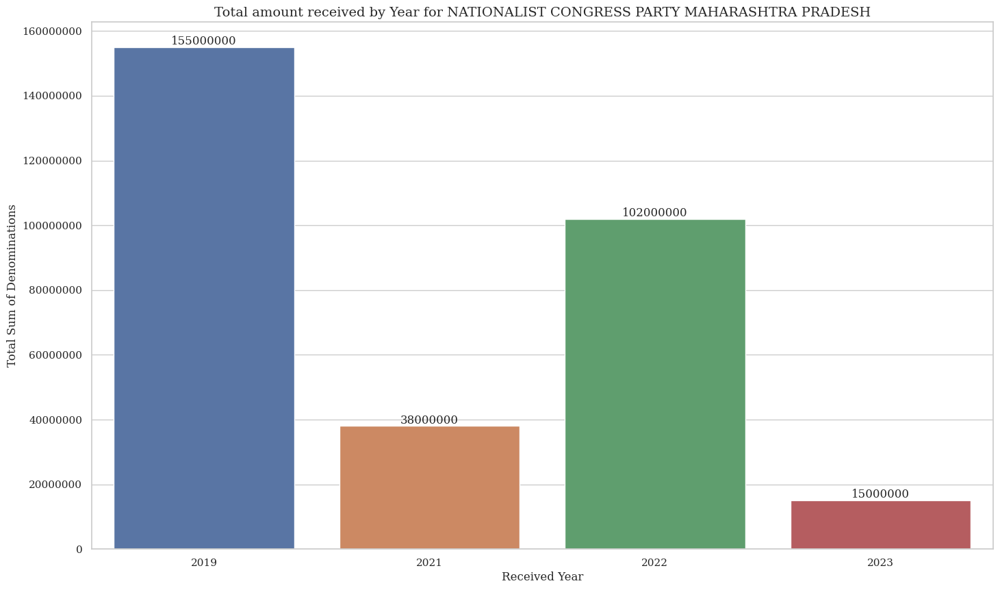

In [333]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [334]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
48,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,2019,100000,10000000,155000000,83
49,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,2021,1000000,10000000,38000000,11
50,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,2022,100000,10000000,102000000,21
51,NATIONALIST CONGRESS PARTY MAHARASHTRA PRADESH,2023,1000000,10000000,15000000,6


## 'PRESIDENT, ALL INDIA CONGRESS COMMITTEE'

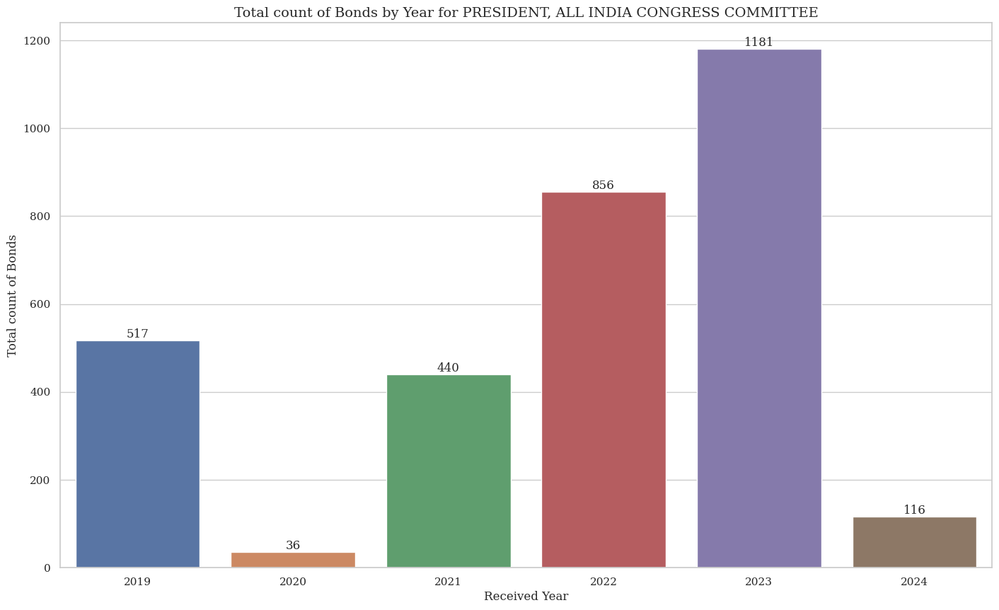

In [335]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'PRESIDENT, ALL INDIA CONGRESS COMMITTEE'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

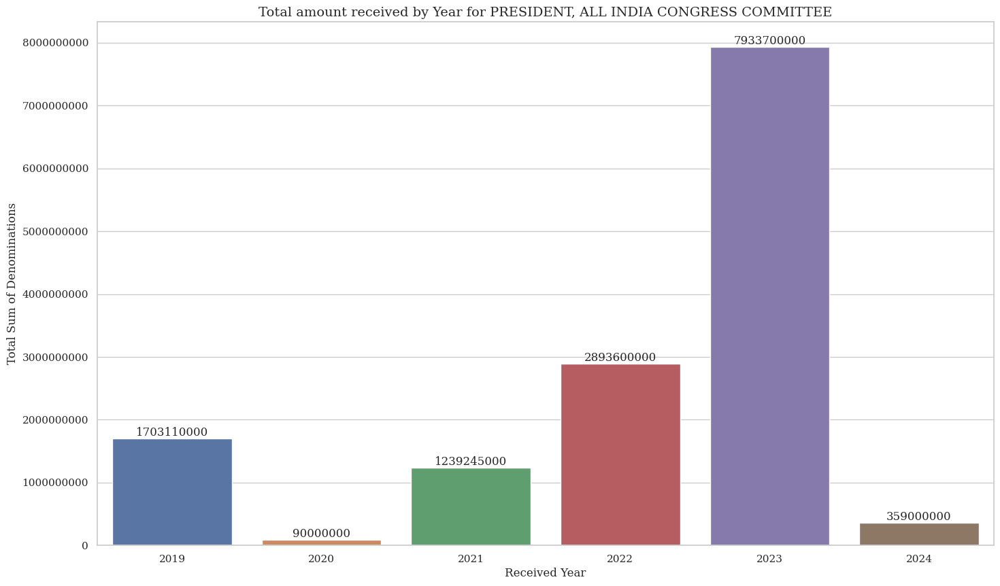

In [336]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'PRESIDENT, ALL INDIA CONGRESS COMMITTEE'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [337]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
57,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2024,100000,10000000,359000000,116
56,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2023,10000,10000000,7933700000,1181
55,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2022,10000,10000000,2893600000,856
52,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2019,10000,10000000,1703110000,517
53,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2020,100000,10000000,90000000,36
54,"PRESIDENT, ALL INDIA CONGRESS COMMITTEE",2021,1000,10000000,1239245000,440


## 'RASHTRIYA JANTA DAL'

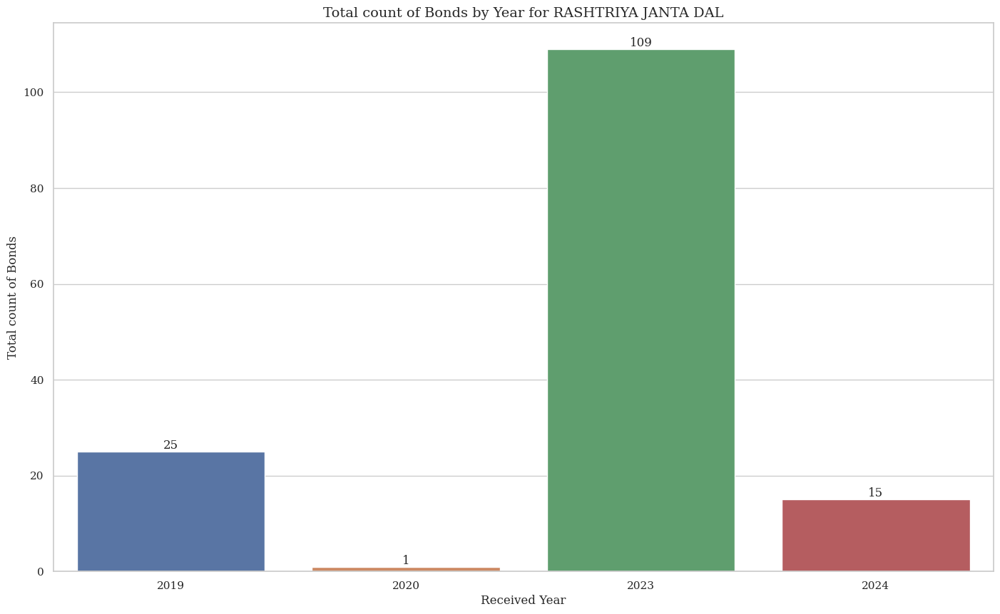

In [338]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'RASHTRIYA JANTA DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

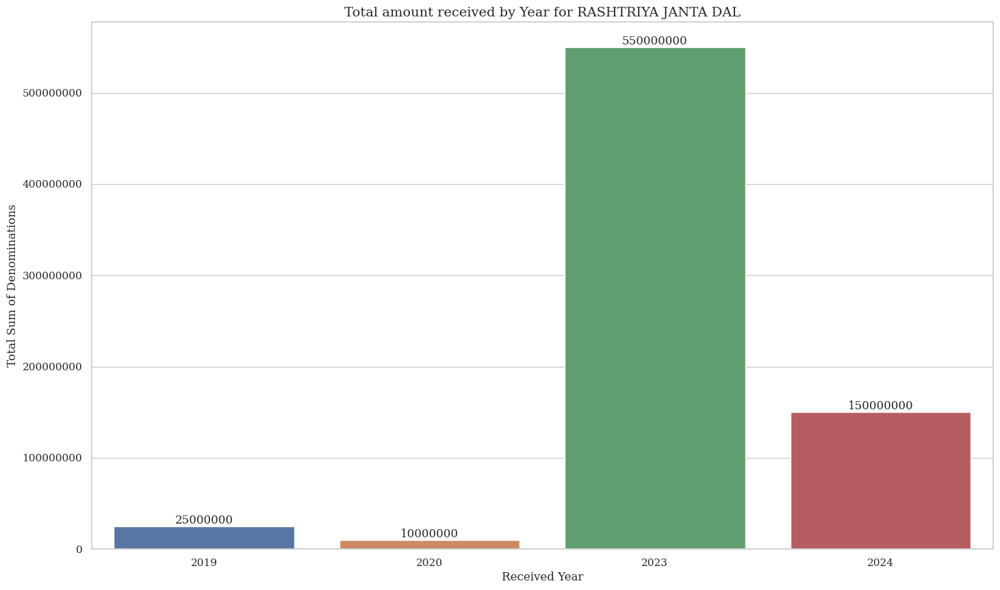

In [339]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'RASHTRIYA JANTA DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [340]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
61,RASHTRIYA JANTA DAL,2024,10000000,10000000,150000000,15
58,RASHTRIYA JANTA DAL,2019,1000000,1000000,25000000,25
59,RASHTRIYA JANTA DAL,2020,10000000,10000000,10000000,1
60,RASHTRIYA JANTA DAL,2023,100000,10000000,550000000,109


## 'SHIROMANI AKALI DAL'

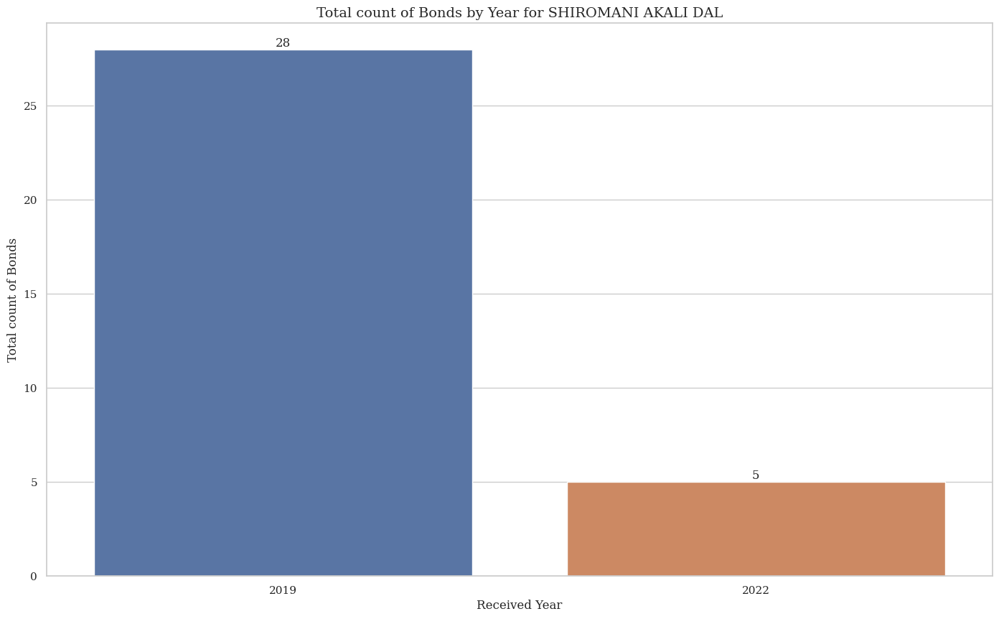

In [341]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SHIROMANI AKALI DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

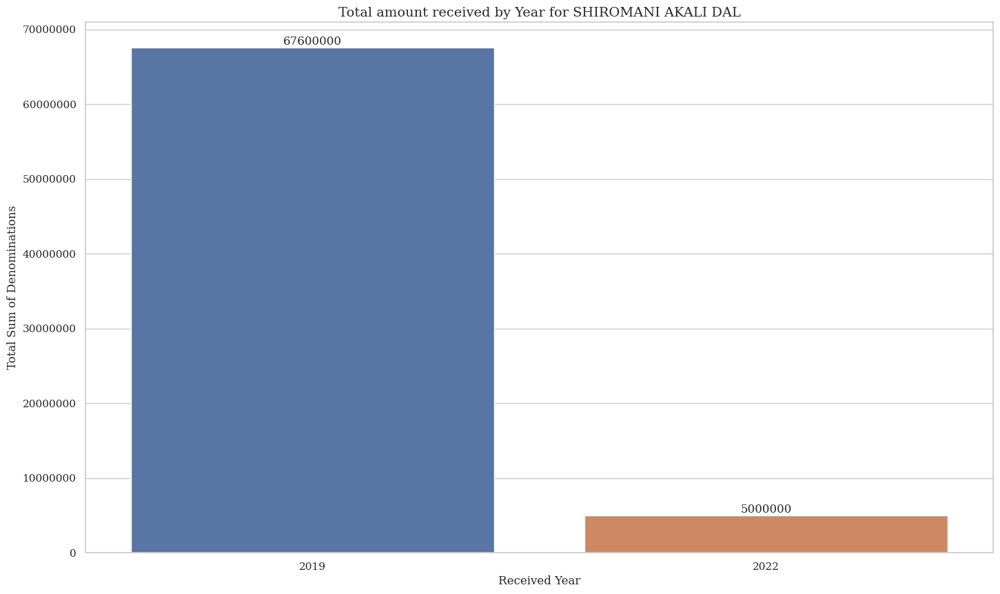

In [342]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SHIROMANI AKALI DAL'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [343]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
63,SHIROMANI AKALI DAL,2022,1000000,1000000,5000000,5
62,SHIROMANI AKALI DAL,2019,10000,10000000,67600000,28


## 'SHIVSENA'

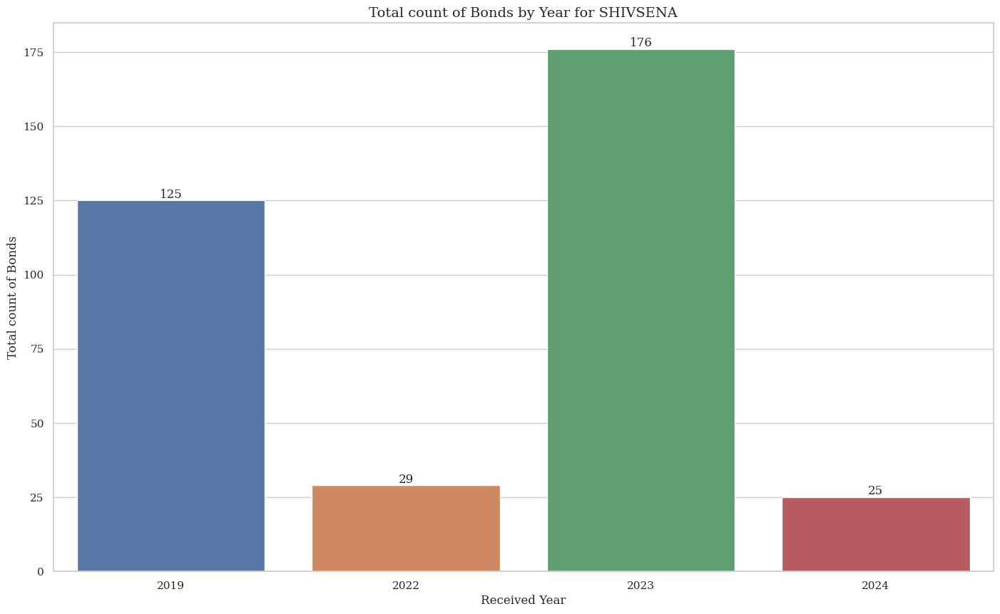

In [344]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SHIVSENA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

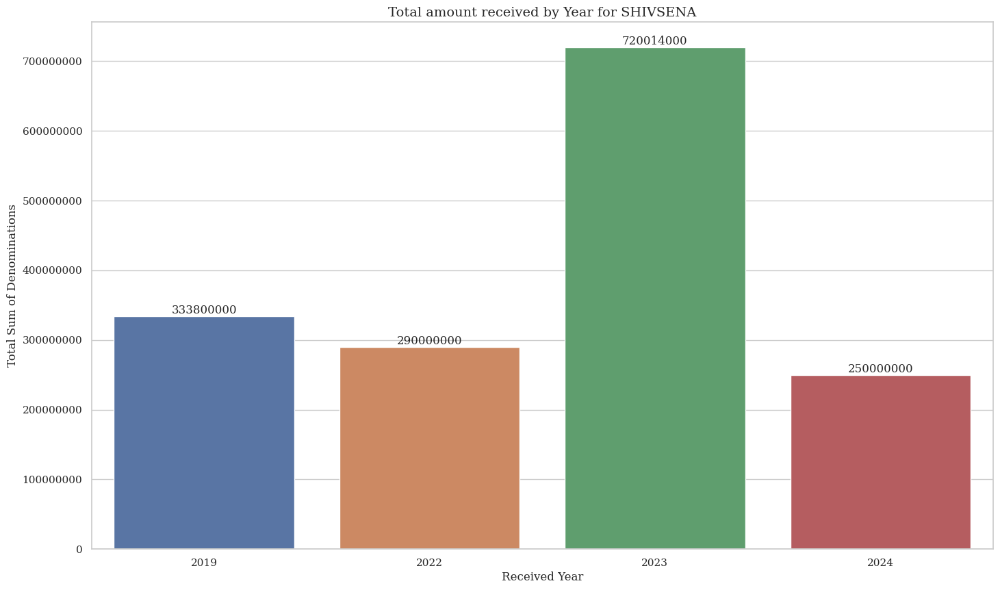

In [345]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SHIVSENA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [346]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
64,SHIVSENA,2019,100000,10000000,333800000,125
65,SHIVSENA,2022,10000000,10000000,290000000,29
66,SHIVSENA,2023,1000,10000000,720014000,176
67,SHIVSENA,2024,10000000,10000000,250000000,25


## 'SIKKIM DEMOCRATIC FRONT'

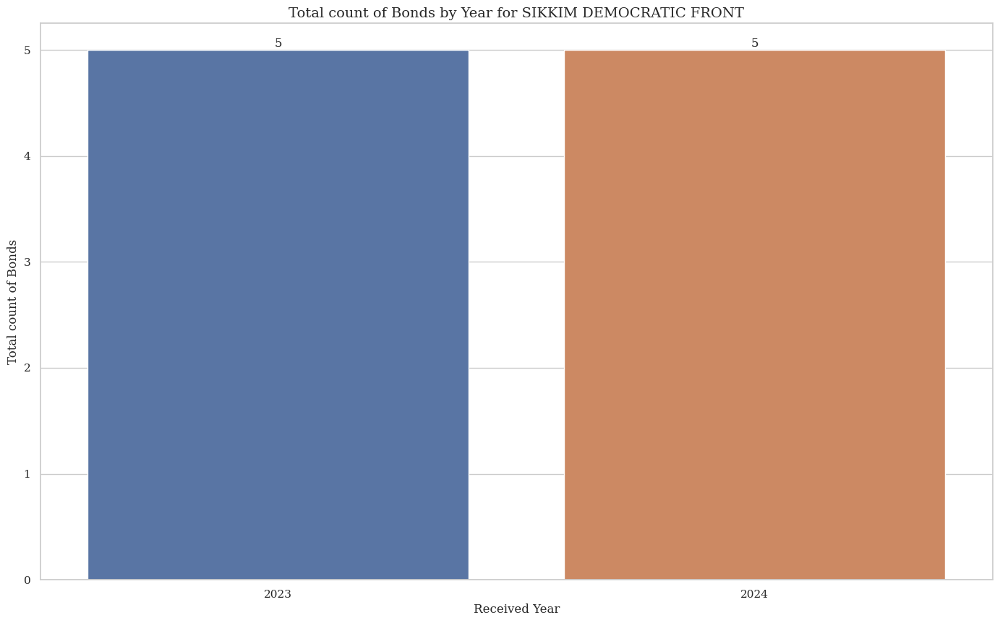

In [347]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SIKKIM DEMOCRATIC FRONT'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

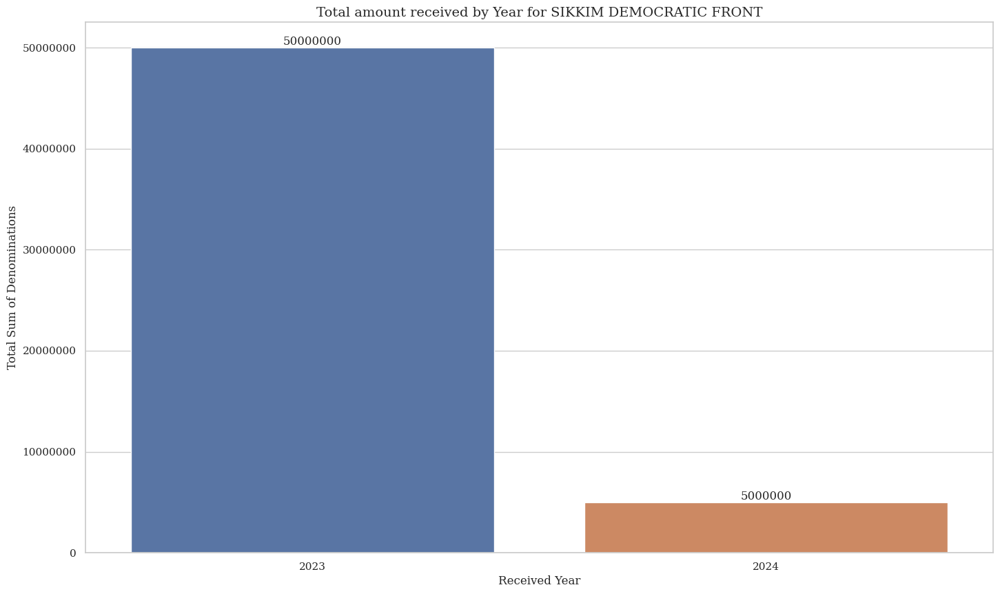

In [348]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SIKKIM DEMOCRATIC FRONT'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [349]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
68,SIKKIM DEMOCRATIC FRONT,2023,10000000,10000000,50000000,5
69,SIKKIM DEMOCRATIC FRONT,2024,1000000,1000000,5000000,5


## 'SIKKIM KRANTIKARI MORCHA'

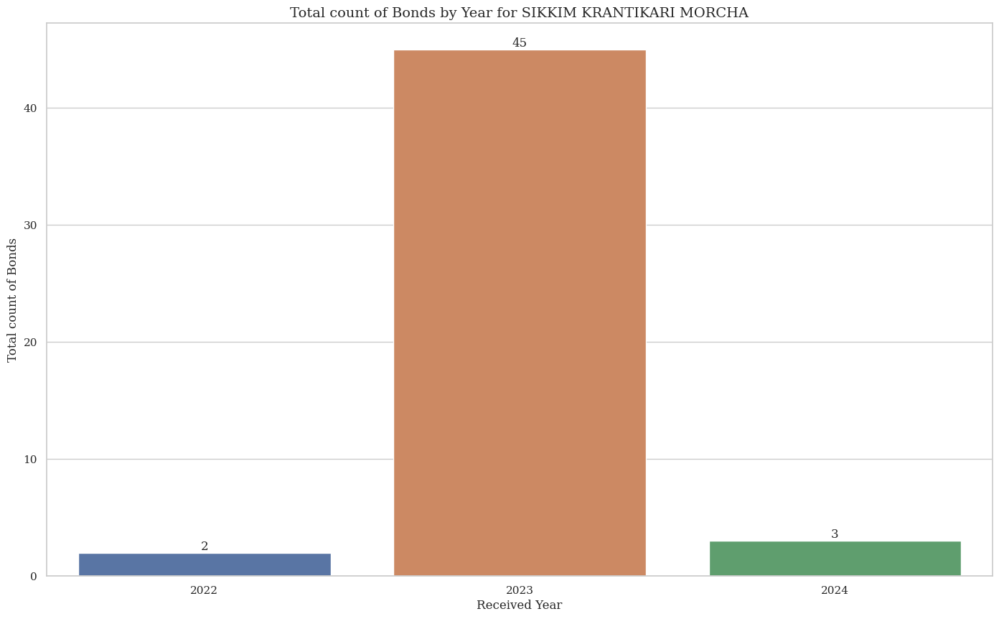

In [350]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SIKKIM KRANTIKARI MORCHA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

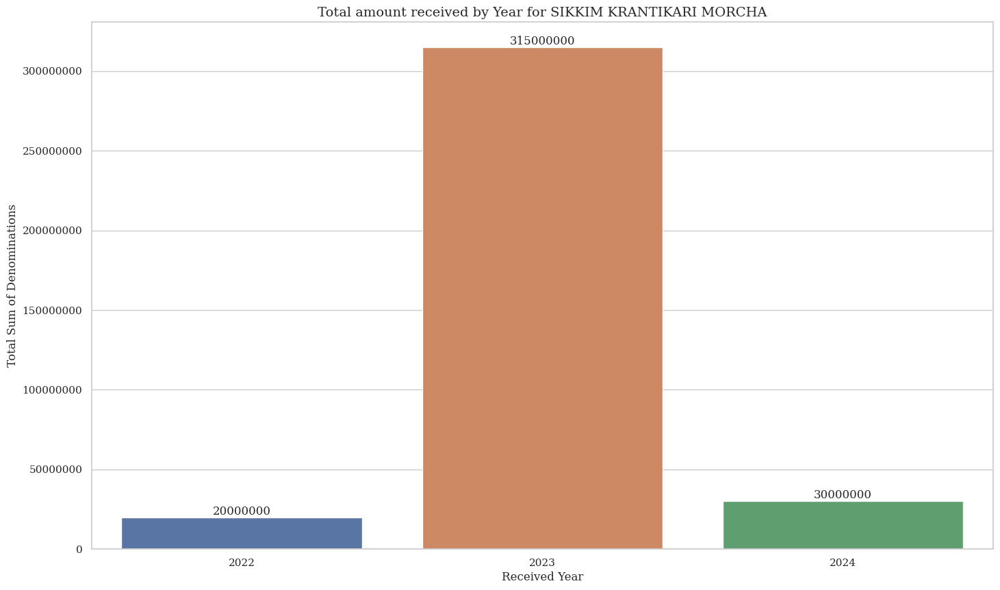

In [351]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'SIKKIM KRANTIKARI MORCHA'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [352]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
70,SIKKIM KRANTIKARI MORCHA,2022,10000000,10000000,20000000,2
71,SIKKIM KRANTIKARI MORCHA,2023,1000000,10000000,315000000,45
72,SIKKIM KRANTIKARI MORCHA,2024,10000000,10000000,30000000,3


## 'TELUGU DESAM PARTY'

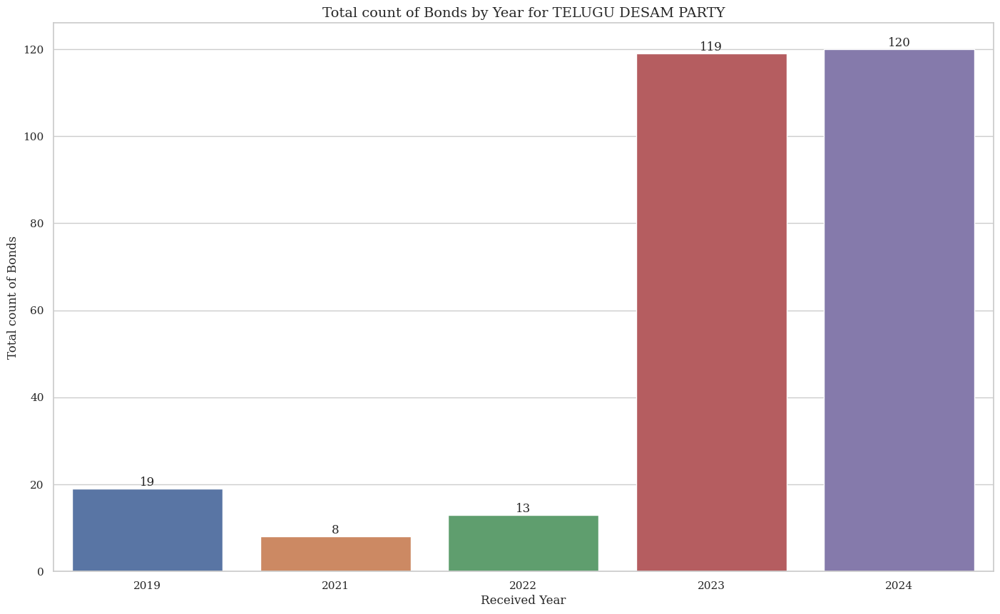

In [353]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'TELUGU DESAM PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

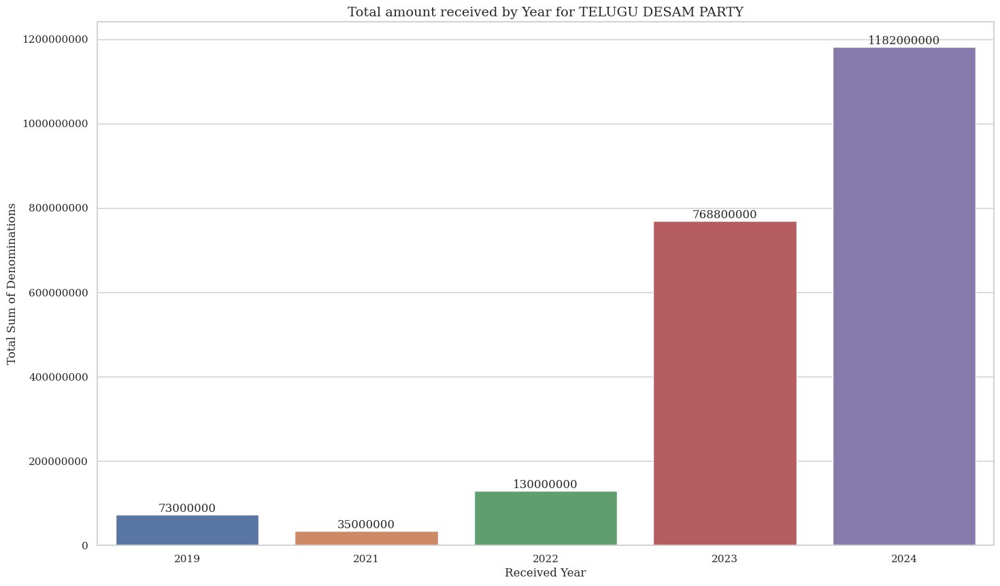

In [354]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'TELUGU DESAM PARTY'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [355]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
77,TELUGU DESAM PARTY,2024,1000000,10000000,1182000000,120
76,TELUGU DESAM PARTY,2023,100000,10000000,768800000,119
73,TELUGU DESAM PARTY,2019,1000000,10000000,73000000,19
74,TELUGU DESAM PARTY,2021,1000000,10000000,35000000,8
75,TELUGU DESAM PARTY,2022,10000000,10000000,130000000,13


## 'YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CONGRESS PARTY)'

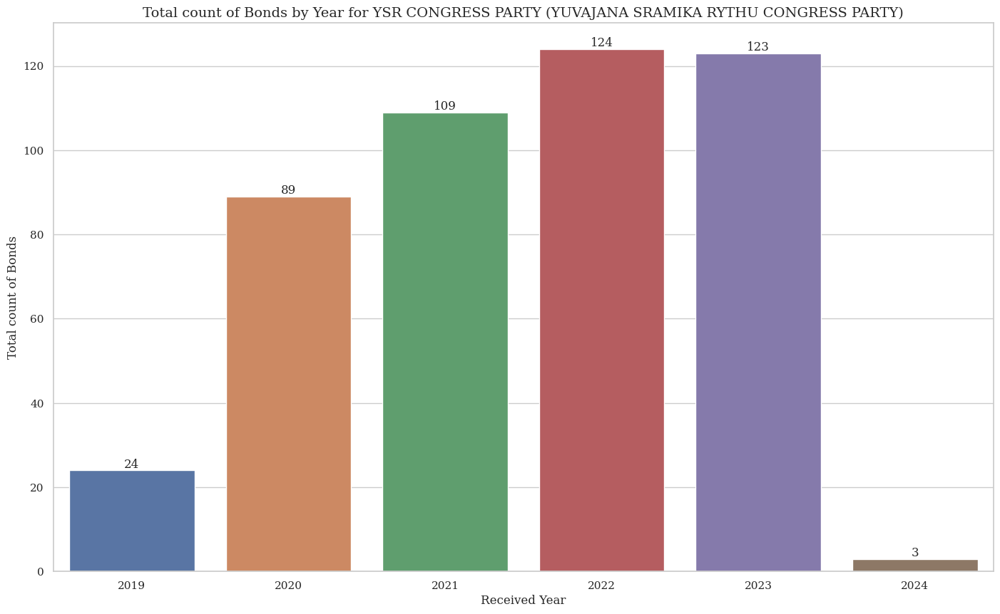

In [356]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CONGRESS PARTY)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='count_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total count of Bonds', fontsize=12)
plt.title(f'Total count of Bonds by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

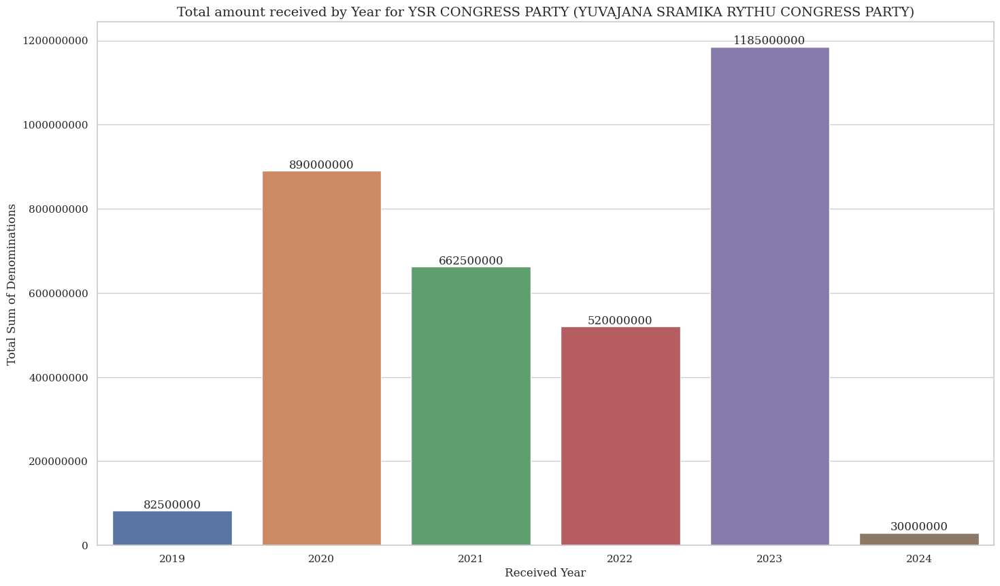

In [357]:
# Filter DataFrame for PartyName 'AAM AADMI PARTY'
party_name =  'YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CONGRESS PARTY)'

filtered_df = political_funds[political_funds['PartyName'] == party_name]

# Create the horizontal count plot for the top 20 purchasers
plt.figure(figsize=(17, 10))  # Set the figure size (height, width) in inches for a horizontal plot
ax = sns.barplot(data=filtered_df, x='ReceivedYear', y='sum_Denominations')  # Use y='Purchaser' for horizontal plot
ax.bar_label(ax.containers[0],labels=[f'{x.get_height():.0f}' for x in ax.containers[0]]) 
plt.xlabel('Received Year', fontsize=12)
plt.ylabel('Total Sum of Denominations', fontsize=12)
plt.title(f'Total amount received by Year for {party_name}', fontsize=14)
# Rotate y-axis labels by -45 degrees for better readability
plt.yticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
# Show the plot
plt.show()

In [358]:
filtered_df

,PartyName,ReceivedYear,min_Denominations,max_Denominations,sum_Denominations,count_Denominations
82,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2023,1000000,10000000,1185000000,123
78,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2019,100000,10000000,82500000,24
79,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2020,10000000,10000000,890000000,89
80,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2021,100000,10000000,662500000,109
81,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2022,100000,10000000,520000000,124
83,YSR CONGRESS PARTY (YUVAJANA SRAMIKA RYTHU CON...,2024,10000000,10000000,30000000,3


# Sankey 

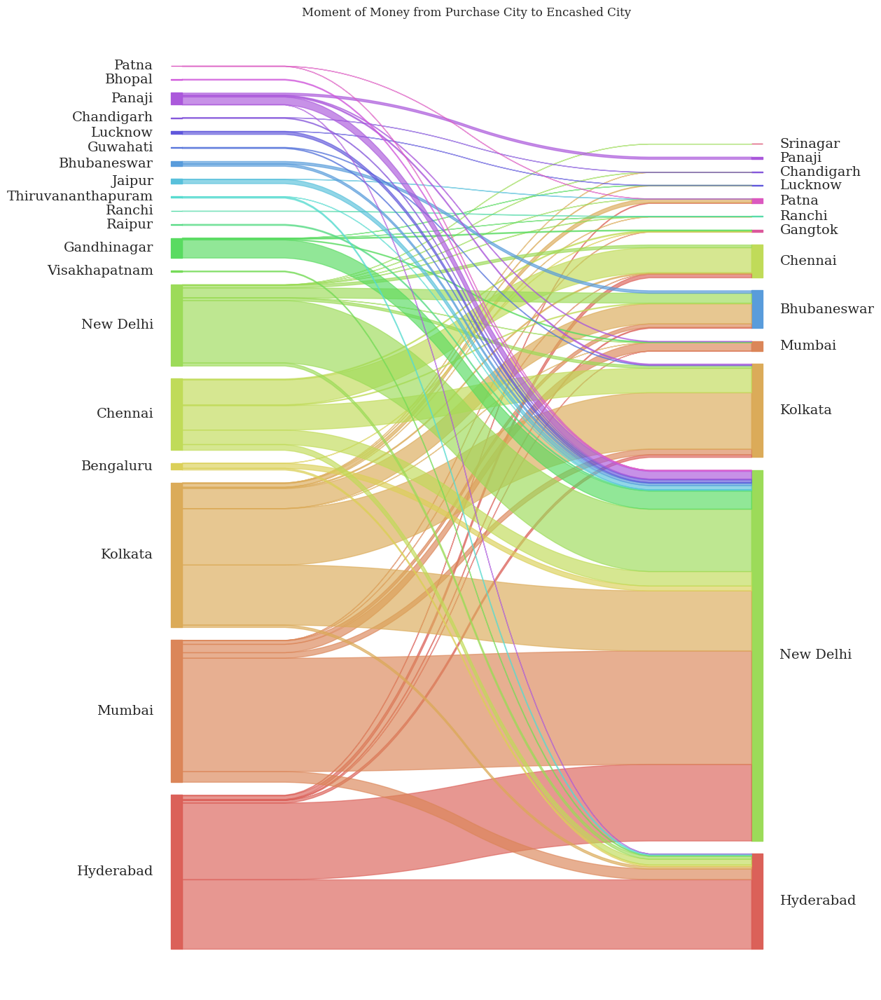

In [359]:
# Sankey chart from matplotlib
sankey(
    left        = perfect_data['IssueBranchCity'],
    right       = perfect_data['EncashedCity'],
    leftWeight  = perfect_data['Denomination'],
    rightWeight = perfect_data['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title('Moment of Money from Purchase City to Encashed City') 
plt.show() 

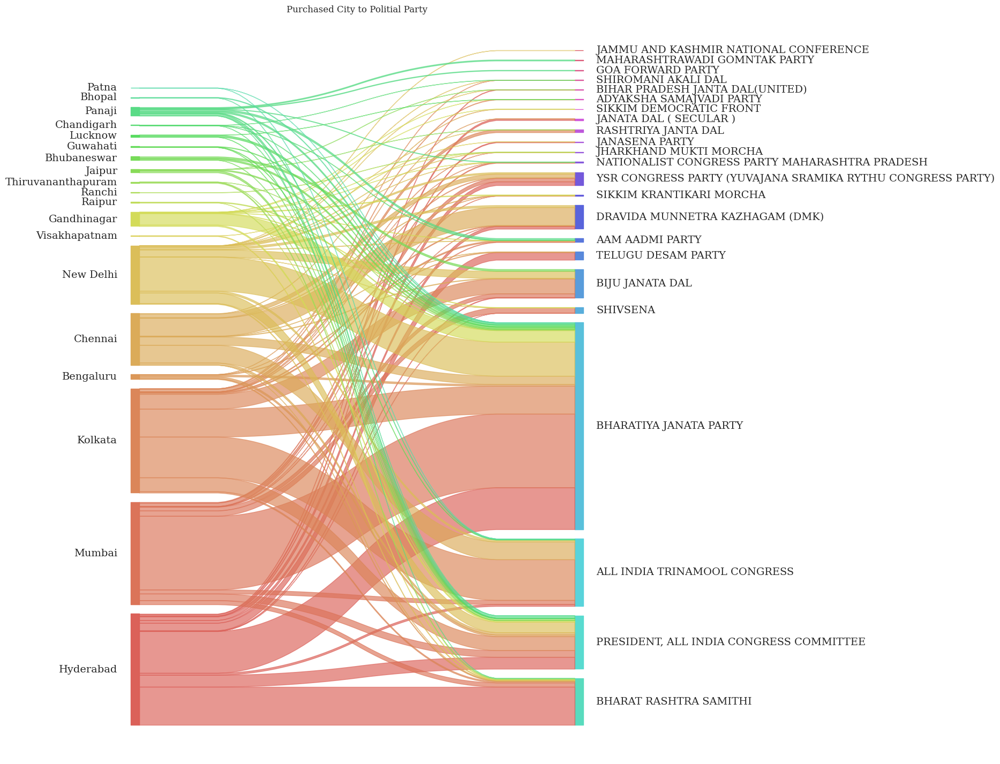

In [360]:
# Sankey chart from matplotlib
sankey(
    left        = perfect_data['IssueBranchCity'],
    right       = perfect_data['PartyName'],
    leftWeight  = perfect_data['Denomination'],
    rightWeight = perfect_data['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title('Purchased City to Politial Party') 
plt.show()

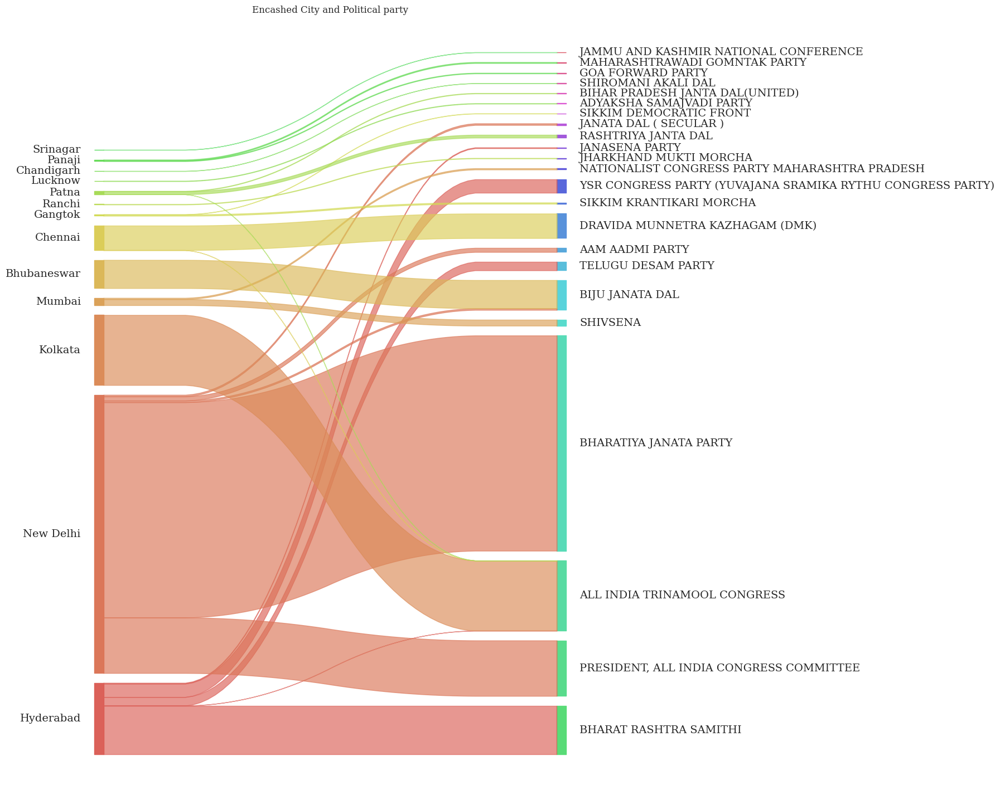

In [361]:
# Sankey chart from matplotlib
sankey(
    left        = perfect_data['EncashedCity'],
    right       = perfect_data['PartyName'],
    leftWeight  = perfect_data['Denomination'],
    rightWeight = perfect_data['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title('Encashed City and Political party') 
plt.show()

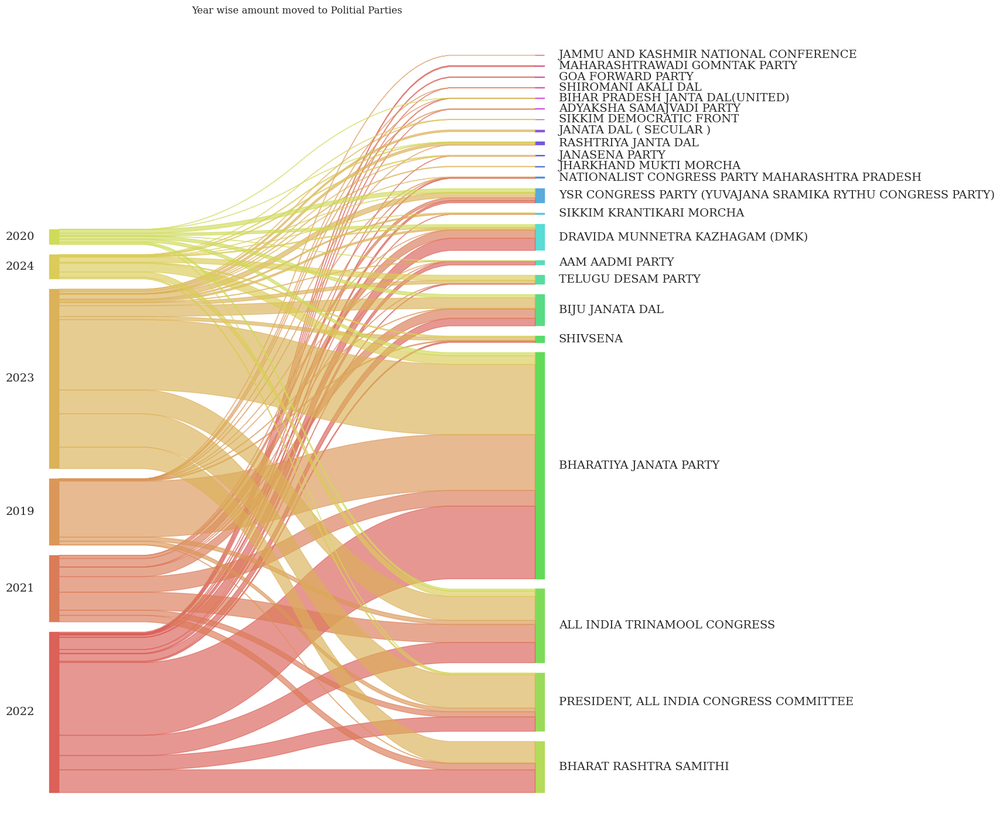

In [362]:
# Sankey chart from matplotlib
sankey(
    left        = perfect_data['PurchaseDate'].dt.year,
    right       = perfect_data['PartyName'],
    leftWeight  = perfect_data['Denomination'],
    rightWeight = perfect_data['Denomination']
)
plt.gcf().set_size_inches((12,18))
plt.title('Year wise amount moved to Politial Parties') 
plt.show()